<h2>About this Project</h2>

In this project, you will implement the CART (Classification and Regression Tree) algorithm. You will work with the <a href="https://archive.ics.uci.edu/ml/datasets/Ionosphere">Ionosphere Data Set from the UCI Machine Learning Repository</a>, which consists of radar data from a system designed to target free electrons in the ionosphere, and a artificial "spiral" dataset. The first dataset will be used to determine if a radar return was "good" (i.e. a signal was returned) or "bad" (i.e. the signal passed straight through the ionosphere).

**You will be using a regression tree with squared loss impurity to do classification. This is possible here because all classification problems can be framed as regression problems. You could also have used a classification tree with Gini impurity equivalently.**

<h3>Evaluation</h3>

<p><strong>This project must be successfully completed and submitted in order to receive credit for this course. Your score on this project will be included in your final grade calculation.</strong><p>
    
<p>You are expected to write code where you see <em># YOUR CODE HERE</em> within the cells of this notebook. Not all cells will be graded; code input cells followed by cells marked with <em>#Autograder test cell</em> will be graded. Upon submitting your work, the code you write at these designated positions will be assessed using an "autograder" that will run all test cells to assess your code. You will receive feedback from the autograder that will identify any errors in your code. Use this feedback to improve your code if you need to resubmit. Be sure not to change the names of any provided functions, classes, or variables within the existing code cells, as this will interfere with the autograder. Also, remember to execute all code cells sequentially, not just those you’ve edited, to ensure your code runs properly.</p>
    
<p>You can resubmit your work as many times as necessary before the submission deadline. If you experience difficulty or have questions about this exercise, use the Q&A discussion board to engage with your peers or seek assistance from the instructor.<p>

<p>Before starting your work, please review <a href="https://s3.amazonaws.com/ecornell/global/eCornellPlagiarismPolicy.pdf">eCornell's policy regarding plagiarism</a> (the presentation of someone else's work as your own without source credit).</p>

<h3>Submit Code for Autograder Feedback</h3>

<p>Once you have completed your work on this notebook, you will submit your code for autograder review. Follow these steps:</p>

<ol>
  <li><strong>Save your notebook.</strong></li>
  <li><strong>Mark as Completed —</strong> In the blue menu bar along the top of this code exercise window, you’ll see a menu item called <strong>Education</strong>. In the <strong>Education</strong> menu, click <strong>Mark as Completed</strong> to submit your code for autograder/instructor review. This process will take a moment and a progress bar will show you the status of your submission.</li>
	<li><strong>Review your results —</strong> Once your work is marked as complete, the results of the autograder will automatically be presented in a new tab within the code exercise window. You can click on the assessment name in this feedback window to see more details regarding specific feedback/errors in your code submission.</li>
  <li><strong>Repeat, if necessary —</strong> The Jupyter notebook will always remain accessible in the first tabbed window of the exercise. To reattempt the work, you will first need to click <strong>Mark as Uncompleted</strong> in the <strong>Education</strong> menu and then proceed to make edits to the notebook. Once you are ready to resubmit, follow steps one through three. You can repeat this procedure as many times as necessary.</li>
</ol>

<p>You can also download a copy of this notebook in multiple formats using the <strong>Download as</strong> option in the <strong>File</strong> menu above.</p>

<h2>Implementing Regression Trees</h2>

### Getting Started

Before you get started, let's import a few packages that you will need. In addition, you will load two binary classification dataset - the spiral dataset and the <a href="https://archive.ics.uci.edu/ml/datasets/Ionosphere">ION</a> dataset. 

In [1]:
import numpy as np
import pandas as pd
from pylab import *
from numpy.matlib import repmat
import matplotlib 
import matplotlib.pyplot as plt
from scipy.io import loadmat
import time
import sys

%matplotlib inline

sys.path.append('/home/codio/workspace/.guides/hf')
from helper import *

print('You\'re running python %s' % sys.version.split(' ')[0])

You're running python 3.6.8


The code below generates spiral data using the trigonometric functions sine and cosine, then splits the data into train and test segments.

In [2]:
def spiraldata(N=300):
    r = np.linspace(1,2*np.pi,N) # generate a vector of "radius" values
    xTr1 = np.array([np.sin(2.*r)*r, np.cos(2*r)*r]).T # generate a curve that draws circles with increasing radius
    xTr2 = np.array([np.sin(2.*r+np.pi)*r, np.cos(2*r+np.pi)*r]).T
    xTr = np.concatenate([xTr1, xTr2], axis=0)
    yTr = np.concatenate([np.ones(N), -1 * np.ones(N)])
    xTr = xTr + np.random.randn(xTr.shape[0], xTr.shape[1])*0.2
    
    # Now sample alternating values to generate the test and train sets.
    xTe = xTr[::2,:]
    yTe = yTr[::2]
    xTr = xTr[1::2,:]
    yTr = yTr[1::2]
    
    return xTr, yTr, xTe, yTe

xTrSpiral, yTrSpiral, xTeSpiral, yTeSpiral = spiraldata(150)
print(f'Number of training points in spiral dataset: {xTrSpiral.shape[0]}')
print(f'Number of testing points in spiral dataset: {xTeSpiral.shape[0]}')
print(f'Number of features in spiral dataset: {xTrSpiral.shape[1]}')

Number of training points in spiral dataset: 150
Number of testing points in spiral dataset: 150
Number of features in spiral dataset: 2


Each data point $[\mathbf{x}]_i$ in the spiral data has 2 dimensions and the label $y_i$ is either $-1$ or $+1$. We can plot `xTrSpiral` to see the points, colored by the label they are associated with.

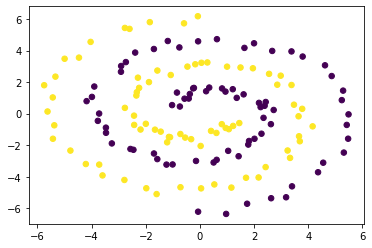

In [3]:
plt.scatter(xTrSpiral[:, 0], xTrSpiral[:, 1], s=30, c=yTrSpiral)

The following code loads the ION dataset.

In [4]:
# Load in some binary test data (labels are -1, +1)
data = loadmat("ion.mat")

# Load the training data
xTrIon  = data['xTr'].T
yTrIon  = data['yTr'].flatten()

# Load the test data
xTeIon  = data['xTe'].T
yTeIon  = data['yTe'].flatten()

print(f'Number of training points in ION dataset: {xTrIon.shape[0]}')
print(f'Number of testing points in ION dataset: {xTeIon.shape[0]}')
print(f'Number of features in ION dataset: {xTrIon.shape[1]}')
print('Training set: (n x d matrix)')
TrIon_for_display = np.concatenate([yTrIon[:, None], xTrIon], axis=1)
TrIon_for_display = TrIon_for_display[TrIon_for_display[:, 0].argsort()]

display(pd.DataFrame(data=TrIon_for_display,
                     columns=['$y$'] + [f'$[\mathbf{{x}}]_{ {i+1} }$' for i in range(xTrIon.shape[1])]).round(2))

Number of training points in ION dataset: 281
Number of testing points in ION dataset: 70
Number of features in ION dataset: 34
Training set: (n x d matrix)


,$y$,$[\mathbf{x}]_{1}$,$[\mathbf{x}]_{2}$,$[\mathbf{x}]_{3}$,$[\mathbf{x}]_{4}$,$[\mathbf{x}]_{5}$,$[\mathbf{x}]_{6}$,$[\mathbf{x}]_{7}$,$[\mathbf{x}]_{8}$,$[\mathbf{x}]_{9}$,...,$[\mathbf{x}]_{25}$,$[\mathbf{x}]_{26}$,$[\mathbf{x}]_{27}$,$[\mathbf{x}]_{28}$,$[\mathbf{x}]_{29}$,$[\mathbf{x}]_{30}$,$[\mathbf{x}]_{31}$,$[\mathbf{x}]_{32}$,$[\mathbf{x}]_{33}$,$[\mathbf{x}]_{34}$
0,-1.0,0.55,1.66,-0.56,1.01,1.83,-0.46,1.91,-1.48,-1.15,...,-0.51,-0.46,0.58,0.30,0.19,-0.30,-0.48,-0.45,-0.09,-0.0
1,-1.0,0.23,-0.04,1.61,-0.09,-0.23,-1.59,1.35,0.34,-0.03,...,0.36,-0.24,0.06,-0.21,-0.21,-0.04,0.00,0.22,0.08,-0.0
2,-1.0,2.18,-1.05,0.27,2.20,2.15,-2.48,-0.13,1.76,0.14,...,0.02,0.27,0.08,0.15,-0.22,0.09,-0.34,-0.45,-0.15,-0.0
3,-1.0,-2.10,1.56,0.55,-1.53,-0.92,-0.31,2.06,-0.30,-0.15,...,-0.53,0.30,-0.74,0.03,-0.14,0.23,0.00,-0.18,-0.02,0.0
4,-1.0,1.55,0.18,0.74,0.78,0.18,0.38,-0.10,-0.21,-0.63,...,0.01,0.19,-0.18,-0.18,0.02,-0.04,-0.22,0.19,0.05,-0.0
5,-1.0,1.39,-0.10,1.67,-0.34,-0.23,-0.01,0.56,-0.51,-0.76,...,-0.26,0.04,-0.19,0.01,0.19,0.42,0.05,0.08,-0.42,-0.0
6,-1.0,-1.63,-0.51,-2.12,0.92,1.84,0.13,-0.75,1.20,0.81,...,-0.46,0.43,0.07,0.08,0.59,0.33,-0.53,0.19,-0.30,-0.0
7,-1.0,0.99,0.60,0.38,0.79,-0.44,-0.42,0.07,0.27,-0.33,...,-0.39,0.05,-0.02,0.09,-0.20,-0.29,0.35,0.15,-0.15,0.0
8,-1.0,0.92,-0.64,1.08,0.34,0.30,0.24,-0.05,-0.51,-0.70,...,0.90,0.14,-0.06,0.14,-0.06,0.64,0.19,-0.05,-0.41,0.0
9,-1.0,0.53,-1.95,1.07,-0.94,1.34,-0.21,-0.23,-0.30,-0.66,...,-0.04,0.01,0.54,-0.68,0.34,-0.57,-0.32,-0.06,-0.14,-0.0


### Part One: Implement `sqimpurity` [Graded]

First, implement the function **`sqimpurity`**, which takes as input a vector $y$ of $n$ labels and outputs the corresponding squared loss impurity:
$$
\sum_{i = 1}^{n} \left( y_i - \overline{y} \right)^2 \textrm{, where } \overline{y} = \frac{\sum_{i=1}^{n} y_i}{n}.
$$

Again, the squared loss impurity works fine even though our final objective is classification. This is because the labels are binary and classification problems can be framed as regression problems.

In [5]:
def sqimpurity(yTr):
    """
    Computes the squared loss impurity (variance) of the labels.
    
    Input:
        yTr: n-dimensional vector of labels
    
    Output:
        squared loss impurity: weighted variance/squared loss impurity of the labels
    """
    
    N, = yTr.shape
    assert N > 0 # must have at least one sample
    impurity = 0
    
    # YOUR CODE HERE
    mean = np.mean(yTr)
    print('mean', mean)
    
    impurity = np.sum((yTr - mean) ** 2)
    print('impurity', impurity)
    
    #raise NotImplementedError()
    return impurity

In [6]:
def sqimpurity_test1():
    yTr = np.random.randn(100) # generate random labels
    impurity = sqimpurity(yTr) # compute impurity
    return np.isscalar(impurity)  # impurity should be scalar

def sqimpurity_test2():
    yTr = np.random.randn(100) # generate random labels
    impurity = sqimpurity(yTr) # compute impurity
    return impurity >= 0 # impurity should be nonnegative

def sqimpurity_test3():
    yTr = np.ones(100) # generate an all one vector as labels
    impurity = sqimpurity(yTr) # compute impurity
    return np.isclose(impurity, 0) # impurity should be zero since the labels are homogeneous

def sqimpurity_test4():
    yTr = np.arange(-5, 6) # generate a vector with mean zero
    impurity = sqimpurity(yTr) # compute impurity
    sum_of_squares = np.sum(yTr ** 2) 
    return np.isclose(impurity, sum_of_squares) # with mean zero, then the impurity should be the sum of squares

def sqimpurity_test5():
    yTr = np.random.randn(100) # generate random labels
    impurity = sqimpurity(yTr)
    impurity_grader = sqimpurity_grader(yTr)
    return np.isclose(impurity, impurity_grader)

runtest(sqimpurity_test1, 'sqimpurity_test1')
runtest(sqimpurity_test2, 'sqimpurity_test2')
runtest(sqimpurity_test3, 'sqimpurity_test3')
runtest(sqimpurity_test4, 'sqimpurity_test4')
runtest(sqimpurity_test5, 'sqimpurity_test5')

Running Test: sqimpurity_test1 ... mean -0.01432337455063211
impurity 71.64791120873716
✔ Passed!
Running Test: sqimpurity_test2 ... mean 0.13230983891666004
impurity 130.72991768946335
✔ Passed!
Running Test: sqimpurity_test3 ... mean 1.0
impurity 0.0
✔ Passed!
Running Test: sqimpurity_test4 ... mean 0.0
impurity 110.0
✔ Passed!
Running Test: sqimpurity_test5 ... mean 0.0744225109146146
impurity 111.12009694830522
✔ Passed!


In [7]:
# Autograder test cell - worth 1 Point
# runs sqimpurity_test1

In [8]:
# Autograder test cell - worth 1 Point
# runs sqimpurity_test2

In [9]:
# Autograder test cell - worth 1 Point
# runs sqimpurity_test3

In [10]:
# Autograder test cell - worth 1 Point
# runs sqimpurity_test4

In [11]:
# Autograder test cell - worth 1 Point
# runs sqimpurity_test5

Let's plot the shape of the impurity function. We vary the mixture of labels in a set of $n$ labels and calculate the impurity of the labels. When the labels are mostly the same, the impurity should be low. When the labels are evenly split between $+1$ and $-1$, the impurity should be the highest.

mean 1.0
impurity 0.0
mean 0.8
impurity 3.6000000000000005
mean 0.6
impurity 6.400000000000002
mean 0.4
impurity 8.399999999999999
mean 0.2
impurity 9.600000000000001
mean 0.0
impurity 10.0
mean -0.2
impurity 9.6
mean -0.4
impurity 8.4
mean -0.6
impurity 6.400000000000001
mean -0.8
impurity 3.6
mean -1.0
impurity 0.0


,fraction_pos,impurity
0,1.0,0.0
1,0.9,3.6
2,0.8,6.4
3,0.7,8.4
4,0.6,9.6
5,0.5,10.0
6,0.4,9.6
7,0.3,8.4
8,0.2,6.4
9,0.1,3.6


Text(0, 0.5, 'Squared loss impurity of labels')

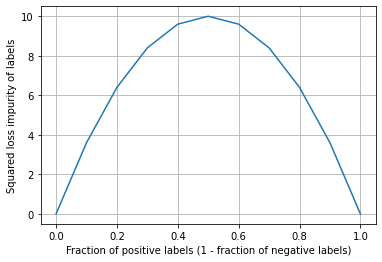

In [12]:
size = 10
y = np.ones(size)
fraction_pos, impurities = [], []
for i in range(size):
    fraction_pos.append(sum([y == 1]) / size)
    impurities.append(sqimpurity(y))
    y[i] = -1
fraction_pos.append(sum([y == 1]) / size)
impurities.append(sqimpurity(y))

display(pd.DataFrame(data={'fraction_pos': fraction_pos, 'impurity': impurities}))
plt.plot(fraction_pos, impurities)
plt.grid()
plt.xlabel('Fraction of positive labels (1 - fraction of negative labels)')
plt.ylabel('Squared loss impurity of labels')

### Part Two: Implement `sqsplit` [Graded]

Now implement **`sqsplit`**, which takes as input a data set of size $n \times d$ with labels and computes the best feature and the threshold/cut of the optimal split based on the squared loss impurity. The function outputs a feature dimension `0 <= feature < d`, a cut threshold `cut`, and the impurity loss `bestloss` of this best split.

Recall in the CART algorithm that, to find the split with the minimum impurity, you iterate over all features and cut values along each feature. We enforce that the cut value be the average of the two consecutive data points' feature values.

You should calculate the impurity of a node of data $S$ with two branches $S_L$ and $S_R$ as:
$$
\begin{align*}
I(S) &= \frac{\left| S_L \right|}{|S|} I \left( S_L \right) + \frac{\left| S_R \right|}{|S|} I \left( S_R \right)\\
&= \frac{1}{|S|}\sum_{(\mathbf{x}, y) \in S_L} \left( y-\overline{y}_{S_L} \right)^2 + \frac{1}{|S|} \sum_{(\mathbf{x}, y) \in S_R} \left( y - \overline{y}_{S_R} \right)^2\\
&\propto \sum_{(\mathbf{x}, y) \in S_L} \left( y-\overline{y}_{S_L} \right)^2 + \sum_{(\mathbf{x}, y) \in S_R} \left( y - \overline{y}_{S_R} \right)^2
\end{align*}
$$

**Implementation Notes:**
- For calculating the impurity of a node, you should just return the sum of left and right impurities instead of the average.
- Returned `feature` must be 0-indexed as is consistent with programming in Python.
- If along a feature $f$, two data points $\mathbf{x}_i$ and $\mathbf{x}_j$ have the same value, avoid splitting between them; move to the next pair of data points.

For example, with the following `xTr` of size $4 \times 3$ and `yTr` for 4 points:
$$
\begin{bmatrix}
1 & 0 & 2\\
2 & 0 & 1\\
0 & 0 & 1\\
2 & 1 & 2
\end{bmatrix},
\begin{bmatrix}
1\\1\\1\\-1
\end{bmatrix}
$$
among possible features `[0, 1, 2]`, the best split would be at `feature = 1` and `cut = (0 + 1) / 2 = 0.5`.

<hr>

If you're stuck, we recommend that you start with the naïve algorithm for finding the best split, which involves a double loop over all features `0 <= f < d` and all cut values `xTr[0, f] < (xTr[i, f] + xTr[i+1, f]) / 2 < xTr[n-1, f]` (with `xTr` sorted along feature `f`). This algorithm thus calculates impurities for `d(n-1)` splits. Here's the pseudocode:

<center><img src="cart-id3_best_split_pseudocode.png" width="75%" /></center>

In [13]:
def sqsplit(xTr, yTr):
    """
    Finds the best feature, cut value, and impurity for a split of (xTr, yTr) based on squared loss impurity.
    
    Input:
        xTr: n x d matrix of data points
        yTr: n-dimensional vector of labels
    
    Output:
        feature:  index of the best cut's feature (keep in mind this is 0-indexed)
        cut:      cut-value of the best cut
        bestloss: squared loss impurity of the best cut
    """
    n, d = xTr.shape
    assert d > 0 # must have at least one dimension
    assert n > 1 # must have at least two samples
    
    bestloss = np.inf
    feature = np.inf
    cut = np.inf

    # YOUR CODE HERE        
    for f in range(d):
        
        #sort on basis of f column..xnew contains sorted data on feature f
        sortIdx = np.argsort(xTr[:, f])
        xnew = xTr[sortIdx, f]
        ynew = yTr[sortIdx]
        
        for i in range(0, n-1):
            if xnew[i] != xnew[i+1]:
                cval = (xnew[i] + xnew[i +1]) / 2
                #print('cval', cval)
            
                #splits
                left_side = xnew <= cval
                #print('left_Side', left_side)
                right_side = xnew > cval
                #print('right_Side', right_side)

                sl = ynew[left_side]
                #print('sl', sl)
                sr = ynew[right_side]
                #print('sr',sr)
                impurity = sqimpurity(sl) + sqimpurity(sr)
                #print('impurity', impurity)
                
                if impurity < bestloss:
                    feature = f
                    cut = cval
                    bestloss = impurity
    
 
    
    return feature, cut, bestloss
    raise NotImplementedError()
    #return feature, cut, bestloss    

In [14]:
# The tests below check that your sqsplit function returns the correct values for several different input datasets

t0 = time.time()
fid, cut, loss = sqsplit(xTrIon,yTrIon)
t1 = time.time()

print('Elapsed time: {:0.2f} seconds'.format(t1-t0))
print("The best split is on feature 2 on value 0.304")
print("Your tree split on feature %i on value: %2.3f \n" % (fid,cut))

def sqsplit_test1():
    a = np.isclose(sqsplit(xor4, yor4)[2] / len(yor4), .25)
    b = np.isclose(sqsplit(xor3, yor3)[2] / len(yor3), .25)
    c = np.isclose(sqsplit(xor2, yor2)[2] / len(yor2), .25)
    return a and b and c

def sqsplit_test2():
    x = np.array(range(1000)).reshape(-1,1)
    y = np.hstack([np.ones(500),-1*np.ones(500)]).T
    _, cut, _ = sqsplit(x, y)
    return cut <= 500 or cut >= 499

def sqsplit_test3():
    fid, cut, loss = sqsplit(xor5,yor5)
    # cut should be 0.5 but 0 is also accepted
    return fid == 0 and (cut >= 0 or cut <= 1) and np.isclose(loss / len(yor5), 2/3)

runtest(sqsplit_test1,'sqsplit_test1')
runtest(sqsplit_test2,'sqsplit_test2')
runtest(sqsplit_test3,'sqsplit_test3')

mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -0.5
impurity 3.0
mean 0.33574007220216606
impurity 245.77617328519852
mean -0.2
impurity 4.800000000000001
mean 0.3333333333333333
impurity 245.33333333333334
mean 0.0
impurity 6.0
mean 0.33090909090909093
impurity 244.88727272727272
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.3357664233576642
impurity 243.10948905109493
mean 0.0
impurity 8.0
mean 0.3333333333333333
impurity 242.66666666666669
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.33088235294117646
impurity 242.22058823529414
mean 0.2
impurity 9.600000000000001
mean 0.3284132841328413
impurity 241.77121771217713
mean 0.2727272727272727
impurity 10.181818181818182
mean 0.32592592592592595
impurity 241.3185185185185
mean 0.16666666666666666
impurity 11.666666666666668
mean 0.33

impurity 63.76271186440679
mean 0.06748466257668712
impurity 162.25766871165644
mean 0.680672268907563
impurity 63.86554621848738
mean 0.06172839506172839
impurity 161.3827160493827
mean 0.6666666666666666
impurity 66.66666666666664
mean 0.06832298136645963
impurity 160.24844720496895
mean 0.6694214876033058
impurity 66.77685950413223
mean 0.0625
impurity 159.375
mean 0.6721311475409836
impurity 66.88524590163934
mean 0.05660377358490566
impurity 158.49056603773587
mean 0.6747967479674797
impurity 66.99186991869917
mean 0.05063291139240506
impurity 157.59493670886079
mean 0.6774193548387096
impurity 67.09677419354836
mean 0.044585987261146494
impurity 156.68789808917194
mean 0.664
impurity 69.88800000000005
mean 0.05128205128205128
impurity 155.5897435897436
mean 0.6507936507936508
impurity 72.6349206349206
mean 0.05806451612903226
impurity 154.47741935483873
mean 0.6535433070866141
impurity 72.755905511811
mean 0.05194805194805195
impurity 153.58441558441558
mean 0.65625
impurity 72.8

mean 0.48148148148148145
impurity 41.481481481481474
mean 0.2807017543859649
impurity 210.0350877192982
mean 0.5094339622641509
impurity 39.24528301886794
mean 0.2838427947598253
impurity 210.55021834061142
mean 0.5
impurity 39.0
mean 0.2782608695652174
impurity 212.19130434782608
mean 0.5294117647058824
impurity 36.70588235294118
mean 0.2813852813852814
impurity 212.7099567099567
mean 0.52
impurity 36.480000000000004
mean 0.27586206896551724
impurity 214.34482758620692
mean 0.5510204081632653
impurity 34.12244897959184
mean 0.2703862660944206
impurity 215.96566523605145
mean 0.5833333333333334
impurity 31.666666666666675
mean 0.27350427350427353
impurity 216.4957264957265
mean 0.574468085106383
impurity 31.48936170212767
mean 0.2765957446808511
impurity 217.02127659574472
mean 0.5652173913043478
impurity 31.304347826086946
mean 0.2796610169491525
impurity 217.54237288135593
mean 0.5555555555555556
impurity 31.111111111111114
mean 0.2742616033755274
impurity 219.17299578059067
mean 0.5

impurity 56.0
mean 0.3211009174311927
impurity 195.52293577981652
mean 0.34375
impurity 56.4375
mean 0.31797235023041476
impurity 195.05990783410135
mean 0.3230769230769231
impurity 58.21538461538462
mean 0.32407407407407407
impurity 193.31481481481484
mean 0.30303030303030304
impurity 59.93939393939393
mean 0.3302325581395349
impurity 191.55348837209303
mean 0.31343283582089554
impurity 60.417910447761194
mean 0.32710280373831774
impurity 191.10280373831773
mean 0.3235294117647059
impurity 60.882352941176485
mean 0.323943661971831
impurity 190.64788732394368
mean 0.30434782608695654
impurity 62.608695652173914
mean 0.330188679245283
impurity 188.88679245283018
mean 0.3142857142857143
impurity 63.085714285714296
mean 0.32701421800947866
impurity 188.43601895734594
mean 0.323943661971831
impurity 63.54929577464789
mean 0.3238095238095238
impurity 187.98095238095237
mean 0.3055555555555556
impurity 65.27777777777777
mean 0.33014354066985646
impurity 186.22009569377994
mean 0.315068493150

mean 0.34444444444444444
impurity 158.64444444444445
mean 0.2871287128712871
impurity 92.67326732673266
mean 0.34806629834254144
impurity 159.0718232044199
mean 0.28
impurity 92.16
mean 0.3516483516483517
impurity 159.49450549450552
mean 0.2727272727272727
impurity 91.63636363636364
mean 0.3551912568306011
impurity 159.91256830601094
mean 0.2653061224489796
impurity 91.10204081632655
mean 0.34782608695652173
impurity 161.73913043478262
mean 0.27835051546391754
impurity 89.48453608247421
mean 0.35135135135135137
impurity 162.16216216216213
mean 0.2708333333333333
impurity 88.95833333333334
mean 0.3548387096774194
impurity 162.58064516129036
mean 0.2631578947368421
impurity 88.42105263157893
mean 0.3582887700534759
impurity 162.99465240641717
mean 0.2553191489361702
impurity 87.87234042553189
mean 0.35106382978723405
impurity 164.8297872340425
mean 0.26881720430107525
impurity 86.27956989247313
mean 0.3439153439153439
impurity 166.64550264550263
mean 0.2826086956521739
impurity 84.652173

impurity 16.875
mean 0.27710843373493976
impurity 229.87951807228916
mean 0.696969696969697
impurity 16.96969696969697
mean 0.27419354838709675
impurity 229.35483870967744
mean 0.7058823529411765
impurity 17.05882352941176
mean 0.27125506072874495
impurity 228.82591093117418
mean 0.6571428571428571
impurity 19.885714285714286
mean 0.2764227642276423
impurity 227.20325203252037
mean 0.6666666666666666
impurity 19.999999999999996
mean 0.27346938775510204
impurity 226.67755102040812
mean 0.6216216216216216
impurity 22.702702702702698
mean 0.2786885245901639
impurity 225.0491803278689
mean 0.631578947368421
impurity 22.842105263157894
mean 0.2757201646090535
impurity 224.52674897119346
mean 0.6410256410256411
impurity 22.974358974358967
mean 0.2727272727272727
impurity 224.0
mean 0.65
impurity 23.099999999999998
mean 0.2697095435684647
impurity 223.4688796680498
mean 0.6585365853658537
impurity 23.219512195121954
mean 0.26666666666666666
impurity 222.9333333333334
mean 0.6666666666666666
i

impurity 68.57142857142858
mean 0.6464646464646465
impurity 115.25252525252529
mean -0.4457831325301205
impurity 66.50602409638556
mean 0.6482412060301508
impurity 115.37688442211056
mean -0.4634146341463415
impurity 64.39024390243902
mean 0.64
impurity 118.08000000000001
mean -0.4567901234567901
impurity 64.09876543209876
mean 0.6417910447761194
impurity 118.20895522388058
mean -0.475
impurity 61.949999999999996
mean 0.6435643564356436
impurity 118.33663366336634
mean -0.4936708860759494
impurity 59.74683544303796
mean 0.6354679802955665
impurity 121.02463054187191
mean -0.48717948717948717
impurity 59.4871794871795
mean 0.6274509803921569
impurity 123.68627450980391
mean -0.4805194805194805
impurity 59.220779220779214
mean 0.6292682926829268
impurity 123.82439024390243
mean -0.5
impurity 57.0
mean 0.6310679611650486
impurity 123.96116504854369
mean -0.52
impurity 54.720000000000006
mean 0.6231884057971014
impurity 126.60869565217394
mean -0.5135135135135135
impurity 54.4864864864865


impurity 157.11801242236027
mean 0.5537190082644629
impurity 83.900826446281
mean 0.15
impurity 156.39999999999998
mean 0.5573770491803278
impurity 84.09836065573772
mean 0.14465408805031446
impurity 155.67295597484278
mean 0.5609756097560976
impurity 84.2926829268293
mean 0.13924050632911392
impurity 154.93670886075952
mean 0.5645161290322581
impurity 84.48387096774194
mean 0.1337579617834395
impurity 154.19108280254778
mean 0.568
impurity 84.672
mean 0.1282051282051282
impurity 153.43589743589746
mean 0.5714285714285714
impurity 84.85714285714289
mean 0.12258064516129032
impurity 152.67096774193547
mean 0.5748031496062992
impurity 85.03937007874015
mean 0.11688311688311688
impurity 151.89610389610388
mean 0.578125
impurity 85.21875
mean 0.1111111111111111
impurity 151.11111111111111
mean 0.5813953488372093
impurity 85.39534883720931
mean 0.10526315789473684
impurity 150.3157894736842
mean 0.5846153846153846
impurity 85.5692307692308
mean 0.09933774834437085
impurity 149.5099337748344

impurity 34.9090909090909
mean 0.46218487394957986
impurity 187.15966386554624
mean -0.4418604651162791
impurity 34.604651162790695
mean 0.46443514644351463
impurity 187.44769874476987
mean -0.47619047619047616
impurity 32.476190476190474
mean 0.4583333333333333
impurity 189.58333333333334
mean -0.4634146341463415
impurity 32.19512195121951
mean 0.4605809128630705
impurity 189.87551867219918
mean -0.5
impurity 30.0
mean 0.4628099173553719
impurity 190.16528925619835
mean -0.5384615384615384
impurity 27.692307692307683
mean 0.4567901234567901
impurity 192.2962962962963
mean -0.5263157894736842
impurity 27.473684210526315
mean 0.45081967213114754
impurity 194.40983606557376
mean -0.5135135135135135
impurity 27.24324324324324
mean 0.4448979591836735
impurity 196.50612244897957
mean -0.5
impurity 27.0
mean 0.43902439024390244
impurity 198.58536585365854
mean -0.4857142857142857
impurity 26.74285714285715
mean 0.4331983805668016
impurity 200.64777327935224
mean -0.47058823529411764
impurity

impurity 87.81818181818181
mean 0.45077720207253885
impurity 153.7823834196891
mean 0.056179775280898875
impurity 88.71910112359548
mean 0.4479166666666667
impurity 153.47916666666669
mean 0.06666666666666667
impurity 89.6
mean 0.44502617801047123
impurity 153.17277486910996
mean 0.07692307692307693
impurity 90.46153846153847
mean 0.4421052631578947
impurity 152.86315789473682
mean 0.08695652173913043
impurity 91.30434782608697
mean 0.43915343915343913
impurity 152.5502645502646
mean 0.0967741935483871
impurity 92.12903225806453
mean 0.43617021276595747
impurity 152.2340425531915
mean 0.10638297872340426
impurity 92.93617021276596
mean 0.43315508021390375
impurity 151.9144385026738
mean 0.11578947368421053
impurity 93.72631578947365
mean 0.43010752688172044
impurity 151.5913978494624
mean 0.125
impurity 94.5
mean 0.42702702702702705
impurity 151.26486486486488
mean 0.13402061855670103
impurity 95.25773195876289
mean 0.42391304347826086
impurity 150.93478260869563
mean 0.142857142857142

mean 0.42735042735042733
impurity 191.2649572649573
mean -0.19148936170212766
impurity 45.276595744680854
mean 0.4297872340425532
impurity 191.59148936170214
mean -0.21739130434782608
impurity 43.82608695652176
mean 0.423728813559322
impurity 193.62711864406782
mean -0.2
impurity 43.2
mean 0.4177215189873418
impurity 195.6455696202532
mean -0.18181818181818182
impurity 42.54545454545456
mean 0.42016806722689076
impurity 195.98319327731093
mean -0.20930232558139536
impurity 41.11627906976744
mean 0.41422594142259417
impurity 197.99163179916314
mean -0.19047619047619047
impurity 40.476190476190474
mean 0.4083333333333333
impurity 199.98333333333335
mean -0.17073170731707318
impurity 39.80487804878048
mean 0.4107883817427386
impurity 200.33195020746888
mean -0.2
impurity 38.400000000000006
mean 0.4049586776859504
impurity 202.3140495867769
mean -0.1794871794871795
impurity 37.74358974358974
mean 0.4074074074074074
impurity 202.66666666666666
mean -0.21052631578947367
impurity 36.315789473

impurity 174.77209302325582
mean -0.014925373134328358
impurity 66.98507462686567
mean 0.42990654205607476
impurity 174.44859813084108
mean 0.0
impurity 68.0
mean 0.4272300469483568
impurity 174.12206572769955
mean 0.014492753623188406
impurity 68.98550724637684
mean 0.42452830188679247
impurity 173.79245283018867
mean 0.02857142857142857
impurity 69.94285714285718
mean 0.4218009478672986
impurity 173.45971563981038
mean 0.014084507042253521
impurity 70.98591549295779
mean 0.42857142857142855
impurity 171.42857142857144
mean 0.027777777777777776
impurity 71.94444444444443
mean 0.4258373205741627
impurity 171.10047846889955
mean 0.0410958904109589
impurity 72.87671232876713
mean 0.4230769230769231
impurity 170.76923076923077
mean 0.05405405405405406
impurity 73.78378378378378
mean 0.42028985507246375
impurity 170.43478260869563
mean 0.06666666666666667
impurity 74.66666666666664
mean 0.4174757281553398
impurity 170.09708737864077
mean 0.07894736842105263
impurity 75.52631578947366
mean 

mean -0.225
impurity 75.95000000000003
mean 0.5445544554455446
impurity 142.0990099009901
mean -0.24050632911392406
impurity 74.4303797468354
mean 0.5369458128078818
impurity 144.47290640394087
mean -0.23076923076923078
impurity 73.84615384615384
mean 0.5392156862745098
impurity 144.68627450980392
mean -0.24675324675324675
impurity 72.31168831168834
mean 0.5414634146341464
impurity 144.8975609756098
mean -0.2631578947368421
impurity 70.73684210526315
mean 0.5339805825242718
impurity 147.2621359223301
mean -0.25333333333333335
impurity 70.18666666666668
mean 0.5265700483091788
impurity 149.60386473429952
mean -0.24324324324324326
impurity 69.6216216216216
mean 0.5288461538461539
impurity 149.82692307692304
mean -0.2602739726027397
impurity 68.05479452054793
mean 0.5311004784688995
impurity 150.04784688995218
mean -0.2777777777777778
impurity 66.44444444444444
mean 0.5333333333333333
impurity 150.26666666666665
mean -0.29577464788732394
impurity 64.78873239436622
mean 0.5355450236966824


impurity 39.099999999999994
mean 0.4024896265560166
impurity 201.95850622406635
mean -0.12195121951219512
impurity 40.390243902439025
mean 0.4
impurity 201.59999999999997
mean -0.09523809523809523
impurity 41.61904761904762
mean 0.39748953974895396
impurity 201.23849372384936
mean -0.06976744186046512
impurity 42.790697674418595
mean 0.3949579831932773
impurity 200.8739495798319
mean -0.045454545454545456
impurity 43.90909090909091
mean 0.3924050632911392
impurity 200.50632911392404
mean -0.06666666666666667
impurity 44.800000000000004
mean 0.3983050847457627
impurity 198.55932203389833
mean -0.043478260869565216
impurity 45.91304347826088
mean 0.39574468085106385
impurity 198.19574468085108
mean -0.06382978723404255
impurity 46.80851063829787
mean 0.4017094017094017
impurity 196.23931623931617
mean -0.041666666666666664
impurity 47.91666666666667
mean 0.39914163090128757
impurity 195.87982832618025
mean -0.02040816326530612
impurity 48.979591836734684
mean 0.39655172413793105
impurity

mean 0.25
impurity 105.0
mean 0.3764705882352941
impurity 145.90588235294115
mean 0.24324324324324326
impurity 104.43243243243239
mean 0.3684210526315789
impurity 147.78947368421052
mean 0.2545454545454545
impurity 102.87272727272726
mean 0.37209302325581395
impurity 148.18604651162792
mean 0.24770642201834864
impurity 102.3119266055046
mean 0.37572254335260113
impurity 148.57803468208095
mean 0.24074074074074073
impurity 101.74074074074073
mean 0.3793103448275862
impurity 148.96551724137936
mean 0.2336448598130841
impurity 101.15887850467287
mean 0.38285714285714284
impurity 149.3485714285714
mean 0.22641509433962265
impurity 100.56603773584902
mean 0.375
impurity 151.25
mean 0.23809523809523808
impurity 99.04761904761904
mean 0.3785310734463277
impurity 151.63841807909603
mean 0.23076923076923078
impurity 98.46153846153848
mean 0.38202247191011235
impurity 152.02247191011233
mean 0.22330097087378642
impurity 97.8640776699029
mean 0.3854748603351955
impurity 152.40223463687153
mean 0.

mean -1.0
impurity 0.0
mean 0.4307692307692308
impurity 211.75384615384618
mean -1.0
impurity 0.0
mean 0.4362934362934363
impurity 209.69884169884165
mean -0.9130434782608695
impurity 3.8260869565217397
mean 0.43410852713178294
impurity 209.37984496124034
mean -0.9166666666666666
impurity 3.833333333333333
mean 0.4396887159533074
impurity 207.31517509727627
mean -0.92
impurity 3.84
mean 0.4453125
impurity 205.234375
mean -0.8461538461538461
impurity 7.384615384615385
mean 0.44313725490196076
impurity 204.92549019607844
mean -0.8518518518518519
impurity 7.407407407407408
mean 0.44881889763779526
impurity 202.83464566929138
mean -0.8571428571428571
impurity 7.428571428571429
mean 0.45454545454545453
impurity 200.7272727272727
mean -0.7931034482758621
impurity 10.75862068965517
mean 0.4523809523809524
impurity 200.42857142857144
mean -0.8
impurity 10.8
mean 0.4581673306772908
impurity 198.31075697211153
mean -0.8064516129032258
impurity 10.838709677419356
mean 0.464
impurity 196.176
mean 

impurity 129.15107913669067
mean 0.38028169014084506
impurity 121.46478873239438
mean 0.2714285714285714
impurity 129.68571428571425
mean 0.375886524822695
impurity 121.07801418439715
mean 0.2765957446808511
impurity 130.2127659574468
mean 0.37142857142857144
impurity 120.68571428571427
mean 0.28169014084507044
impurity 130.73239436619718
mean 0.3669064748201439
impurity 120.28776978417267
mean 0.2867132867132867
impurity 131.24475524475523
mean 0.36231884057971014
impurity 119.88405797101449
mean 0.2916666666666667
impurity 131.75
mean 0.35766423357664234
impurity 119.47445255474452
mean 0.296551724137931
impurity 132.24827586206897
mean 0.35294117647058826
impurity 119.05882352941177
mean 0.3013698630136986
impurity 132.73972602739724
mean 0.34814814814814815
impurity 118.63703703703705
mean 0.30612244897959184
impurity 133.2244897959184
mean 0.34328358208955223
impurity 118.20895522388061
mean 0.3108108108108108
impurity 133.7027027027027
mean 0.3383458646616541
impurity 117.7744360

mean 0.39325842696629215
impurity 225.70786516853934
mean -1.0
impurity 0.0
mean 0.3880597014925373
impurity 227.6417910447761
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.5613382899629
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.35793357933574
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764707
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.0989010989011
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.7854545454545
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41877256317696
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.32857142857142857

mean 0.41714285714285715
impurity 144.54857142857145
mean 0.1588785046728972
impurity 104.29906542056072
mean 0.42528735632183906
impurity 142.52873563218387
mean 0.16666666666666666
impurity 105.00000000000001
mean 0.42196531791907516
impurity 142.19653179190752
mean 0.1743119266055046
impurity 105.6880733944954
mean 0.4186046511627907
impurity 141.86046511627904
mean 0.18181818181818182
impurity 106.36363636363633
mean 0.4152046783625731
impurity 141.52046783625727
mean 0.1891891891891892
impurity 107.02702702702697
mean 0.4117647058823529
impurity 141.1764705882353
mean 0.19642857142857142
impurity 107.67857142857144
mean 0.40828402366863903
impurity 140.8284023668639
mean 0.20353982300884957
impurity 108.31858407079648
mean 0.40476190476190477
impurity 140.47619047619045
mean 0.21052631578947367
impurity 108.94736842105263
mean 0.40119760479041916
impurity 140.1197604790419
mean 0.2
impurity 110.40000000000003
mean 0.40963855421686746
impurity 138.14457831325302
mean 0.206896551724

mean 0.08771929824561403
impurity 56.56140350877193
mean 0.38666666666666666
impurity 191.36
mean 0.07142857142857142
impurity 55.71428571428572
mean 0.3893805309734513
impurity 191.73451327433625
mean 0.05454545454545454
impurity 54.8363636363636
mean 0.3920704845814978
impurity 192.1057268722467
mean 0.037037037037037035
impurity 53.92592592592594
mean 0.38596491228070173
impurity 194.03508771929825
mean 0.05660377358490566
impurity 52.830188679245296
mean 0.388646288209607
impurity 194.41048034934494
mean 0.038461538461538464
impurity 51.92307692307692
mean 0.391304347826087
impurity 194.78260869565221
mean 0.0196078431372549
impurity 50.98039215686274
mean 0.3939393939393939
impurity 195.15151515151516
mean 0.0
impurity 50.0
mean 0.39655172413793105
impurity 195.5172413793104
mean -0.02040816326530612
impurity 48.97959183673469
mean 0.39914163090128757
impurity 195.87982832618025
mean -0.041666666666666664
impurity 47.91666666666667
mean 0.39316239316239315
impurity 197.82905982905

mean -0.1875
impurity 61.75
mean 0.47465437788018433
impurity 168.110599078341
mean -0.16923076923076924
impurity 63.138461538461534
mean 0.4722222222222222
impurity 167.83333333333334
mean -0.15151515151515152
impurity 64.4848484848485
mean 0.4697674418604651
impurity 167.55348837209303
mean -0.16417910447761194
impurity 65.19402985074629
mean 0.4766355140186916
impurity 165.3831775700935
mean -0.14705882352941177
impurity 66.52941176470587
mean 0.47417840375586856
impurity 165.10798122065725
mean -0.13043478260869565
impurity 67.82608695652172
mean 0.4716981132075472
impurity 164.83018867924528
mean -0.14285714285714285
impurity 68.57142857142858
mean 0.4786729857819905
impurity 162.65402843601893
mean -0.1267605633802817
impurity 69.85915492957747
mean 0.47619047619047616
impurity 162.3809523809524
mean -0.1111111111111111
impurity 71.11111111111111
mean 0.47368421052631576
impurity 162.10526315789474
mean -0.0958904109589041
impurity 72.32876712328766
mean 0.47115384615384615
impur

impurity 157.38693467336682
mean 0.0
impurity 82.0
mean 0.46
impurity 157.68
mean -0.012345679012345678
impurity 80.98765432098767
mean 0.4527363184079602
impurity 159.8009950248756
mean 0.0
impurity 80.0
mean 0.45544554455445546
impurity 160.09900990099004
mean -0.012658227848101266
impurity 78.98734177215186
mean 0.458128078817734
impurity 160.39408866995075
mean -0.02564102564102564
impurity 77.94871794871796
mean 0.46078431372549017
impurity 160.68627450980392
mean -0.03896103896103896
impurity 76.8831168831169
mean 0.4634146341463415
impurity 160.97560975609758
mean -0.05263157894736842
impurity 75.78947368421049
mean 0.4563106796116505
impurity 163.10679611650488
mean -0.04
impurity 74.88
mean 0.45893719806763283
impurity 163.40096618357492
mean -0.05405405405405406
impurity 73.78378378378378
mean 0.4519230769230769
impurity 165.51923076923075
mean -0.0410958904109589
impurity 72.87671232876713
mean 0.4449760765550239
impurity 167.61722488038276
mean -0.027777777777777776
impurit

mean -0.631578947368421
impurity 22.842105263157894
mean 0.4732510288065844
impurity 188.57613168724282
mean -0.6410256410256411
impurity 22.974358974358967
mean 0.4793388429752066
impurity 186.39669421487605
mean -0.65
impurity 23.099999999999994
mean 0.4854771784232365
impurity 184.19917012448136
mean -0.6585365853658537
impurity 23.219512195121954
mean 0.49166666666666664
impurity 181.9833333333333
mean -0.6666666666666666
impurity 23.33333333333333
mean 0.497907949790795
impurity 179.74895397489536
mean -0.627906976744186
impurity 26.046511627906977
mean 0.4957983193277311
impurity 179.49579831932772
mean -0.6363636363636364
impurity 26.181818181818176
mean 0.5021097046413502
impurity 177.24894514767928
mean -0.6
impurity 28.800000000000004
mean 0.5
impurity 177.0
mean -0.5652173913043478
impurity 31.304347826086946
mean 0.4978723404255319
impurity 176.74893617021272
mean -0.5319148936170213
impurity 33.702127659574465
mean 0.49572649572649574
impurity 176.49572649572644
mean -0.5


mean 0.04950495049504951
impurity 100.75247524752479
mean 0.48066298342541436
impurity 139.18232044198896
mean 0.04
impurity 99.83999999999997
mean 0.4725274725274725
impurity 141.36263736263737
mean 0.050505050505050504
impurity 98.74747474747475
mean 0.47540983606557374
impurity 141.63934426229505
mean 0.04081632653061224
impurity 97.83673469387755
mean 0.4782608695652174
impurity 141.91304347826087
mean 0.030927835051546393
impurity 96.90721649484533
mean 0.4810810810810811
impurity 142.1837837837838
mean 0.020833333333333332
impurity 95.95833333333333
mean 0.4838709677419355
impurity 142.4516129032258
mean 0.010526315789473684
impurity 94.9894736842105
mean 0.48663101604278075
impurity 142.71657754010698
mean 0.0
impurity 94.0
mean 0.48936170212765956
impurity 142.97872340425533
mean -0.010752688172043012
impurity 92.98924731182794
mean 0.49206349206349204
impurity 143.23809523809524
mean -0.021739130434782608
impurity 91.95652173913041
mean 0.49473684210526314
impurity 143.4947368

mean 0.3828996282527881
impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.3880597014925373
impurity 227.64179104477608
mean -1.0
impurity 0.0
mean 0.39325842696629215
impurity 225.70786516853934
mean -1.0
impurity 0.0
mean 0.39849624060150374
impurity 223.75939849624064
mean -1.0
impurity 0.0
mean 0.4037735849056604
impurity 221.79622641509434
mean -1.0
impurity 0.0
mean 0.4090909090909091
impurity 219.81818181818187
mean -1.0
impurity 0.0
mean 0.4144486692015209
impurity 217.82509505703422
mean -1.0
impurity 0.0
mean 0.4198473282442748
impurity 215.81679389312973
mean -1.0
impurity 0.0
mean 0.42528735632183906
impurity 213.79310344827582
mean -1.0
impurity 0.0
mean 0.4307692307692308
impurity 211.75384615384618
mean -0.9090909090909091
impurity 3.818181818181819
mean 0.42857142857142855
impurity 211.42857142857144
mean -0.9130434782608695
impurity 3.8260869565217397
mean 0.43410852713178294
impurity 209.37984496124034
mean -0.9166666666666666
impurity 3.833333333333333
mean 0.

impurity 125.56923076923078
mean 0.44370860927152317
impurity 121.27152317880797
mean 0.19083969465648856
impurity 126.22900763358778
mean 0.44
impurity 120.96
mean 0.18181818181818182
impurity 127.63636363636367
mean 0.44966442953020136
impurity 118.87248322147656
mean 0.18796992481203006
impurity 128.30075187969925
mean 0.44594594594594594
impurity 118.56756756756761
mean 0.19402985074626866
impurity 128.95522388059698
mean 0.4421768707482993
impurity 118.25850340136057
mean 0.2
impurity 129.60000000000002
mean 0.4383561643835616
impurity 117.94520547945206
mean 0.20588235294117646
impurity 130.23529411764707
mean 0.43448275862068964
impurity 117.62758620689652
mean 0.2116788321167883
impurity 130.86131386861314
mean 0.4305555555555556
impurity 117.30555555555554
mean 0.2028985507246377
impurity 132.31884057971018
mean 0.4405594405594406
impurity 115.24475524475528
mean 0.20863309352517986
impurity 132.9496402877698
mean 0.43661971830985913
impurity 114.92957746478874
mean 0.21428571

impurity 215.42857142857144
mean -0.1724137931034483
impurity 28.137931034482758
mean 0.383399209486166
impurity 215.81027667984193
mean -0.21428571428571427
impurity 26.714285714285715
mean 0.3858267716535433
impurity 216.18897637795277
mean -0.25925925925925924
impurity 25.185185185185187
mean 0.38823529411764707
impurity 216.56470588235294
mean -0.3076923076923077
impurity 23.53846153846154
mean 0.390625
impurity 216.9375
mean -0.36
impurity 21.76
mean 0.39299610894941633
impurity 217.30739299610894
mean -0.4166666666666667
impurity 19.833333333333332
mean 0.3953488372093023
impurity 217.6744186046512
mean -0.4782608695652174
impurity 17.7391304347826
mean 0.39768339768339767
impurity 218.03861003861007
mean -0.5454545454545454
impurity 15.454545454545459
mean 0.3923076923076923
impurity 219.98461538461535
mean -0.5238095238095238
impurity 15.238095238095235
mean 0.3946360153256705
impurity 220.3524904214559
mean -0.6
impurity 12.800000000000004
mean 0.3969465648854962
impurity 220.

impurity 87.87234042553189
mean 0.3582887700534759
impurity 162.99465240641717
mean 0.2631578947368421
impurity 88.42105263157896
mean 0.3548387096774194
impurity 162.58064516129033
mean 0.2708333333333333
impurity 88.95833333333336
mean 0.35135135135135137
impurity 162.16216216216213
mean 0.27835051546391754
impurity 89.48453608247421
mean 0.34782608695652173
impurity 161.73913043478262
mean 0.2857142857142857
impurity 89.99999999999997
mean 0.3442622950819672
impurity 161.31147540983608
mean 0.29292929292929293
impurity 90.50505050505052
mean 0.34065934065934067
impurity 160.87912087912093
mean 0.3
impurity 90.99999999999999
mean 0.3370165745856354
impurity 160.4419889502762
mean 0.3069306930693069
impurity 91.48514851485147
mean 0.3333333333333333
impurity 160.0
mean 0.3137254901960784
impurity 91.96078431372553
mean 0.329608938547486
impurity 159.55307262569832
mean 0.32038834951456313
impurity 92.42718446601936
mean 0.3258426966292135
impurity 159.1011235955056
mean 0.326923076923

impurity 159.9814814814815
mean -0.2923076923076923
impurity 59.44615384615385
mean 0.5023041474654378
impurity 162.24884792626722
mean -0.28125
impurity 58.9375
mean 0.4954128440366973
impurity 164.49541284403674
mean -0.2698412698412698
impurity 58.41269841269843
mean 0.4885844748858447
impurity 166.72146118721463
mean -0.25806451612903225
impurity 57.8709677419355
mean 0.4909090909090909
impurity 166.9818181818182
mean -0.2786885245901639
impurity 56.26229508196721
mean 0.49321266968325794
impurity 167.23981900452486
mean -0.3
impurity 54.600000000000016
mean 0.4954954954954955
impurity 167.49549549549553
mean -0.3220338983050847
impurity 52.881355932203384
mean 0.4977578475336323
impurity 167.74887892376682
mean -0.3448275862068966
impurity 51.10344827586208
mean 0.5
impurity 168.0
mean -0.3684210526315789
impurity 49.26315789473684
mean 0.49333333333333335
impurity 170.23999999999998
mean -0.35714285714285715
impurity 48.85714285714286
mean 0.49557522123893805
impurity 170.4955752

mean 0.35714285714285715
impurity 195.42857142857144
mean 0.1724137931034483
impurity 56.27586206896554
mean 0.3632286995515695
impurity 193.5784753363229
mean 0.1864406779661017
impurity 56.94915254237288
mean 0.36036036036036034
impurity 193.17117117117118
mean 0.16666666666666666
impurity 58.33333333333335
mean 0.3665158371040724
impurity 191.31221719457014
mean 0.18032786885245902
impurity 59.01639344262295
mean 0.36363636363636365
impurity 190.90909090909093
mean 0.16129032258064516
impurity 60.387096774193544
mean 0.3698630136986301
impurity 189.041095890411
mean 0.1746031746031746
impurity 61.07936507936506
mean 0.3669724770642202
impurity 188.64220183486236
mean 0.1875
impurity 61.75
mean 0.3640552995391705
impurity 188.23963133640552
mean 0.2
impurity 62.400000000000006
mean 0.3611111111111111
impurity 187.83333333333334
mean 0.21212121212121213
impurity 63.03030303030304
mean 0.3581395348837209
impurity 187.42325581395352
mean 0.22388059701492538
impurity 63.64179104477612
me

mean -0.09473684210526316
impurity 94.14736842105262
mean 0.5401069518716578
impurity 132.44919786096253
mean -0.10638297872340426
impurity 92.93617021276596
mean 0.5319148936170213
impurity 134.8085106382979
mean -0.0967741935483871
impurity 92.12903225806453
mean 0.5343915343915344
impurity 135.02645502645504
mean -0.10869565217391304
impurity 90.91304347826085
mean 0.5368421052631579
impurity 135.2421052631579
mean -0.12087912087912088
impurity 89.67032967032965
mean 0.5392670157068062
impurity 135.45549738219896
mean -0.13333333333333333
impurity 88.4
mean 0.5416666666666666
impurity 135.66666666666669
mean -0.14606741573033707
impurity 87.10112359550563
mean 0.5440414507772021
impurity 135.87564766839375
mean -0.1590909090909091
impurity 85.77272727272728
mean 0.5463917525773195
impurity 136.0824742268041
mean -0.1724137931034483
impurity 84.41379310344827
mean 0.5487179487179488
impurity 136.28717948717946
mean -0.18604651162790697
impurity 83.02325581395351
mean 0.55102040816326

mean 0.43089430894308944
impurity 200.3252032520325
mean -0.3888888888888889
impurity 30.555555555555557
mean 0.42857142857142855
impurity 200.00000000000006
mean -0.35135135135135137
impurity 32.432432432432435
mean 0.4262295081967213
impurity 199.67213114754094
mean -0.3684210526315789
impurity 32.84210526315789
mean 0.43209876543209874
impurity 197.62962962962962
mean -0.3333333333333333
impurity 34.666666666666664
mean 0.4297520661157025
impurity 197.30578512396696
mean -0.35
impurity 35.1
mean 0.43568464730290457
impurity 195.253112033195
mean -0.36585365853658536
impurity 35.51219512195122
mean 0.44166666666666665
impurity 193.18333333333337
mean -0.3333333333333333
impurity 37.333333333333336
mean 0.4393305439330544
impurity 192.8702928870293
mean -0.3023255813953488
impurity 39.06976744186046
mean 0.4369747899159664
impurity 192.5546218487395
mean -0.2727272727272727
impurity 40.727272727272734
mean 0.4345991561181435
impurity 192.23628691983123
mean -0.24444444444444444
impuri

impurity 111.82758620689654
mean 0.42168674698795183
impurity 136.4819277108434
mean 0.1826086956521739
impurity 111.16521739130434
mean 0.4251497005988024
impurity 136.814371257485
mean 0.17543859649122806
impurity 110.49122807017545
mean 0.42857142857142855
impurity 137.14285714285717
mean 0.168141592920354
impurity 109.8053097345133
mean 0.4319526627218935
impurity 137.46745562130178
mean 0.16071428571428573
impurity 109.10714285714289
mean 0.43529411764705883
impurity 137.78823529411764
mean 0.15315315315315314
impurity 108.39639639639644
mean 0.43859649122807015
impurity 138.10526315789474
mean 0.14545454545454545
impurity 107.67272727272729
mean 0.4418604651162791
impurity 138.41860465116275
mean 0.13761467889908258
impurity 106.9357798165138
mean 0.44508670520231214
impurity 138.72832369942196
mean 0.12962962962962962
impurity 106.18518518518519
mean 0.4482758620689655
impurity 139.0344827586207
mean 0.12149532710280374
impurity 105.42056074766352
mean 0.44
impurity 141.12
mean 

impurity 3.6000000000000005
mean 0.36531365313653136
impurity 234.83394833948336
mean -0.8181818181818182
impurity 3.6363636363636362
mean 0.37037037037037035
impurity 232.96296296296293
mean -0.8333333333333334
impurity 3.6666666666666665
mean 0.3754646840148699
impurity 231.0780669144982
mean -0.8461538461538461
impurity 3.6923076923076934
mean 0.3805970149253731
impurity 229.17910447761204
mean -0.8571428571428571
impurity 3.714285714285713
mean 0.3857677902621723
impurity 227.26591760299627
mean -0.7333333333333333
impurity 6.933333333333334
mean 0.38345864661654133
impurity 226.88721804511275
mean -0.75
impurity 7.0
mean 0.3886792452830189
impurity 224.9660377358491
mean -0.7647058823529411
impurity 7.0588235294117645
mean 0.3939393939393939
impurity 223.0303030303031
mean -0.6666666666666666
impurity 9.999999999999998
mean 0.3916349809885932
impurity 222.66159695817487
mean -0.6842105263157895
impurity 10.105263157894735
mean 0.3969465648854962
impurity 220.71755725190837
mean -0

impurity 131.36842105263156
mean 0.27692307692307694
impurity 120.03076923076921
mean 0.36423841059602646
impurity 130.96688741721854
mean 0.2824427480916031
impurity 120.54961832061065
mean 0.36
impurity 130.55999999999997
mean 0.2878787878787879
impurity 121.06060606060605
mean 0.35570469798657717
impurity 130.14765100671144
mean 0.2932330827067669
impurity 121.5639097744361
mean 0.35135135135135137
impurity 129.7297297297297
mean 0.29850746268656714
impurity 122.05970149253733
mean 0.3469387755102041
impurity 129.3061224489796
mean 0.3037037037037037
impurity 122.54814814814814
mean 0.3424657534246575
impurity 128.87671232876713
mean 0.3088235294117647
impurity 123.02941176470587
mean 0.33793103448275863
impurity 128.44137931034481
mean 0.31386861313868614
impurity 123.5036496350365
mean 0.3333333333333333
impurity 128.0
mean 0.3188405797101449
impurity 123.97101449275362
mean 0.32867132867132864
impurity 127.5524475524475
mean 0.3237410071942446
impurity 124.431654676259
mean 0.323

impurity 198.893280632411
mean -0.9285714285714286
impurity 3.8571428571428585
mean 0.4566929133858268
impurity 201.02362204724415
mean -0.9259259259259259
impurity 3.851851851851851
mean 0.45098039215686275
impurity 203.13725490196083
mean -0.9230769230769231
impurity 3.846153846153845
mean 0.453125
impurity 203.4375
mean -1.0
impurity 0.0
mean 0.4474708171206226
impurity 205.54085603112838
mean -1.0
impurity 0.0
mean 0.4418604651162791
impurity 207.62790697674416
mean -1.0
impurity 0.0
mean 0.4362934362934363
impurity 209.69884169884168
mean -1.0
impurity 0.0
mean 0.4307692307692308
impurity 211.7538461538462
mean -1.0
impurity 0.0
mean 0.42528735632183906
impurity 213.79310344827584
mean -1.0
impurity 0.0
mean 0.4198473282442748
impurity 215.81679389312978
mean -1.0
impurity 0.0
mean 0.4144486692015209
impurity 217.82509505703422
mean -1.0
impurity 0.0
mean 0.4090909090909091
impurity 219.81818181818187
mean -1.0
impurity 0.0
mean 0.4037735849056604
impurity 221.79622641509434
mean 

impurity 92.45360824742266
mean 0.3804347826086957
impurity 157.3695652173913
mean 0.22448979591836735
impurity 93.06122448979593
mean 0.3770491803278688
impurity 156.98360655737702
mean 0.23232323232323232
impurity 93.65656565656566
mean 0.37362637362637363
impurity 156.5934065934066
mean 0.24
impurity 94.24000000000002
mean 0.3701657458563536
impurity 156.1988950276243
mean 0.22772277227722773
impurity 95.76237623762377
mean 0.37777777777777777
impurity 154.3111111111111
mean 0.23529411764705882
impurity 96.3529411764706
mean 0.3743016759776536
impurity 153.9217877094972
mean 0.24271844660194175
impurity 96.93203883495146
mean 0.3707865168539326
impurity 153.52808988764045
mean 0.25
impurity 97.5
mean 0.3672316384180791
impurity 153.12994350282486
mean 0.2571428571428571
impurity 98.05714285714285
mean 0.36363636363636365
impurity 152.72727272727275
mean 0.24528301886792453
impurity 99.62264150943396
mean 0.37142857142857144
impurity 150.85714285714283
mean 0.2523364485981308
impurit

mean -0.43859649122807015
impurity 46.03508771929825
mean 0.5111111111111111
impurity 166.22222222222223
mean -0.42857142857142855
impurity 45.714285714285715
mean 0.504424778761062
impurity 168.495575221239
mean -0.41818181818181815
impurity 45.381818181818176
mean 0.4977973568281938
impurity 170.74889867841415
mean -0.4074074074074074
impurity 45.03703703703705
mean 0.5
impurity 171.0
mean -0.4339622641509434
impurity 43.0188679245283
mean 0.49344978165938863
impurity 173.24017467248905
mean -0.4230769230769231
impurity 42.69230769230768
mean 0.4956521739130435
impurity 173.49565217391302
mean -0.45098039215686275
impurity 40.62745098039216
mean 0.49783549783549785
impurity 173.74891774891773
mean -0.48
impurity 38.480000000000004
mean 0.49137931034482757
impurity 175.98275862068965
mean -0.46938775510204084
impurity 38.20408163265306
mean 0.49356223175965663
impurity 176.2403433476395
mean -0.5
impurity 36.0
mean 0.49572649572649574
impurity 176.49572649572647
mean -0.53191489361702

impurity 139.9009900990099
mean -0.25
impurity 75.0
mean 0.5522388059701493
impurity 139.7014925373134
mean -0.2345679012345679
impurity 76.5432098765432
mean 0.55
impurity 139.5
mean -0.24390243902439024
impurity 77.12195121951218
mean 0.5577889447236181
impurity 137.08542713567834
mean -0.2289156626506024
impurity 78.65060240963855
mean 0.5555555555555556
impurity 136.88888888888886
mean -0.21428571428571427
impurity 80.14285714285715
mean 0.5532994923857868
impurity 136.69035532994928
mean -0.2
impurity 81.59999999999998
mean 0.5510204081632653
impurity 136.48979591836732
mean -0.18604651162790697
impurity 83.0232558139535
mean 0.5487179487179488
impurity 136.28717948717951
mean -0.1724137931034483
impurity 84.41379310344827
mean 0.5463917525773195
impurity 136.08247422680412
mean -0.18181818181818182
impurity 85.0909090909091
mean 0.5544041450777202
impurity 133.67875647668393
mean -0.16853932584269662
impurity 86.47191011235955
mean 0.5520833333333334
impurity 133.47916666666669
m

mean 0.36
impurity 174.07999999999996
mean 0.2345679012345679
impurity 76.54320987654322
mean 0.36318407960199006
impurity 174.48756218905473
mean 0.225
impurity 75.95000000000002
mean 0.36633663366336633
impurity 174.89108910891088
mean 0.21518987341772153
impurity 75.3417721518987
mean 0.3694581280788177
impurity 175.29064039408868
mean 0.20512820512820512
impurity 74.71794871794867
mean 0.37254901960784315
impurity 175.68627450980395
mean 0.19480519480519481
impurity 74.07792207792207
mean 0.375609756097561
impurity 176.07804878048782
mean 0.18421052631578946
impurity 73.42105263157893
mean 0.3786407766990291
impurity 176.4660194174757
mean 0.17333333333333334
impurity 72.74666666666666
mean 0.38164251207729466
impurity 176.8502415458937
mean 0.16216216216216217
impurity 72.05405405405405
mean 0.38461538461538464
impurity 177.23076923076923
mean 0.1506849315068493
impurity 71.34246575342468
mean 0.3875598086124402
impurity 177.60765550239233
mean 0.1388888888888889
impurity 70.61111

mean -0.2558139534883721
impurity 40.186046511627914
mean 0.42857142857142855
impurity 194.28571428571433
mean -0.2727272727272727
impurity 40.72727272727272
mean 0.4345991561181435
impurity 192.2362869198312
mean -0.24444444444444444
impurity 42.31111111111111
mean 0.4322033898305085
impurity 191.91525423728808
mean -0.21739130434782608
impurity 43.82608695652176
mean 0.4297872340425532
impurity 191.59148936170212
mean -0.19148936170212766
impurity 45.27659574468083
mean 0.42735042735042733
impurity 191.26495726495727
mean -0.16666666666666666
impurity 46.66666666666667
mean 0.4248927038626609
impurity 190.93562231759657
mean -0.1836734693877551
impurity 47.34693877551021
mean 0.43103448275862066
impurity 188.8965517241379
mean -0.16
impurity 48.719999999999985
mean 0.42857142857142855
impurity 188.5714285714286
mean -0.13725490196078433
impurity 50.0392156862745
mean 0.4260869565217391
impurity 188.2434782608695
mean -0.11538461538461539
impurity 51.3076923076923
mean 0.4235807860262

mean 0.1896551724137931
impurity 111.82758620689654
mean 0.40963855421686746
impurity 138.14457831325302
mean 0.2
impurity 110.4
mean 0.41317365269461076
impurity 138.49101796407186
mean 0.19298245614035087
impurity 109.75438596491227
mean 0.4166666666666667
impurity 138.83333333333334
mean 0.18584070796460178
impurity 109.09734513274337
mean 0.42011834319526625
impurity 139.17159763313612
mean 0.17857142857142858
impurity 108.42857142857144
mean 0.4235294117647059
impurity 139.5058823529412
mean 0.17117117117117117
impurity 107.74774774774775
mean 0.4269005847953216
impurity 139.83625730994152
mean 0.16363636363636364
impurity 107.05454545454543
mean 0.43023255813953487
impurity 140.1627906976744
mean 0.1559633027522936
impurity 106.34862385321102
mean 0.43352601156069365
impurity 140.485549132948
mean 0.14814814814814814
impurity 105.62962962962963
mean 0.4367816091954023
impurity 140.80459770114945
mean 0.14018691588785046
impurity 104.89719626168221
mean 0.44
impurity 141.12
mean 0

impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.3880597014925373
impurity 227.64179104477608
mean -1.0
impurity 0.0
mean 0.39325842696629215
impurity 225.7078651685393
mean -1.0
impurity 0.0
mean 0.39849624060150374
impurity 223.75939849624064
mean -1.0
impurity 0.0
mean 0.4037735849056604
impurity 221.79622641509434
mean -1.0
impurity 0.0
mean 0.4090909090909091
impurity 219.81818181818187
mean -1.0
impurity 0.0
mean 0.4144486692015209
impurity 217.82509505703422
mean -1.0
impurity 0.0
mean 0.4198473282442748
impurity 215.81679389312973
mean -0.9
impurity 3.8
mean 0.41762452107279696
impurity 215.47892720306515
mean -0.9047619047619048
impurity 3.8095238095238093
mean 0.4230769230769231
impurity 213.4615384615385
mean -0.9090909090909091
impurity 3.8181818181818192
mean 0.42857142857142855
impurity 211.42857142857147
mean -0.8260869565217391
impurity 7.304347826086957
mean 0.4263565891472868
impurity 211.10077519379846
mean -0.75
impurity 10.5
mean 0.42412451361867703
impuri

mean 0.3691275167785235
impurity 128.6979865771812
mean 0.2727272727272727
impurity 122.18181818181819
mean 0.37333333333333335
impurity 129.09333333333333
mean 0.26717557251908397
impurity 121.64885496183209
mean 0.37748344370860926
impurity 129.48344370860931
mean 0.26153846153846155
impurity 121.1076923076923
mean 0.3815789473684211
impurity 129.86842105263156
mean 0.2558139534883721
impurity 120.55813953488372
mean 0.38562091503267976
impurity 130.2483660130719
mean 0.25
impurity 120.0
mean 0.38961038961038963
impurity 130.6233766233766
mean 0.2440944881889764
impurity 119.43307086614173
mean 0.3935483870967742
impurity 130.99354838709678
mean 0.23809523809523808
impurity 118.85714285714286
mean 0.3974358974358974
impurity 131.35897435897436
mean 0.232
impurity 118.27200000000005
mean 0.4012738853503185
impurity 131.71974522293
mean 0.22580645161290322
impurity 117.67741935483868
mean 0.3924050632911392
impurity 133.67088607594937
mean 0.23577235772357724
impurity 116.1626016260162

impurity 233.35793357933574
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764707
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.0989010989011
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545454
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.6086956521739
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 248.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999994
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41

impurity 138.66666666666666
mean 0.31746031746031744
impurity 113.30158730158738
mean 0.32903225806451614
impurity 138.21935483870965
mean 0.3228346456692913
impurity 113.76377952755902
mean 0.3246753246753247
impurity 137.76623376623377
mean 0.328125
impurity 114.21875
mean 0.3202614379084967
impurity 137.30718954248366
mean 0.3333333333333333
impurity 114.66666666666666
mean 0.3157894736842105
impurity 136.84210526315792
mean 0.3384615384615385
impurity 115.1076923076923
mean 0.31125827814569534
impurity 136.37086092715236
mean 0.3435114503816794
impurity 115.54198473282443
mean 0.30666666666666664
impurity 135.89333333333332
mean 0.3333333333333333
impurity 117.33333333333333
mean 0.31543624161073824
impurity 134.17449664429526
mean 0.3383458646616541
impurity 117.77443609022558
mean 0.3108108108108108
impurity 133.7027027027027
mean 0.34328358208955223
impurity 118.2089552238806
mean 0.30612244897959184
impurity 133.22448979591837
mean 0.34814814814814815
impurity 118.6370370370370

impurity 23.21951219512195
mean 0.4854771784232365
impurity 184.19917012448136
mean -0.65
impurity 23.099999999999998
mean 0.48760330578512395
impurity 184.46280991735543
mean -0.6923076923076923
impurity 20.30769230769231
mean 0.48148148148148145
impurity 186.6666666666667
mean -0.6842105263157895
impurity 20.21052631578948
mean 0.48360655737704916
impurity 186.93442622950818
mean -0.7297297297297297
impurity 17.297297297297295
mean 0.4775510204081633
impurity 189.1265306122449
mean -0.7222222222222222
impurity 17.22222222222223
mean 0.4796747967479675
impurity 189.39837398373982
mean -0.7714285714285715
impurity 14.171428571428574
mean 0.47368421052631576
impurity 191.5789473684211
mean -0.7647058823529411
impurity 14.11764705882353
mean 0.46774193548387094
impurity 193.74193548387095
mean -0.7575757575757576
impurity 14.060606060606059
mean 0.46184738955823296
impurity 195.88755020080325
mean -0.75
impurity 14.0
mean 0.456
impurity 198.016
mean -0.7419354838709677
impurity 13.935483

mean 0.28865979381443296
impurity 177.83505154639175
mean 0.38636363636363635
impurity 74.86363636363635
mean 0.29533678756476683
impurity 176.1658031088083
mean 0.39325842696629215
impurity 75.23595505617978
mean 0.2916666666666667
impurity 175.66666666666666
mean 0.4
impurity 75.6
mean 0.2879581151832461
impurity 175.16230366492147
mean 0.38461538461538464
impurity 77.53846153846155
mean 0.29473684210526313
impurity 173.49473684210523
mean 0.391304347826087
impurity 77.91304347826086
mean 0.291005291005291
impurity 172.99470899470901
mean 0.3763440860215054
impurity 79.82795698924731
mean 0.2978723404255319
impurity 171.3191489361702
mean 0.3829787234042553
impurity 80.21276595744682
mean 0.29411764705882354
impurity 170.8235294117647
mean 0.3894736842105263
impurity 80.58947368421053
mean 0.2903225806451613
impurity 170.3225806451613
mean 0.3958333333333333
impurity 80.95833333333334
mean 0.2864864864864865
impurity 169.81621621621622
mean 0.38144329896907214
impurity 82.88659793814

mean 0.4889867841409692
impurity 172.7224669603524
mean -0.37037037037037035
impurity 46.592592592592595
mean 0.4824561403508772
impurity 174.92982456140354
mean -0.3584905660377358
impurity 46.18867924528302
mean 0.4847161572052402
impurity 175.19650655021826
mean -0.38461538461538464
impurity 44.307692307692314
mean 0.48695652173913045
impurity 175.46086956521737
mean -0.4117647058823529
impurity 42.35294117647059
mean 0.4805194805194805
impurity 177.66233766233768
mean -0.4
impurity 42.0
mean 0.4827586206896552
impurity 177.9310344827586
mean -0.42857142857142855
impurity 40.0
mean 0.47639484978540775
impurity 180.12017167381975
mean -0.4166666666666667
impurity 39.66666666666667
mean 0.47863247863247865
impurity 180.39316239316236
mean -0.44680851063829785
impurity 37.617021276595736
mean 0.4808510638297872
impurity 180.66382978723402
mean -0.4782608695652174
impurity 35.478260869565204
mean 0.4745762711864407
impurity 182.8474576271186
mean -0.4666666666666667
impurity 35.20000000

mean -0.26153846153846155
impurity 60.55384615384615
mean 0.5
impurity 162.0
mean -0.24242424242424243
impurity 62.121212121212125
mean 0.49767441860465117
impurity 161.74883720930237
mean -0.2537313432835821
impurity 62.6865671641791
mean 0.5046728971962616
impurity 159.49532710280369
mean -0.23529411764705882
impurity 64.23529411764706
mean 0.5023474178403756
impurity 159.24882629107978
mean -0.21739130434782608
impurity 65.73913043478262
mean 0.5
impurity 159.0
mean -0.22857142857142856
impurity 66.34285714285714
mean 0.5071090047393365
impurity 156.739336492891
mean -0.23943661971830985
impurity 66.92957746478874
mean 0.5142857142857142
impurity 154.45714285714283
mean -0.25
impurity 67.5
mean 0.5215311004784688
impurity 152.15311004784692
mean -0.2328767123287671
impurity 69.04109589041096
mean 0.5192307692307693
impurity 151.9230769230769
mean -0.21621621621621623
impurity 70.54054054054055
mean 0.5169082125603864
impurity 151.69082125603862
mean -0.2
impurity 72.0
mean 0.5145631

impurity 158.50267379679147
mean 0.19148936170212766
impurity 90.55319148936168
mean 0.39361702127659576
impurity 158.8723404255319
mean 0.1827956989247312
impurity 89.89247311827955
mean 0.3968253968253968
impurity 159.23809523809524
mean 0.17391304347826086
impurity 89.21739130434781
mean 0.4
impurity 159.59999999999997
mean 0.16483516483516483
impurity 88.52747252747255
mean 0.4031413612565445
impurity 159.95811518324606
mean 0.15555555555555556
impurity 87.8222222222222
mean 0.40625
impurity 160.3125
mean 0.14606741573033707
impurity 87.1011235955056
mean 0.40932642487046633
impurity 160.66321243523322
mean 0.13636363636363635
impurity 86.36363636363635
mean 0.41237113402061853
impurity 161.01030927835052
mean 0.12643678160919541
impurity 85.60919540229888
mean 0.4153846153846154
impurity 161.35384615384615
mean 0.11627906976744186
impurity 84.83720930232556
mean 0.41836734693877553
impurity 161.6938775510204
mean 0.10588235294117647
impurity 84.04705882352941
mean 0.42131979695431

impurity 204.92549019607844
mean -0.8518518518518519
impurity 7.407407407407409
mean 0.44881889763779526
impurity 202.83464566929138
mean -0.8571428571428571
impurity 7.428571428571427
mean 0.45454545454545453
impurity 200.72727272727266
mean -0.7931034482758621
impurity 10.75862068965517
mean 0.4523809523809524
impurity 200.42857142857144
mean -0.8
impurity 10.8
mean 0.4581673306772908
impurity 198.31075697211153
mean -0.7419354838709677
impurity 13.935483870967742
mean 0.456
impurity 198.016
mean -0.75
impurity 14.0
mean 0.46184738955823296
impurity 195.88755020080322
mean -0.7575757575757576
impurity 14.060606060606059
mean 0.46774193548387094
impurity 193.74193548387092
mean -0.7647058823529411
impurity 14.117647058823529
mean 0.47368421052631576
impurity 191.5789473684211
mean -0.7142857142857143
impurity 17.142857142857146
mean 0.4715447154471545
impurity 191.3008130081301
mean -0.6666666666666666
impurity 20.0
mean 0.46938775510204084
impurity 191.0204081632653
mean -0.621621621

impurity 123.34883720930233
mean 0.4117647058823529
impurity 127.0588235294118
mean 0.21875
impurity 121.875
mean 0.4155844155844156
impurity 127.40259740259742
mean 0.2125984251968504
impurity 121.25984251968511
mean 0.41935483870967744
impurity 127.74193548387098
mean 0.20634920634920634
impurity 120.63492063492066
mean 0.4230769230769231
impurity 128.07692307692307
mean 0.2
impurity 120.0
mean 0.4267515923566879
impurity 128.40764331210192
mean 0.1935483870967742
impurity 119.35483870967744
mean 0.43037974683544306
impurity 128.73417721518985
mean 0.18699186991869918
impurity 118.69918699186992
mean 0.4339622641509434
impurity 129.05660377358492
mean 0.18032786885245902
impurity 118.03278688524591
mean 0.4375
impurity 129.375
mean 0.17355371900826447
impurity 117.35537190082647
mean 0.4409937888198758
impurity 129.68944099378885
mean 0.16666666666666666
impurity 116.66666666666667
mean 0.4444444444444444
impurity 130.0
mean 0.15966386554621848
impurity 115.96638655462185
mean 0.4478

impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142857
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.6086956521739
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.09890109890108
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764707
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.35793357933574
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.56133828996286
mean -1.0

mean 0.28888888888888886
impurity 123.73333333333332
mean 0.3561643835616438
impurity 127.47945205479454
mean 0.29411764705882354
impurity 124.23529411764704
mean 0.35172413793103446
impurity 127.06206896551726
mean 0.29927007299270075
impurity 124.72992700729927
mean 0.3472222222222222
impurity 126.63888888888889
mean 0.30434782608695654
impurity 125.21739130434783
mean 0.34265734265734266
impurity 126.20979020979019
mean 0.30935251798561153
impurity 125.69784172661872
mean 0.3380281690140845
impurity 125.77464788732392
mean 0.3142857142857143
impurity 126.17142857142859
mean 0.3333333333333333
impurity 125.3333333333333
mean 0.3191489361702128
impurity 126.6382978723404
mean 0.32857142857142857
impurity 124.8857142857143
mean 0.323943661971831
impurity 127.09859154929575
mean 0.3237410071942446
impurity 124.43165467625899
mean 0.32867132867132864
impurity 127.55244755244757
mean 0.3188405797101449
impurity 123.97101449275365
mean 0.3333333333333333
impurity 128.0
mean 0.3138686131386

impurity 7.407407407407409
mean 0.45098039215686275
impurity 203.1372549019608
mean -0.9230769230769231
impurity 3.846153846153845
mean 0.4453125
impurity 205.234375
mean -0.92
impurity 3.8400000000000003
mean 0.4396887159533074
impurity 207.31517509727627
mean -0.9166666666666666
impurity 3.8333333333333335
mean 0.4418604651162791
impurity 207.62790697674416
mean -1.0
impurity 0.0
mean 0.4362934362934363
impurity 209.69884169884168
mean -1.0
impurity 0.0
mean 0.4307692307692308
impurity 211.75384615384618
mean -1.0
impurity 0.0
mean 0.42528735632183906
impurity 213.79310344827587
mean -1.0
impurity 0.0
mean 0.4198473282442748
impurity 215.81679389312976
mean -1.0
impurity 0.0
mean 0.4144486692015209
impurity 217.82509505703422
mean -1.0
impurity 0.0
mean 0.4090909090909091
impurity 219.81818181818187
mean -1.0
impurity 0.0
mean 0.4037735849056604
impurity 221.79622641509434
mean -1.0
impurity 0.0
mean 0.39849624060150374
impurity 223.75939849624064
mean -1.0
impurity 0.0
mean 0.393258

mean 0.1568627450980392
impurity 99.49019607843135
mean 0.41899441340782123
impurity 147.5754189944134
mean 0.14563106796116504
impurity 100.81553398058252
mean 0.42696629213483145
impurity 145.55056179775278
mean 0.15384615384615385
impurity 101.53846153846153
mean 0.423728813559322
impurity 145.22033898305085
mean 0.1619047619047619
impurity 102.24761904761904
mean 0.42045454545454547
impurity 144.88636363636363
mean 0.16981132075471697
impurity 102.94339622641505
mean 0.41714285714285715
impurity 144.54857142857148
mean 0.17757009345794392
impurity 103.6261682242991
mean 0.41379310344827586
impurity 144.20689655172416
mean 0.18518518518518517
impurity 104.29629629629633
mean 0.41040462427745666
impurity 143.8612716763006
mean 0.1926605504587156
impurity 104.95412844036701
mean 0.4069767441860465
impurity 143.51162790697674
mean 0.2
impurity 105.60000000000002
mean 0.40350877192982454
impurity 143.15789473684208
mean 0.2072072072072072
impurity 106.23423423423425
mean 0.4
impurity 14

impurity 44.307692307692314
mean 0.4782608695652174
impurity 177.39130434782606
mean -0.37254901960784315
impurity 43.921568627450974
mean 0.47186147186147187
impurity 179.56709956709952
mean -0.36
impurity 43.519999999999996
mean 0.47413793103448276
impurity 179.8448275862069
mean -0.3877551020408163
impurity 41.632653061224495
mean 0.4678111587982833
impurity 182.0085836909871
mean -0.375
impurity 41.25
mean 0.46153846153846156
impurity 184.1538461538462
mean -0.3617021276595745
impurity 40.851063829787236
mean 0.46382978723404256
impurity 184.44255319148937
mean -0.391304347826087
impurity 38.95652173913044
mean 0.4576271186440678
impurity 186.57627118644066
mean -0.37777777777777777
impurity 38.577777777777776
mean 0.459915611814346
impurity 186.86919831223628
mean -0.4090909090909091
impurity 36.636363636363626
mean 0.46218487394957986
impurity 187.1596638655462
mean -0.4418604651162791
impurity 34.60465116279069
mean 0.46443514644351463
impurity 187.44769874476992
mean -0.4761904

mean 0.5196078431372549
impurity 148.92156862745094
mean -0.1794871794871795
impurity 75.48717948717947
mean 0.5172413793103449
impurity 148.68965517241378
mean -0.16455696202531644
impurity 76.8607594936709
mean 0.5148514851485149
impurity 148.45544554455444
mean -0.15
impurity 78.19999999999999
mean 0.5124378109452736
impurity 148.21890547263683
mean -0.13580246913580246
impurity 79.50617283950618
mean 0.51
impurity 147.98000000000002
mean -0.14634146341463414
impurity 80.24390243902438
mean 0.5175879396984925
impurity 145.68844221105533
mean -0.13253012048192772
impurity 81.54216867469879
mean 0.5151515151515151
impurity 145.45454545454544
mean -0.11904761904761904
impurity 82.8095238095238
mean 0.5126903553299492
impurity 145.2182741116751
mean -0.10588235294117647
impurity 84.04705882352941
mean 0.5102040816326531
impurity 144.97959183673467
mean -0.09302325581395349
impurity 85.25581395348837
mean 0.5076923076923077
impurity 144.73846153846154
mean -0.08045977011494253
impurity 8

impurity 166.67961165048544
mean 0.013333333333333334
impurity 74.9866666666667
mean 0.4396135265700483
impurity 166.99516908212559
mean 0.0
impurity 74.0
mean 0.4423076923076923
impurity 167.30769230769232
mean -0.0136986301369863
impurity 72.986301369863
mean 0.4354066985645933
impurity 169.37799043062205
mean 0.0
impurity 72.0
mean 0.4380952380952381
impurity 169.6952380952381
mean -0.014084507042253521
impurity 70.98591549295779
mean 0.44075829383886256
impurity 170.00947867298578
mean -0.02857142857142857
impurity 69.94285714285718
mean 0.44339622641509435
impurity 170.3207547169811
mean -0.043478260869565216
impurity 68.86956521739133
mean 0.43661971830985913
impurity 172.39436619718307
mean -0.029411764705882353
impurity 67.94117647058823
mean 0.4392523364485981
impurity 172.71028037383178
mean -0.04477611940298507
impurity 66.86567164179104
mean 0.4418604651162791
impurity 173.02325581395348
mean -0.06060606060606061
impurity 65.75757575757575
mean 0.4444444444444444
impurity 1

mean -0.07407407407407407
impurity 53.70370370370371
mean 0.4185022026431718
impurity 187.24229074889868
mean -0.05454545454545454
impurity 54.836363636363615
mean 0.415929203539823
impurity 186.90265486725667
mean -0.03571428571428571
impurity 55.92857142857144
mean 0.41333333333333333
impurity 186.56
mean -0.017543859649122806
impurity 56.98245614035087
mean 0.4107142857142857
impurity 186.21428571428567
mean 0.0
impurity 58.0
mean 0.4080717488789238
impurity 185.865470852018
mean 0.01694915254237288
impurity 58.98305084745762
mean 0.40540540540540543
impurity 185.51351351351354
mean 0.03333333333333333
impurity 59.933333333333344
mean 0.40271493212669685
impurity 185.15837104072403
mean 0.04918032786885246
impurity 60.85245901639343
mean 0.4
impurity 184.79999999999995
mean 0.03225806451612903
impurity 61.93548387096773
mean 0.4063926940639269
impurity 182.8310502283105
mean 0.015873015873015872
impurity 62.984126984126995
mean 0.41284403669724773
impurity 180.8440366972477
mean 0.0

mean 0.10204081632653061
impurity 96.9795918367347
mean 0.44565217391304346
impurity 147.45652173913047
mean 0.09278350515463918
impurity 96.16494845360823
mean 0.4486486486486487
impurity 147.76216216216216
mean 0.08333333333333333
impurity 95.33333333333331
mean 0.45161290322580644
impurity 148.06451612903223
mean 0.07368421052631578
impurity 94.48421052631582
mean 0.45454545454545453
impurity 148.36363636363635
mean 0.06382978723404255
impurity 93.61702127659576
mean 0.4574468085106383
impurity 148.6595744680851
mean 0.053763440860215055
impurity 92.73118279569891
mean 0.4603174603174603
impurity 148.95238095238096
mean 0.043478260869565216
impurity 91.82608695652172
mean 0.4631578947368421
impurity 149.2421052631579
mean 0.03296703296703297
impurity 90.90109890109892
mean 0.46596858638743455
impurity 149.52879581151834
mean 0.022222222222222223
impurity 89.95555555555553
mean 0.4583333333333333
impurity 151.66666666666669
mean 0.033707865168539325
impurity 88.89887640449439
mean 0.

impurity 16.000000000000004
mean 0.4140625
impurity 212.109375
mean -0.6153846153846154
impurity 16.153846153846153
mean 0.4196078431372549
impurity 210.1019607843137
mean -0.6296296296296297
impurity 16.296296296296305
mean 0.4251968503937008
impurity 208.07874015748035
mean -0.6428571428571429
impurity 16.428571428571427
mean 0.4308300395256917
impurity 206.0395256916996
mean -0.6551724137931034
impurity 16.55172413793103
mean 0.4365079365079365
impurity 203.98412698412693
mean -0.6666666666666666
impurity 16.666666666666664
mean 0.44223107569721115
impurity 201.91235059760962
mean -0.6129032258064516
impurity 19.35483870967742
mean 0.44
impurity 201.59999999999997
mean -0.625
impurity 19.5
mean 0.4457831325301205
impurity 199.51807228915663
mean -0.5757575757575758
impurity 22.06060606060606
mean 0.4435483870967742
impurity 199.20967741935485
mean -0.5882352941176471
impurity 22.23529411764706
mean 0.4493927125506073
impurity 197.11740890688264
mean -0.5428571428571428
impurity 24.6

impurity 123.73333333333329
mean 0.3469387755102041
impurity 129.3061224489796
mean 0.29850746268656714
impurity 122.05970149253731
mean 0.35135135135135137
impurity 129.72972972972974
mean 0.2932330827067669
impurity 121.5639097744361
mean 0.35570469798657717
impurity 130.14765100671144
mean 0.2878787878787879
impurity 121.06060606060608
mean 0.36
impurity 130.55999999999997
mean 0.2824427480916031
impurity 120.54961832061066
mean 0.3509933774834437
impurity 132.39735099337747
mean 0.2923076923076923
impurity 118.8923076923077
mean 0.34210526315789475
impurity 134.21052631578948
mean 0.3023255813953488
impurity 117.20930232558139
mean 0.3464052287581699
impurity 134.64052287581703
mean 0.296875
impurity 116.71875
mean 0.35064935064935066
impurity 135.06493506493507
mean 0.29133858267716534
impurity 116.22047244094492
mean 0.3548387096774194
impurity 135.48387096774195
mean 0.2857142857142857
impurity 115.71428571428567
mean 0.358974358974359
impurity 135.89743589743588
mean 0.28
impur

mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142857
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 248.0
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.33093525179856115
impurity 247.55395683453236
mean -0.5
impurity 3.0
mean 0.33574007220216606
impurity 245.77617328519852
mean -0.6
impurity 3.200000000000001
mean 0.34057971014492755
impurity 243.9855072463768
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.34545454545454546
impurity 242.18181818181822
mean -0.428571

impurity 103.55172413793105
mean 0.3212121212121212
impurity 147.97575757575754
mean 0.3333333333333333
impurity 104.0
mean 0.3170731707317073
impurity 147.51219512195124
mean 0.3389830508474576
impurity 104.44067796610169
mean 0.3128834355828221
impurity 147.04294478527606
mean 0.3445378151260504
impurity 104.87394957983196
mean 0.30864197530864196
impurity 146.5679012345679
mean 0.35
impurity 105.29999999999998
mean 0.30434782608695654
impurity 146.08695652173915
mean 0.33884297520661155
impurity 107.10743801652889
mean 0.3125
impurity 144.375
mean 0.3442622950819672
impurity 107.54098360655735
mean 0.3081761006289308
impurity 143.89937106918242
mean 0.34959349593495936
impurity 107.96747967479673
mean 0.3037974683544304
impurity 143.41772151898738
mean 0.3548387096774194
impurity 108.38709677419358
mean 0.29936305732484075
impurity 142.9299363057325
mean 0.36
impurity 108.79999999999995
mean 0.2948717948717949
impurity 142.4358974358974
mean 0.3492063492063492
impurity 110.634920634

impurity 36.97777777777777
mean 0.459915611814346
impurity 186.86919831223625
mean -0.4090909090909091
impurity 36.636363636363626
mean 0.46218487394957986
impurity 187.15966386554618
mean -0.4418604651162791
impurity 34.604651162790695
mean 0.46443514644351463
impurity 187.44769874476992
mean -0.47619047619047616
impurity 32.476190476190474
mean 0.4583333333333333
impurity 189.58333333333331
mean -0.4634146341463415
impurity 32.19512195121951
mean 0.4605809128630705
impurity 189.87551867219918
mean -0.5
impurity 30.0
mean 0.45454545454545453
impurity 192.0
mean -0.48717948717948717
impurity 29.74358974358975
mean 0.4567901234567901
impurity 192.2962962962963
mean -0.5263157894736842
impurity 27.473684210526308
mean 0.45901639344262296
impurity 192.59016393442624
mean -0.5675675675675675
impurity 25.081081081081084
mean 0.4530612244897959
impurity 194.7102040816327
mean -0.5555555555555556
impurity 24.888888888888893
mean 0.45528455284552843
impurity 195.0081300813008
mean -0.6
impurit

mean 0.40816326530612246
impurity 163.34693877551024
mean 0.13953488372093023
impurity 84.32558139534888
mean 0.40512820512820513
impurity 162.9948717948718
mean 0.14942528735632185
impurity 85.05747126436782
mean 0.4020618556701031
impurity 162.63917525773195
mean 0.1590909090909091
impurity 85.77272727272728
mean 0.39896373056994816
impurity 162.27979274611403
mean 0.16853932584269662
impurity 86.47191011235957
mean 0.3958333333333333
impurity 161.91666666666669
mean 0.17777777777777778
impurity 87.15555555555555
mean 0.39267015706806285
impurity 161.5497382198953
mean 0.18681318681318682
impurity 87.82417582417584
mean 0.3894736842105263
impurity 161.17894736842103
mean 0.1956521739130435
impurity 88.4782608695652
mean 0.3862433862433862
impurity 160.80423280423278
mean 0.20430107526881722
impurity 89.11827956989244
mean 0.3829787234042553
impurity 160.42553191489358
mean 0.2127659574468085
impurity 89.74468085106382
mean 0.37967914438502676
impurity 160.04278074866312
mean 0.221052

impurity 69.77142857142854
mean 0.44339622641509435
impurity 170.3207547169811
mean -0.043478260869565216
impurity 68.86956521739134
mean 0.4460093896713615
impurity 170.62910798122067
mean -0.058823529411764705
impurity 67.76470588235296
mean 0.4485981308411215
impurity 170.93457943925227
mean -0.07462686567164178
impurity 66.62686567164178
mean 0.4511627906976744
impurity 171.2372093023256
mean -0.09090909090909091
impurity 65.45454545454544
mean 0.4444444444444444
impurity 173.33333333333337
mean -0.07692307692307693
impurity 64.61538461538461
mean 0.4470046082949309
impurity 173.6405529953917
mean -0.09375
impurity 63.4375
mean 0.44954128440366975
impurity 173.94495412844037
mean -0.1111111111111111
impurity 62.22222222222224
mean 0.4520547945205479
impurity 174.2465753424658
mean -0.12903225806451613
impurity 60.967741935483886
mean 0.45454545454545453
impurity 174.54545454545453
mean -0.14754098360655737
impurity 59.67213114754098
mean 0.4479638009049774
impurity 176.651583710407

impurity 46.53061224489796
mean 0.4396551724137931
impurity 187.15517241379314
mean -0.24
impurity 47.12
mean 0.4458874458874459
impurity 185.0735930735931
mean -0.21568627450980393
impurity 48.62745098039216
mean 0.4434782608695652
impurity 184.7652173913044
mean -0.19230769230769232
impurity 50.07692307692309
mean 0.4410480349344978
impurity 184.45414847161572
mean -0.16981132075471697
impurity 51.471698113207545
mean 0.43859649122807015
impurity 184.140350877193
mean -0.18518518518518517
impurity 52.148148148148145
mean 0.44493392070484583
impurity 182.0616740088106
mean -0.16363636363636364
impurity 53.52727272727274
mean 0.4424778761061947
impurity 181.7522123893805
mean -0.14285714285714285
impurity 54.857142857142854
mean 0.44
impurity 181.43999999999997
mean -0.12280701754385964
impurity 56.140350877192986
mean 0.4375
impurity 181.125
mean -0.13793103448275862
impurity 56.896551724137936
mean 0.4439461883408072
impurity 179.04932735426007
mean -0.11864406779661017
impurity 58.1

impurity 102.34234234234239
mean 0.34502923976608185
impurity 150.64327485380116
mean 0.2909090909090909
impurity 100.6909090909091
mean 0.3488372093023256
impurity 151.06976744186045
mean 0.28440366972477066
impurity 100.18348623853214
mean 0.35260115606936415
impurity 151.49132947976875
mean 0.2777777777777778
impurity 99.66666666666669
mean 0.3563218390804598
impurity 151.90804597701145
mean 0.27102803738317754
impurity 99.14018691588784
mean 0.36
impurity 152.31999999999996
mean 0.2641509433962264
impurity 98.60377358490568
mean 0.36363636363636365
impurity 152.72727272727275
mean 0.2571428571428571
impurity 98.05714285714285
mean 0.3559322033898305
impurity 154.57627118644066
mean 0.2692307692307692
impurity 96.46153846153844
mean 0.3595505617977528
impurity 154.98876404494382
mean 0.2621359223300971
impurity 95.92233009708734
mean 0.36312849162011174
impurity 155.39664804469277
mean 0.2549019607843137
impurity 95.37254901960787
mean 0.36666666666666664
impurity 155.8
mean 0.24752

impurity 15.0
mean 0.38697318007662834
impurity 221.9157088122605
mean -0.5238095238095238
impurity 15.238095238095235
mean 0.3923076923076923
impurity 219.98461538461532
mean -0.5454545454545454
impurity 15.454545454545459
mean 0.39768339768339767
impurity 218.03861003861005
mean -0.5652173913043478
impurity 15.65217391304347
mean 0.40310077519379844
impurity 216.07751937984494
mean -0.5833333333333334
impurity 15.833333333333337
mean 0.4085603112840467
impurity 214.10116731517513
mean -0.52
impurity 18.24
mean 0.40625
impurity 213.75
mean -0.5384615384615384
impurity 18.46153846153846
mean 0.4117647058823529
impurity 211.76470588235296
mean -0.48148148148148145
impurity 20.740740740740737
mean 0.4094488188976378
impurity 211.41732283464563
mean -0.5
impurity 21.0
mean 0.4150197628458498
impurity 209.4229249011858
mean -0.4482758620689655
impurity 23.172413793103445
mean 0.4126984126984127
impurity 209.07936507936506
mean -0.4
impurity 25.200000000000003
mean 0.4103585657370518
impuri

impurity 112.23880597014926
mean 0.25675675675675674
impurity 138.24324324324323
mean 0.39849624060150374
impurity 111.87969924812032
mean 0.26174496644295303
impurity 138.79194630872485
mean 0.3939393939393939
impurity 111.51515151515149
mean 0.25333333333333335
impurity 140.37333333333336
mean 0.40458015267175573
impurity 109.55725190839698
mean 0.2582781456953642
impurity 140.92715231788083
mean 0.4
impurity 109.19999999999999
mean 0.2631578947368421
impurity 141.47368421052633
mean 0.3953488372093023
impurity 108.83720930232559
mean 0.2679738562091503
impurity 142.01307189542484
mean 0.390625
impurity 108.46875
mean 0.2727272727272727
impurity 142.54545454545456
mean 0.3858267716535433
impurity 108.0944881889764
mean 0.27741935483870966
impurity 143.07096774193548
mean 0.38095238095238093
impurity 107.71428571428575
mean 0.28205128205128205
impurity 143.58974358974353
mean 0.376
impurity 107.32800000000002
mean 0.28662420382165604
impurity 144.1019108280255
mean 0.3709677419354839


impurity 242.1818181818182
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.34057971014492755
impurity 243.98550724637678
mean -0.6
impurity 3.200000000000001
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.21582733812951
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142857
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41877256317696
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545454
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mea

impurity 132.39024390243904
mean 0.1694915254237288
impurity 114.61016949152544
mean 0.43558282208588955
impurity 132.0736196319018
mean 0.17647058823529413
impurity 115.2941176470589
mean 0.43209876543209874
impurity 131.7530864197531
mean 0.18333333333333332
impurity 115.96666666666668
mean 0.42857142857142855
impurity 131.42857142857144
mean 0.19008264462809918
impurity 116.62809917355375
mean 0.425
impurity 131.1
mean 0.19672131147540983
impurity 117.27868852459017
mean 0.42138364779874216
impurity 130.76729559748432
mean 0.18699186991869918
impurity 118.69918699186992
mean 0.43037974683544306
impurity 128.7341772151899
mean 0.1935483870967742
impurity 119.35483870967745
mean 0.4267515923566879
impurity 128.40764331210192
mean 0.2
impurity 120.00000000000003
mean 0.4230769230769231
impurity 128.0769230769231
mean 0.20634920634920634
impurity 120.63492063492065
mean 0.41935483870967744
impurity 127.74193548387098
mean 0.2125984251968504
impurity 121.25984251968508
mean 0.41558441558

impurity 187.44769874476992
mean -0.47619047619047616
impurity 32.476190476190474
mean 0.4666666666666667
impurity 187.73333333333338
mean -0.5121951219512195
impurity 30.24390243902439
mean 0.4605809128630705
impurity 189.87551867219918
mean -0.5
impurity 30.0
mean 0.4628099173553719
impurity 190.16528925619835
mean -0.5384615384615384
impurity 27.692307692307683
mean 0.46502057613168724
impurity 190.45267489711932
mean -0.5789473684210527
impurity 25.263157894736835
mean 0.4672131147540984
impurity 190.73770491803282
mean -0.6216216216216216
impurity 22.702702702702695
mean 0.46122448979591835
impurity 192.88163265306116
mean -0.6111111111111112
impurity 22.555555555555554
mean 0.45528455284552843
impurity 195.0081300813008
mean -0.6
impurity 22.400000000000006
mean 0.4574898785425101
impurity 195.30364372469634
mean -0.6470588235294118
impurity 19.764705882352942
mean 0.4596774193548387
impurity 195.59677419354844
mean -0.696969696969697
impurity 16.969696969696972
mean 0.4538152610

impurity 927.038626609442
mean 1.0
impurity 0.0
mean -0.07411385606874328
impurity 925.8861439312567
mean 1.0
impurity 0.0
mean -0.07526881720430108
impurity 924.7311827956989
mean 1.0
impurity 0.0
mean -0.07642626480086114
impurity 923.5737351991388
mean 1.0
impurity 0.0
mean -0.07758620689655173
impurity 922.4137931034486
mean 1.0
impurity 0.0
mean -0.07874865156418555
impurity 921.2513484358144
mean 1.0
impurity 0.0
mean -0.07991360691144708
impurity 920.0863930885527
mean 1.0
impurity 0.0
mean -0.08108108108108109
impurity 918.918918918919
mean 1.0
impurity 0.0
mean -0.08225108225108226
impurity 917.7489177489176
mean 1.0
impurity 0.0
mean -0.08342361863488625
impurity 916.576381365114
mean 1.0
impurity 0.0
mean -0.08459869848156182
impurity 915.4013015184383
mean 1.0
impurity 0.0
mean -0.08577633007600434
impurity 914.2236699239953
mean 1.0
impurity 0.0
mean -0.08695652173913043
impurity 913.0434782608697
mean 1.0
impurity 0.0
mean -0.088139281828074
impurity 911.8607181719261
mea

impurity 0.0
mean -0.2345679012345679
impurity 765.4320987654321
mean 1.0
impurity 0.0
mean -0.2360939431396786
impurity 763.9060568603214
mean 1.0
impurity 0.0
mean -0.2376237623762376
impurity 762.3762376237622
mean 1.0
impurity 0.0
mean -0.23915737298636927
impurity 760.8426270136306
mean 1.0
impurity 0.0
mean -0.24069478908188585
impurity 759.3052109181142
mean 1.0
impurity 0.0
mean -0.2422360248447205
impurity 757.7639751552796
mean 1.0
impurity 0.0
mean -0.24378109452736318
impurity 756.2189054726366
mean 1.0
impurity 0.0
mean -0.24533001245330013
impurity 754.6699875466998
mean 1.0
impurity 0.0
mean -0.24688279301745636
impurity 753.1172069825436
mean 1.0
impurity 0.0
mean -0.2484394506866417
impurity 751.5605493133585
mean 1.0
impurity 0.0
mean -0.25
impurity 750.0
mean 1.0
impurity 0.0
mean -0.25156445556946183
impurity 748.4355444305382
mean 1.0
impurity 0.0
mean -0.2531328320802005
impurity 746.8671679197995
mean 1.0
impurity 0.0
mean -0.2547051442910916
impurity 745.2948557

mean 1.0
impurity 0.0
mean -0.45348837209302323
impurity 546.5116279069767
mean 1.0
impurity 0.0
mean -0.4556040756914119
impurity 544.3959243085882
mean 1.0
impurity 0.0
mean -0.4577259475218659
impurity 542.274052478134
mean 1.0
impurity 0.0
mean -0.45985401459854014
impurity 540.1459854014598
mean 1.0
impurity 0.0
mean -0.4619883040935672
impurity 538.0116959064328
mean 1.0
impurity 0.0
mean -0.46412884333821375
impurity 535.8711566617864
mean 1.0
impurity 0.0
mean -0.4662756598240469
impurity 533.7243401759531
mean 1.0
impurity 0.0
mean -0.4684287812041116
impurity 531.5712187958885
mean 1.0
impurity 0.0
mean -0.47058823529411764
impurity 529.4117647058824
mean 1.0
impurity 0.0
mean -0.4727540500736377
impurity 527.2459499263623
mean 1.0
impurity 0.0
mean -0.4749262536873156
impurity 525.0737463126844
mean 1.0
impurity 0.0
mean -0.4771048744460857
impurity 522.8951255539145
mean 1.0
impurity 0.0
mean -0.47928994082840237
impurity 520.7100591715977
mean 1.0
impurity 0.0
mean -0.4814

impurity 0.0
mean -0.7543859649122807
impurity 245.61403508771926
mean 1.0
impurity 0.0
mean -0.7574692442882249
impurity 242.530755711775
mean 1.0
impurity 0.0
mean -0.7605633802816901
impurity 239.43661971830988
mean 1.0
impurity 0.0
mean -0.763668430335097
impurity 236.33156966490293
mean 1.0
impurity 0.0
mean -0.7667844522968198
impurity 233.21554770318022
mean 1.0
impurity 0.0
mean -0.7699115044247787
impurity 230.08849557522126
mean 1.0
impurity 0.0
mean -0.7730496453900709
impurity 226.9503546099291
mean 1.0
impurity 0.0
mean -0.7761989342806395
impurity 223.8010657193606
mean 1.0
impurity 0.0
mean -0.7793594306049823
impurity 220.64056939501782
mean 1.0
impurity 0.0
mean -0.7825311942959001
impurity 217.4688057040998
mean 1.0
impurity 0.0
mean -0.7857142857142857
impurity 214.28571428571428
mean 1.0
impurity 0.0
mean -0.7889087656529516
impurity 211.09123434704833
mean 1.0
impurity 0.0
mean -0.7921146953405018
impurity 207.8853046594982
mean 1.0
impurity 0.0
mean -0.79533213644

impurity 181.8181818181819
mean -1.0
impurity 0.0
mean 0.8148820326678766
impurity 185.11796733212336
mean -1.0
impurity 0.0
mean 0.8115942028985508
impurity 188.4057971014493
mean -1.0
impurity 0.0
mean 0.8083182640144665
impurity 191.6817359855335
mean -1.0
impurity 0.0
mean 0.8050541516245487
impurity 194.94584837545128
mean -1.0
impurity 0.0
mean 0.8018018018018018
impurity 198.19819819819816
mean -1.0
impurity 0.0
mean 0.7985611510791367
impurity 201.43884892086334
mean -1.0
impurity 0.0
mean 0.7953321364452424
impurity 204.66786355475767
mean -1.0
impurity 0.0
mean 0.7921146953405018
impurity 207.88530465949816
mean -1.0
impurity 0.0
mean 0.7889087656529516
impurity 211.09123434704833
mean -1.0
impurity 0.0
mean 0.7857142857142857
impurity 214.28571428571425
mean -1.0
impurity 0.0
mean 0.7825311942959001
impurity 217.46880570409985
mean -1.0
impurity 0.0
mean 0.7793594306049823
impurity 220.64056939501782
mean -1.0
impurity 0.0
mean 0.7761989342806395
impurity 223.80106571936057


mean 0.4836795252225519
impurity 516.3204747774482
mean -1.0
impurity 0.0
mean 0.48148148148148145
impurity 518.5185185185184
mean -1.0
impurity 0.0
mean 0.47928994082840237
impurity 520.7100591715975
mean -1.0
impurity 0.0
mean 0.4771048744460857
impurity 522.8951255539146
mean -1.0
impurity 0.0
mean 0.4749262536873156
impurity 525.0737463126843
mean -1.0
impurity 0.0
mean 0.4727540500736377
impurity 527.2459499263623
mean -1.0
impurity 0.0
mean 0.47058823529411764
impurity 529.4117647058824
mean -1.0
impurity 0.0
mean 0.4684287812041116
impurity 531.5712187958885
mean -1.0
impurity 0.0
mean 0.4662756598240469
impurity 533.7243401759531
mean -1.0
impurity 0.0
mean 0.46412884333821375
impurity 535.8711566617862
mean -1.0
impurity 0.0
mean 0.4619883040935672
impurity 538.0116959064328
mean -1.0
impurity 0.0
mean 0.45985401459854014
impurity 540.1459854014599
mean -1.0
impurity 0.0
mean 0.4577259475218659
impurity 542.2740524781341
mean -1.0
impurity 0.0
mean 0.4556040756914119
impurity 

mean 0.25156445556946183
impurity 748.4355444305384
mean -1.0
impurity 0.0
mean 0.25
impurity 750.0
mean -1.0
impurity 0.0
mean 0.2484394506866417
impurity 751.5605493133585
mean -1.0
impurity 0.0
mean 0.24688279301745636
impurity 753.1172069825436
mean -1.0
impurity 0.0
mean 0.24533001245330013
impurity 754.6699875466998
mean -1.0
impurity 0.0
mean 0.24378109452736318
impurity 756.2189054726367
mean -1.0
impurity 0.0
mean 0.2422360248447205
impurity 757.7639751552796
mean -1.0
impurity 0.0
mean 0.24069478908188585
impurity 759.3052109181142
mean -1.0
impurity 0.0
mean 0.23915737298636927
impurity 760.8426270136306
mean -1.0
impurity 0.0
mean 0.2376237623762376
impurity 762.3762376237623
mean -1.0
impurity 0.0
mean 0.2360939431396786
impurity 763.9060568603215
mean -1.0
impurity 0.0
mean 0.2345679012345679
impurity 765.4320987654321
mean -1.0
impurity 0.0
mean 0.23304562268803947
impurity 766.9543773119606
mean -1.0
impurity 0.0
mean 0.2315270935960591
impurity 768.4729064039408
mean -

impurity 914.2236699239954
mean -1.0
impurity 0.0
mean 0.08459869848156182
impurity 915.4013015184385
mean -1.0
impurity 0.0
mean 0.08342361863488625
impurity 916.576381365114
mean -1.0
impurity 0.0
mean 0.08225108225108226
impurity 917.7489177489176
mean -1.0
impurity 0.0
mean 0.08108108108108109
impurity 918.918918918919
mean -1.0
impurity 0.0
mean 0.07991360691144708
impurity 920.0863930885528
mean -1.0
impurity 0.0
mean 0.07874865156418555
impurity 921.2513484358143
mean -1.0
impurity 0.0
mean 0.07758620689655173
impurity 922.4137931034486
mean -1.0
impurity 0.0
mean 0.07642626480086114
impurity 923.5737351991388
mean -1.0
impurity 0.0
mean 0.07526881720430108
impurity 924.7311827956989
mean -1.0
impurity 0.0
mean 0.07411385606874328
impurity 925.8861439312567
mean -1.0
impurity 0.0
mean 0.07296137339055794
impurity 927.038626609442
mean -1.0
impurity 0.0
mean 0.07181136120042872
impurity 928.1886387995712
mean -1.0
impurity 0.0
mean 0.07066381156316917
impurity 929.3361884368309
m

In [15]:
# Autograder test cell - worth 1 Point
# runs distance_accuracy

In [16]:
# Autograder test cell - worth 1 Point
# runs distance_accuracy

In [17]:
# Autograder test cell - worth 1 Point
# runs distance_accuracy

### Part Three: Implement `cart` [Graded]

In this section, you will implement the function **`cart`**, which returns a regression tree based on the minimum squared loss splitting rule. You should use the function `sqsplit` to make your splits.

**Implementation Notes:**
We've provided a tree structure in the form of `TreeNode` for you that can be used for both leaves and nodes. To represent the leaves, you would set all fields except `prediction` to `None`.

Non-leaf nodes will have non-`None` fields for all except `prediction`:
1. `left`: node describing left subtree
2. `right`: node describing right subtree
3. `feature`: index of feature to cut (0-indexed as returned by `sqsplit`)
4. `cut`: cutoff value $t$ ($\leq t$: left and $> t$: right)
5. `prediction`: `None`

In [18]:
class TreeNode(object):
    """
    Tree class.
    
    (You don't _need_ to add any methods or fields here but feel
    free to if you like. The tests will only reference the fields
    defined in the constructor below, so be sure to set these
    correctly.)
    """
    
    def __init__(self, left, right, feature, cut, prediction):
        # Check that all or no arguments are None
        node_or_leaf_args = [left, right, feature, cut]
        assert all([arg == None for arg in node_or_leaf_args]) or all([arg != None for arg in node_or_leaf_args])
        
        # Check that all None <==> leaf <==> prediction not None
        # Check that all non-None <==> non-leaf <==> prediction is None
        if all([arg == None for arg in node_or_leaf_args]):
            assert prediction is not None
        if all([arg != None for arg in node_or_leaf_args]):
            assert prediction is None
        
        self.left = left 
        self.right = right 
        self.feature = feature 
        self.cut = cut
        self.prediction = prediction 

The following cell contains some examples of trees.

In [19]:
# The following is a tree that predicts everything as zero ==> prediction 0
# In this case, it has no left or right children (it is a leaf node) ==> left = None, right = None, feature = None, cut = None
root = TreeNode(None, None, None, None, 0)


# The following that a tree with depth 2 or a tree with one split 

# The tree will return a prediction of 1 if an example falls under the left subtree
# Otherwise it will return a prediction of 2
# To start, first create two leaf node
left_leaf = TreeNode(None, None, None, None, 1)
right_leaf = TreeNode(None, None, None, None, 2)

# Now create the parent or the root
# Suppose we split at feature 0 and cut of 1 and the prediction is None
root2 = TreeNode(left_leaf, right_leaf, 0, 1, None)

# Now root2 is the tree we desired

Now implement the function `cart` using **recursion** (you call `cart` on the left and right subtrees inside the `cart` function). Recall the pseudocode for the CART algorithm.

**NOTE:** In this implementation, you will be using **`np.mean`** for `prediction` argument. To check that floating point values in `xTr` are the same or not, you can use `np.isclose(xTr, xTr[0])`, which returns a list of `True` and `False` based on how different the rows of `xTr` are from the vector `xTr[0]`.

<center><img src="cart-id3_pseudocode.png" width="75%" /></center>

In [20]:
def cart(xTr, yTr):
    """
    Builds a CART tree.
    
    Input:
        xTr:      n x d matrix of data
        yTr:      n-dimensional vector

    Output:
        tree: root of decision tree
    """
    n, d = xTr.shape
    node = None
    
    # YOUR CODE HERE
    #prediction = np.mean(yTr)
    #print('prediction is', prediction)
    indx = np.arange(n)
    #print('indx', indx)
    
    #sortIdx = np.argsort()
    #xnew = xTr[sortIdx, f]
    #ynew = yTr[sortIdx]
    
    if np.all(yTr == yTr[0]) or np.max(np.abs(np.diff(xTr, axis=0))) < (np.finfo(float).eps * 100):
        #np.all(yTr == yTr[0])
        #np.all(np.isclose(yTr, yTr[0]))
        #np.all(np.isclose(yTr, yTr[0], atol= tolerance))
        #prediction = None
        tree = TreeNode(None, None, None, None, np.mean(yTr))
        #print('IF LOOP', tree)
        #print(tree)
        return tree

    else:
    
        feature, cut, bestloss = sqsplit(xTr, yTr)
        print('loss', bestloss)
        print('feature', feature)
        print('cut', cut)
         #splits
        left_indx = indx[xTr[:,feature] <= cut]
        right_indx = indx[xTr[:,feature] > cut]
        
        #left_side = sortIdx <= cut
        #print('left_Side', left_side)
        #right_side = sortIdx > cut
        #print('right_Side', right_side)
        
        left_xtr = xTr[left_indx,:]
        right_xtr = xTr[right_indx,:]
        
        left_ytr = yTr[left_indx]
        right_ytr = yTr[right_indx]
                                     
        left_node = cart(left_xtr, left_ytr)
        right_node = cart(right_xtr, right_ytr)
        
        #parent_node = TreeNode(left_node, right_node, feature, cut, prediction)
        tree = TreeNode(left_node, right_node, feature, cut, None)
        #print(tree)
    
        return tree

    raise NotImplementedError()

In [21]:
# The tests below check that your implementation of cart  returns the correct predicted values for a sample dataset

#test case 1
def cart_test1():
    t=cart(xor4,yor4)
    return DFSxor(t)

#test case 2
def cart_test2():
    y = np.random.rand(16);
    t = cart(xor4,y);
    yTe = DFSpreds(t)[:];
    # Check that every label appears exactly once in the tree
    y.sort()
    yTe.sort()
    return np.all(np.isclose(y, yTe))

#test case 3
def cart_test3():
    xRep = np.concatenate([xor2, xor2])
    yRep = np.concatenate([yor2, 1-yor2])
    t = cart(xRep, yRep)
    return DFSxorUnsplittable(t)

#test case 4
def cart_test4():
    X = np.ones((5, 2)) # Create a dataset with identical examples
    y = np.ones(5)
    
    # On this dataset, your cart algorithm should return a single leaf
    # node with prediction equal to 1
    t = cart(X, y)
    
    # t has no children
    children_check = (t.left is None) and (t.right is None) 
    
    # Make sure t does not cut any feature and at any value
    feature_check = (t.feature is None) and (t.cut is None)
    
    # Check t's prediction
    prediction_check = np.isclose(t.prediction, 1)
    return children_check and feature_check and prediction_check

#test case 5
def cart_test5():
    X = np.arange(4).reshape(-1, 1)
    y = np.array([0, 0, 1, 1])

    t = cart(X, y) # your cart algorithm should generate one split
    
    # check whether you set t.feature and t.cut to something
    return t.feature is not None and t.cut is not None



runtest(cart_test1,'cart_test1')
runtest(cart_test2,'cart_test2')
runtest(cart_test3,'cart_test3')
runtest(cart_test4,'cart_test4')
runtest(cart_test5,'cart_test5')

Running Test: cart_test1 ... mean 0.5
impurity 2.0
mean 0.5
impurity 2.0
mean 0.5
impurity 2.0
mean 0.5
impurity 2.0
mean 0.5
impurity 2.0
mean 0.5
impurity 2.0
mean 0.5
impurity 2.0
mean 0.5
impurity 2.0
loss 4.0
feature 0
cut 0.5
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
loss 2.0
feature 1
cut 0.5
mean 0.5
impurity 0.5
mean 0.5
impurity 0.5
mean 0.5
impurity 0.5
mean 0.5
impurity 0.5
loss 1.0
feature 2
cut 0.5
mean 1.0
impurity 0.0
mean 0.0
impurity 0.0
loss 0.0
feature 3
cut 0.5
mean 0.0
impurity 0.0
mean 1.0
impurity 0.0
loss 0.0
feature 3
cut 0.5
mean 0.5
impurity 0.5
mean 0.5
impurity 0.5
mean 0.5
impurity 0.5
mean 0.5
impurity 0.5
loss 1.0
feature 2
cut 0.5
mean 0.0
impurity 0.0
mean 1.0
impurity 0.0
loss 0.0
feature 3
cut 0.5
mean 1.0
impurity 0.0
mean 0.0
impurity 0.0
loss 0.0
feature 3
cut 0.5
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
mean 0.5
impurity 1.0
mean 0.

In [22]:
# Autograder test cell - worth 1 Point
# runs cart_test1

In [23]:
# Autograder test cell - worth 1 Point
# runs cart_test2

In [24]:
# Autograder test cell - worth 1 Point
# runs cart_test3

In [25]:
# Autograder test cell - worth 1 Point
# runs cart_test4

In [26]:
# Autograder test cell - worth 1 Point
# runs cart_test5

### Part Four: Implement `evaltree` [Graded]

Implement the function **`evaltree`**, which evaluates a decision tree on a given test data set. You essentially need to traverse the tree until you end up in a leaf, where you return the `prediction` value of the leaf. Like the `cart` function, you can call `evaltree` on the left subtree and right subtree on testing points that fall in the corresponding subtrees.

Here's some inspiration:
1. If the `tree` is a leaf, i.e. the left and right subtrees are `None`, return `tree.prediction` for all `m` testing points.
2. If the `tree` is non-leaf, using `tree.feature` and `tree.cut` find testing points with the feature value less than/equal to the threshold and greater than. Now, you can call `evaltree` on `tree.left` and the left set of testing points to obtain the left set's predictions. Then obtain the predictions for the right set, and return all predictions.

In [27]:
def evaltree(tree, xTe):
    """
    Evaluates testing points in xTe using decision tree root.
    
    Input:
        tree: TreeNode decision tree
        xTe:  m x d matrix of data points
    
    Output:
        pred: m-dimensional vector of predictions
    """
    m, d = xTe.shape
    preds = np.zeros(m)
    
    # YOUR CODE HERE
    index = np.arange(m)
    if len(index)==0: 
        index=np.ones(m)==1 

    if root.left is None and root.right is None:
        preds = np.ones(sum(index))*root.prediction
        return preds
            
    assert root.left is not None and root.right is not None

    feature = root.feature
    cutoff = root.cut

    indexLeft = index & (xTe[:,feature] <= cutoff)
    
    if root.left.left is None and root.left.right is None:
        preds[indexLeft]=root.left.prediction
    else:
        preds[indexLeft]=evaltree(root.left, xTe,indexLeft) 
        #preds[indexLeft]=evaltree(root.left, xTe,indexLeft) 


    indexRight = index & (xTe[:,feature]  > cutoff)
    if root.right.left is None and root.right.right is None:
        preds[indexRight]=root.right.prediction
    else:
        preds[indexRight]=evaltree(root.right,xTe,indexRight)
    return(preds[index])
    
    return evaltree(root,xTe)
    raise NotImplementedError()

In [28]:
# The following tests check that your implementation of evaltree returns the correct predictions for two sample trees

t0 = time.time()
root = cart(xTrIon, yTrIon)
t1 = time.time()

tr_err   = np.mean((evaltree(root,xTrIon) - yTrIon)**2)
te_err   = np.mean((evaltree(root,xTeIon) - yTeIon)**2)

print("Elapsed time: %.2f seconds" % (t1-t0))
print("Training RMSE : %.2f" % tr_err)
print("Testing  RMSE : %.2f \n" % te_err)

#test case 1
def evaltree_test1():
    t = cart(xor4,yor4)
    xor4te = xor4 + (np.sign(xor4 - .5) * .1)
    inds = np.arange(16)
    np.random.shuffle(inds)
    # Check that shuffling and expanding the data doesn't affect the predictions
    return np.all(np.isclose(evaltree(t, xor4te[inds,:]), yor4[inds]))

#test case 2
def evaltree_test2():
    a = TreeNode(None, None, None, None, 1)
    b = TreeNode(None, None, None, None, -1)
    c = TreeNode(None, None, None, None, 0)
    d = TreeNode(None, None, None, None, -1)
    e = TreeNode(None, None, None, None, -1)
    x = TreeNode(a, b, 0, 10, None)
    y = TreeNode(x, c, 0, 20, None)
    z = TreeNode(d, e, 0, 40, None)
    t = TreeNode(y, z, 0, 30, None)
    # Check that the custom tree evaluates correctly
    return np.all(np.isclose(
            evaltree(t, np.array([[45, 35, 25, 15, 5]]).T),
            np.array([-1, -1, 0, -1, 1])))

runtest(evaltree_test1,'evaltree_test1')
runtest(evaltree_test2,'evaltree_test2')

mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -0.5
impurity 3.0
mean 0.33574007220216606
impurity 245.77617328519852
mean -0.2
impurity 4.800000000000001
mean 0.3333333333333333
impurity 245.33333333333334
mean 0.0
impurity 6.0
mean 0.33090909090909093
impurity 244.88727272727272
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.3357664233576642
impurity 243.10948905109493
mean 0.0
impurity 8.0
mean 0.3333333333333333
impurity 242.66666666666669
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.33088235294117646
impurity 242.22058823529414
mean 0.2
impurity 9.600000000000001
mean 0.3284132841328413
impurity 241.77121771217713
mean 0.2727272727272727
impurity 10.181818181818182
mean 0.32592592592592595
impurity 241.3185185185185
mean 0.16666666666666666
impurity 11.666666666666668
mean 0.33

impurity 82.63888888888889
mean -0.021897810218978103
impurity 136.9343065693431
mean 0.6551724137931034
impurity 82.75862068965517
mean -0.029411764705882353
impurity 135.88235294117644
mean 0.6575342465753424
impurity 82.87671232876713
mean -0.037037037037037035
impurity 134.8148148148148
mean 0.6598639455782312
impurity 82.99319727891158
mean -0.04477611940298507
impurity 133.7313432835821
mean 0.6621621621621622
impurity 83.1081081081081
mean -0.05263157894736842
impurity 132.63157894736844
mean 0.6510067114093959
impurity 85.85234899328857
mean -0.045454545454545456
impurity 131.72727272727272
mean 0.6533333333333333
impurity 85.97333333333333
mean -0.05343511450381679
impurity 130.62595419847327
mean 0.6556291390728477
impurity 86.09271523178808
mean -0.06153846153846154
impurity 129.50769230769234
mean 0.6578947368421053
impurity 86.21052631578948
mean -0.06976744186046512
impurity 128.3720930232558
mean 0.6601307189542484
impurity 86.32679738562089
mean -0.078125
impurity 127.2

impurity 19.764705882352942
mean 0.28225806451612906
impurity 228.24193548387098
mean 0.6363636363636364
impurity 19.636363636363637
mean 0.27710843373493976
impurity 229.87951807228916
mean 0.6875
impurity 16.875
mean 0.28
impurity 230.39999999999998
mean 0.6774193548387096
impurity 16.774193548387093
mean 0.28286852589641437
impurity 230.9163346613546
mean 0.6666666666666666
impurity 16.666666666666664
mean 0.2857142857142857
impurity 231.4285714285714
mean 0.6551724137931034
impurity 16.55172413793104
mean 0.2885375494071146
impurity 231.9367588932806
mean 0.6428571428571429
impurity 16.428571428571423
mean 0.28346456692913385
impurity 233.59055118110237
mean 0.7037037037037037
impurity 13.62962962962963
mean 0.28627450980392155
impurity 234.10196078431372
mean 0.6923076923076923
impurity 13.538461538461538
mean 0.2890625
impurity 234.609375
mean 0.68
impurity 13.440000000000001
mean 0.2840466926070039
impurity 236.26459143968862
mean 0.75
impurity 10.5
mean 0.2868217054263566
impur

mean 0.32978723404255317
impurity 167.5531914893617
mean 0.2978723404255319
impurity 85.65957446808511
mean 0.33689839572192515
impurity 165.7754010695187
mean 0.30526315789473685
impurity 86.14736842105262
mean 0.3333333333333333
impurity 165.33333333333337
mean 0.3125
impurity 86.625
mean 0.32972972972972975
impurity 164.8864864864865
mean 0.31958762886597936
impurity 87.09278350515464
mean 0.32608695652173914
impurity 164.43478260869566
mean 0.32653061224489793
impurity 87.55102040816325
mean 0.3224043715846995
impurity 163.97814207650276
mean 0.3333333333333333
impurity 88.0
mean 0.31868131868131866
impurity 163.5164835164835
mean 0.32
impurity 89.76000000000002
mean 0.3259668508287293
impurity 161.767955801105
mean 0.32673267326732675
impurity 90.2178217821782
mean 0.32222222222222224
impurity 161.31111111111107
mean 0.3333333333333333
impurity 90.66666666666666
mean 0.31843575418994413
impurity 160.84916201117323
mean 0.32038834951456313
impurity 92.4271844660194
mean 0.325842696

impurity 24.888888888888893
mean 0.2926829268292683
impurity 224.92682926829272
mean 0.5428571428571428
impurity 24.68571428571428
mean 0.29554655870445345
impurity 225.42510121457485
mean 0.5294117647058824
impurity 24.470588235294116
mean 0.29838709677419356
impurity 225.91935483870964
mean 0.5151515151515151
impurity 24.242424242424242
mean 0.2931726907630522
impurity 227.5983935742972
mean 0.5625
impurity 21.875
mean 0.296
impurity 228.09599999999998
mean 0.5483870967741935
impurity 21.67741935483871
mean 0.29880478087649404
impurity 228.58964143426294
mean 0.5333333333333333
impurity 21.466666666666654
mean 0.29365079365079366
impurity 230.26984126984127
mean 0.5862068965517241
impurity 19.034482758620683
mean 0.2885375494071146
impurity 231.93675889328063
mean 0.6428571428571429
impurity 16.428571428571423
mean 0.28346456692913385
impurity 233.59055118110237
mean 0.7037037037037037
impurity 13.62962962962963
mean 0.2784313725490196
impurity 235.23137254901957
mean 0.7692307692307

mean 0.7037037037037037
impurity 40.888888888888886
mean 0.17
impurity 194.22
mean 0.7073170731707317
impurity 40.97560975609756
mean 0.1658291457286432
impurity 193.52763819095478
mean 0.7108433734939759
impurity 41.06024096385542
mean 0.16161616161616163
impurity 192.82828282828282
mean 0.7142857142857143
impurity 41.14285714285716
mean 0.15736040609137056
impurity 192.12182741116754
mean 0.7176470588235294
impurity 41.2235294117647
mean 0.15306122448979592
impurity 191.40816326530614
mean 0.7209302325581395
impurity 41.302325581395365
mean 0.14871794871794872
impurity 190.68717948717946
mean 0.7011494252873564
impurity 44.22988505747125
mean 0.15463917525773196
impurity 189.36082474226805
mean 0.7045454545454546
impurity 44.31818181818182
mean 0.15025906735751296
impurity 188.64248704663217
mean 0.7078651685393258
impurity 44.40449438202248
mean 0.14583333333333334
impurity 187.91666666666669
mean 0.7111111111111111
impurity 44.48888888888889
mean 0.14136125654450263
impurity 187.18

mean -0.422680412371134
impurity 79.67010309278349
mean 0.7081081081081081
impurity 92.23783783783784
mean -0.4166666666666667
impurity 79.33333333333334
mean 0.6989247311827957
impurity 95.13978494623655
mean -0.4105263157894737
impurity 78.9894736842105
mean 0.6898395721925134
impurity 98.0106951871658
mean -0.40425531914893614
impurity 78.63829787234039
mean 0.6914893617021277
impurity 98.1063829787234
mean -0.41935483870967744
impurity 76.6451612903226
mean 0.6931216931216931
impurity 98.2010582010582
mean -0.43478260869565216
impurity 74.60869565217394
mean 0.6842105263157895
impurity 101.05263157894736
mean -0.42857142857142855
impurity 74.28571428571429
mean 0.675392670157068
impurity 103.8743455497382
mean -0.4222222222222222
impurity 73.95555555555556
mean 0.6666666666666666
impurity 106.66666666666663
mean -0.4157303370786517
impurity 73.6179775280899
mean 0.6580310880829016
impurity 109.4300518134715
mean -0.4090909090909091
impurity 73.27272727272728
mean 0.6494845360824743

mean 0.30038022813688214
impurity 239.2699619771863
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.29770992366412213
impurity 238.7786259541985
mean 0.7
impurity 10.2
mean 0.2950191570881226
impurity 238.28352490421454
mean 0.7142857142857143
impurity 10.285714285714285
mean 0.2923076923076923
impurity 237.78461538461536
mean 0.7272727272727273
impurity 10.36363636363636
mean 0.28957528957528955
impurity 237.2818532818533
mean 0.7391304347826086
impurity 10.43478260869565
mean 0.2868217054263566
impurity 236.77519379844966
mean 0.6666666666666666
impurity 13.333333333333332
mean 0.2918287937743191
impurity 235.11284046692606
mean 0.68
impurity 13.440000000000001
mean 0.2890625
impurity 234.609375
mean 0.6153846153846154
impurity 16.153846153846157
mean 0.29411764705882354
impurity 232.94117647058826
mean 0.6296296296296297
impurity 16.2962962962963
mean 0.29133858267716534
impurity 232.44094488188978
mean 0.6428571428571429
impurity 16.428571428571427
mean 0.288537549407114

impurity 135.97058823529412
mean 0.6164383561643836
impurity 90.52054794520546
mean 0.007407407407407408
impurity 134.9925925925926
mean 0.6190476190476191
impurity 90.66666666666666
mean 0.0
impurity 134.0
mean 0.6216216216216216
impurity 90.81081081081078
mean -0.007518796992481203
impurity 132.99248120300751
mean 0.6241610738255033
impurity 90.95302013422821
mean -0.015151515151515152
impurity 131.969696969697
mean 0.6266666666666667
impurity 91.09333333333332
mean -0.022900763358778626
impurity 130.93129770992363
mean 0.6158940397350994
impurity 93.72185430463577
mean -0.015384615384615385
impurity 129.9692307692308
mean 0.618421052631579
impurity 93.86842105263159
mean -0.023255813953488372
impurity 128.93023255813955
mean 0.6078431372549019
impurity 96.47058823529413
mean -0.015625
impurity 127.96875
mean 0.5974025974025974
impurity 99.03896103896103
mean -0.007874015748031496
impurity 126.99212598425198
mean 0.6
impurity 99.20000000000003
mean -0.015873015873015872
impurity 125.

impurity 214.9960784313726
mean -0.38461538461538464
impurity 22.15384615384615
mean 0.390625
impurity 216.9375
mean -0.36
impurity 21.76
mean 0.3852140077821012
impurity 218.86381322957195
mean -0.3333333333333333
impurity 21.333333333333336
mean 0.3875968992248062
impurity 219.2403100775194
mean -0.391304347826087
impurity 19.478260869565222
mean 0.38223938223938225
impurity 221.15830115830113
mean -0.36363636363636365
impurity 19.09090909090909
mean 0.3769230769230769
impurity 223.06153846153853
mean -0.3333333333333333
impurity 18.666666666666664
mean 0.3716475095785441
impurity 224.95019157088117
mean -0.3
impurity 18.2
mean 0.366412213740458
impurity 226.82442748091606
mean -0.2631578947368421
impurity 17.68421052631579
mean 0.3612167300380228
impurity 228.6844106463879
mean -0.2222222222222222
impurity 17.111111111111114
mean 0.3560606060606061
impurity 230.53030303030303
mean -0.17647058823529413
impurity 16.470588235294116
mean 0.35094339622641507
impurity 232.36226415094342
m

impurity 153.17277486910996
mean 0.07692307692307693
impurity 90.46153846153847
mean 0.4421052631578947
impurity 152.86315789473682
mean 0.08695652173913043
impurity 91.30434782608697
mean 0.43915343915343913
impurity 152.5502645502646
mean 0.0967741935483871
impurity 92.12903225806453
mean 0.43617021276595747
impurity 152.2340425531915
mean 0.10638297872340426
impurity 92.93617021276596
mean 0.43315508021390375
impurity 151.9144385026738
mean 0.11578947368421053
impurity 93.72631578947365
mean 0.43010752688172044
impurity 151.5913978494624
mean 0.125
impurity 94.5
mean 0.42702702702702705
impurity 151.26486486486488
mean 0.13402061855670103
impurity 95.25773195876289
mean 0.42391304347826086
impurity 150.93478260869563
mean 0.14285714285714285
impurity 96.0
mean 0.4207650273224044
impurity 150.60109289617486
mean 0.13131313131313133
impurity 97.2929292929293
mean 0.42857142857142855
impurity 148.5714285714286
mean 0.12
impurity 98.56000000000002
mean 0.43646408839779005
impurity 146.5

impurity 173.719806763285
mean 0.10810810810810811
impurity 73.13513513513513
mean 0.40384615384615385
impurity 174.07692307692304
mean 0.0958904109589041
impurity 72.32876712328766
mean 0.39712918660287083
impurity 176.03827751196172
mean 0.1111111111111111
impurity 71.11111111111111
mean 0.4
impurity 176.39999999999992
mean 0.09859154929577464
impurity 70.30985915492957
mean 0.4028436018957346
impurity 176.75829383886253
mean 0.08571428571428572
impurity 69.48571428571427
mean 0.4056603773584906
impurity 177.11320754716982
mean 0.07246376811594203
impurity 68.63768115942031
mean 0.4084507042253521
impurity 177.46478873239434
mean 0.058823529411764705
impurity 67.76470588235294
mean 0.411214953271028
impurity 177.81308411214954
mean 0.04477611940298507
impurity 66.86567164179105
mean 0.413953488372093
impurity 178.1581395348837
mean 0.030303030303030304
impurity 65.93939393939394
mean 0.4166666666666667
impurity 178.50000000000003
mean 0.015384615384615385
impurity 64.9846153846154
me

mean 0.43478260869565216
impurity 186.5217391304348
mean -0.15384615384615385
impurity 50.769230769230774
mean 0.43231441048034935
impurity 186.20087336244538
mean -0.1320754716981132
impurity 52.07547169811321
mean 0.4298245614035088
impurity 185.8771929824562
mean -0.14814814814814814
impurity 52.81481481481481
mean 0.43612334801762115
impurity 183.8237885462555
mean -0.16363636363636364
impurity 53.52727272727274
mean 0.4424778761061947
impurity 181.7522123893805
mean -0.14285714285714285
impurity 54.857142857142854
mean 0.44
impurity 181.44
mean -0.12280701754385964
impurity 56.140350877192986
mean 0.4375
impurity 181.125
mean -0.13793103448275862
impurity 56.896551724137936
mean 0.4439461883408072
impurity 179.04932735426007
mean -0.11864406779661017
impurity 58.169491525423716
mean 0.44144144144144143
impurity 178.73873873873868
mean -0.1
impurity 59.40000000000001
mean 0.43891402714932126
impurity 178.42533936651586
mean -0.08196721311475409
impurity 60.59016393442625
mean 0.436

impurity 130.1775147928994
mean 0.08928571428571429
impurity 111.10714285714285
mean 0.4823529411764706
impurity 130.4470588235294
mean 0.08108108108108109
impurity 110.27027027027029
mean 0.4853801169590643
impurity 130.71345029239768
mean 0.07272727272727272
impurity 109.41818181818181
mean 0.4883720930232558
impurity 130.9767441860465
mean 0.06422018348623854
impurity 108.55045871559632
mean 0.4913294797687861
impurity 131.23699421965318
mean 0.05555555555555555
impurity 107.66666666666669
mean 0.4942528735632184
impurity 131.49425287356323
mean 0.04672897196261682
impurity 106.76635514018689
mean 0.49714285714285716
impurity 131.74857142857144
mean 0.03773584905660377
impurity 105.84905660377356
mean 0.5
impurity 132.0
mean 0.02857142857142857
impurity 104.91428571428573
mean 0.5028248587570622
impurity 132.2485875706215
mean 0.019230769230769232
impurity 103.96153846153842
mean 0.5056179775280899
impurity 132.4943820224719
mean 0.009708737864077669
impurity 102.99029126213594
mean

impurity 236.69117647058823
mean -0.8
impurity 3.6000000000000005
mean 0.36531365313653136
impurity 234.83394833948336
mean -0.6363636363636364
impurity 6.545454545454545
mean 0.362962962962963
impurity 234.4296296296296
mean -0.5
impurity 9.0
mean 0.36059479553903345
impurity 234.02230483271376
mean -0.5384615384615384
impurity 9.230769230769232
mean 0.3656716417910448
impurity 232.16417910447765
mean -0.42857142857142855
impurity 11.428571428571429
mean 0.36329588014981273
impurity 231.76029962546815
mean -0.4666666666666667
impurity 11.733333333333336
mean 0.3684210526315789
impurity 229.89473684210526
mean -0.5
impurity 12.0
mean 0.37358490566037733
impurity 228.01509433962264
mean -0.5294117647058824
impurity 12.235294117647058
mean 0.3787878787878788
impurity 226.12121212121218
mean -0.5555555555555556
impurity 12.444444444444446
mean 0.3840304182509506
impurity 224.21292775665393
mean -0.5789473684210527
impurity 12.631578947368423
mean 0.3893129770992366
impurity 222.2900763358

impurity 132.88590604026845
mean 0.3181818181818182
impurity 118.63636363636365
mean 0.3333333333333333
impurity 133.33333333333334
mean 0.31297709923664124
impurity 118.16793893129771
mean 0.33774834437086093
impurity 133.77483443708607
mean 0.3076923076923077
impurity 117.6923076923077
mean 0.34210526315789475
impurity 134.21052631578948
mean 0.3023255813953488
impurity 117.20930232558142
mean 0.3464052287581699
impurity 134.640522875817
mean 0.296875
impurity 116.71875
mean 0.35064935064935066
impurity 135.06493506493507
mean 0.29133858267716534
impurity 116.22047244094492
mean 0.3548387096774194
impurity 135.48387096774195
mean 0.2857142857142857
impurity 115.71428571428565
mean 0.34615384615384615
impurity 137.30769230769232
mean 0.296
impurity 114.04799999999996
mean 0.3503184713375796
impurity 137.73248407643314
mean 0.2903225806451613
impurity 113.54838709677419
mean 0.35443037974683544
impurity 138.15189873417722
mean 0.2845528455284553
impurity 113.04065040650408
mean 0.35849

mean -0.9047619047619048
impurity 3.80952380952381
mean 0.41762452107279696
impurity 215.47892720306515
mean -0.9
impurity 3.799999999999999
mean 0.4122137404580153
impurity 217.48091603053436
mean -0.8947368421052632
impurity 3.789473684210526
mean 0.4068441064638783
impurity 219.46768060836507
mean -0.8888888888888888
impurity 3.777777777777778
mean 0.4015151515151515
impurity 221.43939393939388
mean -0.8823529411764706
impurity 3.7647058823529416
mean 0.39622641509433965
impurity 223.39622641509433
mean -0.875
impurity 3.75
mean 0.39097744360902253
impurity 225.33834586466168
mean -0.8666666666666667
impurity 3.7333333333333343
mean 0.3857677902621723
impurity 227.26591760299624
mean -0.8571428571428571
impurity 3.714285714285713
mean 0.3880597014925373
impurity 227.64179104477608
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurit

impurity 144.36559139784947
mean 0.020833333333333332
impurity 95.95833333333331
mean 0.4810810810810811
impurity 142.1837837837838
mean 0.030927835051546393
impurity 96.90721649484533
mean 0.4782608695652174
impurity 141.91304347826085
mean 0.04081632653061224
impurity 97.83673469387756
mean 0.47540983606557374
impurity 141.63934426229503
mean 0.050505050505050504
impurity 98.7474747474748
mean 0.4725274725274725
impurity 141.3626373626374
mean 0.06
impurity 99.63999999999999
mean 0.4696132596685083
impurity 141.0828729281768
mean 0.04950495049504951
impurity 100.75247524752479
mean 0.4777777777777778
impurity 138.91111111111115
mean 0.0392156862745098
impurity 101.84313725490202
mean 0.4860335195530726
impurity 136.7150837988827
mean 0.04854368932038835
impurity 102.75728155339804
mean 0.48314606741573035
impurity 136.44943820224722
mean 0.057692307692307696
impurity 103.65384615384613
mean 0.480225988700565
impurity 136.18079096045196
mean 0.06666666666666667
impurity 104.5333333333

mean 0.4537037037037037
impurity 171.537037037037
mean -0.1076923076923077
impurity 64.24615384615386
mean 0.45622119815668205
impurity 171.83410138248846
mean -0.125
impurity 63.0
mean 0.45871559633027525
impurity 172.12844036697243
mean -0.14285714285714285
impurity 61.71428571428574
mean 0.4611872146118721
impurity 172.4200913242009
mean -0.16129032258064516
impurity 60.387096774193566
mean 0.4636363636363636
impurity 172.7090909090909
mean -0.18032786885245902
impurity 59.01639344262296
mean 0.4660633484162896
impurity 172.99547511312224
mean -0.2
impurity 57.60000000000001
mean 0.4594594594594595
impurity 175.13513513513516
mean -0.1864406779661017
impurity 56.94915254237287
mean 0.4618834080717489
impurity 175.42600896860986
mean -0.20689655172413793
impurity 55.517241379310335
mean 0.4642857142857143
impurity 175.71428571428572
mean -0.22807017543859648
impurity 54.03508771929824
mean 0.4666666666666667
impurity 176.00000000000003
mean -0.25
impurity 52.5
mean 0.4690265486725664

mean -0.2857142857142857
impurity 51.42857142857143
mean 0.47555555555555556
impurity 174.11555555555555
mean -0.2982456140350877
impurity 51.92982456140351
mean 0.48214285714285715
impurity 171.92857142857144
mean -0.3103448275862069
impurity 52.413793103448285
mean 0.48878923766816146
impurity 169.72197309417044
mean -0.288135593220339
impurity 54.101694915254235
mean 0.4864864864864865
impurity 169.45945945945948
mean -0.26666666666666666
impurity 55.733333333333334
mean 0.4841628959276018
impurity 169.19457013574663
mean -0.2459016393442623
impurity 57.31147540983606
mean 0.4818181818181818
impurity 168.9272727272727
mean -0.22580645161290322
impurity 58.838709677419345
mean 0.4794520547945205
impurity 168.65753424657535
mean -0.20634920634920634
impurity 60.3174603174603
mean 0.47706422018348627
impurity 168.3853211009174
mean -0.21875
impurity 60.9375
mean 0.4838709677419355
impurity 166.19354838709677
mean -0.2
impurity 62.4
mean 0.48148148148148145
impurity 165.92592592592595
m

impurity 50.98039215686274
mean 0.3939393939393939
impurity 195.15151515151516
mean 0.0
impurity 50.0
mean 0.39655172413793105
impurity 195.5172413793104
mean -0.02040816326530612
impurity 48.97959183673469
mean 0.39914163090128757
impurity 195.87982832618025
mean -0.041666666666666664
impurity 47.91666666666667
mean 0.39316239316239315
impurity 197.82905982905984
mean -0.02127659574468085
impurity 46.97872340425532
mean 0.39574468085106385
impurity 198.19574468085105
mean -0.043478260869565216
impurity 45.91304347826086
mean 0.3898305084745763
impurity 200.135593220339
mean -0.022222222222222223
impurity 44.97777777777779
mean 0.38396624472573837
impurity 202.05907172995776
mean 0.0
impurity 44.0
mean 0.3865546218487395
impurity 202.43697478991595
mean -0.023255813953488372
impurity 42.97674418604651
mean 0.3891213389121339
impurity 202.81171548117152
mean -0.047619047619047616
impurity 41.9047619047619
mean 0.39166666666666666
impurity 203.18333333333334
mean -0.07317073170731707
imp

mean 0.4626865671641791
impurity 157.97014925373136
mean -0.012345679012345678
impurity 80.98765432098767
mean 0.46
impurity 157.67999999999995
mean 0.0
impurity 82.0
mean 0.457286432160804
impurity 157.38693467336685
mean 0.012048192771084338
impurity 82.98795180722894
mean 0.45454545454545453
impurity 157.09090909090904
mean 0.023809523809523808
impurity 83.95238095238093
mean 0.4517766497461929
impurity 156.7918781725888
mean 0.03529411764705882
impurity 84.89411764705882
mean 0.4489795918367347
impurity 156.48979591836732
mean 0.046511627906976744
impurity 85.81395348837212
mean 0.4461538461538462
impurity 156.18461538461537
mean 0.05747126436781609
impurity 86.71264367816096
mean 0.44329896907216493
impurity 155.8762886597938
mean 0.06818181818181818
impurity 87.59090909090907
mean 0.44041450777202074
impurity 155.56476683937825
mean 0.07865168539325842
impurity 88.44943820224718
mean 0.4375
impurity 155.25
mean 0.08888888888888889
impurity 89.28888888888886
mean 0.434554973821989

impurity 137.79393939393938
mean 0.20689655172413793
impurity 111.03448275862068
mean 0.40963855421686746
impurity 138.14457831325302
mean 0.2
impurity 110.4
mean 0.40119760479041916
impurity 140.1197604790419
mean 0.21052631578947367
impurity 108.94736842105263
mean 0.40476190476190477
impurity 140.47619047619042
mean 0.20353982300884957
impurity 108.31858407079648
mean 0.40828402366863903
impurity 140.8284023668639
mean 0.19642857142857142
impurity 107.67857142857143
mean 0.4117647058823529
impurity 141.1764705882353
mean 0.1891891891891892
impurity 107.027027027027
mean 0.4152046783625731
impurity 141.52046783625732
mean 0.18181818181818182
impurity 106.36363636363639
mean 0.4186046511627907
impurity 141.86046511627907
mean 0.1743119266055046
impurity 105.6880733944954
mean 0.42196531791907516
impurity 142.19653179190746
mean 0.16666666666666666
impurity 105.00000000000001
mean 0.42528735632183906
impurity 142.5287356321839
mean 0.1588785046728972
impurity 104.29906542056074
mean 0.

mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142854
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999994
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41877256317693
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.0989010989011
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764704
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.3579335793358
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.56133828996286

mean 0.47540983606557374
impurity 141.63934426229505
mean 0.04081632653061224
impurity 97.83673469387755
mean 0.4782608695652174
impurity 141.91304347826087
mean 0.030927835051546393
impurity 96.90721649484533
mean 0.4810810810810811
impurity 142.1837837837838
mean 0.020833333333333332
impurity 95.95833333333333
mean 0.4838709677419355
impurity 142.4516129032258
mean 0.010526315789473684
impurity 94.9894736842105
mean 0.48663101604278075
impurity 142.71657754010698
mean 0.0
impurity 94.0
mean 0.48936170212765956
impurity 142.97872340425533
mean -0.010752688172043012
impurity 92.98924731182794
mean 0.49206349206349204
impurity 143.23809523809524
mean -0.021739130434782608
impurity 91.95652173913041
mean 0.49473684210526314
impurity 143.49473684210525
mean -0.03296703296703297
impurity 90.90109890109895
mean 0.4973821989528796
impurity 143.74869109947645
mean -0.044444444444444446
impurity 89.82222222222225
mean 0.4895833333333333
impurity 145.97916666666663
mean -0.033707865168539325
im

impurity 20.0
mean 0.46938775510204084
impurity 191.0204081632653
mean -0.6756756756756757
impurity 20.108108108108105
mean 0.47540983606557374
impurity 188.85245901639348
mean -0.631578947368421
impurity 22.842105263157894
mean 0.4732510288065844
impurity 188.5761316872428
mean -0.6410256410256411
impurity 22.974358974358967
mean 0.4793388429752066
impurity 186.39669421487602
mean -0.6
impurity 25.600000000000005
mean 0.47717842323651455
impurity 186.12448132780082
mean -0.5609756097560976
impurity 28.097560975609756
mean 0.475
impurity 185.85
mean -0.5714285714285714
impurity 28.285714285714285
mean 0.4811715481171548
impurity 183.6652719665272
mean -0.5348837209302325
impurity 30.69767441860465
mean 0.4789915966386555
impurity 183.39495798319325
mean -0.5
impurity 33.0
mean 0.4767932489451477
impurity 183.12236286919824
mean -0.4666666666666667
impurity 35.20000000000001
mean 0.4745762711864407
impurity 182.8474576271186
mean -0.4782608695652174
impurity 35.478260869565204
mean 0.48

impurity 68.86956521739128
mean 0.41784037558685444
impurity 175.81220657276995
mean 0.029411764705882353
impurity 67.9411764705882
mean 0.4205607476635514
impurity 176.1495327102804
mean 0.014925373134328358
impurity 66.98507462686567
mean 0.4232558139534884
impurity 176.48372093023258
mean 0.0
impurity 66.0
mean 0.42592592592592593
impurity 176.81481481481484
mean -0.015384615384615385
impurity 64.9846153846154
mean 0.42857142857142855
impurity 177.14285714285717
mean -0.03125
impurity 63.9375
mean 0.43119266055045874
impurity 177.46788990825684
mean -0.047619047619047616
impurity 62.857142857142854
mean 0.4337899543378995
impurity 177.78995433789953
mean -0.06451612903225806
impurity 61.741935483870954
mean 0.43636363636363634
impurity 178.10909090909087
mean -0.08196721311475409
impurity 60.590163934426236
mean 0.43891402714932126
impurity 178.42533936651583
mean -0.1
impurity 59.40000000000002
mean 0.43243243243243246
impurity 180.4864864864865
mean -0.0847457627118644
impurity 58

mean 0.4222222222222222
impurity 184.88888888888889
mean -0.05263157894736842
impurity 56.8421052631579
mean 0.41964285714285715
impurity 184.55357142857144
mean -0.034482758620689655
impurity 57.93103448275862
mean 0.4170403587443946
impurity 184.21524663677138
mean -0.05084745762711865
impurity 58.84745762711865
mean 0.42342342342342343
impurity 182.19819819819816
mean -0.03333333333333333
impurity 59.93333333333333
mean 0.42081447963800905
impurity 181.86425339366514
mean -0.04918032786885246
impurity 60.85245901639344
mean 0.42727272727272725
impurity 179.83636363636367
mean -0.03225806451612903
impurity 61.93548387096773
mean 0.4246575342465753
impurity 179.5068493150685
mean -0.015873015873015872
impurity 62.984126984126995
mean 0.42201834862385323
impurity 179.1743119266055
mean 0.0
impurity 64.0
mean 0.41935483870967744
impurity 178.8387096774194
mean 0.015384615384615385
impurity 64.9846153846154
mean 0.4166666666666667
impurity 178.5
mean 0.0
impurity 66.0
mean 0.423255813953

mean 0.4576271186440678
impurity 139.93220338983053
mean 0.09615384615384616
impurity 103.03846153846158
mean 0.4606741573033708
impurity 140.22471910112358
mean 0.08737864077669903
impurity 102.21359223300966
mean 0.46368715083798884
impurity 140.51396648044692
mean 0.0784313725490196
impurity 101.37254901960782
mean 0.4666666666666667
impurity 140.80000000000004
mean 0.06930693069306931
impurity 100.51485148514853
mean 0.4696132596685083
impurity 141.0828729281768
mean 0.06
impurity 99.63999999999996
mean 0.4725274725274725
impurity 141.36263736263737
mean 0.050505050505050504
impurity 98.74747474747475
mean 0.47540983606557374
impurity 141.63934426229508
mean 0.04081632653061224
impurity 97.83673469387755
mean 0.4782608695652174
impurity 141.91304347826087
mean 0.030927835051546393
impurity 96.90721649484533
mean 0.4810810810810811
impurity 142.1837837837838
mean 0.020833333333333332
impurity 95.95833333333333
mean 0.4838709677419355
impurity 142.4516129032258
mean 0.010526315789473

impurity 225.33834586466162
mean -0.75
impurity 7.0
mean 0.3886792452830189
impurity 224.96603773584906
mean -0.7647058823529411
impurity 7.0588235294117645
mean 0.3939393939393939
impurity 223.03030303030306
mean -0.6666666666666666
impurity 9.999999999999998
mean 0.3916349809885932
impurity 222.66159695817487
mean -0.6842105263157895
impurity 10.105263157894735
mean 0.3969465648854962
impurity 220.71755725190835
mean -0.7
impurity 10.2
mean 0.40229885057471265
impurity 218.75862068965515
mean -0.6190476190476191
impurity 12.952380952380953
mean 0.4
impurity 218.39999999999995
mean -0.5454545454545454
impurity 15.454545454545457
mean 0.39768339768339767
impurity 218.03861003861005
mean -0.4782608695652174
impurity 17.73913043478261
mean 0.3953488372093023
impurity 217.6744186046512
mean -0.4166666666666667
impurity 19.833333333333336
mean 0.39299610894941633
impurity 217.30739299610892
mean -0.36
impurity 21.759999999999994
mean 0.390625
impurity 216.9375
mean -0.3076923076923077
impu

impurity 106.43478260869563
mean 0.17482517482517482
impurity 138.6293706293706
mean 0.48201438848920863
impurity 106.70503597122303
mean 0.16901408450704225
impurity 137.94366197183098
mean 0.4857142857142857
impurity 106.97142857142856
mean 0.16312056737588654
impurity 137.2482269503546
mean 0.48936170212765956
impurity 107.23404255319147
mean 0.15714285714285714
impurity 136.54285714285714
mean 0.49295774647887325
impurity 107.49295774647888
mean 0.1510791366906475
impurity 135.82733812949638
mean 0.4965034965034965
impurity 107.74825174825176
mean 0.14492753623188406
impurity 135.1014492753623
mean 0.5
impurity 108.0
mean 0.1386861313868613
impurity 134.36496350364962
mean 0.503448275862069
impurity 108.24827586206894
mean 0.1323529411764706
impurity 133.61764705882354
mean 0.5068493150684932
impurity 108.4931506849315
mean 0.1259259259259259
impurity 132.85925925925926
mean 0.5102040816326531
impurity 108.73469387755102
mean 0.11940298507462686
impurity 132.08955223880594
mean 0.5

impurity 223.75939849624064
mean -1.0
impurity 0.0
mean 0.39325842696629215
impurity 225.70786516853934
mean -1.0
impurity 0.0
mean 0.3880597014925373
impurity 227.64179104477608
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.3579335793358
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764704
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.09890109890108
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545454
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.6086956521739
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41877256317693
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 248.0
mean -1

impurity 102.05607476635515
mean 0.39080459770114945
impurity 147.4252873563218
mean 0.2222222222222222
impurity 102.66666666666666
mean 0.3872832369942196
impurity 147.0520231213873
mean 0.21100917431192662
impurity 104.14678899082568
mean 0.3953488372093023
impurity 145.11627906976747
mean 0.21818181818181817
impurity 104.76363636363642
mean 0.391812865497076
impurity 144.74853801169593
mean 0.22522522522522523
impurity 105.36936936936932
mean 0.38823529411764707
impurity 144.3764705882353
mean 0.23214285714285715
impurity 105.96428571428568
mean 0.38461538461538464
impurity 144.0
mean 0.23893805309734514
impurity 106.54867256637169
mean 0.38095238095238093
impurity 143.61904761904762
mean 0.24561403508771928
impurity 107.12280701754386
mean 0.3772455089820359
impurity 143.23353293413174
mean 0.25217391304347825
impurity 107.68695652173908
mean 0.37349397590361444
impurity 142.8433734939759
mean 0.25862068965517243
impurity 108.24137931034483
mean 0.3696969696969697
impurity 142.4484

mean 0.49572649572649574
impurity 176.49572649572647
mean -0.5319148936170213
impurity 33.70212765957448
mean 0.4978723404255319
impurity 176.7489361702128
mean -0.5652173913043478
impurity 31.304347826086946
mean 0.5
impurity 177.0
mean -0.6
impurity 28.800000000000008
mean 0.5021097046413502
impurity 177.24894514767934
mean -0.6363636363636364
impurity 26.181818181818173
mean 0.4957983193277311
impurity 179.49579831932772
mean -0.627906976744186
impurity 26.046511627906973
mean 0.497907949790795
impurity 179.74895397489536
mean -0.6666666666666666
impurity 23.33333333333333
mean 0.5
impurity 180.0
mean -0.7073170731707317
impurity 20.487804878048784
mean 0.49377593360995853
impurity 182.2406639004149
mean -0.7
impurity 20.399999999999995
mean 0.49586776859504134
impurity 182.49586776859508
mean -0.7435897435897436
impurity 17.435897435897438
mean 0.49794238683127573
impurity 182.74897119341566
mean -0.7894736842105263
impurity 14.315789473684209
mean 0.4918032786885246
impurity 184.9

mean -0.08641975308641975
impurity 80.39506172839509
mean 0.49
impurity 151.98000000000002
mean -0.07317073170731707
impurity 81.56097560975613
mean 0.48743718592964824
impurity 151.71859296482415
mean -0.060240963855421686
impurity 82.69879518072291
mean 0.48484848484848486
impurity 151.45454545454544
mean -0.047619047619047616
impurity 83.80952380952382
mean 0.48223350253807107
impurity 151.18781725888323
mean -0.03529411764705882
impurity 84.8941176470588
mean 0.47959183673469385
impurity 150.91836734693874
mean -0.023255813953488372
impurity 85.953488372093
mean 0.47692307692307695
impurity 150.64615384615388
mean -0.011494252873563218
impurity 86.9885057471264
mean 0.4742268041237113
impurity 150.37113402061857
mean 0.0
impurity 88.0
mean 0.47150259067357514
impurity 150.09326424870463
mean 0.011235955056179775
impurity 88.98876404494382
mean 0.46875
impurity 149.8125
mean 0.022222222222222223
impurity 89.95555555555553
mean 0.46596858638743455
impurity 149.5287958115183
mean 0.03

impurity 74.10526315789473
mean 0.5048543689320388
impurity 153.49514563106794
mean -0.17333333333333334
impurity 72.74666666666668
mean 0.5072463768115942
impurity 153.73913043478262
mean -0.1891891891891892
impurity 71.35135135135135
mean 0.5096153846153846
impurity 153.98076923076923
mean -0.2054794520547945
impurity 69.91780821917807
mean 0.5119617224880383
impurity 154.22009569377985
mean -0.2222222222222222
impurity 68.44444444444446
mean 0.5047619047619047
impurity 156.49523809523805
mean -0.2112676056338028
impurity 67.83098591549295
mean 0.5071090047393365
impurity 156.73933649289097
mean -0.22857142857142856
impurity 66.34285714285717
mean 0.5094339622641509
impurity 156.98113207547172
mean -0.2463768115942029
impurity 64.81159420289856
mean 0.5117370892018779
impurity 157.22065727699527
mean -0.2647058823529412
impurity 63.235294117647065
mean 0.514018691588785
impurity 157.45794392523362
mean -0.2835820895522388
impurity 61.611940298507456
mean 0.5162790697674419
impurity 1

impurity 48.0
mean 0.3905579399141631
impurity 197.45922746781122
mean 0.02040816326530612
impurity 48.97959183673469
mean 0.3879310344827586
impurity 197.08620689655174
mean 0.04
impurity 49.919999999999995
mean 0.3852813852813853
impurity 196.7099567099567
mean 0.0196078431372549
impurity 50.98039215686274
mean 0.391304347826087
impurity 194.78260869565224
mean 0.038461538461538464
impurity 51.92307692307693
mean 0.388646288209607
impurity 194.41048034934497
mean 0.018867924528301886
impurity 52.9811320754717
mean 0.39473684210526316
impurity 192.47368421052636
mean 0.037037037037037035
impurity 53.92592592592592
mean 0.3920704845814978
impurity 192.10572687224675
mean 0.01818181818181818
impurity 54.98181818181817
mean 0.39823008849557523
impurity 190.1592920353982
mean 0.03571428571428571
impurity 55.92857142857143
mean 0.39555555555555555
impurity 189.7955555555556
mean 0.017543859649122806
impurity 56.98245614035087
mean 0.4017857142857143
impurity 187.83928571428572
mean 0.03448

mean 0.43352601156069365
impurity 140.485549132948
mean 0.14814814814814814
impurity 105.62962962962963
mean 0.4367816091954023
impurity 140.80459770114942
mean 0.14018691588785046
impurity 104.89719626168221
mean 0.44
impurity 141.12
mean 0.1320754716981132
impurity 104.15094339622642
mean 0.4431818181818182
impurity 141.4318181818182
mean 0.12380952380952381
impurity 103.3904761904762
mean 0.4463276836158192
impurity 141.74011299435028
mean 0.11538461538461539
impurity 102.6153846153846
mean 0.449438202247191
impurity 142.04494382022472
mean 0.10679611650485436
impurity 101.82524271844656
mean 0.45251396648044695
impurity 142.3463687150838
mean 0.09803921568627451
impurity 101.0196078431373
mean 0.45555555555555555
impurity 142.64444444444445
mean 0.0891089108910891
impurity 100.19801980198018
mean 0.4585635359116022
impurity 142.939226519337
mean 0.08
impurity 99.35999999999997
mean 0.46153846153846156
impurity 143.23076923076923
mean 0.0707070707070707
impurity 98.5050505050505
mea

impurity 225.70786516853934
mean -1.0
impurity 0.0
mean 0.39849624060150374
impurity 223.75939849624064
mean -1.0
impurity 0.0
mean 0.4037735849056604
impurity 221.79622641509434
mean -1.0
impurity 0.0
mean 0.4090909090909091
impurity 219.81818181818187
mean -1.0
impurity 0.0
mean 0.4144486692015209
impurity 217.82509505703422
mean -1.0
impurity 0.0
mean 0.4198473282442748
impurity 215.81679389312973
mean -1.0
impurity 0.0
mean 0.42528735632183906
impurity 213.79310344827582
mean -0.9047619047619048
impurity 3.8095238095238093
mean 0.4230769230769231
impurity 213.4615384615385
mean -0.9090909090909091
impurity 3.818181818181819
mean 0.42857142857142855
impurity 211.42857142857144
mean -0.9130434782608695
impurity 3.8260869565217397
mean 0.43410852713178294
impurity 209.3798449612403
mean -0.8333333333333334
impurity 7.333333333333334
mean 0.43190661478599224
impurity 209.0583657587548
mean -0.84
impurity 7.3599999999999985
mean 0.4375
impurity 207.0
mean -0.8461538461538461
impurity 7.

impurity 130.82706766917295
mean 0.5
impurity 111.0
mean 0.13432835820895522
impurity 131.58208955223878
mean 0.4965986394557823
impurity 110.74829931972785
mean 0.14074074074074075
impurity 132.32592592592596
mean 0.4931506849315068
impurity 110.49315068493149
mean 0.14705882352941177
impurity 133.05882352941174
mean 0.4896551724137931
impurity 110.23448275862067
mean 0.15328467153284672
impurity 133.78102189781018
mean 0.4861111111111111
impurity 109.97222222222223
mean 0.15942028985507245
impurity 134.4927536231884
mean 0.4825174825174825
impurity 109.70629370629366
mean 0.1510791366906475
impurity 135.8273381294964
mean 0.49295774647887325
impurity 107.49295774647888
mean 0.15714285714285714
impurity 136.54285714285714
mean 0.48936170212765956
impurity 107.23404255319144
mean 0.16312056737588654
impurity 137.2482269503546
mean 0.4857142857142857
impurity 106.9714285714286
mean 0.16901408450704225
impurity 137.943661971831
mean 0.48201438848920863
impurity 106.70503597122305
mean 0.

impurity 208.07874015748033
mean -0.6296296296296297
impurity 16.296296296296305
mean 0.42745098039215684
impurity 208.40784313725493
mean -0.6923076923076923
impurity 13.53846153846154
mean 0.421875
impurity 210.4375
mean -0.68
impurity 13.440000000000001
mean 0.4163424124513619
impurity 212.45136186770426
mean -0.6666666666666666
impurity 13.33333333333333
mean 0.4108527131782946
impurity 214.44961240310084
mean -0.6521739130434783
impurity 13.21739130434782
mean 0.40540540540540543
impurity 216.4324324324324
mean -0.6363636363636364
impurity 13.090909090909086
mean 0.4076923076923077
impurity 216.78461538461534
mean -0.7142857142857143
impurity 10.285714285714285
mean 0.4099616858237548
impurity 217.13409961685818
mean -0.8
impurity 7.200000000000001
mean 0.40458015267175573
impurity 219.11450381679396
mean -0.7894736842105263
impurity 7.157894736842104
mean 0.39923954372623577
impurity 221.07984790874522
mean -0.7777777777777778
impurity 7.111111111111112
mean 0.3939393939393939
im

impurity 150.83798882681563
mean 0.20388349514563106
impurity 98.71844660194174
mean 0.39325842696629215
impurity 150.47191011235958
mean 0.21153846153846154
impurity 99.34615384615387
mean 0.3898305084745763
impurity 150.10169491525426
mean 0.21904761904761905
impurity 99.96190476190476
mean 0.38636363636363635
impurity 149.7272727272727
mean 0.20754716981132076
impurity 101.4339622641509
mean 0.3942857142857143
impurity 147.79428571428573
mean 0.21495327102803738
impurity 102.05607476635515
mean 0.39080459770114945
impurity 147.4252873563218
mean 0.2037037037037037
impurity 103.51851851851856
mean 0.3988439306358382
impurity 145.47976878612718
mean 0.1926605504587156
impurity 104.954128440367
mean 0.4069767441860465
impurity 143.51162790697674
mean 0.18181818181818182
impurity 106.36363636363636
mean 0.4152046783625731
impurity 141.5204678362573
mean 0.17117117117117117
impurity 107.74774774774775
mean 0.4235294117647059
impurity 139.50588235294117
mean 0.17857142857142858
impurity 1

impurity 183.82378854625554
mean -0.14814814814814814
impurity 52.814814814814795
mean 0.4298245614035088
impurity 185.8771929824562
mean -0.1320754716981132
impurity 52.0754716981132
mean 0.42358078602620086
impurity 187.91266375545854
mean -0.11538461538461539
impurity 51.30769230769231
mean 0.4260869565217391
impurity 188.24347826086955
mean -0.13725490196078433
impurity 50.03921568627451
mean 0.42857142857142855
impurity 188.5714285714286
mean -0.16
impurity 48.719999999999985
mean 0.4224137931034483
impurity 190.60344827586215
mean -0.14285714285714285
impurity 48.0
mean 0.4248927038626609
impurity 190.9356223175966
mean -0.16666666666666666
impurity 46.66666666666667
mean 0.42735042735042733
impurity 191.2649572649573
mean -0.19148936170212766
impurity 45.276595744680854
mean 0.4297872340425532
impurity 191.59148936170212
mean -0.21739130434782608
impurity 43.82608695652176
mean 0.4322033898305085
impurity 191.91525423728814
mean -0.24444444444444444
impurity 42.31111111111112
me

mean 0.45454545454545453
impurity 165.8181818181818
mean -0.0410958904109589
impurity 72.87671232876714
mean 0.4519230769230769
impurity 165.51923076923077
mean -0.02702702702702703
impurity 73.94594594594594
mean 0.4492753623188406
impurity 165.21739130434787
mean -0.013333333333333334
impurity 74.9866666666667
mean 0.44660194174757284
impurity 164.9126213592233
mean 0.0
impurity 76.0
mean 0.44390243902439025
impurity 164.6048780487805
mean 0.012987012987012988
impurity 76.987012987013
mean 0.4411764705882353
impurity 164.2941176470588
mean 0.02564102564102564
impurity 77.94871794871794
mean 0.43842364532019706
impurity 163.98029556650243
mean 0.0379746835443038
impurity 78.8860759493671
mean 0.43564356435643564
impurity 163.66336633663366
mean 0.05
impurity 79.8
mean 0.43283582089552236
impurity 163.34328358208955
mean 0.06172839506172839
impurity 80.69135802469135
mean 0.43
impurity 163.02
mean 0.07317073170731707
impurity 81.56097560975613
mean 0.4271356783919598
impurity 162.69346

mean 0.48484848484848486
impurity 151.45454545454547
mean -0.060240963855421686
impurity 82.69879518072287
mean 0.48743718592964824
impurity 151.7185929648241
mean -0.07317073170731707
impurity 81.56097560975611
mean 0.48
impurity 153.92000000000002
mean -0.06172839506172839
impurity 80.69135802469135
mean 0.472636815920398
impurity 156.09950248756223
mean -0.05
impurity 79.8
mean 0.4752475247524752
impurity 156.37623762376242
mean -0.06329113924050633
impurity 78.68354430379743
mean 0.47783251231527096
impurity 156.65024630541873
mean -0.07692307692307693
impurity 77.53846153846152
mean 0.4803921568627451
impurity 156.92156862745094
mean -0.09090909090909091
impurity 76.36363636363633
mean 0.48292682926829267
impurity 157.19024390243902
mean -0.10526315789473684
impurity 75.15789473684208
mean 0.4854368932038835
impurity 157.45631067961165
mean -0.12
impurity 73.92
mean 0.48792270531400966
impurity 157.71980676328502
mean -0.13513513513513514
impurity 72.64864864864867
mean 0.49038461

mean 0.45064377682403434
impurity 185.68240343347637
mean -0.2653061224489796
impurity 45.55102040816326
mean 0.4482758620689655
impurity 185.37931034482756
mean -0.24
impurity 47.12
mean 0.4458874458874459
impurity 185.0735930735931
mean -0.21568627450980393
impurity 48.62745098039215
mean 0.4434782608695652
impurity 184.7652173913044
mean -0.19230769230769232
impurity 50.07692307692308
mean 0.4410480349344978
impurity 184.45414847161572
mean -0.16981132075471697
impurity 51.47169811320755
mean 0.43859649122807015
impurity 184.14035087719301
mean -0.18518518518518517
impurity 52.148148148148145
mean 0.44493392070484583
impurity 182.0616740088106
mean -0.16363636363636364
impurity 53.52727272727274
mean 0.4424778761061947
impurity 181.75221238938053
mean -0.14285714285714285
impurity 54.857142857142854
mean 0.44
impurity 181.44
mean -0.12280701754385964
impurity 56.140350877192986
mean 0.4375
impurity 181.125
mean -0.10344827586206896
impurity 57.37931034482759
mean 0.4349775784753363


mean 0.12380952380952381
impurity 103.3904761904762
mean 0.4463276836158192
impurity 141.74011299435028
mean 0.11538461538461539
impurity 102.6153846153846
mean 0.449438202247191
impurity 142.04494382022474
mean 0.10679611650485436
impurity 101.82524271844656
mean 0.45251396648044695
impurity 142.3463687150838
mean 0.09803921568627451
impurity 101.01960784313732
mean 0.45555555555555555
impurity 142.64444444444445
mean 0.0891089108910891
impurity 100.19801980198018
mean 0.4585635359116022
impurity 142.939226519337
mean 0.08
impurity 99.35999999999997
mean 0.46153846153846156
impurity 143.23076923076923
mean 0.0707070707070707
impurity 98.5050505050505
mean 0.4644808743169399
impurity 143.5191256830601
mean 0.061224489795918366
impurity 97.63265306122452
mean 0.4673913043478261
impurity 143.804347826087
mean 0.05154639175257732
impurity 96.74226804123711
mean 0.4702702702702703
impurity 144.08648648648648
mean 0.041666666666666664
impurity 95.83333333333334
mean 0.46236559139784944
impu

impurity 242.6086956521739
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.09890109890114
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764707
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.35793357933576
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.56133828996286
mean -0.8461538461538461
impurity 3.692307692307693
mean 0.3805970149253731
impurity 229.179104477612
mean -0.8571428571428571
impurity 3.7142857142857144
mean 0.3857677902621723
impurity 227.2659176029963
mean -0.7333333333333333
impurity 6.933333333333334
mean 0.38345864661654133
impurity 226.88721804511275
mean -0.625
impurity 9.75
mean 0.38113207547169814
impurity 226.50566037735848
mean -0.6470588235294118
impurity 9.88235294117647
mean

impurity 143.00689655172414
mean 0.5474452554744526
impurity 95.94160583941606
mean 0.1111111111111111
impurity 142.22222222222223
mean 0.5507246376811594
impurity 96.14492753623186
mean 0.1048951048951049
impurity 141.42657342657344
mean 0.5539568345323741
impurity 96.3453237410072
mean 0.09859154929577464
impurity 140.61971830985914
mean 0.5571428571428572
impurity 96.54285714285713
mean 0.09219858156028368
impurity 139.8014184397163
mean 0.5602836879432624
impurity 96.73758865248226
mean 0.08571428571428572
impurity 138.97142857142856
mean 0.5633802816901409
impurity 96.92957746478875
mean 0.07913669064748201
impurity 138.1294964028777
mean 0.5664335664335665
impurity 97.11888111888113
mean 0.07246376811594203
impurity 137.2753623188406
mean 0.5555555555555556
impurity 99.55555555555557
mean 0.08029197080291971
impurity 136.11678832116792
mean 0.5448275862068965
impurity 101.95862068965516
mean 0.08823529411764706
impurity 134.94117647058823
mean 0.5342465753424658
impurity 104.3287

impurity 3.75
mean 0.39097744360902253
impurity 225.33834586466165
mean -0.8666666666666667
impurity 3.7333333333333343
mean 0.3857677902621723
impurity 227.26591760299627
mean -0.8571428571428571
impurity 3.714285714285713
mean 0.3805970149253731
impurity 229.17910447761201
mean -0.8461538461538461
impurity 3.6923076923076934
mean 0.3754646840148699
impurity 231.07806691449818
mean -0.8333333333333334
impurity 3.6666666666666665
mean 0.37037037037037035
impurity 232.9629629629629
mean -0.8181818181818182
impurity 3.6363636363636362
mean 0.36531365313653136
impurity 234.83394833948336
mean -0.8
impurity 3.6000000000000005
mean 0.3602941176470588
impurity 236.69117647058823
mean -0.7777777777777778
impurity 3.5555555555555554
mean 0.3553113553113553
impurity 238.5347985347985
mean -0.75
impurity 3.5
mean 0.35036496350364965
impurity 240.36496350364962
mean -0.7142857142857143
impurity 3.4285714285714297
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.34

impurity 126.98734177215188
mean 0.1774193548387097
impurity 120.09677419354837
mean 0.4394904458598726
impurity 126.67515923566879
mean 0.184
impurity 120.76799999999999
mean 0.4358974358974359
impurity 126.3589743589744
mean 0.1746031746031746
impurity 122.15873015873015
mean 0.44516129032258067
impurity 124.28387096774195
mean 0.18110236220472442
impurity 122.83464566929142
mean 0.44155844155844154
impurity 123.97402597402599
mean 0.1875
impurity 123.5
mean 0.43790849673202614
impurity 123.66013071895425
mean 0.1937984496124031
impurity 124.15503875968989
mean 0.4342105263157895
impurity 123.34210526315786
mean 0.18461538461538463
impurity 125.56923076923077
mean 0.44370860927152317
impurity 121.27152317880797
mean 0.19083969465648856
impurity 126.22900763358778
mean 0.44
impurity 120.96000000000001
mean 0.19696969696969696
impurity 126.87878787878789
mean 0.436241610738255
impurity 120.64429530201342
mean 0.20300751879699247
impurity 127.51879699248121
mean 0.43243243243243246
impu

impurity 184.72881355932208
mean -0.4222222222222222
impurity 36.977777777777774
mean 0.459915611814346
impurity 186.86919831223628
mean -0.4090909090909091
impurity 36.636363636363626
mean 0.46218487394957986
impurity 187.15966386554624
mean -0.4418604651162791
impurity 34.60465116279069
mean 0.4560669456066946
impurity 189.28870292887032
mean -0.42857142857142855
impurity 34.28571428571428
mean 0.4583333333333333
impurity 189.58333333333337
mean -0.4634146341463415
impurity 32.19512195121951
mean 0.4605809128630705
impurity 189.8755186721992
mean -0.5
impurity 30.0
mean 0.45454545454545453
impurity 192.0
mean -0.48717948717948717
impurity 29.743589743589748
mean 0.4567901234567901
impurity 192.2962962962963
mean -0.5263157894736842
impurity 27.473684210526304
mean 0.45901639344262296
impurity 192.59016393442624
mean -0.5675675675675675
impurity 25.08108108108108
mean 0.4530612244897959
impurity 194.7102040816327
mean -0.5555555555555556
impurity 24.888888888888893
mean 0.455284552845

mean 0.45365853658536587
impurity 162.80975609756103
mean -0.03896103896103896
impurity 76.88311688311687
mean 0.46078431372549017
impurity 160.6862745098039
mean -0.02564102564102564
impurity 77.94871794871796
mean 0.458128078817734
impurity 160.39408866995078
mean -0.012658227848101266
impurity 78.98734177215192
mean 0.45544554455445546
impurity 160.0990099009901
mean 0.0
impurity 80.0
mean 0.4527363184079602
impurity 159.8009950248756
mean 0.012345679012345678
impurity 80.98765432098767
mean 0.45
impurity 159.5
mean 0.024390243902439025
impurity 81.95121951219511
mean 0.4472361809045226
impurity 159.19597989949747
mean 0.03614457831325301
impurity 82.89156626506025
mean 0.4444444444444444
impurity 158.88888888888889
mean 0.047619047619047616
impurity 83.80952380952382
mean 0.4416243654822335
impurity 158.57868020304565
mean 0.058823529411764705
impurity 84.70588235294117
mean 0.4387755102040816
impurity 158.26530612244895
mean 0.06976744186046512
impurity 85.58139534883722
mean 0.43

impurity 82.98795180722892
mean 0.457286432160804
impurity 157.38693467336682
mean 0.0
impurity 82.0
mean 0.46
impurity 157.68
mean -0.012345679012345678
impurity 80.98765432098767
mean 0.4626865671641791
impurity 157.97014925373134
mean -0.025
impurity 79.95
mean 0.45544554455445546
impurity 160.09900990099004
mean -0.012658227848101266
impurity 78.98734177215188
mean 0.4482758620689655
impurity 162.20689655172413
mean 0.0
impurity 78.0
mean 0.45098039215686275
impurity 162.50980392156865
mean -0.012987012987012988
impurity 76.987012987013
mean 0.45365853658536587
impurity 162.809756097561
mean -0.02631578947368421
impurity 75.94736842105266
mean 0.4563106796116505
impurity 163.10679611650485
mean -0.04
impurity 74.88
mean 0.45893719806763283
impurity 163.40096618357492
mean -0.05405405405405406
impurity 73.78378378378378
mean 0.46153846153846156
impurity 163.6923076923077
mean -0.0684931506849315
impurity 72.65753424657535
mean 0.45454545454545453
impurity 165.8181818181818
mean -0.0

impurity 195.5702479338843
mean -0.4
impurity 33.599999999999994
mean 0.44398340248962653
impurity 193.49377593360998
mean -0.36585365853658536
impurity 35.512195121951216
mean 0.44166666666666665
impurity 193.18333333333334
mean -0.3333333333333333
impurity 37.33333333333334
mean 0.4393305439330544
impurity 192.8702928870293
mean -0.3023255813953488
impurity 39.06976744186046
mean 0.4369747899159664
impurity 192.5546218487395
mean -0.2727272727272727
impurity 40.727272727272734
mean 0.4345991561181435
impurity 192.23628691983117
mean -0.28888888888888886
impurity 41.24444444444443
mean 0.4406779661016949
impurity 190.16949152542372
mean -0.30434782608695654
impurity 41.7391304347826
mean 0.44680851063829785
impurity 188.08510638297872
mean -0.2765957446808511
impurity 43.404255319148945
mean 0.4444444444444444
impurity 187.77777777777777
mean -0.2916666666666667
impurity 43.916666666666664
mean 0.45064377682403434
impurity 185.68240343347637
mean -0.30612244897959184
impurity 44.40816

impurity 112.8739495798319
mean 0.3987730061349693
impurity 137.079754601227
mean 0.22033898305084745
impurity 112.27118644067798
mean 0.4024390243902439
impurity 137.4390243902439
mean 0.21367521367521367
impurity 111.65811965811962
mean 0.40606060606060607
impurity 137.79393939393938
mean 0.20689655172413793
impurity 111.0344827586207
mean 0.40963855421686746
impurity 138.14457831325302
mean 0.2
impurity 110.39999999999999
mean 0.41317365269461076
impurity 138.49101796407186
mean 0.19298245614035087
impurity 109.75438596491229
mean 0.4166666666666667
impurity 138.83333333333334
mean 0.18584070796460178
impurity 109.09734513274336
mean 0.42011834319526625
impurity 139.17159763313612
mean 0.17857142857142858
impurity 108.42857142857144
mean 0.4117647058823529
impurity 141.1764705882353
mean 0.1891891891891892
impurity 107.027027027027
mean 0.4152046783625731
impurity 141.5204678362573
mean 0.18181818181818182
impurity 106.36363636363639
mean 0.4069767441860465
impurity 143.511627906976

mean 0.3553113553113553
impurity 238.53479853479854
mean -0.7777777777777778
impurity 3.5555555555555554
mean 0.3602941176470588
impurity 236.69117647058826
mean -0.8
impurity 3.6000000000000005
mean 0.36531365313653136
impurity 234.83394833948333
mean -0.8181818181818182
impurity 3.6363636363636362
mean 0.37037037037037035
impurity 232.96296296296293
mean -0.8333333333333334
impurity 3.6666666666666665
mean 0.3754646840148699
impurity 231.07806691449815
mean -0.8461538461538461
impurity 3.6923076923076934
mean 0.3805970149253731
impurity 229.17910447761201
mean -0.7142857142857143
impurity 6.857142857142859
mean 0.3782771535580524
impurity 228.79400749063672
mean -0.7333333333333333
impurity 6.9333333333333345
mean 0.38345864661654133
impurity 226.88721804511275
mean -0.75
impurity 7.0
mean 0.3886792452830189
impurity 224.96603773584908
mean -0.7647058823529411
impurity 7.0588235294117645
mean 0.3939393939393939
impurity 223.03030303030306
mean -0.6666666666666666
impurity 9.999999999

mean 0.29927007299270075
impurity 124.72992700729927
mean 0.3472222222222222
impurity 126.63888888888889
mean 0.30434782608695654
impurity 125.21739130434783
mean 0.34265734265734266
impurity 126.2097902097902
mean 0.30935251798561153
impurity 125.69784172661872
mean 0.3380281690140845
impurity 125.77464788732391
mean 0.3142857142857143
impurity 126.17142857142858
mean 0.3333333333333333
impurity 125.33333333333331
mean 0.3191489361702128
impurity 126.63829787234042
mean 0.32857142857142857
impurity 124.8857142857143
mean 0.30985915492957744
impurity 128.3661971830986
mean 0.3381294964028777
impurity 123.10791366906474
mean 0.3146853146853147
impurity 128.83916083916083
mean 0.3333333333333333
impurity 122.66666666666667
mean 0.3194444444444444
impurity 129.30555555555557
mean 0.3284671532846715
impurity 122.2189781021898
mean 0.32413793103448274
impurity 129.76551724137929
mean 0.3235294117647059
impurity 121.76470588235293
mean 0.3287671232876712
impurity 130.21917808219177
mean 0.31

impurity 213.46153846153845
mean -0.9047619047619048
impurity 3.80952380952381
mean 0.41762452107279696
impurity 215.47892720306513
mean -0.9
impurity 3.799999999999999
mean 0.4122137404580153
impurity 217.4809160305344
mean -0.8947368421052632
impurity 3.789473684210526
mean 0.4068441064638783
impurity 219.4676806083651
mean -0.8888888888888888
impurity 3.777777777777778
mean 0.4015151515151515
impurity 221.43939393939388
mean -0.8823529411764706
impurity 3.7647058823529416
mean 0.39622641509433965
impurity 223.39622641509433
mean -0.875
impurity 3.75
mean 0.39097744360902253
impurity 225.33834586466165
mean -0.8666666666666667
impurity 3.7333333333333343
mean 0.3857677902621723
impurity 227.26591760299627
mean -0.8571428571428571
impurity 3.714285714285713
mean 0.3805970149253731
impurity 229.179104477612
mean -0.8461538461538461
impurity 3.6923076923076934
mean 0.3828996282527881
impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664


mean 0.48066298342541436
impurity 139.18232044198896
mean 0.04950495049504951
impurity 100.75247524752479
mean 0.4777777777777778
impurity 138.91111111111115
mean 0.058823529411764705
impurity 101.6470588235294
mean 0.4748603351955307
impurity 138.6368715083799
mean 0.06796116504854369
impurity 102.52427184466022
mean 0.47191011235955055
impurity 138.35955056179776
mean 0.07692307692307693
impurity 103.3846153846154
mean 0.4689265536723164
impurity 138.07909604519773
mean 0.06666666666666667
impurity 104.53333333333332
mean 0.4772727272727273
impurity 135.9090909090909
mean 0.07547169811320754
impurity 105.39622641509432
mean 0.4742857142857143
impurity 135.63428571428574
mean 0.08411214953271028
impurity 106.24299065420563
mean 0.47126436781609193
impurity 135.35632183908052
mean 0.09259259259259259
impurity 107.07407407407409
mean 0.4682080924855491
impurity 135.07514450867055
mean 0.10091743119266056
impurity 107.88990825688074
mean 0.46511627906976744
impurity 134.79069767441857
me

mean 0.44
impurity 181.43999999999997
mean -0.14285714285714285
impurity 54.857142857142854
mean 0.4336283185840708
impurity 183.5044247787611
mean -0.12727272727272726
impurity 54.10909090909091
mean 0.43612334801762115
impurity 183.82378854625557
mean -0.14814814814814814
impurity 52.814814814814795
mean 0.43859649122807015
impurity 184.14035087719301
mean -0.16981132075471697
impurity 51.47169811320756
mean 0.4410480349344978
impurity 184.45414847161578
mean -0.19230769230769232
impurity 50.076923076923094
mean 0.4434782608695652
impurity 184.76521739130436
mean -0.21568627450980393
impurity 48.62745098039216
mean 0.43722943722943725
impurity 186.83982683982683
mean -0.2
impurity 48.00000000000001
mean 0.4396551724137931
impurity 187.15517241379314
mean -0.22448979591836735
impurity 46.53061224489795
mean 0.4334763948497854
impurity 189.2188841201717
mean -0.20833333333333334
impurity 45.91666666666666
mean 0.4358974358974359
impurity 189.53846153846152
mean -0.23404255319148937
imp

mean 0.37037037037037035
impurity 139.77777777777777
mean 0.26666666666666666
impurity 111.46666666666671
mean 0.36645962732919257
impurity 139.37888198757764
mean 0.2727272727272727
impurity 111.99999999999999
mean 0.3625
impurity 138.97499999999997
mean 0.26229508196721313
impurity 113.60655737704921
mean 0.3710691823899371
impurity 137.10691823899373
mean 0.2682926829268293
impurity 114.14634146341464
mean 0.3670886075949367
impurity 136.70886075949366
mean 0.27419354838709675
impurity 114.6774193548387
mean 0.3630573248407643
impurity 136.30573248407643
mean 0.264
impurity 116.28800000000001
mean 0.3717948717948718
impurity 134.43589743589746
mean 0.2698412698412698
impurity 116.82539682539677
mean 0.36774193548387096
impurity 134.03870967741935
mean 0.2755905511811024
impurity 117.3543307086614
mean 0.36363636363636365
impurity 133.63636363636368
mean 0.28125
impurity 117.875
mean 0.35947712418300654
impurity 133.22875816993468
mean 0.2868217054263566
impurity 118.38759689922483
m

impurity 232.56505576208184
mean -0.6923076923076923
impurity 6.769230769230769
mean 0.373134328358209
impurity 230.6865671641791
mean -0.7142857142857143
impurity 6.857142857142859
mean 0.3782771535580524
impurity 228.79400749063672
mean -0.7333333333333333
impurity 6.933333333333335
mean 0.38345864661654133
impurity 226.88721804511272
mean -0.75
impurity 7.0
mean 0.3886792452830189
impurity 224.96603773584908
mean -0.7647058823529411
impurity 7.0588235294117645
mean 0.3939393939393939
impurity 223.03030303030306
mean -0.7777777777777778
impurity 7.111111111111112
mean 0.39923954372623577
impurity 221.07984790874522
mean -0.6842105263157895
impurity 10.105263157894735
mean 0.3969465648854962
impurity 220.71755725190837
mean -0.7
impurity 10.2
mean 0.40229885057471265
impurity 218.75862068965512
mean -0.6190476190476191
impurity 12.952380952380953
mean 0.4
impurity 218.39999999999995
mean -0.6363636363636364
impurity 13.090909090909086
mean 0.40540540540540543
impurity 216.432432432432

impurity 145.22033898305085
mean 0.1619047619047619
impurity 102.24761904761904
mean 0.42045454545454547
impurity 144.88636363636363
mean 0.16981132075471697
impurity 102.94339622641506
mean 0.41714285714285715
impurity 144.54857142857148
mean 0.17757009345794392
impurity 103.6261682242991
mean 0.41379310344827586
impurity 144.20689655172416
mean 0.18518518518518517
impurity 104.29629629629633
mean 0.41040462427745666
impurity 143.86127167630056
mean 0.1926605504587156
impurity 104.95412844036701
mean 0.4069767441860465
impurity 143.51162790697674
mean 0.2
impurity 105.60000000000002
mean 0.40350877192982454
impurity 143.15789473684208
mean 0.2072072072072072
impurity 106.23423423423426
mean 0.4
impurity 142.79999999999995
mean 0.19642857142857142
impurity 107.67857142857144
mean 0.40828402366863903
impurity 140.8284023668639
mean 0.20353982300884957
impurity 108.31858407079648
mean 0.40476190476190477
impurity 140.47619047619045
mean 0.21052631578947367
impurity 108.94736842105263
mea

impurity 51.92727272727271
mean 0.45374449339207046
impurity 180.26431718061673
mean -0.2222222222222222
impurity 51.33333333333333
mean 0.45614035087719296
impurity 180.56140350877192
mean -0.24528301886792453
impurity 49.81132075471699
mean 0.4497816593886463
impurity 182.67248908296943
mean -0.23076923076923078
impurity 49.230769230769226
mean 0.45217391304347826
impurity 182.9739130434782
mean -0.2549019607843137
impurity 47.68627450980393
mean 0.4458874458874459
impurity 185.07359307359314
mean -0.24
impurity 47.12
mean 0.4482758620689655
impurity 185.37931034482756
mean -0.2653061224489796
impurity 45.55102040816326
mean 0.45064377682403434
impurity 185.68240343347634
mean -0.2916666666666667
impurity 43.916666666666664
mean 0.4444444444444444
impurity 187.77777777777783
mean -0.2765957446808511
impurity 43.404255319148916
mean 0.44680851063829785
impurity 188.0851063829787
mean -0.30434782608695654
impurity 41.739130434782595
mean 0.4491525423728814
impurity 188.38983050847452
m

impurity 70.30985915492955
mean 0.4
impurity 176.39999999999998
mean 0.1111111111111111
impurity 71.11111111111111
mean 0.39712918660287083
impurity 176.03827751196172
mean 0.1232876712328767
impurity 71.8904109589041
mean 0.3942307692307692
impurity 175.6730769230769
mean 0.13513513513513514
impurity 72.64864864864867
mean 0.391304347826087
impurity 175.304347826087
mean 0.14666666666666667
impurity 73.38666666666666
mean 0.3883495145631068
impurity 174.93203883495147
mean 0.15789473684210525
impurity 74.10526315789473
mean 0.3853658536585366
impurity 174.55609756097562
mean 0.14285714285714285
impurity 75.42857142857144
mean 0.39215686274509803
impurity 172.62745098039215
mean 0.15384615384615385
impurity 76.15384615384616
mean 0.3891625615763547
impurity 172.25615763546799
mean 0.16455696202531644
impurity 76.8607594936709
mean 0.38613861386138615
impurity 171.88118811881188
mean 0.175
impurity 77.55
mean 0.38308457711442784
impurity 171.50248756218906
mean 0.18518518518518517
impur

impurity 154.67346938775506
mean 0.011764705882352941
impurity 84.98823529411766
mean 0.4619289340101523
impurity 154.96446700507613
mean 0.0
impurity 84.0
mean 0.46464646464646464
impurity 155.25252525252523
mean -0.012048192771084338
impurity 82.98795180722892
mean 0.46733668341708545
impurity 155.5376884422111
mean -0.024390243902439025
impurity 81.95121951219511
mean 0.47
impurity 155.82
mean -0.037037037037037035
impurity 80.8888888888889
mean 0.472636815920398
impurity 156.0995024875622
mean -0.05
impurity 79.8
mean 0.4752475247524752
impurity 156.3762376237624
mean -0.06329113924050633
impurity 78.68354430379746
mean 0.47783251231527096
impurity 156.65024630541873
mean -0.07692307692307693
impurity 77.53846153846152
mean 0.4803921568627451
impurity 156.92156862745097
mean -0.09090909090909091
impurity 76.36363636363635
mean 0.48292682926829267
impurity 157.19024390243902
mean -0.10526315789473684
impurity 75.15789473684208
mean 0.4854368932038835
impurity 157.45631067961165
mean

impurity 201.285140562249
mean -0.5757575757575758
impurity 22.06060606060606
mean 0.4435483870967742
impurity 199.20967741935485
mean -0.5882352941176471
impurity 22.23529411764706
mean 0.4493927125506073
impurity 197.11740890688264
mean -0.6
impurity 22.400000000000006
mean 0.45528455284552843
impurity 195.0081300813008
mean -0.5555555555555556
impurity 24.888888888888893
mean 0.4530612244897959
impurity 194.7102040816327
mean -0.5135135135135135
impurity 27.243243243243242
mean 0.45081967213114754
impurity 194.40983606557376
mean -0.5263157894736842
impurity 27.473684210526308
mean 0.4567901234567901
impurity 192.2962962962963
mean -0.5384615384615384
impurity 27.692307692307686
mean 0.4628099173553719
impurity 190.16528925619838
mean -0.5
impurity 30.0
mean 0.4605809128630705
impurity 189.87551867219918
mean -0.4634146341463415
impurity 32.19512195121951
mean 0.4583333333333333
impurity 189.58333333333331
mean -0.42857142857142855
impurity 34.285714285714285
mean 0.4560669456066946

impurity 122.12307692307692
mean 0.3815789473684211
impurity 129.86842105263156
mean 0.2558139534883721
impurity 120.55813953488371
mean 0.38562091503267976
impurity 130.2483660130719
mean 0.25
impurity 120.0
mean 0.38961038961038963
impurity 130.6233766233766
mean 0.2440944881889764
impurity 119.43307086614172
mean 0.3935483870967742
impurity 130.99354838709678
mean 0.23809523809523808
impurity 118.85714285714286
mean 0.3974358974358974
impurity 131.35897435897436
mean 0.232
impurity 118.27200000000005
mean 0.4012738853503185
impurity 131.71974522292996
mean 0.22580645161290322
impurity 117.67741935483868
mean 0.4050632911392405
impurity 132.07594936708858
mean 0.21951219512195122
impurity 117.0731707317073
mean 0.4088050314465409
impurity 132.42767295597488
mean 0.21311475409836064
impurity 116.45901639344262
mean 0.4125
impurity 132.77500000000003
mean 0.2066115702479339
impurity 115.83471074380162
mean 0.40372670807453415
impurity 134.75776397515529
mean 0.21666666666666667
impurit

impurity 234.83394833948333
mean -0.8
impurity 3.6000000000000005
mean 0.3602941176470588
impurity 236.69117647058823
mean -0.7777777777777778
impurity 3.5555555555555554
mean 0.3553113553113553
impurity 238.53479853479854
mean -0.75
impurity 3.5
mean 0.35036496350364965
impurity 240.36496350364962
mean -0.7142857142857143
impurity 3.4285714285714297
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.3381294964028777


impurity 113.11864406779655
mean 0.4110429447852761
impurity 135.4601226993865
mean 0.19327731092436976
impurity 114.55462184873949
mean 0.41975308641975306
impurity 133.45679012345678
mean 0.2
impurity 115.20000000000002
mean 0.4161490683229814
impurity 133.11801242236027
mean 0.2066115702479339
impurity 115.83471074380161
mean 0.4125
impurity 132.77500000000003
mean 0.21311475409836064
impurity 116.45901639344262
mean 0.4088050314465409
impurity 132.42767295597486
mean 0.21951219512195122
impurity 117.07317073170732
mean 0.4050632911392405
impurity 132.07594936708864
mean 0.22580645161290322
impurity 117.67741935483872
mean 0.4012738853503185
impurity 131.71974522293
mean 0.232
impurity 118.27199999999999
mean 0.3974358974358974
impurity 131.35897435897436
mean 0.23809523809523808
impurity 118.85714285714279
mean 0.3935483870967742
impurity 130.99354838709678
mean 0.2440944881889764
impurity 119.43307086614175
mean 0.38961038961038963
impurity 130.62337662337663
mean 0.25
impurity 12

impurity 203.3632653061224
mean -0.2777777777777778
impurity 33.22222222222223
mean 0.4065040650406504
impurity 205.34959349593495
mean -0.2571428571428571
impurity 32.68571428571428
mean 0.4089068825910931
impurity 205.70040485829955
mean -0.29411764705882354
impurity 31.058823529411764
mean 0.4112903225806452
impurity 206.04838709677423
mean -0.3333333333333333
impurity 29.333333333333332
mean 0.40562248995983935
impurity 208.03212851405618
mean -0.3125
impurity 28.875
mean 0.4
impurity 209.99999999999994
mean -0.2903225806451613
impurity 28.38709677419354
mean 0.40239043824701193
impurity 210.35856573705178
mean -0.3333333333333333
impurity 26.66666666666666
mean 0.3968253968253968
impurity 212.31746031746036
mean -0.3103448275862069
impurity 26.206896551724128
mean 0.39920948616600793
impurity 212.6798418972332
mean -0.35714285714285715
impurity 24.428571428571423
mean 0.4015748031496063
impurity 213.0393700787402
mean -0.4074074074074074
impurity 22.518518518518523
mean 0.39607843

mean 0.16393442622950818
impurity 118.72131147540983
mean 0.44654088050314467
impurity 127.29559748427671
mean 0.17073170731707318
impurity 119.41463414634146
mean 0.4430379746835443
impurity 126.9873417721519
mean 0.1774193548387097
impurity 120.09677419354838
mean 0.4394904458598726
impurity 126.6751592356688
mean 0.184
impurity 120.76800000000001
mean 0.4358974358974359
impurity 126.3589743589744
mean 0.19047619047619047
impurity 121.42857142857139
mean 0.432258064516129
impurity 126.03870967741935
mean 0.1968503937007874
impurity 122.07874015748034
mean 0.42857142857142855
impurity 125.71428571428574
mean 0.1875
impurity 123.5
mean 0.43790849673202614
impurity 123.66013071895424
mean 0.1937984496124031
impurity 124.1550387596899
mean 0.4342105263157895
impurity 123.34210526315786
mean 0.2
impurity 124.80000000000001
mean 0.4304635761589404
impurity 123.01986754966886
mean 0.20610687022900764
impurity 125.4351145038168
mean 0.4266666666666667
impurity 122.69333333333337
mean 0.21212

mean 0.41630901287553645
impurity 192.618025751073
mean -0.125
impurity 47.25
mean 0.4188034188034188
impurity 192.95726495726495
mean -0.14893617021276595
impurity 45.95744680851063
mean 0.4127659574468085
impurity 194.96170212765955
mean -0.13043478260869565
impurity 45.21739130434781
mean 0.4067796610169492
impurity 196.94915254237287
mean -0.1111111111111111
impurity 44.44444444444446
mean 0.4092827004219409
impurity 197.2995780590717
mean -0.13636363636363635
impurity 43.18181818181817
mean 0.4117647058823529
impurity 197.64705882352945
mean -0.16279069767441862
impurity 41.860465116279066
mean 0.41422594142259417
impurity 197.99163179916312
mean -0.19047619047619047
impurity 40.47619047619048
mean 0.4166666666666667
impurity 198.33333333333337
mean -0.21951219512195122
impurity 39.024390243902445
mean 0.4190871369294606
impurity 198.6721991701245
mean -0.25
impurity 37.5
mean 0.4214876033057851
impurity 199.0082644628099
mean -0.28205128205128205
impurity 35.8974358974359
mean 0.

mean 0.0
impurity 86.0
mean 0.4666666666666667
impurity 152.53333333333336
mean 0.011494252873563218
impurity 86.98850574712645
mean 0.4639175257731959
impurity 152.2474226804124
mean 0.022727272727272728
impurity 87.95454545454544
mean 0.46113989637305697
impurity 151.9585492227979
mean 0.011235955056179775
impurity 88.98876404494382
mean 0.46875
impurity 149.8125
mean 0.022222222222222223
impurity 89.95555555555553
mean 0.46596858638743455
impurity 149.5287958115183
mean 0.03296703296703297
impurity 90.90109890109895
mean 0.4631578947368421
impurity 149.2421052631579
mean 0.043478260869565216
impurity 91.82608695652176
mean 0.4603174603174603
impurity 148.95238095238093
mean 0.03225806451612903
impurity 92.90322580645162
mean 0.46808510638297873
impurity 146.80851063829783
mean 0.0425531914893617
impurity 93.82978723404258
mean 0.46524064171123
impurity 146.52406417112303
mean 0.05263157894736842
impurity 94.73684210526312
mean 0.46236559139784944
impurity 146.23655913978496
mean 0.0

mean 0.3707865168539326
impurity 153.52808988764042
mean 0.24271844660194175
impurity 96.93203883495147
mean 0.3743016759776536
impurity 153.9217877094972
mean 0.23529411764705882
impurity 96.35294117647055
mean 0.37777777777777777
impurity 154.31111111111107
mean 0.22772277227722773
impurity 95.76237623762376
mean 0.3812154696132597
impurity 154.69613259668506
mean 0.22
impurity 95.16000000000001
mean 0.38461538461538464
impurity 155.0769230769231
mean 0.21212121212121213
impurity 94.54545454545456
mean 0.3879781420765027
impurity 155.4535519125683
mean 0.20408163265306123
impurity 93.9183673469388
mean 0.391304347826087
impurity 155.82608695652178
mean 0.1958762886597938
impurity 93.27835051546391
mean 0.3945945945945946
impurity 156.19459459459463
mean 0.1875
impurity 92.625
mean 0.3978494623655914
impurity 156.5591397849463
mean 0.17894736842105263
impurity 91.95789473684208
mean 0.40106951871657753
impurity 156.91978609625667
mean 0.1702127659574468
impurity 91.27659574468082
mean

impurity 66.62337662337663
mean 0.7142857142857143
impurity 13.714285714285715
mean 0.7516339869281046
impurity 66.56209150326796
mean 0.7241379310344828
impurity 13.793103448275863
mean 0.75
impurity 66.5
mean 0.7333333333333333
impurity 13.86666666666667
mean 0.7483443708609272
impurity 66.43708609271522
mean 0.7419354838709677
impurity 13.935483870967737
mean 0.7466666666666667
impurity 66.37333333333333
mean 0.75
impurity 14.0
mean 0.7449664429530202
impurity 66.30872483221479
mean 0.7575757575757576
impurity 14.060606060606059
mean 0.7432432432432432
impurity 66.24324324324326
mean 0.7647058823529411
impurity 14.117647058823529
mean 0.7414965986394558
impurity 66.17687074829932
mean 0.7714285714285715
impurity 14.171428571428574
mean 0.7397260273972602
impurity 66.10958904109589
mean 0.7777777777777778
impurity 14.222222222222225
mean 0.7379310344827587
impurity 66.04137931034484
mean 0.7837837837837838
impurity 14.270270270270274
mean 0.7361111111111112
impurity 65.97222222222223

mean 1.0
impurity 0.0
mean 0.7371428571428571
impurity 79.9085714285714
mean 1.0
impurity 0.0
mean 0.7386363636363636
impurity 79.97727272727273
mean 1.0
impurity 0.0
mean 0.7401129943502824
impurity 80.04519774011297
mean 1.0
impurity 0.0
mean 0.7415730337078652
impurity 80.11235955056179
mean 1.0
impurity 0.0
mean 0.7430167597765364
impurity 80.17877094972066
mean 1.0
impurity 0.0
mean 0.7444444444444445
impurity 80.24444444444445
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.7444444444444445
impurity 80.24444444444444
mean 1.0
impurity 0.0
mean 0.7430167597765364
impurity 80.17877094972066
mean 1.0
impurity 0.0
mean 0.7415730337078652
impurity 80.11235955056179
mean 1.0
impurity 0.0
mean 0.7401129943502824
impurity 80.04519774011298
mean 1.0
impurity 0.0
mean 0.7386363636363636
impurity 79.97727272727275
mean 1.0
impurity 0.0
mean 0.7371428571428571
impurity 79.90857142857143
mean 1.0
impurity 0.0
mean 0.735632183908046
impurity 79.83908045977012
mean 1.0
impurity 0.0
mean 0.73

mean 0.8181818181818182
impurity 32.72727272727273
mean 0.6585365853658537
impurity 46.439024390243915
mean 0.82
impurity 32.76000000000001
mean 0.654320987654321
impurity 46.32098765432098
mean 0.801980198019802
impurity 36.03960396039604
mean 0.675
impurity 43.55
mean 0.803921568627451
impurity 36.078431372549005
mean 0.6708860759493671
impurity 43.44303797468353
mean 0.8058252427184466
impurity 36.11650485436896
mean 0.6666666666666666
impurity 43.33333333333334
mean 0.8076923076923077
impurity 36.153846153846146
mean 0.6623376623376623
impurity 43.22077922077921
mean 0.8095238095238095
impurity 36.1904761904762
mean 0.6578947368421053
impurity 43.105263157894726
mean 0.8113207547169812
impurity 36.226415094339615
mean 0.6533333333333333
impurity 42.986666666666665
mean 0.794392523364486
impurity 39.47663551401869
mean 0.6756756756756757
impurity 40.21621621621621
mean 0.7962962962962963
impurity 39.518518518518526
mean 0.6712328767123288
impurity 40.10958904109588
mean 0.7981651376

impurity 69.47368421052632
mean 0.8
impurity 10.799999999999995
mean 0.7350993377483444
impurity 69.40397350993376
mean 0.7419354838709677
impurity 13.935483870967737
mean 0.7466666666666667
impurity 66.37333333333333
mean 0.6875
impurity 16.875
mean 0.7583892617449665
impurity 63.302013422818774
mean 0.696969696969697
impurity 16.96969696969697
mean 0.7567567567567568
impurity 63.24324324324324
mean 0.7058823529411765
impurity 17.05882352941176
mean 0.7551020408163265
impurity 63.183673469387756
mean 0.6571428571428571
impurity 19.885714285714286
mean 0.7671232876712328
impurity 60.08219178082191
mean 0.6666666666666666
impurity 19.999999999999996
mean 0.7655172413793103
impurity 60.02758620689656
mean 0.6216216216216216
impurity 22.702702702702698
mean 0.7777777777777778
impurity 56.8888888888889
mean 0.631578947368421
impurity 22.842105263157894
mean 0.7762237762237763
impurity 56.83916083916084
mean 0.6410256410256411
impurity 22.974358974358967
mean 0.7746478873239436
impurity 56.

mean 0.7727272727272727
impurity 17.727272727272727
mean 0.7246376811594203
impurity 65.53623188405797
mean 0.813953488372093
impurity 14.511627906976743
mean 0.7266187050359713
impurity 65.6115107913669
mean 0.8095238095238095
impurity 14.476190476190478
mean 0.7285714285714285
impurity 65.6857142857143
mean 0.8048780487804879
impurity 14.439024390243903
mean 0.7304964539007093
impurity 65.75886524822694
mean 0.8
impurity 14.4
mean 0.7323943661971831
impurity 65.83098591549293
mean 0.7948717948717948
impurity 14.35897435897436
mean 0.7342657342657343
impurity 65.90209790209786
mean 0.7894736842105263
impurity 14.31578947368421
mean 0.7361111111111112
impurity 65.97222222222223
mean 0.7837837837837838
impurity 14.270270270270272
mean 0.7379310344827587
impurity 66.04137931034484
mean 0.7777777777777778
impurity 14.222222222222221
mean 0.7397260273972602
impurity 66.1095890410959
mean 0.7714285714285715
impurity 14.171428571428574
mean 0.7414965986394558
impurity 66.17687074829931
mean 

mean 0.6822429906542056
impurity 57.19626168224299
mean 0.84
impurity 22.079999999999995
mean 0.6792452830188679
impurity 57.094339622641506
mean 0.8421052631578947
impurity 22.10526315789473
mean 0.6761904761904762
impurity 56.9904761904762
mean 0.8441558441558441
impurity 22.129870129870124
mean 0.6730769230769231
impurity 56.88461538461539
mean 0.8461538461538461
impurity 22.153846153846164
mean 0.6699029126213593
impurity 56.77669902912622
mean 0.8481012658227848
impurity 22.17721518987343
mean 0.6666666666666666
impurity 56.66666666666668
mean 0.85
impurity 22.200000000000003
mean 0.6633663366336634
impurity 56.554455445544576
mean 0.8518518518518519
impurity 22.22222222222223
mean 0.66
impurity 56.44000000000001
mean 0.8536585365853658
impurity 22.24390243902438
mean 0.6565656565656566
impurity 56.32323232323232
mean 0.8554216867469879
impurity 22.265060240963862
mean 0.6530612244897959
impurity 56.20408163265306
mean 0.8571428571428571
impurity 22.285714285714278
mean 0.64948453

mean 0.7942857142857143
impurity 64.59428571428573
mean -0.7142857142857143
impurity 3.4285714285714293
mean 0.8045977011494253
impurity 61.35632183908047
mean -0.5
impurity 6.0
mean 0.8034682080924855
impurity 61.31791907514453
mean -0.3333333333333333
impurity 8.0
mean 0.8023255813953488
impurity 61.27906976744186
mean -0.2
impurity 9.6
mean 0.8011695906432749
impurity 61.23976608187135
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.8
impurity 61.2
mean 0.0
impurity 12.0
mean 0.7988165680473372
impurity 61.15976331360947
mean 0.07692307692307693
impurity 12.923076923076927
mean 0.7976190476190477
impurity 61.11904761904763
mean 0.14285714285714285
impurity 13.714285714285714
mean 0.7964071856287425
impurity 61.07784431137725
mean 0.2
impurity 14.400000000000004
mean 0.7951807228915663
impurity 61.03614457831327
mean 0.25
impurity 15.0
mean 0.793939393939394
impurity 60.9939393939394
mean 0.17647058823529413
impurity 16.47058823529412
mean 0.8048780487804879
impurity 57.

mean 0.5652173913043478
impurity 31.304347826086946
mean 0.8088235294117647
impurity 47.029411764705884
mean 0.5555555555555556
impurity 31.11111111111111
mean 0.8102189781021898
impurity 47.06569343065693
mean 0.5454545454545454
impurity 30.90909090909091
mean 0.8115942028985508
impurity 47.10144927536231
mean 0.5348837209302325
impurity 30.69767441860465
mean 0.7985611510791367
impurity 50.35971223021582
mean 0.5714285714285714
impurity 28.285714285714285
mean 0.8
impurity 50.4
mean 0.5609756097560976
impurity 28.097560975609756
mean 0.8014184397163121
impurity 50.43971631205673
mean 0.55
impurity 27.9
mean 0.8028169014084507
impurity 50.47887323943661
mean 0.5384615384615384
impurity 27.6923076923077
mean 0.8041958041958042
impurity 50.51748251748252
mean 0.5263157894736842
impurity 27.473684210526322
mean 0.8055555555555556
impurity 50.55555555555556
mean 0.5135135135135135
impurity 27.243243243243235
mean 0.8068965517241379
impurity 50.59310344827587
mean 0.5
impurity 27.0
mean 0.

impurity 42.666666666666664
mean 0.7027027027027027
impurity 37.45945945945945
mean 0.7757009345794392
impurity 42.61682242990653
mean 0.7066666666666667
impurity 37.54666666666667
mean 0.7735849056603774
impurity 42.56603773584906
mean 0.7105263157894737
impurity 37.631578947368396
mean 0.7714285714285715
impurity 42.51428571428571
mean 0.7142857142857143
impurity 37.714285714285744
mean 0.7692307692307693
impurity 42.46153846153845
mean 0.717948717948718
impurity 37.794871794871796
mean 0.7669902912621359
impurity 42.40776699029126
mean 0.7215189873417721
impurity 37.873417721519004
mean 0.7647058823529411
impurity 42.35294117647059
mean 0.725
impurity 37.949999999999996
mean 0.7623762376237624
impurity 42.297029702970285
mean 0.7283950617283951
impurity 38.02469135802469
mean 0.76
impurity 42.24
mean 0.7317073170731707
impurity 38.097560975609774
mean 0.7575757575757576
impurity 42.181818181818166
mean 0.7349397590361446
impurity 38.16867469879519
mean 0.7551020408163265
impurity 42

impurity 40.9559748427673
mean -0.043478260869565216
impurity 22.956521739130434
mean 0.8607594936708861
impurity 40.9367088607595
mean 0.0
impurity 24.0
mean 0.8598726114649682
impurity 40.917197452229296
mean 0.04
impurity 24.960000000000004
mean 0.8589743589743589
impurity 40.8974358974359
mean 0.07692307692307693
impurity 25.84615384615385
mean 0.8580645161290322
impurity 40.87741935483871
mean 0.1111111111111111
impurity 26.666666666666668
mean 0.8571428571428571
impurity 40.857142857142854
mean 0.14285714285714285
impurity 27.42857142857143
mean 0.8562091503267973
impurity 40.83660130718955
mean 0.1724137931034483
impurity 28.137931034482754
mean 0.8552631578947368
impurity 40.815789473684205
mean 0.2
impurity 28.800000000000004
mean 0.8543046357615894
impurity 40.79470198675497
mean 0.16129032258064516
impurity 30.193548387096786
mean 0.8666666666666667
impurity 37.33333333333334
mean 0.1875
impurity 30.875
mean 0.8657718120805369
impurity 37.31543624161074
mean 0.21212121212121

mean 0.7972972972972973
impurity 53.91891891891893
mean 0.5151515151515151
impurity 24.242424242424242
mean 0.7986577181208053
impurity 53.959731543624166
mean 0.5
impurity 24.0
mean 0.8
impurity 54.0
mean 0.4838709677419355
impurity 23.741935483870964
mean 0.8013245033112583
impurity 54.03973509933775
mean 0.4666666666666667
impurity 23.466666666666676
mean 0.8026315789473685
impurity 54.07894736842105
mean 0.4482758620689655
impurity 23.172413793103445
mean 0.803921568627451
impurity 54.11764705882352
mean 0.42857142857142855
impurity 22.85714285714286
mean 0.8051948051948052
impurity 54.15584415584416
mean 0.4074074074074074
impurity 22.51851851851852
mean 0.8064516129032258
impurity 54.193548387096776
mean 0.38461538461538464
impurity 22.153846153846153
mean 0.8076923076923077
impurity 54.23076923076922
mean 0.36
impurity 21.759999999999998
mean 0.8089171974522293
impurity 54.267515923566876
mean 0.3333333333333333
impurity 21.333333333333336
mean 0.810126582278481
impurity 54.3037

mean 0.7872340425531915
impurity 35.744680851063826
mean 0.7045454545454546
impurity 44.31818181818183
mean 0.7849462365591398
impurity 35.698924731182785
mean 0.7078651685393258
impurity 44.404494382022484
mean 0.782608695652174
impurity 35.65217391304347
mean 0.7111111111111111
impurity 44.488888888888894
mean 0.7802197802197802
impurity 35.6043956043956
mean 0.7142857142857143
impurity 44.57142857142859
mean 0.7777777777777778
impurity 35.55555555555556
mean 0.717391304347826
impurity 44.65217391304348
mean 0.7752808988764045
impurity 35.50561797752808
mean 0.7204301075268817
impurity 44.731182795698935
mean 0.7727272727272727
impurity 35.45454545454545
mean 0.7021276595744681
impurity 47.65957446808508
mean 0.7931034482758621
impurity 32.275862068965516
mean 0.7052631578947368
impurity 47.74736842105265
mean 0.7906976744186046
impurity 32.23255813953489
mean 0.7083333333333334
impurity 47.83333333333334
mean 0.788235294117647
impurity 32.188235294117646
mean 0.711340206185567
impur

mean 0.8206896551724138
impurity 47.337931034482764
mean 0.4594594594594595
impurity 29.189189189189193
mean 0.8194444444444444
impurity 47.30555555555556
mean 0.47368421052631576
impurity 29.473684210526315
mean 0.8181818181818182
impurity 47.27272727272727
mean 0.48717948717948717
impurity 29.74358974358975
mean 0.8169014084507042
impurity 47.239436619718305
mean 0.5
impurity 30.0
mean 0.8156028368794326
impurity 47.205673758865245
mean 0.5121951219512195
impurity 30.24390243902439
mean 0.8142857142857143
impurity 47.17142857142857
mean 0.5238095238095238
impurity 30.476190476190474
mean 0.8129496402877698
impurity 47.13669064748202
mean 0.5348837209302325
impurity 30.697674418604656
mean 0.8115942028985508
impurity 47.10144927536231
mean 0.5454545454545454
impurity 30.909090909090903
mean 0.8102189781021898
impurity 47.06569343065693
mean 0.5555555555555556
impurity 31.111111111111114
mean 0.8088235294117647
impurity 47.029411764705884
mean 0.5652173913043478
impurity 31.30434782608

mean 0.2631578947368421
impurity 17.684210526315788
mean 0.803680981595092
impurity 57.71779141104295
mean 0.2222222222222222
impurity 17.111111111111114
mean 0.8048780487804879
impurity 57.75609756097561
mean 0.17647058823529413
impurity 16.47058823529412
mean 0.806060606060606
impurity 57.793939393939404
mean 0.125
impurity 15.75
mean 0.8072289156626506
impurity 57.83132530120483
mean 0.06666666666666667
impurity 14.933333333333335
mean 0.8083832335329342
impurity 57.86826347305389
mean 0.0
impurity 14.0
mean 0.8095238095238095
impurity 57.9047619047619
mean -0.07692307692307693
impurity 12.923076923076927
mean 0.8106508875739645
impurity 57.94082840236687
mean -0.16666666666666666
impurity 11.666666666666668
mean 0.8117647058823529
impurity 57.976470588235294
mean -0.2727272727272727
impurity 10.181818181818182
mean 0.8128654970760234
impurity 58.01169590643275
mean -0.4
impurity 8.399999999999999
mean 0.813953488372093
impurity 58.04651162790698
mean -0.5555555555555556
impurity 6.

impurity 31.792207792207787
mean 0.7333333333333333
impurity 48.53333333333335
mean 0.7631578947368421
impurity 31.736842105263158
mean 0.7358490566037735
impurity 48.60377358490567
mean 0.76
impurity 31.68
mean 0.7383177570093458
impurity 48.67289719626167
mean 0.7567567567567568
impurity 31.621621621621617
mean 0.7407407407407407
impurity 48.74074074074073
mean 0.7534246575342466
impurity 31.561643835616433
mean 0.7431192660550459
impurity 48.80733944954127
mean 0.75
impurity 31.5
mean 0.7454545454545455
impurity 48.872727272727275
mean 0.7464788732394366
impurity 31.436619718309856
mean 0.7477477477477478
impurity 48.936936936936924
mean 0.7428571428571429
impurity 31.371428571428567
mean 0.75
impurity 49.0
mean 0.7391304347826086
impurity 31.304347826086964
mean 0.7522123893805309
impurity 49.06194690265488
mean 0.7352941176470589
impurity 31.235294117647058
mean 0.7543859649122807
impurity 49.12280701754388
mean 0.7313432835820896
impurity 31.16417910447762
mean 0.7565217391304347

impurity 26.666666666666664
mean 0.7744360902255639
impurity 53.233082706766915
mean 0.673469387755102
impurity 26.775510204081638
mean 0.7727272727272727
impurity 53.18181818181819
mean 0.68
impurity 26.88
mean 0.7709923664122137
impurity 53.12977099236641
mean 0.6862745098039216
impurity 26.980392156862752
mean 0.7692307692307693
impurity 53.076923076923066
mean 0.6923076923076923
impurity 27.076923076923077
mean 0.7674418604651163
impurity 53.02325581395349
mean 0.6981132075471698
impurity 27.16981132075472
mean 0.765625
impurity 52.96875
mean 0.7037037037037037
impurity 27.25925925925926
mean 0.7637795275590551
impurity 52.913385826771645
mean 0.7090909090909091
impurity 27.34545454545454
mean 0.7619047619047619
impurity 52.85714285714285
mean 0.7142857142857143
impurity 27.428571428571438
mean 0.76
impurity 52.8
mean 0.7192982456140351
impurity 27.50877192982457
mean 0.7580645161290323
impurity 52.741935483870975
mean 0.7241379310344828
impurity 27.586206896551715
mean 0.756097560

impurity 6.222222222222222
mean 0.815028901734104
impurity 58.08092485549134
mean -0.75
impurity 3.5
mean 0.8045977011494253
impurity 61.356321839080465
mean -0.7142857142857143
impurity 3.4285714285714297
mean 0.7942857142857143
impurity 64.59428571428572
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.7954545454545454
impurity 64.63636363636365
mean -1.0
impurity 0.0
mean 0.7853107344632768
impurity 67.84180790960451
mean -1.0
impurity 0.0
mean 0.7752808988764045
impurity 71.01123595505615
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444444
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444447
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806
mean -1.0
impurity 0.0
mean 0.7752808988764045
impurity 71.01123595505616
mean -1.0
impurity 0.0
mean 0.7853107344632768
impurity 67.84180790960451
mean -1.0
impurity 0.0
me

mean 0.7377049180327869
impurity 55.60655737704919
mean 0.7627118644067796
impurity 24.67796610169492
mean 0.7398373983739838
impurity 55.67479674796748
mean 0.7586206896551724
impurity 24.620689655172416
mean 0.7419354838709677
impurity 55.74193548387097
mean 0.7543859649122807
impurity 24.56140350877193
mean 0.744
impurity 55.807999999999986
mean 0.75
impurity 24.5
mean 0.746031746031746
impurity 55.87301587301586
mean 0.7454545454545455
impurity 24.436363636363634
mean 0.7480314960629921
impurity 55.93700787401573
mean 0.7407407407407407
impurity 24.370370370370374
mean 0.75
impurity 56.0
mean 0.7358490566037735
impurity 24.301886792452837
mean 0.751937984496124
impurity 56.06201550387597
mean 0.7307692307692307
impurity 24.23076923076923
mean 0.7538461538461538
impurity 56.123076923076916
mean 0.7254901960784313
impurity 24.156862745098042
mean 0.7557251908396947
impurity 56.18320610687022
mean 0.72
impurity 24.08
mean 0.7575757575757576
impurity 56.242424242424235
mean 0.714285714

impurity 55.24786324786326
mean 0.7846153846153846
impurity 24.984615384615385
mean 0.7241379310344828
impurity 55.17241379310344
mean 0.7878787878787878
impurity 25.030303030303024
mean 0.7217391304347827
impurity 55.09565217391305
mean 0.7910447761194029
impurity 25.07462686567164
mean 0.7192982456140351
impurity 55.01754385964914
mean 0.7941176470588235
impurity 25.11764705882353
mean 0.7168141592920354
impurity 54.93805309734513
mean 0.7971014492753623
impurity 25.159420289855067
mean 0.7142857142857143
impurity 54.85714285714286
mean 0.8
impurity 25.2
mean 0.7117117117117117
impurity 54.77477477477475
mean 0.8028169014084507
impurity 25.2394366197183
mean 0.7090909090909091
impurity 54.6909090909091
mean 0.8055555555555556
impurity 25.277777777777775
mean 0.7064220183486238
impurity 54.60550458715599
mean 0.8082191780821918
impurity 25.315068493150683
mean 0.7037037037037037
impurity 54.51851851851851
mean 0.8108108108108109
impurity 25.351351351351347
mean 0.7009345794392523
impu

mean 0.7640449438202247
impurity 74.08988764044945
mean 0.0
impurity 4.0
mean 0.7627118644067796
impurity 74.03389830508475
mean -0.2
impurity 4.800000000000001
mean 0.7727272727272727
impurity 70.90909090909092
mean 0.0
impurity 6.0
mean 0.7714285714285715
impurity 70.85714285714283
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.7701149425287356
impurity 70.80459770114943
mean 0.25
impurity 7.5
mean 0.7687861271676301
impurity 70.7514450867052
mean 0.3333333333333333
impurity 8.0
mean 0.7674418604651163
impurity 70.69767441860463
mean 0.4
impurity 8.399999999999999
mean 0.7660818713450293
impurity 70.64327485380117
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.7647058823529411
impurity 70.58823529411765
mean 0.5
impurity 9.0
mean 0.7633136094674556
impurity 70.53254437869822
mean 0.5384615384615384
impurity 9.230769230769232
mean 0.7619047619047619
impurity 70.47619047619047
mean 0.5714285714285714
impurity 9.428571428571434
mean 0.7604790419161677
impurity 70

mean 0.9224806201550387
impurity 19.22480620155039
mean 0.3076923076923077
impurity 47.07692307692308
mean 0.9230769230769231
impurity 19.230769230769226
mean 0.29411764705882354
impurity 46.588235294117645
mean 0.9236641221374046
impurity 19.23664122137405
mean 0.28
impurity 46.07999999999999
mean 0.9242424242424242
impurity 19.24242424242425
mean 0.2653061224489796
impurity 45.55102040816326
mean 0.9097744360902256
impurity 22.917293233082702
mean 0.2916666666666667
impurity 43.916666666666664
mean 0.9104477611940298
impurity 22.925373134328353
mean 0.2765957446808511
impurity 43.40425531914895
mean 0.9111111111111111
impurity 22.933333333333326
mean 0.2608695652173913
impurity 42.86956521739128
mean 0.9117647058823529
impurity 22.941176470588225
mean 0.24444444444444444
impurity 42.3111111111111
mean 0.9124087591240876
impurity 22.948905109489058
mean 0.22727272727272727
impurity 41.72727272727272
mean 0.8985507246376812
impurity 26.579710144927542
mean 0.2558139534883721
impurity 4

mean 0.6
impurity 41.60000000000001
mean 0.8275862068965517
impurity 36.55172413793104
mean 0.6060606060606061
impurity 41.757575757575765
mean 0.8260869565217391
impurity 36.52173913043479
mean 0.6119402985074627
impurity 41.91044776119404
mean 0.8245614035087719
impurity 36.49122807017543
mean 0.6176470588235294
impurity 42.05882352941178
mean 0.8230088495575221
impurity 36.46017699115044
mean 0.6231884057971014
impurity 42.202898550724655
mean 0.8214285714285714
impurity 36.42857142857143
mean 0.6285714285714286
impurity 42.34285714285713
mean 0.8198198198198198
impurity 36.396396396396405
mean 0.6338028169014085
impurity 42.47887323943662
mean 0.8181818181818182
impurity 36.36363636363636
mean 0.6388888888888888
impurity 42.6111111111111
mean 0.8165137614678899
impurity 36.33027522935781
mean 0.6438356164383562
impurity 42.73972602739726
mean 0.8148148148148148
impurity 36.2962962962963
mean 0.6486486486486487
impurity 42.86486486486486
mean 0.8130841121495327
impurity 36.261682242

mean -0.42857142857142855
impurity 11.428571428571429
mean 0.844311377245509
impurity 47.952095808383234
mean -0.3333333333333333
impurity 13.333333333333332
mean 0.8433734939759037
impurity 47.927710843373504
mean -0.375
impurity 13.75
mean 0.8545454545454545
impurity 44.5090909090909
mean -0.29411764705882354
impurity 15.52941176470588
mean 0.8536585365853658
impurity 44.48780487804879
mean -0.2222222222222222
impurity 17.111111111111114
mean 0.852760736196319
impurity 44.466257668711656
mean -0.15789473684210525
impurity 18.526315789473685
mean 0.8518518518518519
impurity 44.44444444444446
mean -0.1
impurity 19.800000000000004
mean 0.8509316770186336
impurity 44.42236024844722
mean -0.047619047619047616
impurity 20.95238095238095
mean 0.85
impurity 44.400000000000006
mean 0.0
impurity 22.0
mean 0.8490566037735849
impurity 44.37735849056604
mean 0.043478260869565216
impurity 22.95652173913043
mean 0.8481012658227848
impurity 44.35443037974683
mean 0.08333333333333333
impurity 23.8333

impurity 33.70212765957447
mean 0.8222222222222222
impurity 43.73333333333334
mean 0.5217391304347826
impurity 33.47826086956522
mean 0.8235294117647058
impurity 43.76470588235294
mean 0.5111111111111111
impurity 33.24444444444444
mean 0.8248175182481752
impurity 43.795620437956195
mean 0.5
impurity 33.0
mean 0.8260869565217391
impurity 43.82608695652175
mean 0.4883720930232558
impurity 32.74418604651163
mean 0.8273381294964028
impurity 43.85611510791367
mean 0.47619047619047616
impurity 32.47619047619048
mean 0.8285714285714286
impurity 43.88571428571429
mean 0.4634146341463415
impurity 32.19512195121951
mean 0.8297872340425532
impurity 43.91489361702127
mean 0.45
impurity 31.900000000000002
mean 0.8309859154929577
impurity 43.943661971830984
mean 0.4358974358974359
impurity 31.58974358974358
mean 0.8321678321678322
impurity 43.97202797202799
mean 0.42105263157894735
impurity 31.26315789473685
mean 0.8333333333333334
impurity 44.0
mean 0.40540540540540543
impurity 30.918918918918912
m

impurity 48.00000000000001
mean 0.7857142857142857
impurity 32.14285714285714
mean 0.711340206185567
impurity 47.917525773195884
mean 0.788235294117647
impurity 32.18823529411763
mean 0.7083333333333334
impurity 47.83333333333334
mean 0.7906976744186046
impurity 32.23255813953487
mean 0.7052631578947368
impurity 47.747368421052634
mean 0.7931034482758621
impurity 32.275862068965516
mean 0.7021276595744681
impurity 47.659574468085104
mean 0.7727272727272727
impurity 35.45454545454547
mean 0.7204301075268817
impurity 44.731182795698935
mean 0.7752808988764045
impurity 35.505617977528075
mean 0.717391304347826
impurity 44.65217391304348
mean 0.7777777777777778
impurity 35.55555555555556
mean 0.7142857142857143
impurity 44.57142857142858
mean 0.7802197802197802
impurity 35.604395604395606
mean 0.7111111111111111
impurity 44.488888888888894
mean 0.782608695652174
impurity 35.65217391304347
mean 0.7078651685393258
impurity 44.40449438202248
mean 0.7849462365591398
impurity 35.69892473118281


impurity 27.42857142857143
mean 0.8562091503267973
impurity 40.836601307189554
mean 0.1724137931034483
impurity 28.137931034482754
mean 0.8552631578947368
impurity 40.81578947368421
mean 0.2
impurity 28.800000000000004
mean 0.8543046357615894
impurity 40.794701986754966
mean 0.22580645161290322
impurity 29.419354838709687
mean 0.8533333333333334
impurity 40.77333333333333
mean 0.25
impurity 30.0
mean 0.8523489932885906
impurity 40.75167785234898
mean 0.2727272727272727
impurity 30.545454545454547
mean 0.8513513513513513
impurity 40.729729729729726
mean 0.29411764705882354
impurity 31.058823529411768
mean 0.8503401360544217
impurity 40.707482993197274
mean 0.3142857142857143
impurity 31.542857142857137
mean 0.8493150684931506
impurity 40.68493150684931
mean 0.3333333333333333
impurity 31.999999999999996
mean 0.8482758620689655
impurity 40.66206896551725
mean 0.35135135135135137
impurity 32.43243243243243
mean 0.8472222222222222
impurity 40.63888888888889
mean 0.3684210526315789
impurity

impurity 23.741935483870964
mean 0.8013245033112583
impurity 54.039735099337754
mean 0.4666666666666667
impurity 23.466666666666676
mean 0.8026315789473685
impurity 54.078947368421055
mean 0.4482758620689655
impurity 23.172413793103445
mean 0.803921568627451
impurity 54.11764705882352
mean 0.42857142857142855
impurity 22.85714285714286
mean 0.8051948051948052
impurity 54.15584415584416
mean 0.4074074074074074
impurity 22.51851851851852
mean 0.8064516129032258
impurity 54.19354838709677
mean 0.38461538461538464
impurity 22.153846153846153
mean 0.8076923076923077
impurity 54.23076923076921
mean 0.36
impurity 21.759999999999994
mean 0.8089171974522293
impurity 54.26751592356687
mean 0.3333333333333333
impurity 21.333333333333336
mean 0.810126582278481
impurity 54.303797468354404
mean 0.30434782608695654
impurity 20.8695652173913
mean 0.8113207547169812
impurity 54.339622641509436
mean 0.2727272727272727
impurity 20.363636363636363
mean 0.8125
impurity 54.375
mean 0.23809523809523808
impur

impurity 43.65432098765431
mean 0.801980198019802
impurity 36.03960396039604
mean 0.675
impurity 43.55
mean 0.803921568627451
impurity 36.078431372549
mean 0.6708860759493671
impurity 43.443037974683534
mean 0.8058252427184466
impurity 36.116504854368955
mean 0.6666666666666666
impurity 43.33333333333333
mean 0.8076923076923077
impurity 36.15384615384614
mean 0.6623376623376623
impurity 43.22077922077922
mean 0.8095238095238095
impurity 36.1904761904762
mean 0.6578947368421053
impurity 43.10526315789474
mean 0.8113207547169812
impurity 36.22641509433962
mean 0.6533333333333333
impurity 42.98666666666667
mean 0.8130841121495327
impurity 36.261682242990666
mean 0.6486486486486487
impurity 42.86486486486486
mean 0.8148148148148148
impurity 36.296296296296305
mean 0.6438356164383562
impurity 42.73972602739725
mean 0.8165137614678899
impurity 36.330275229357824
mean 0.6388888888888888
impurity 42.61111111111111
mean 0.8181818181818182
impurity 36.36363636363636
mean 0.6338028169014085
impur

impurity 35.478260869565204
mean 0.837037037037037
impurity 40.41481481481482
mean 0.48936170212765956
impurity 35.744680851063826
mean 0.835820895522388
impurity 40.388059701492544
mean 0.5
impurity 36.0
mean 0.8345864661654135
impurity 40.3609022556391
mean 0.5102040816326531
impurity 36.244897959183675
mean 0.8333333333333334
impurity 40.333333333333336
mean 0.52
impurity 36.48000000000001
mean 0.8320610687022901
impurity 40.30534351145039
mean 0.5294117647058824
impurity 36.70588235294118
mean 0.8307692307692308
impurity 40.27692307692308
mean 0.5384615384615384
impurity 36.923076923076934
mean 0.8294573643410853
impurity 40.24806201550388
mean 0.5471698113207547
impurity 37.132075471698116
mean 0.828125
impurity 40.21875
mean 0.5555555555555556
impurity 37.33333333333334
mean 0.8267716535433071
impurity 40.18897637795275
mean 0.5636363636363636
impurity 37.52727272727272
mean 0.8253968253968254
impurity 40.15873015873016
mean 0.5357142857142857
impurity 39.928571428571416
mean 0.8

impurity 57.79393939393941
mean 0.125
impurity 15.75
mean 0.8072289156626506
impurity 57.831325301204814
mean 0.06666666666666667
impurity 14.933333333333334
mean 0.8083832335329342
impurity 57.86826347305389
mean 0.0
impurity 14.0
mean 0.8095238095238095
impurity 57.904761904761905
mean -0.07692307692307693
impurity 12.923076923076927
mean 0.8106508875739645
impurity 57.94082840236687
mean -0.16666666666666666
impurity 11.666666666666668
mean 0.8
impurity 61.199999999999996
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.7894736842105263
impurity 64.42105263157895
mean 0.0
impurity 10.0
mean 0.7906976744186046
impurity 64.46511627906978
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.791907514450867
impurity 64.50867052023122
mean -0.25
impurity 7.5
mean 0.7931034482758621
impurity 64.55172413793103
mean -0.42857142857142855
impurity 5.714285714285715
mean 0.7828571428571428
impurity 67.74857142857142
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.78

impurity 47.837837837837846
mean 0.8518518518518519
impurity 29.62962962962964
mean 0.589041095890411
impurity 47.67123287671233
mean 0.8532110091743119
impurity 29.651376146788987
mean 0.5833333333333334
impurity 47.50000000000001
mean 0.8545454545454545
impurity 29.67272727272727
mean 0.5774647887323944
impurity 47.32394366197185
mean 0.8558558558558559
impurity 29.6936936936937
mean 0.5714285714285714
impurity 47.14285714285714
mean 0.8571428571428571
impurity 29.714285714285705
mean 0.5652173913043478
impurity 46.95652173913042
mean 0.8584070796460177
impurity 29.73451327433628
mean 0.5588235294117647
impurity 46.764705882352956
mean 0.8596491228070176
impurity 29.754385964912267
mean 0.5522388059701493
impurity 46.56716417910448
mean 0.8608695652173913
impurity 29.77391304347825
mean 0.5454545454545454
impurity 46.36363636363636
mean 0.8620689655172413
impurity 29.793103448275875
mean 0.5384615384615384
impurity 46.15384615384616
mean 0.8632478632478633
impurity 29.81196581196581


impurity 18.245614035087716
mean 0.7096774193548387
impurity 61.54838709677419
mean 0.7931034482758621
impurity 21.517241379310345
mean 0.7235772357723578
impurity 58.60162601626018
mean 0.7966101694915254
impurity 21.55932203389831
mean 0.7213114754098361
impurity 58.52459016393443
mean 0.8
impurity 21.6
mean 0.71900826446281
impurity 58.446280991735534
mean 0.8032786885245902
impurity 21.639344262295086
mean 0.7166666666666667
impurity 58.36666666666668
mean 0.8064516129032258
impurity 21.67741935483871
mean 0.7142857142857143
impurity 58.28571428571429
mean 0.8095238095238095
impurity 21.71428571428571
mean 0.711864406779661
impurity 58.20338983050847
mean 0.8125
impurity 21.75
mean 0.7094017094017094
impurity 58.119658119658126
mean 0.8153846153846154
impurity 21.78461538461538
mean 0.7068965517241379
impurity 58.03448275862069
mean 0.8181818181818182
impurity 21.818181818181817
mean 0.7043478260869566
impurity 57.94782608695652
mean 0.8208955223880597
impurity 21.85074626865671
me

mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444444
mean 0.0
impurity 2.0
mean 0.7541899441340782
impurity 77.18435754189944
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.7640449438202247
impurity 74.08988764044945
mean -0.5
impurity 3.0
mean 0.7740112994350282
impurity 70.9604519774011
mean -0.6
impurity 3.200000000000001
mean 0.7840909090909091
impurity 67.79545454545456
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.7942857142857143
impurity 64.59428571428572
mean -0.7142857142857143
impurity 3.4285714285714297
mean 0.8045977011494253
impurity 61.356321839080465
mean -0.5
impurity 6.0
mean 0.8034682080924855
impurity 61.31791907514452
mean -0.3333333333333333
impurity 8.0
mean 0.8023255813953488
impurity 61.27906976744187
mean -0.4
impurity 8.399999999999999
mean 0.8128654970760234
impurity 58.01169590643276
mean -0.2727272727272727
impurity 10.18181818181818
mean 0.8117647058823529
impurity 57.9764705882353
mean 

mean 0.803030303030303
impurity 46.87878787878788
mean 0.5918367346938775
impurity 31.836734693877553
mean 0.8045112781954887
impurity 46.91729323308271
mean 0.5833333333333334
impurity 31.66666666666667
mean 0.8059701492537313
impurity 46.955223880597
mean 0.574468085106383
impurity 31.489361702127667
mean 0.8074074074074075
impurity 46.99259259259259
mean 0.5652173913043478
impurity 31.304347826086946
mean 0.8088235294117647
impurity 47.029411764705884
mean 0.5555555555555556
impurity 31.11111111111111
mean 0.8102189781021898
impurity 47.065693430656935
mean 0.5454545454545454
impurity 30.90909090909091
mean 0.8115942028985508
impurity 47.101449275362306
mean 0.5348837209302325
impurity 30.69767441860465
mean 0.8129496402877698
impurity 47.13669064748202
mean 0.5238095238095238
impurity 30.476190476190467
mean 0.8142857142857143
impurity 47.17142857142858
mean 0.5121951219512195
impurity 30.24390243902439
mean 0.8156028368794326
impurity 47.20567375886524
mean 0.5
impurity 30.0
mean 

impurity 31.679999999999993
mean 0.7358490566037735
impurity 48.60377358490567
mean 0.7631578947368421
impurity 31.736842105263158
mean 0.7333333333333333
impurity 48.53333333333334
mean 0.7662337662337663
impurity 31.79220779220779
mean 0.7307692307692307
impurity 48.46153846153847
mean 0.7692307692307693
impurity 31.846153846153832
mean 0.7281553398058253
impurity 48.38834951456313
mean 0.7721518987341772
impurity 31.898734177215193
mean 0.7254901960784313
impurity 48.31372549019608
mean 0.775
impurity 31.95000000000001
mean 0.7227722772277227
impurity 48.23762376237626
mean 0.7777777777777778
impurity 32.00000000000001
mean 0.72
impurity 48.15999999999998
mean 0.7804878048780488
impurity 32.04878048780488
mean 0.7171717171717171
impurity 48.08080808080807
mean 0.7831325301204819
impurity 32.096385542168676
mean 0.7142857142857143
impurity 48.000000000000014
mean 0.7857142857142857
impurity 32.14285714285714
mean 0.711340206185567
impurity 47.91752577319588
mean 0.788235294117647
imp

impurity 47.77499999999999
mean 0.09090909090909091
impurity 21.818181818181813
mean 0.8364779874213837
impurity 47.74842767295598
mean 0.13043478260869565
impurity 22.60869565217391
mean 0.8354430379746836
impurity 47.721518987341774
mean 0.16666666666666666
impurity 23.333333333333336
mean 0.8343949044585988
impurity 47.694267515923556
mean 0.2
impurity 24.0
mean 0.8333333333333334
impurity 47.666666666666686
mean 0.23076923076923078
impurity 24.615384615384617
mean 0.832258064516129
impurity 47.638709677419364
mean 0.25925925925925924
impurity 25.185185185185187
mean 0.8311688311688312
impurity 47.6103896103896
mean 0.2857142857142857
impurity 25.714285714285715
mean 0.8300653594771242
impurity 47.58169934640522
mean 0.3103448275862069
impurity 26.206896551724128
mean 0.8289473684210527
impurity 47.55263157894737
mean 0.3333333333333333
impurity 26.666666666666657
mean 0.8278145695364238
impurity 47.52317880794702
mean 0.3548387096774194
impurity 27.09677419354838
mean 0.82666666666

impurity 30.171428571428578
mean 0.8367346938775511
impurity 44.08163265306122
mean 0.35294117647058826
impurity 29.76470588235295
mean 0.8378378378378378
impurity 44.1081081081081
mean 0.3333333333333333
impurity 29.333333333333336
mean 0.825503355704698
impurity 47.463087248322154
mean 0.375
impurity 27.5
mean 0.8266666666666667
impurity 47.49333333333333
mean 0.3548387096774194
impurity 27.09677419354839
mean 0.8278145695364238
impurity 47.52317880794701
mean 0.3333333333333333
impurity 26.66666666666667
mean 0.8289473684210527
impurity 47.55263157894737
mean 0.3103448275862069
impurity 26.206896551724135
mean 0.8300653594771242
impurity 47.58169934640522
mean 0.2857142857142857
impurity 25.714285714285715
mean 0.8311688311688312
impurity 47.6103896103896
mean 0.25925925925925924
impurity 25.18518518518519
mean 0.8193548387096774
impurity 50.941935483870964
mean 0.3076923076923077
impurity 23.53846153846154
mean 0.8205128205128205
impurity 50.97435897435898
mean 0.28
impurity 23.040

mean 0.7708333333333334
impurity 38.958333333333336
mean 0.7176470588235294
impurity 41.2235294117647
mean 0.7731958762886598
impurity 39.010309278350505
mean 0.7142857142857143
impurity 41.142857142857146
mean 0.7755102040816326
impurity 39.06122448979592
mean 0.7108433734939759
impurity 41.060240963855414
mean 0.7777777777777778
impurity 39.111111111111114
mean 0.7073170731707317
impurity 40.97560975609757
mean 0.78
impurity 39.160000000000004
mean 0.7037037037037037
impurity 40.888888888888886
mean 0.7821782178217822
impurity 39.20792079207922
mean 0.7
impurity 40.8
mean 0.7843137254901961
impurity 39.25490196078431
mean 0.6962025316455697
impurity 40.70886075949368
mean 0.7864077669902912
impurity 39.300970873786426
mean 0.6923076923076923
impurity 40.61538461538462
mean 0.7884615384615384
impurity 39.346153846153854
mean 0.6883116883116883
impurity 40.51948051948051
mean 0.7904761904761904
impurity 39.39047619047619
mean 0.6842105263157895
impurity 40.421052631578945
mean 0.773584

impurity 40.54285714285714
mean 0.42857142857142855
impurity 34.28571428571428
mean 0.841726618705036
impurity 40.51798561151079
mean 0.4418604651162791
impurity 34.60465116279069
mean 0.8405797101449275
impurity 40.4927536231884
mean 0.45454545454545453
impurity 34.9090909090909
mean 0.8394160583941606
impurity 40.46715328467153
mean 0.4666666666666667
impurity 35.20000000000002
mean 0.8382352941176471
impurity 40.44117647058824
mean 0.4782608695652174
impurity 35.478260869565204
mean 0.837037037037037
impurity 40.41481481481483
mean 0.48936170212765956
impurity 35.744680851063826
mean 0.835820895522388
impurity 40.388059701492544
mean 0.5
impurity 36.0
mean 0.8345864661654135
impurity 40.3609022556391
mean 0.5102040816326531
impurity 36.244897959183675
mean 0.8333333333333334
impurity 40.33333333333334
mean 0.52
impurity 36.480000000000004
mean 0.8320610687022901
impurity 40.30534351145039
mean 0.5294117647058824
impurity 36.70588235294118
mean 0.8307692307692308
impurity 40.27692307

mean 0.23076923076923078
impurity 12.30769230769231
mean 0.7869822485207101
impurity 64.33136094674556
mean 0.16666666666666666
impurity 11.666666666666666
mean 0.788235294117647
impurity 64.37647058823529
mean 0.09090909090909091
impurity 10.909090909090907
mean 0.7777777777777778
impurity 67.55555555555557
mean 0.2
impurity 9.6
mean 0.7790697674418605
impurity 67.60465116279069
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.7803468208092486
impurity 67.65317919075144
mean 0.0
impurity 8.0
mean 0.7816091954022989
impurity 67.70114942528734
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.7828571428571428
impurity 67.74857142857142
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.7840909090909091
impurity 67.79545454545456
mean -0.6
impurity 3.200000000000001
mean 0.7740112994350282
impurity 70.96045197740112
mean -0.5
impurity 3.0
mean 0.7752808988764045
impurity 71.01123595505616
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806


impurity 35.93333333333334
mean 0.8032786885245902
impurity 43.278688524590194
mean 0.6271186440677966
impurity 35.79661016949153
mean 0.8048780487804879
impurity 43.317073170731696
mean 0.6206896551724138
impurity 35.6551724137931
mean 0.8064516129032258
impurity 43.354838709677416
mean 0.6140350877192983
impurity 35.50877192982456
mean 0.808
impurity 43.391999999999996
mean 0.6071428571428571
impurity 35.35714285714286
mean 0.8095238095238095
impurity 43.42857142857144
mean 0.6
impurity 35.20000000000002
mean 0.8110236220472441
impurity 43.464566929133866
mean 0.5925925925925926
impurity 35.037037037037045
mean 0.8125
impurity 43.5
mean 0.5849056603773585
impurity 34.867924528301884
mean 0.813953488372093
impurity 43.53488372093023
mean 0.5769230769230769
impurity 34.6923076923077
mean 0.8153846153846154
impurity 43.56923076923076
mean 0.5686274509803921
impurity 34.509803921568626
mean 0.816793893129771
impurity 43.603053435114504
mean 0.56
impurity 34.32
mean 0.8181818181818182
imp

impurity 36.26168224299066
mean 0.6533333333333333
impurity 42.98666666666667
mean 0.8113207547169812
impurity 36.22641509433963
mean 0.6578947368421053
impurity 43.10526315789474
mean 0.8095238095238095
impurity 36.1904761904762
mean 0.6623376623376623
impurity 43.220779220779214
mean 0.8076923076923077
impurity 36.153846153846146
mean 0.6666666666666666
impurity 43.333333333333336
mean 0.8058252427184466
impurity 36.11650485436894
mean 0.6708860759493671
impurity 43.44303797468353
mean 0.803921568627451
impurity 36.07843137254902
mean 0.675
impurity 43.55
mean 0.801980198019802
impurity 36.03960396039604
mean 0.6790123456790124
impurity 43.65432098765431
mean 0.8
impurity 36.00000000000001
mean 0.6829268292682927
impurity 43.75609756097561
mean 0.797979797979798
impurity 35.959595959595966
mean 0.6867469879518072
impurity 43.85542168674699
mean 0.7959183673469388
impurity 35.91836734693878
mean 0.6904761904761905
impurity 43.95238095238096
mean 0.7938144329896907
impurity 35.87628865

impurity 30.508474576271183
mean 0.7704918032786885
impurity 49.57377049180328
mean 0.7
impurity 30.59999999999999
mean 0.768595041322314
impurity 49.52066115702479
mean 0.7049180327868853
impurity 30.68852459016394
mean 0.7666666666666667
impurity 49.466666666666654
mean 0.7096774193548387
impurity 30.774193548387093
mean 0.7647058823529411
impurity 49.41176470588235
mean 0.7142857142857143
impurity 30.85714285714286
mean 0.7627118644067796
impurity 49.35593220338983
mean 0.71875
impurity 30.9375
mean 0.7606837606837606
impurity 49.2991452991453
mean 0.7230769230769231
impurity 31.015384615384622
mean 0.7586206896551724
impurity 49.24137931034483
mean 0.7272727272727273
impurity 31.090909090909093
mean 0.7565217391304347
impurity 49.18260869565218
mean 0.7313432835820896
impurity 31.16417910447761
mean 0.7543859649122807
impurity 49.12280701754386
mean 0.7352941176470589
impurity 31.23529411764706
mean 0.7522123893805309
impurity 49.06194690265488
mean 0.7391304347826086
impurity 31.3

mean 0.803680981595092
impurity 57.717791411042946
mean 0.2222222222222222
impurity 17.111111111111114
mean 0.8048780487804879
impurity 57.75609756097561
mean 0.17647058823529413
impurity 16.470588235294116
mean 0.806060606060606
impurity 57.7939393939394
mean 0.125
impurity 15.75
mean 0.8072289156626506
impurity 57.831325301204814
mean 0.06666666666666667
impurity 14.933333333333332
mean 0.7964071856287425
impurity 61.07784431137725
mean 0.14285714285714285
impurity 13.714285714285714
mean 0.7976190476190477
impurity 61.11904761904762
mean 0.07692307692307693
impurity 12.923076923076923
mean 0.7988165680473372
impurity 61.15976331360945
mean 0.0
impurity 12.0
mean 0.8
impurity 61.2
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.8011695906432749
impurity 61.23976608187135
mean -0.2
impurity 9.6
mean 0.8023255813953488
impurity 61.27906976744188
mean -0.3333333333333333
impurity 8.0
mean 0.791907514450867
impurity 64.50867052023122
mean -0.25
impurity 7.5
mean 0.7816091954

impurity 39.63963963963964
mean 0.6571428571428571
impurity 39.77142857142857
mean 0.8035714285714286
impurity 39.67857142857144
mean 0.6521739130434783
impurity 39.652173913043484
mean 0.8053097345132744
impurity 39.71681415929205
mean 0.6470588235294118
impurity 39.529411764705884
mean 0.8070175438596491
impurity 39.75438596491228
mean 0.6417910447761194
impurity 39.40298507462686
mean 0.808695652173913
impurity 39.79130434782608
mean 0.6363636363636364
impurity 39.272727272727266
mean 0.8103448275862069
impurity 39.82758620689656
mean 0.6307692307692307
impurity 39.13846153846154
mean 0.811965811965812
impurity 39.86324786324787
mean 0.625
impurity 39.0
mean 0.8135593220338984
impurity 39.89830508474574
mean 0.6190476190476191
impurity 38.85714285714286
mean 0.8151260504201681
impurity 39.9327731092437
mean 0.6129032258064516
impurity 38.70967741935484
mean 0.8166666666666667
impurity 39.96666666666667
mean 0.6065573770491803
impurity 38.55737704918033
mean 0.8181818181818182
impuri

impurity 46.800000000000004
mean 0.5769230769230769
impurity 34.69230769230769
mean 0.813953488372093
impurity 43.53488372093023
mean 0.5849056603773585
impurity 34.867924528301884
mean 0.8125
impurity 43.5
mean 0.5925925925925926
impurity 35.03703703703703
mean 0.8110236220472441
impurity 43.464566929133866
mean 0.6
impurity 35.199999999999996
mean 0.8095238095238095
impurity 43.42857142857142
mean 0.6071428571428571
impurity 35.35714285714286
mean 0.808
impurity 43.392
mean 0.5789473684210527
impurity 37.89473684210527
mean 0.8225806451612904
impurity 40.096774193548384
mean 0.5862068965517241
impurity 38.06896551724138
mean 0.8211382113821138
impurity 40.06504065040651
mean 0.5932203389830508
impurity 38.237288135593225
mean 0.819672131147541
impurity 40.0327868852459
mean 0.6
impurity 38.400000000000006
mean 0.8181818181818182
impurity 40.0
mean 0.6065573770491803
impurity 38.55737704918033
mean 0.8166666666666667
impurity 39.96666666666667
mean 0.6129032258064516
impurity 38.70967

impurity 77.24444444444445
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444445
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806
mean -1.0
impurity 0.0
mean 0.7752808988764045
impurity 71.01123595505616
mean -0.5
impurity 3.0
mean 0.7740112994350282
impurity 70.96045197740112
mean -0.2
impurity 4.800000000000001
mean 0.7727272727272727
impurity 70.9090909090909
mean 0.0
impurity 6.0
mean 0.7714285714285715
impurity 70.85714285714285
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.7701149425287356
impurity 70.80459770114942
mean 0.0
impurity 8.0
mean 0.7803468208092486
impurity 67.65317919075144
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.7906976744186046
impurity 64.46511627906978
mean -0.2
impurity 9.600000000000001
mean 0.8011695906432749
impurity 61.23976608187135
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.8
impurity 61.2
mean -0.16666666666666666
impurity 11.6666666666666

impurity 55.74193548387096
mean 0.7543859649122807
impurity 24.561403508771928
mean 0.744
impurity 55.807999999999986
mean 0.75
impurity 24.5
mean 0.746031746031746
impurity 55.87301587301585
mean 0.7454545454545455
impurity 24.436363636363634
mean 0.7480314960629921
impurity 55.93700787401572
mean 0.7407407407407407
impurity 24.370370370370374
mean 0.75
impurity 56.0
mean 0.7358490566037735
impurity 24.301886792452837
mean 0.7364341085271318
impurity 59.0387596899225
mean 0.7692307692307693
impurity 21.230769230769223
mean 0.7384615384615385
impurity 59.10769230769231
mean 0.7647058823529411
impurity 21.176470588235297
mean 0.7404580152671756
impurity 59.17557251908397
mean 0.76
impurity 21.12
mean 0.7424242424242424
impurity 59.242424242424235
mean 0.7551020408163265
impurity 21.061224489795915
mean 0.7443609022556391
impurity 59.308270676691706
mean 0.75
impurity 21.0
mean 0.746268656716418
impurity 59.373134328358205
mean 0.7446808510638298
impurity 20.936170212765965
mean 0.748148

impurity 42.61682242990653
mean 0.7066666666666667
impurity 37.546666666666674
mean 0.7735849056603774
impurity 42.56603773584906
mean 0.7105263157894737
impurity 37.631578947368396
mean 0.7714285714285715
impurity 42.51428571428571
mean 0.7142857142857143
impurity 37.714285714285744
mean 0.7692307692307693
impurity 42.46153846153847
mean 0.717948717948718
impurity 37.794871794871796
mean 0.7669902912621359
impurity 42.407766990291265
mean 0.7215189873417721
impurity 37.873417721519
mean 0.7647058823529411
impurity 42.35294117647059
mean 0.7
impurity 40.79999999999998
mean 0.7821782178217822
impurity 39.20792079207921
mean 0.7037037037037037
impurity 40.88888888888888
mean 0.78
impurity 39.16
mean 0.7073170731707317
impurity 40.97560975609757
mean 0.7777777777777778
impurity 39.111111111111114
mean 0.6867469879518072
impurity 43.855421686746986
mean 0.7959183673469388
impurity 35.91836734693878
mean 0.6904761904761905
impurity 43.952380952380956
mean 0.7938144329896907
impurity 35.8762

impurity 7.238095238095237
mean 0.8657718120805369
impurity 37.31543624161074
mean 0.7272727272727273
impurity 10.363636363636365
mean 0.8783783783783784
impurity 33.810810810810814
mean 0.7391304347826086
impurity 10.43478260869565
mean 0.8775510204081632
impurity 33.79591836734694
mean 0.75
impurity 10.5
mean 0.8767123287671232
impurity 33.78082191780821
mean 0.76
impurity 10.56
mean 0.8758620689655172
impurity 33.765517241379314
mean 0.7692307692307693
impurity 10.615384615384617
mean 0.875
impurity 33.75
mean 0.7777777777777778
impurity 10.666666666666668
mean 0.8741258741258742
impurity 33.73426573426575
mean 0.7857142857142857
impurity 10.714285714285715
mean 0.8732394366197183
impurity 33.71830985915493
mean 0.7931034482758621
impurity 10.75862068965517
mean 0.8723404255319149
impurity 33.70212765957447
mean 0.8
impurity 10.799999999999995
mean 0.8714285714285714
impurity 33.68571428571428
mean 0.8064516129032258
impurity 10.838709677419356
mean 0.8705035971223022
impurity 33.66

impurity 44.13422818791947
mean 1.0
impurity 0.0
mean 0.84
impurity 44.15999999999999
mean 1.0
impurity 0.0
mean 0.8410596026490066
impurity 44.18543046357616
mean 1.0
impurity 0.0
mean 0.8421052631578947
impurity 44.21052631578947
mean 1.0
impurity 0.0
mean 0.8431372549019608
impurity 44.23529411764706
mean 1.0
impurity 0.0
mean 0.8441558441558441
impurity 44.25974025974026
mean 1.0
impurity 0.0
mean 0.8451612903225807
impurity 44.28387096774195
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 44.30769230769232
mean 1.0
impurity 0.0
mean 0.8471337579617835
impurity 44.33121019108279
mean 1.0
impurity 0.0
mean 0.8481012658227848
impurity 44.35443037974685
mean 1.0
impurity 0.0
mean 0.8490566037735849
impurity 44.37735849056605
mean 1.0
impurity 0.0
mean 0.85
impurity 44.400000000000006
mean 1.0
impurity 0.0
mean 0.8509316770186336
impurity 44.42236024844722
mean 1.0
impurity 0.0
mean 0.8518518518518519
impurity 44.44444444444446
mean 1.0
impurity 0.0
mean 0.852760736196319
impuri

mean 0.8125
impurity 21.75
mean 0.8878504672897196
impurity 22.65420560747664
mean 0.8095238095238095
impurity 21.714285714285708
mean 0.8888888888888888
impurity 22.666666666666664
mean 0.8064516129032258
impurity 21.67741935483871
mean 0.8899082568807339
impurity 22.678899082568797
mean 0.8032786885245902
impurity 21.639344262295086
mean 0.8909090909090909
impurity 22.690909090909102
mean 0.8
impurity 21.599999999999998
mean 0.8918918918918919
impurity 22.702702702702698
mean 0.7966101694915254
impurity 21.559322033898308
mean 0.8928571428571429
impurity 22.714285714285715
mean 0.7931034482758621
impurity 21.517241379310345
mean 0.8938053097345132
impurity 22.72566371681415
mean 0.7894736842105263
impurity 21.473684210526315
mean 0.8947368421052632
impurity 22.736842105263154
mean 0.7857142857142857
impurity 21.428571428571434
mean 0.8956521739130435
impurity 22.747826086956533
mean 0.7818181818181819
impurity 21.38181818181818
mean 0.896551724137931
impurity 22.758620689655174
mean 

impurity 14.93333333333333
mean 0.8545454545454545
impurity 29.67272727272727
mean 0.8688524590163934
impurity 14.950819672131148
mean 0.8532110091743119
impurity 29.65137614678899
mean 0.8709677419354839
impurity 14.967741935483875
mean 0.8518518518518519
impurity 29.62962962962964
mean 0.873015873015873
impurity 14.98412698412698
mean 0.8504672897196262
impurity 29.60747663551402
mean 0.84375
impurity 18.4375
mean 0.8679245283018868
impurity 26.15094339622641
mean 0.8461538461538461
impurity 18.461538461538463
mean 0.8666666666666667
impurity 26.133333333333336
mean 0.8484848484848485
impurity 18.484848484848484
mean 0.8653846153846154
impurity 26.11538461538461
mean 0.8507462686567164
impurity 18.50746268656717
mean 0.8640776699029126
impurity 26.09708737864077
mean 0.8529411764705882
impurity 18.52941176470588
mean 0.8627450980392157
impurity 26.07843137254902
mean 0.8260869565217391
impurity 21.913043478260875
mean 0.8811881188118812
impurity 22.574257425742584
mean 0.828571428571

mean 1.0
impurity 0.0
mean 0.84
impurity 44.15999999999999
mean 1.0
impurity 0.0
mean 0.8389261744966443
impurity 44.13422818791947
mean 1.0
impurity 0.0
mean 0.8378378378378378
impurity 44.1081081081081
mean 1.0
impurity 0.0
mean 0.8367346938775511
impurity 44.081632653061234
mean 1.0
impurity 0.0
mean 0.8356164383561644
impurity 44.054794520547944
mean 1.0
impurity 0.0
mean 0.8344827586206897
impurity 44.02758620689656
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 44.0
mean 1.0
impurity 0.0
mean 0.8321678321678322
impurity 43.97202797202797
mean 1.0
impurity 0.0
mean 0.8309859154929577
impurity 43.94366197183099
mean 1.0
impurity 0.0
mean 0.8297872340425532
impurity 43.91489361702128
mean 1.0
impurity 0.0
mean 0.8285714285714286
impurity 43.885714285714286
mean 1.0
impurity 0.0
mean 0.8273381294964028
impurity 43.85611510791368
mean 0.9375
impurity 3.875
mean 0.8405797101449275
impurity 40.4927536231884
mean 0.9393939393939394
impurity 3.8787878787878793
mean 0.8394160583941

mean 0.5555555555555556
impurity 18.666666666666668
mean 0.9166666666666666
impurity 23.0
mean 0.5384615384615384
impurity 18.461538461538463
mean 0.9172413793103448
impurity 23.006896551724132
mean 0.52
impurity 18.24
mean 0.9178082191780822
impurity 23.013698630136993
mean 0.5
impurity 18.0
mean 0.9183673469387755
impurity 23.0204081632653
mean 0.4782608695652174
impurity 17.73913043478261
mean 0.9054054054054054
impurity 26.675675675675674
mean 0.5454545454545454
impurity 15.454545454545459
mean 0.9060402684563759
impurity 26.68456375838926
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.9066666666666666
impurity 26.69333333333334
mean 0.5
impurity 15.0
mean 0.9072847682119205
impurity 26.701986754966885
mean 0.47368421052631576
impurity 14.736842105263158
mean 0.9078947368421053
impurity 26.710526315789473
mean 0.4444444444444444
impurity 14.444444444444445
mean 0.9084967320261438
impurity 26.71895424836601
mean 0.4117647058823529
impurity 14.117647058823529
mean 0.90909

impurity 21.850746268656717
mean 0.8846153846153846
impurity 22.615384615384624
mean 0.8181818181818182
impurity 21.818181818181817
mean 0.8857142857142857
impurity 22.62857142857144
mean 0.8153846153846154
impurity 21.784615384615385
mean 0.8867924528301887
impurity 22.641509433962256
mean 0.8125
impurity 21.75
mean 0.8878504672897196
impurity 22.65420560747664
mean 0.8095238095238095
impurity 21.71428571428572
mean 0.8888888888888888
impurity 22.666666666666668
mean 0.8064516129032258
impurity 21.677419354838708
mean 0.8899082568807339
impurity 22.678899082568783
mean 0.8032786885245902
impurity 21.639344262295083
mean 0.8909090909090909
impurity 22.690909090909102
mean 0.8
impurity 21.6
mean 0.8918918918918919
impurity 22.7027027027027
mean 0.7966101694915254
impurity 21.559322033898304
mean 0.8928571428571429
impurity 22.714285714285715
mean 0.7931034482758621
impurity 21.517241379310345
mean 0.8938053097345132
impurity 22.725663716814143
mean 0.7894736842105263
impurity 21.4736842

impurity 15.423423423423424
mean 0.7333333333333333
impurity 27.73333333333334
mean 0.9272727272727272
impurity 15.41818181818182
mean 0.7377049180327869
impurity 27.803278688524593
mean 0.926605504587156
impurity 15.412844036697251
mean 0.7419354838709677
impurity 27.870967741935477
mean 0.9259259259259259
impurity 15.407407407407408
mean 0.746031746031746
impurity 27.936507936507954
mean 0.9252336448598131
impurity 15.401869158878505
mean 0.75
impurity 28.0
mean 0.9245283018867925
impurity 15.396226415094338
mean 0.7538461538461538
impurity 28.061538461538458
mean 0.9238095238095239
impurity 15.390476190476193
mean 0.7575757575757576
impurity 28.121212121212118
mean 0.9230769230769231
impurity 15.384615384615383
mean 0.7611940298507462
impurity 28.179104477611936
mean 0.9223300970873787
impurity 15.37864077669903
mean 0.7647058823529411
impurity 28.235294117647058
mean 0.9215686274509803
impurity 15.372549019607842
mean 0.7681159420289855
impurity 28.28985507246375
mean 0.92079207920

mean 0.8
impurity 7.200000000000001
mean 0.8666666666666667
impurity 37.33333333333334
mean 0.8095238095238095
impurity 7.238095238095239
mean 0.8657718120805369
impurity 37.31543624161074
mean 0.8181818181818182
impurity 7.272727272727273
mean 0.8648648648648649
impurity 37.29729729729729
mean 0.8260869565217391
impurity 7.304347826086957
mean 0.8639455782312925
impurity 37.27891156462585
mean 0.8333333333333334
impurity 7.333333333333334
mean 0.863013698630137
impurity 37.26027397260274
mean 0.84
impurity 7.3599999999999985
mean 0.8620689655172413
impurity 37.24137931034483
mean 0.8461538461538461
impurity 7.384615384615386
mean 0.8611111111111112
impurity 37.222222222222214
mean 0.8518518518518519
impurity 7.407407407407408
mean 0.8601398601398601
impurity 37.20279720279719
mean 0.8571428571428571
impurity 7.428571428571428
mean 0.8591549295774648
impurity 37.18309859154929
mean 0.8620689655172413
impurity 7.448275862068964
mean 0.8581560283687943
impurity 37.16312056737589
mean 0.8

impurity 15.564625850340137
mean 0.30434782608695654
impurity 20.8695652173913
mean 0.9459459459459459
impurity 15.567567567567567
mean 0.2727272727272727
impurity 20.363636363636367
mean 0.9463087248322147
impurity 15.570469798657717
mean 0.23809523809523808
impurity 19.809523809523807
mean 0.9466666666666667
impurity 15.573333333333334
mean 0.2
impurity 19.200000000000006
mean 0.9470198675496688
impurity 15.576158940397352
mean 0.15789473684210525
impurity 18.526315789473685
mean 0.9473684210526315
impurity 15.57894736842105
mean 0.1111111111111111
impurity 17.77777777777778
mean 0.9477124183006536
impurity 15.581699346405227
mean 0.058823529411764705
impurity 16.941176470588236
mean 0.948051948051948
impurity 15.584415584415588
mean 0.0
impurity 16.0
mean 0.9483870967741935
impurity 15.587096774193547
mean -0.06666666666666667
impurity 14.933333333333332
mean 0.9487179487179487
impurity 15.589743589743591
mean -0.14285714285714285
impurity 13.714285714285714
mean 0.9490445859872612


impurity 18.63013698630137
mean 0.8571428571428571
impurity 25.99999999999999
mean 0.8611111111111112
impurity 18.611111111111107
mean 0.8585858585858586
impurity 26.020202020202014
mean 0.8591549295774648
impurity 18.59154929577464
mean 0.86
impurity 26.039999999999996
mean 0.8571428571428571
impurity 18.571428571428573
mean 0.8613861386138614
impurity 26.05940594059406
mean 0.855072463768116
impurity 18.55072463768116
mean 0.8627450980392157
impurity 26.078431372549023
mean 0.8529411764705882
impurity 18.529411764705888
mean 0.8640776699029126
impurity 26.09708737864077
mean 0.8507462686567164
impurity 18.507462686567166
mean 0.8653846153846154
impurity 26.11538461538461
mean 0.8484848484848485
impurity 18.484848484848488
mean 0.8666666666666667
impurity 26.13333333333334
mean 0.8461538461538461
impurity 18.461538461538467
mean 0.8679245283018868
impurity 26.15094339622641
mean 0.84375
impurity 18.4375
mean 0.8691588785046729
impurity 26.168224299065436
mean 0.8412698412698413
impuri

impurity 33.300000000000004
mean 0.8823529411764706
impurity 11.294117647058824
mean 0.8487394957983193
impurity 33.27731092436975
mean 0.8846153846153846
impurity 11.307692307692312
mean 0.847457627118644
impurity 33.25423728813559
mean 0.8867924528301887
impurity 11.320754716981133
mean 0.8461538461538461
impurity 33.23076923076923
mean 0.8888888888888888
impurity 11.333333333333329
mean 0.8448275862068966
impurity 33.206896551724135
mean 0.8909090909090909
impurity 11.345454545454546
mean 0.8434782608695652
impurity 33.18260869565218
mean 0.8928571428571429
impurity 11.357142857142858
mean 0.8421052631578947
impurity 33.1578947368421
mean 0.8947368421052632
impurity 11.368421052631579
mean 0.8407079646017699
impurity 33.13274336283185
mean 0.896551724137931
impurity 11.379310344827584
mean 0.8392857142857143
impurity 33.10714285714286
mean 0.8983050847457628
impurity 11.389830508474576
mean 0.8378378378378378
impurity 33.081081081081074
mean 0.9
impurity 11.399999999999995
mean 0.83

impurity 37.61904761904761
mean -1.0
impurity 0.0
mean 0.8922155688622755
impurity 34.05988023952096
mean -1.0
impurity 0.0
mean 0.9036144578313253
impurity 30.457831325301207
mean -0.6
impurity 3.2000000000000006
mean 0.9030303030303031
impurity 30.448484848484853
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.9024390243902439
impurity 30.4390243902439
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.901840490797546
impurity 30.429447852760745
mean 0.0
impurity 8.0
mean 0.9012345679012346
impurity 30.419753086419757
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.9006211180124224
impurity 30.40993788819875
mean 0.2
impurity 9.600000000000001
mean 0.9
impurity 30.399999999999995
mean 0.2727272727272727
impurity 10.181818181818182
mean 0.89937106918239
impurity 30.389937106918243
mean 0.3333333333333333
impurity 10.666666666666668
mean 0.8987341772151899
impurity 30.379746835443033
mean 0.38461538461538464
impurity 11.076923076923077
mean 0.89808917197452

mean 0.90625
impurity 22.875
mean 0.7142857142857143
impurity 20.571428571428573
mean 0.9069767441860465
impurity 22.883720930232553
mean 0.7073170731707317
impurity 20.487804878048784
mean 0.9076923076923077
impurity 22.892307692307696
mean 0.7
impurity 20.4
mean 0.9083969465648855
impurity 22.900763358778615
mean 0.6923076923076923
impurity 20.30769230769231
mean 0.9090909090909091
impurity 22.90909090909092
mean 0.6842105263157895
impurity 20.210526315789473
mean 0.9097744360902256
impurity 22.917293233082702
mean 0.6756756756756757
impurity 20.108108108108105
mean 0.9104477611940298
impurity 22.925373134328353
mean 0.6666666666666666
impurity 20.0
mean 0.9111111111111111
impurity 22.933333333333326
mean 0.6571428571428571
impurity 19.885714285714286
mean 0.9117647058823529
impurity 22.94117647058823
mean 0.6470588235294118
impurity 19.764705882352942
mean 0.9124087591240876
impurity 22.948905109489054
mean 0.6363636363636364
impurity 19.636363636363633
mean 0.9130434782608695
impur

impurity 25.74712643678161
mean 0.8809523809523809
impurity 18.80952380952381
mean 0.8372093023255814
impurity 25.720930232558146
mean 0.8823529411764706
impurity 18.823529411764714
mean 0.8352941176470589
impurity 25.694117647058825
mean 0.8837209302325582
impurity 18.83720930232558
mean 0.8333333333333334
impurity 25.666666666666668
mean 0.8850574712643678
impurity 18.850574712643667
mean 0.8313253012048193
impurity 25.63855421686747
mean 0.8863636363636364
impurity 18.863636363636363
mean 0.8292682926829268
impurity 25.60975609756097
mean 0.8876404494382022
impurity 18.876404494382022
mean 0.8271604938271605
impurity 25.580246913580247
mean 0.8888888888888888
impurity 18.888888888888886
mean 0.825
impurity 25.55
mean 0.8901098901098901
impurity 18.90109890109891
mean 0.8227848101265823
impurity 25.518987341772153
mean 0.8913043478260869
impurity 18.913043478260867
mean 0.8205128205128205
impurity 25.487179487179485
mean 0.8924731182795699
impurity 18.9247311827957
mean 0.81818181818

mean 0.8795180722891566
impurity 18.79518072289157
mean 0.8409090909090909
impurity 25.772727272727266
mean 0.8780487804878049
impurity 18.780487804878042
mean 0.8426966292134831
impurity 25.79775280898877
mean 0.8765432098765432
impurity 18.76543209876543
mean 0.8444444444444444
impurity 25.822222222222223
mean 0.875
impurity 18.75
mean 0.8461538461538461
impurity 25.84615384615386
mean 0.8734177215189873
impurity 18.734177215189867
mean 0.8478260869565217
impurity 25.8695652173913
mean 0.8717948717948718
impurity 18.717948717948715
mean 0.8494623655913979
impurity 25.89247311827958
mean 0.8701298701298701
impurity 18.7012987012987
mean 0.851063829787234
impurity 25.914893617021285
mean 0.868421052631579
impurity 18.684210526315788
mean 0.8526315789473684
impurity 25.936842105263164
mean 0.8666666666666667
impurity 18.666666666666668
mean 0.8541666666666666
impurity 25.95833333333333
mean 0.8648648648648649
impurity 18.648648648648646
mean 0.8556701030927835
impurity 25.97938144329897

impurity 29.714285714285715
mean 0.864406779661017
impurity 14.915254237288138
mean 0.8558558558558559
impurity 29.693693693693696
mean 0.8666666666666667
impurity 14.933333333333332
mean 0.8545454545454545
impurity 29.672727272727276
mean 0.8688524590163934
impurity 14.950819672131146
mean 0.8532110091743119
impurity 29.651376146788994
mean 0.8709677419354839
impurity 14.967741935483872
mean 0.8518518518518519
impurity 29.62962962962963
mean 0.873015873015873
impurity 14.984126984126979
mean 0.8504672897196262
impurity 29.60747663551402
mean 0.875
impurity 15.0
mean 0.8490566037735849
impurity 29.584905660377366
mean 0.8769230769230769
impurity 15.015384615384614
mean 0.8476190476190476
impurity 29.561904761904763
mean 0.8787878787878788
impurity 15.03030303030303
mean 0.8461538461538461
impurity 29.538461538461547
mean 0.8805970149253731
impurity 15.044776119402991
mean 0.8446601941747572
impurity 29.514563106796114
mean 0.8823529411764706
impurity 15.058823529411768
mean 0.843137254

mean 0.8421052631578947
impurity 33.15789473684211
mean 0.8947368421052632
impurity 11.36842105263158
mean 0.8407079646017699
impurity 33.13274336283185
mean 0.896551724137931
impurity 11.379310344827584
mean 0.8392857142857143
impurity 33.10714285714286
mean 0.8983050847457628
impurity 11.389830508474576
mean 0.8378378378378378
impurity 33.08108108108108
mean 0.9
impurity 11.399999999999995
mean 0.8363636363636363
impurity 33.05454545454546
mean 0.9016393442622951
impurity 11.40983606557377
mean 0.8348623853211009
impurity 33.027522935779814
mean 0.9032258064516129
impurity 11.41935483870968
mean 0.8333333333333334
impurity 33.0
mean 0.9047619047619048
impurity 11.428571428571429
mean 0.8317757009345794
impurity 32.97196261682243
mean 0.90625
impurity 11.4375
mean 0.8301886792452831
impurity 32.943396226415096
mean 0.9076923076923077
impurity 11.446153846153848
mean 0.8285714285714286
impurity 32.91428571428572
mean 0.9090909090909091
impurity 11.45454545454546
mean 0.8269230769230769

impurity 21.759999999999998
mean 0.9452054794520548
impurity 15.561643835616437
mean 0.3333333333333333
impurity 21.333333333333336
mean 0.9319727891156463
impurity 19.31972789115646
mean 0.391304347826087
impurity 19.478260869565222
mean 0.9324324324324325
impurity 19.32432432432433
mean 0.36363636363636365
impurity 19.090909090909093
mean 0.9328859060402684
impurity 19.328859060402685
mean 0.3333333333333333
impurity 18.66666666666667
mean 0.9333333333333333
impurity 19.33333333333333
mean 0.3
impurity 18.200000000000003
mean 0.9205298013245033
impurity 23.04635761589404
mean 0.3684210526315789
impurity 16.42105263157895
mean 0.9210526315789473
impurity 23.05263157894737
mean 0.3333333333333333
impurity 16.000000000000004
mean 0.9215686274509803
impurity 23.058823529411757
mean 0.29411764705882354
impurity 15.52941176470588
mean 0.922077922077922
impurity 23.064935064935067
mean 0.25
impurity 15.0
mean 0.9096774193548387
impurity 26.735483870967748
mean 0.3333333333333333
impurity 13

mean 0.9402985074626866
impurity 7.7611940298507465
mean 0.8076923076923077
impurity 36.15384615384613
mean 0.9393939393939394
impurity 7.757575757575759
mean 0.8095238095238095
impurity 36.1904761904762
mean 0.9384615384615385
impurity 7.753846153846153
mean 0.8113207547169812
impurity 36.226415094339615
mean 0.9375
impurity 7.75
mean 0.8130841121495327
impurity 36.26168224299066
mean 0.9365079365079365
impurity 7.746031746031745
mean 0.8148148148148148
impurity 36.2962962962963
mean 0.9354838709677419
impurity 7.741935483870968
mean 0.8165137614678899
impurity 36.33027522935783
mean 0.9344262295081968
impurity 7.737704918032785
mean 0.8181818181818182
impurity 36.36363636363635
mean 0.9333333333333333
impurity 7.7333333333333325
mean 0.8198198198198198
impurity 36.39639639639638
mean 0.9322033898305084
impurity 7.728813559322034
mean 0.8214285714285714
impurity 36.428571428571416
mean 0.9310344827586207
impurity 7.724137931034483
mean 0.8230088495575221
impurity 36.46017699115044
mea

impurity 11.368421052631579
mean 0.8407079646017699
impurity 33.13274336283185
mean 0.896551724137931
impurity 11.379310344827584
mean 0.8392857142857143
impurity 33.10714285714286
mean 0.8983050847457628
impurity 11.389830508474576
mean 0.8378378378378378
impurity 33.08108108108108
mean 0.9
impurity 11.399999999999995
mean 0.8363636363636363
impurity 33.05454545454546
mean 0.9016393442622951
impurity 11.40983606557377
mean 0.8348623853211009
impurity 33.027522935779814
mean 0.9032258064516129
impurity 11.419354838709681
mean 0.8333333333333334
impurity 33.0
mean 0.9047619047619048
impurity 11.428571428571429
mean 0.8317757009345794
impurity 32.97196261682243
mean 0.90625
impurity 11.4375
mean 0.8301886792452831
impurity 32.943396226415096
mean 0.9076923076923077
impurity 11.446153846153848
mean 0.8285714285714286
impurity 32.91428571428571
mean 0.9090909090909091
impurity 11.45454545454546
mean 0.8269230769230769
impurity 32.88461538461539
mean 0.9104477611940298
impurity 11.462686567

mean 0.625
impurity 9.75
mean 0.8831168831168831
impurity 33.896103896103895
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.8823529411764706
impurity 33.88235294117648
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.881578947368421
impurity 33.868421052631575
mean 0.5789473684210527
impurity 12.631578947368423
mean 0.8940397350993378
impurity 30.304635761589402
mean 0.6
impurity 12.800000000000004
mean 0.8933333333333333
impurity 30.293333333333333
mean 0.6190476190476191
impurity 12.952380952380953
mean 0.8926174496644296
impurity 30.281879194630875
mean 0.6363636363636364
impurity 13.090909090909086
mean 0.8918918918918919
impurity 30.27027027027027
mean 0.6521739130434783
impurity 13.217391304347823
mean 0.891156462585034
impurity 30.258503401360542
mean 0.6666666666666666
impurity 13.333333333333332
mean 0.8904109589041096
impurity 30.246575342465757
mean 0.68
impurity 13.44
mean 0.8896551724137931
impurity 30.234482758620693
mean 0.6923076923076923
impurity 13.

mean 0.48148148148148145
impurity 20.740740740740737
mean 0.9305555555555556
impurity 19.30555555555555
mean 0.46153846153846156
impurity 20.46153846153846
mean 0.9310344827586207
impurity 19.310344827586214
mean 0.44
impurity 20.16
mean 0.9178082191780822
impurity 23.013698630136986
mean 0.5
impurity 18.0
mean 0.9183673469387755
impurity 23.020408163265298
mean 0.4782608695652174
impurity 17.73913043478261
mean 0.918918918918919
impurity 23.027027027027025
mean 0.45454545454545453
impurity 17.454545454545453
mean 0.9060402684563759
impurity 26.68456375838927
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.9066666666666666
impurity 26.693333333333342
mean 0.5
impurity 15.0
mean 0.9072847682119205
impurity 26.701986754966885
mean 0.47368421052631576
impurity 14.736842105263158
mean 0.9078947368421053
impurity 26.710526315789473
mean 0.4444444444444444
impurity 14.444444444444443
mean 0.9084967320261438
impurity 26.718954248366003
mean 0.4117647058823529
impurity 14.1176470588

impurity 26.03999999999999
mean 0.8571428571428571
impurity 18.571428571428577
mean 0.8613861386138614
impurity 26.059405940594065
mean 0.855072463768116
impurity 18.55072463768116
mean 0.8627450980392157
impurity 26.078431372549016
mean 0.8529411764705882
impurity 18.529411764705884
mean 0.8640776699029126
impurity 26.09708737864077
mean 0.8507462686567164
impurity 18.507462686567166
mean 0.8653846153846154
impurity 26.11538461538461
mean 0.8484848484848485
impurity 18.484848484848488
mean 0.8666666666666667
impurity 26.13333333333334
mean 0.8461538461538461
impurity 18.461538461538463
mean 0.8679245283018868
impurity 26.15094339622641
mean 0.84375
impurity 18.4375
mean 0.8691588785046729
impurity 26.16822429906543
mean 0.8412698412698413
impurity 18.41269841269841
mean 0.8703703703703703
impurity 26.18518518518519
mean 0.8387096774193549
impurity 18.38709677419355
mean 0.8715596330275229
impurity 26.201834862385322
mean 0.8360655737704918
impurity 18.360655737704917
mean 0.8727272727

mean 0.8333333333333334
impurity 18.333333333333336
mean 0.8727272727272727
impurity 26.218181818181815
mean 0.8360655737704918
impurity 18.36065573770491
mean 0.8715596330275229
impurity 26.20183486238532
mean 0.8387096774193549
impurity 18.387096774193544
mean 0.8703703703703703
impurity 26.185185185185183
mean 0.8412698412698413
impurity 18.412698412698425
mean 0.8691588785046729
impurity 26.16822429906542
mean 0.84375
impurity 18.4375
mean 0.8679245283018868
impurity 26.150943396226417
mean 0.8461538461538461
impurity 18.461538461538467
mean 0.8666666666666667
impurity 26.133333333333336
mean 0.8484848484848485
impurity 18.484848484848484
mean 0.8653846153846154
impurity 26.115384615384613
mean 0.8507462686567164
impurity 18.50746268656717
mean 0.8640776699029126
impurity 26.09708737864078
mean 0.8529411764705882
impurity 18.52941176470588
mean 0.8627450980392157
impurity 26.078431372549016
mean 0.855072463768116
impurity 18.55072463768117
mean 0.8613861386138614
impurity 26.059405

mean 0.5789473684210527
impurity 12.631578947368423
mean 0.8940397350993378
impurity 30.304635761589395
mean 0.6
impurity 12.800000000000004
mean 0.8933333333333333
impurity 30.293333333333333
mean 0.6190476190476191
impurity 12.952380952380954
mean 0.8926174496644296
impurity 30.281879194630875
mean 0.6363636363636364
impurity 13.090909090909086
mean 0.8918918918918919
impurity 30.27027027027027
mean 0.6521739130434783
impurity 13.21739130434782
mean 0.891156462585034
impurity 30.258503401360535
mean 0.6666666666666666
impurity 13.333333333333332
mean 0.8904109589041096
impurity 30.246575342465754
mean 0.68
impurity 13.44
mean 0.8896551724137931
impurity 30.234482758620693
mean 0.6923076923076923
impurity 13.53846153846154
mean 0.8888888888888888
impurity 30.22222222222222
mean 0.7037037037037037
impurity 13.62962962962963
mean 0.8881118881118881
impurity 30.209790209790206
mean 0.7142857142857143
impurity 13.714285714285715
mean 0.8873239436619719
impurity 30.197183098591555
mean 0.7

impurity 23.027027027027025
mean 0.45454545454545453
impurity 17.454545454545453
mean 0.9194630872483222
impurity 23.03355704697987
mean 0.42857142857142855
impurity 17.142857142857142
mean 0.92
impurity 23.040000000000006
mean 0.4
impurity 16.799999999999997
mean 0.9205298013245033
impurity 23.04635761589404
mean 0.3684210526315789
impurity 16.42105263157895
mean 0.9210526315789473
impurity 23.052631578947373
mean 0.3333333333333333
impurity 16.000000000000004
mean 0.9215686274509803
impurity 23.058823529411754
mean 0.29411764705882354
impurity 15.52941176470588
mean 0.922077922077922
impurity 23.064935064935067
mean 0.25
impurity 15.0
mean 0.9225806451612903
impurity 23.070967741935487
mean 0.2
impurity 14.4
mean 0.9230769230769231
impurity 23.07692307692307
mean 0.14285714285714285
impurity 13.714285714285714
mean 0.9235668789808917
impurity 23.082802547770708
mean 0.07692307692307693
impurity 12.923076923076923
mean 0.9240506329113924
impurity 23.088607594936715
mean 0.0
impurity 1

impurity 15.372549019607836
mean 0.7647058823529411
impurity 28.23529411764706
mean 0.9223300970873787
impurity 15.37864077669903
mean 0.7611940298507462
impurity 28.179104477611936
mean 0.9230769230769231
impurity 15.38461538461538
mean 0.7575757575757576
impurity 28.121212121212118
mean 0.9238095238095239
impurity 15.390476190476196
mean 0.7538461538461538
impurity 28.06153846153846
mean 0.9245283018867925
impurity 15.39622641509433
mean 0.75
impurity 28.0
mean 0.9252336448598131
impurity 15.401869158878506
mean 0.746031746031746
impurity 27.93650793650794
mean 0.9259259259259259
impurity 15.407407407407405
mean 0.7419354838709677
impurity 27.87096774193548
mean 0.926605504587156
impurity 15.412844036697251
mean 0.7377049180327869
impurity 27.803278688524596
mean 0.9272727272727272
impurity 15.418181818181825
mean 0.7333333333333333
impurity 27.733333333333338
mean 0.9279279279279279
impurity 15.423423423423424
mean 0.7288135593220338
impurity 27.66101694915254
mean 0.928571428571428

impurity 29.714285714285715
mean 0.864406779661017
impurity 14.915254237288138
mean 0.8558558558558559
impurity 29.693693693693696
mean 0.8666666666666667
impurity 14.933333333333334
mean 0.8545454545454545
impurity 29.672727272727272
mean 0.8688524590163934
impurity 14.950819672131146
mean 0.8532110091743119
impurity 29.651376146788994
mean 0.8709677419354839
impurity 14.967741935483874
mean 0.8518518518518519
impurity 29.629629629629633
mean 0.873015873015873
impurity 14.98412698412698
mean 0.8504672897196262
impurity 29.60747663551402
mean 0.875
impurity 15.0
mean 0.8490566037735849
impurity 29.584905660377366
mean 0.8769230769230769
impurity 15.015384615384615
mean 0.8476190476190476
impurity 29.561904761904767
mean 0.8787878787878788
impurity 15.03030303030303
mean 0.8461538461538461
impurity 29.538461538461544
mean 0.8805970149253731
impurity 15.04477611940299
mean 0.8446601941747572
impurity 29.514563106796114
mean 0.8823529411764706
impurity 15.058823529411766
mean 0.8431372549

mean 0.8954248366013072
impurity 30.326797385620917
mean 0.5555555555555556
impurity 12.444444444444446
mean 0.8947368421052632
impurity 30.31578947368421
mean 0.5789473684210527
impurity 12.631578947368421
mean 0.8940397350993378
impurity 30.304635761589395
mean 0.6
impurity 12.800000000000002
mean 0.8933333333333333
impurity 30.293333333333333
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.9060402684563759
impurity 26.684563758389267
mean 0.5454545454545454
impurity 15.454545454545455
mean 0.9054054054054054
impurity 26.675675675675677
mean 0.5652173913043478
impurity 15.65217391304347
mean 0.9047619047619048
impurity 26.666666666666668
mean 0.5833333333333334
impurity 15.833333333333336
mean 0.9041095890410958
impurity 26.657534246575345
mean 0.6
impurity 16.000000000000004
mean 0.903448275862069
impurity 26.64827586206896
mean 0.6153846153846154
impurity 16.153846153846153
mean 0.9027777777777778
impurity 26.63888888888889
mean 0.6296296296296297
impurity 16.29629629629

impurity 16.2962962962963
mean 0.9027777777777778
impurity 26.638888888888886
mean 0.6153846153846154
impurity 16.153846153846157
mean 0.903448275862069
impurity 26.648275862068964
mean 0.6
impurity 16.000000000000004
mean 0.9041095890410958
impurity 26.657534246575345
mean 0.5833333333333334
impurity 15.833333333333336
mean 0.9047619047619048
impurity 26.666666666666668
mean 0.5652173913043478
impurity 15.652173913043473
mean 0.9054054054054054
impurity 26.67567567567567
mean 0.5454545454545454
impurity 15.454545454545457
mean 0.9060402684563759
impurity 26.684563758389267
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.9066666666666666
impurity 26.693333333333346
mean 0.5
impurity 15.0
mean 0.9072847682119205
impurity 26.701986754966885
mean 0.47368421052631576
impurity 14.736842105263158
mean 0.9078947368421053
impurity 26.710526315789473
mean 0.4444444444444444
impurity 14.444444444444443
mean 0.9084967320261438
impurity 26.718954248366007
mean 0.4117647058823529
impurit

impurity 19.009900990099013
mean 0.7971014492753623
impurity 25.159420289855074
mean 0.9019607843137255
impurity 19.019607843137265
mean 0.7941176470588235
impurity 25.117647058823525
mean 0.9029126213592233
impurity 19.029126213592242
mean 0.7910447761194029
impurity 25.074626865671636
mean 0.9038461538461539
impurity 19.03846153846154
mean 0.7878787878787878
impurity 25.030303030303024
mean 0.9047619047619048
impurity 19.047619047619047
mean 0.7846153846153846
impurity 24.984615384615385
mean 0.9056603773584906
impurity 19.05660377358491
mean 0.78125
impurity 24.9375
mean 0.9065420560747663
impurity 19.06542056074766
mean 0.7777777777777778
impurity 24.88888888888889
mean 0.9074074074074074
impurity 19.074074074074073
mean 0.7741935483870968
impurity 24.838709677419352
mean 0.908256880733945
impurity 19.082568807339438
mean 0.7704918032786885
impurity 24.786885245901637
mean 0.9090909090909091
impurity 19.090909090909108
mean 0.7666666666666667
impurity 24.733333333333334
mean 0.9099

impurity 26.310344827586214
mean 0.8181818181818182
impurity 18.181818181818173
mean 0.8782608695652174
impurity 26.29565217391304
mean 0.8214285714285714
impurity 18.21428571428571
mean 0.8771929824561403
impurity 26.280701754385966
mean 0.8245614035087719
impurity 18.245614035087716
mean 0.8761061946902655
impurity 26.265486725663717
mean 0.8275862068965517
impurity 18.275862068965512
mean 0.875
impurity 26.25
mean 0.8305084745762712
impurity 18.305084745762713
mean 0.8738738738738738
impurity 26.234234234234236
mean 0.8333333333333334
impurity 18.333333333333336
mean 0.8727272727272727
impurity 26.218181818181815
mean 0.8360655737704918
impurity 18.36065573770491
mean 0.8715596330275229
impurity 26.201834862385322
mean 0.8387096774193549
impurity 18.387096774193544
mean 0.8703703703703703
impurity 26.18518518518518
mean 0.8412698412698413
impurity 18.412698412698425
mean 0.8691588785046729
impurity 26.168224299065425
mean 0.84375
impurity 18.4375
mean 0.8679245283018868
impurity 26.

mean 0.8860759493670886
impurity 33.94936708860759
mean 0.5384615384615384
impurity 9.230769230769232
mean 0.8853503184713376
impurity 33.93630573248407
mean 0.5714285714285714
impurity 9.428571428571434
mean 0.8846153846153846
impurity 33.92307692307693
mean 0.6
impurity 9.600000000000003
mean 0.8838709677419355
impurity 33.909677419354836
mean 0.625
impurity 9.75
mean 0.8831168831168831
impurity 33.896103896103895
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.8823529411764706
impurity 33.88235294117647
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.881578947368421
impurity 33.868421052631575
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.8807947019867549
impurity 33.854304635761586
mean 0.7
impurity 10.2
mean 0.88
impurity 33.839999999999996
mean 0.7142857142857143
impurity 10.285714285714285
mean 0.8791946308724832
impurity 33.825503355704704
mean 0.7272727272727273
impurity 10.36363636363636
mean 0.8783783783783784
impurity 33.810810810810814
mean 

impurity 21.46666666666666
mean 0.9290780141843972
impurity 19.29078014184397
mean 0.5172413793103449
impurity 21.241379310344826
mean 0.9295774647887324
impurity 19.295774647887328
mean 0.5
impurity 21.0
mean 0.9300699300699301
impurity 19.3006993006993
mean 0.48148148148148145
impurity 20.740740740740737
mean 0.9305555555555556
impurity 19.30555555555555
mean 0.46153846153846156
impurity 20.461538461538463
mean 0.9310344827586207
impurity 19.31034482758621
mean 0.44
impurity 20.160000000000004
mean 0.9315068493150684
impurity 19.31506849315068
mean 0.4166666666666667
impurity 19.833333333333332
mean 0.9319727891156463
impurity 19.31972789115646
mean 0.391304347826087
impurity 19.478260869565222
mean 0.918918918918919
impurity 23.027027027027025
mean 0.45454545454545453
impurity 17.454545454545457
mean 0.9194630872483222
impurity 23.033557046979872
mean 0.42857142857142855
impurity 17.142857142857142
mean 0.92
impurity 23.040000000000006
mean 0.4
impurity 16.799999999999997
mean 0.920

impurity 19.00990099009901
mean 0.7971014492753623
impurity 25.159420289855074
mean 0.9019607843137255
impurity 19.019607843137262
mean 0.7941176470588235
impurity 25.117647058823525
mean 0.9029126213592233
impurity 19.029126213592235
mean 0.7910447761194029
impurity 25.074626865671636
mean 0.9038461538461539
impurity 19.03846153846154
mean 0.7878787878787878
impurity 25.030303030303024
mean 0.9047619047619048
impurity 19.047619047619044
mean 0.7846153846153846
impurity 24.984615384615385
mean 0.9056603773584906
impurity 19.056603773584907
mean 0.78125
impurity 24.9375
mean 0.9065420560747663
impurity 19.065420560747654
mean 0.7777777777777778
impurity 24.888888888888893
mean 0.9074074074074074
impurity 19.07407407407407
mean 0.7741935483870968
impurity 24.838709677419352
mean 0.908256880733945
impurity 19.08256880733944
mean 0.7704918032786885
impurity 24.78688524590164
mean 0.9090909090909091
impurity 19.090909090909104
mean 0.7666666666666667
impurity 24.733333333333334
mean 0.90990

impurity 24.838709677419356
mean 0.9074074074074074
impurity 19.074074074074076
mean 0.7777777777777778
impurity 24.888888888888896
mean 0.9065420560747663
impurity 19.065420560747665
mean 0.78125
impurity 24.9375
mean 0.9056603773584906
impurity 19.056603773584904
mean 0.7846153846153846
impurity 24.984615384615378
mean 0.9047619047619048
impurity 19.047619047619047
mean 0.7878787878787878
impurity 25.030303030303024
mean 0.9038461538461539
impurity 19.038461538461533
mean 0.7910447761194029
impurity 25.074626865671632
mean 0.9029126213592233
impurity 19.02912621359224
mean 0.7941176470588235
impurity 25.117647058823522
mean 0.9019607843137255
impurity 19.01960784313725
mean 0.7971014492753623
impurity 25.159420289855078
mean 0.900990099009901
impurity 19.00990099009901
mean 0.8
impurity 25.199999999999996
mean 0.9
impurity 19.0
mean 0.8028169014084507
impurity 25.2394366197183
mean 0.898989898989899
impurity 18.989898989898986
mean 0.8055555555555556
impurity 25.27777777777777
mean 0

impurity 12.952380952380954
mean 0.8926174496644296
impurity 30.28187919463088
mean 0.6363636363636364
impurity 13.090909090909086
mean 0.8918918918918919
impurity 30.27027027027027
mean 0.6521739130434783
impurity 13.21739130434782
mean 0.891156462585034
impurity 30.258503401360535
mean 0.6666666666666666
impurity 13.333333333333332
mean 0.8904109589041096
impurity 30.246575342465754
mean 0.68
impurity 13.44
mean 0.8896551724137931
impurity 30.23448275862069
mean 0.6923076923076923
impurity 13.53846153846154
mean 0.8888888888888888
impurity 30.22222222222222
mean 0.7037037037037037
impurity 13.629629629629632
mean 0.8881118881118881
impurity 30.20979020979021
mean 0.7142857142857143
impurity 13.714285714285714
mean 0.8873239436619719
impurity 30.197183098591555
mean 0.7241379310344828
impurity 13.793103448275863
mean 0.8865248226950354
impurity 30.18439716312056
mean 0.7333333333333333
impurity 13.86666666666667
mean 0.8857142857142857
impurity 30.171428571428574
mean 0.74193548387096

impurity 15.454545454545457
mean 0.9060402684563759
impurity 26.684563758389274
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.8933333333333333
impurity 30.293333333333326
mean 0.6
impurity 12.800000000000002
mean 0.8940397350993378
impurity 30.304635761589388
mean 0.5789473684210527
impurity 12.631578947368421
mean 0.8947368421052632
impurity 30.315789473684205
mean 0.5555555555555556
impurity 12.444444444444445
mean 0.8954248366013072
impurity 30.326797385620917
mean 0.5294117647058824
impurity 12.235294117647058
mean 0.8961038961038961
impurity 30.337662337662334
mean 0.5
impurity 12.0
mean 0.896774193548387
impurity 30.348387096774186
mean 0.4666666666666667
impurity 11.733333333333336
mean 0.8974358974358975
impurity 30.35897435897437
mean 0.42857142857142855
impurity 11.428571428571429
mean 0.8980891719745223
impurity 30.369426751592364
mean 0.38461538461538464
impurity 11.076923076923077
mean 0.8987341772151899
impurity 30.379746835443036
mean 0.3333333333333333
impu

mean 0.8691588785046729
impurity 26.168224299065432
mean 0.8412698412698413
impurity 18.41269841269841
mean 0.8703703703703703
impurity 26.185185185185176
mean 0.8387096774193549
impurity 18.387096774193548
mean 0.8715596330275229
impurity 26.201834862385333
mean 0.8360655737704918
impurity 18.360655737704917
mean 0.8727272727272727
impurity 26.21818181818181
mean 0.8333333333333334
impurity 18.333333333333336
mean 0.8738738738738738
impurity 26.23423423423423
mean 0.8305084745762712
impurity 18.305084745762713
mean 0.875
impurity 26.25
mean 0.8275862068965517
impurity 18.275862068965516
mean 0.8761061946902655
impurity 26.26548672566372
mean 0.8245614035087719
impurity 18.245614035087716
mean 0.8771929824561403
impurity 26.280701754385966
mean 0.8214285714285714
impurity 18.214285714285715
mean 0.8782608695652174
impurity 26.295652173913037
mean 0.8181818181818182
impurity 18.181818181818183
mean 0.8793103448275862
impurity 26.310344827586214
mean 0.8148148148148148
impurity 18.148148

mean 0.8285714285714286
impurity 32.91428571428572
mean 0.9090909090909091
impurity 11.454545454545459
mean 0.8269230769230769
impurity 32.88461538461539
mean 0.9104477611940298
impurity 11.46268656716418
mean 0.8252427184466019
impurity 32.854368932038845
mean 0.9117647058823529
impurity 11.47058823529411
mean 0.8235294117647058
impurity 32.8235294117647
mean 0.9130434782608695
impurity 11.478260869565217
mean 0.8217821782178217
impurity 32.79207920792079
mean 0.9142857142857143
impurity 11.48571428571429
mean 0.82
impurity 32.76
mean 0.9154929577464789
impurity 11.492957746478872
mean 0.8181818181818182
impurity 32.72727272727273
mean 0.9166666666666666
impurity 11.500000000000002
mean 0.8163265306122449
impurity 32.69387755102041
mean 0.9178082191780822
impurity 11.506849315068493
mean 0.8144329896907216
impurity 32.659793814432994
mean 0.918918918918919
impurity 11.51351351351351
mean 0.8125
impurity 32.625
mean 0.92
impurity 11.52
mean 0.8105263157894737
impurity 32.58947368421052

impurity 19.31034482758621
mean 0.46153846153846156
impurity 20.461538461538463
mean 0.9305555555555556
impurity 19.30555555555555
mean 0.48148148148148145
impurity 20.740740740740737
mean 0.9300699300699301
impurity 19.3006993006993
mean 0.5
impurity 21.0
mean 0.9295774647887324
impurity 19.29577464788732
mean 0.5172413793103449
impurity 21.241379310344822
mean 0.9290780141843972
impurity 19.29078014184397
mean 0.5333333333333333
impurity 21.466666666666654
mean 0.9285714285714286
impurity 19.285714285714292
mean 0.5483870967741935
impurity 21.67741935483871
mean 0.9280575539568345
impurity 19.280575539568346
mean 0.5625
impurity 21.875
mean 0.927536231884058
impurity 19.27536231884058
mean 0.5757575757575758
impurity 22.060606060606062
mean 0.927007299270073
impurity 19.270072992700737
mean 0.5882352941176471
impurity 22.235294117647065
mean 0.9264705882352942
impurity 19.264705882352942
mean 0.6
impurity 22.400000000000006
mean 0.9259259259259259
impurity 19.259259259259256
mean 0.6

impurity 3.82608695652174
mean 0.8513513513513513
impurity 40.72972972972973
mean 0.9090909090909091
impurity 3.81818181818182
mean 0.8523489932885906
impurity 40.75167785234899
mean 0.9047619047619048
impurity 3.80952380952381
mean 0.8533333333333334
impurity 40.773333333333355
mean 0.9
impurity 3.799999999999999
mean 0.8543046357615894
impurity 40.79470198675498
mean 0.8947368421052632
impurity 3.789473684210526
mean 0.8552631578947368
impurity 40.81578947368421
mean 0.8888888888888888
impurity 3.777777777777778
mean 0.8562091503267973
impurity 40.83660130718955
mean 0.8823529411764706
impurity 3.7647058823529416
mean 0.8571428571428571
impurity 40.857142857142854
mean 0.875
impurity 3.75
mean 0.8580645161290322
impurity 40.8774193548387
mean 0.8666666666666667
impurity 3.7333333333333343
mean 0.8589743589743589
impurity 40.89743589743589
mean 0.8571428571428571
impurity 3.714285714285713
mean 0.8598726114649682
impurity 40.91719745222929
mean 0.8461538461538461
impurity 3.6923076923

impurity 11.5
mean 0.8181818181818182
impurity 32.72727272727272
mean 0.9154929577464789
impurity 11.492957746478872
mean 0.82
impurity 32.760000000000005
mean 0.9142857142857143
impurity 11.485714285714288
mean 0.8217821782178217
impurity 32.792079207920786
mean 0.9130434782608695
impurity 11.478260869565215
mean 0.8235294117647058
impurity 32.82352941176468
mean 0.9117647058823529
impurity 11.470588235294112
mean 0.8252427184466019
impurity 32.854368932038845
mean 0.9104477611940298
impurity 11.46268656716418
mean 0.8269230769230769
impurity 32.88461538461538
mean 0.9090909090909091
impurity 11.454545454545457
mean 0.8285714285714286
impurity 32.91428571428572
mean 0.9076923076923077
impurity 11.446153846153846
mean 0.8301886792452831
impurity 32.94339622641509
mean 0.90625
impurity 11.4375
mean 0.8317757009345794
impurity 32.971962616822445
mean 0.9047619047619048
impurity 11.428571428571427
mean 0.8333333333333334
impurity 33.0
mean 0.9032258064516129
impurity 11.41935483870968
mea

impurity 23.33333333333333
mean 0.921875
impurity 19.21875
mean 0.6744186046511628
impurity 23.441860465116278
mean 0.9212598425196851
impurity 19.21259842519686
mean 0.6818181818181818
impurity 23.545454545454547
mean 0.9206349206349206
impurity 19.2063492063492
mean 0.6888888888888889
impurity 23.64444444444445
mean 0.92
impurity 19.2
mean 0.6956521739130435
impurity 23.739130434782606
mean 0.9193548387096774
impurity 19.193548387096783
mean 0.7021276595744681
impurity 23.829787234042538
mean 0.9186991869918699
impurity 19.186991869918707
mean 0.7083333333333334
impurity 23.91666666666667
mean 0.9180327868852459
impurity 19.18032786885247
mean 0.7142857142857143
impurity 24.000000000000004
mean 0.9173553719008265
impurity 19.173553719008265
mean 0.72
impurity 24.07999999999999
mean 0.9166666666666666
impurity 19.166666666666668
mean 0.7254901960784313
impurity 24.156862745098042
mean 0.9159663865546218
impurity 19.159663865546225
mean 0.7307692307692307
impurity 24.230769230769234
me

loss 22.882716049382722
feature 14
cut -0.28284259666622963
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714293
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -1.0
impurity 0.0
mean -0.6
impurity 3.2000000000000006
mean -1.0
impurity 0.0
mean -0.5
impurity 3.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -0.7142857142857143
impurity 3.4285714285714293
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714297
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -0.5
impurity 3.0
mean -1.0
impurity 0.0
mean -0.6
impurity 3.200000000000001
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714297
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean -1.0
i

mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714293
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714297
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -0.5
impurity 3.0
mean -1.0
impurity 0.0
mean -0.6
impurity 3.200000000000001
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714297
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714293
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -1.0
impurity 0.0
mean -0.6
impurity 3.200000000000001
mean -1.0
impurity 0.0
mean -0.5
impurity 3.0
mean -0.6
impurity 3.2000000000000006
mean -1.0
impurity 0.0
mean -0.6666666666666666


mean 1.0
impurity 0.0
mean 0.9305555555555556
impurity 19.30555555555555
mean 1.0
impurity 0.0
mean 0.9310344827586207
impurity 19.31034482758621
mean 1.0
impurity 0.0
mean 0.9315068493150684
impurity 19.315068493150683
mean 1.0
impurity 0.0
mean 0.9319727891156463
impurity 19.319727891156457
mean 1.0
impurity 0.0
mean 0.9324324324324325
impurity 19.324324324324326
mean 1.0
impurity 0.0
mean 0.9328859060402684
impurity 19.328859060402678
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 19.33333333333333
mean 1.0
impurity 0.0
mean 0.9337748344370861
impurity 19.33774834437086
mean 1.0
impurity 0.0
mean 0.9342105263157895
impurity 19.34210526315789
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.34640522875817
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.35064935064935
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.354838709677423
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.35897435897435
mean 1.0
impurity 0.0
mean 0.9363057324840764
im

mean 0.88
impurity 11.280000000000001
mean 0.9646017699115044
impurity 7.8584070796460175
mean 0.8775510204081632
impurity 11.26530612244898
mean 0.9649122807017544
impurity 7.859649122807016
mean 0.875
impurity 11.25
mean 0.9652173913043478
impurity 7.860869565217391
mean 0.8723404255319149
impurity 11.234042553191493
mean 0.9655172413793104
impurity 7.862068965517242
mean 0.8695652173913043
impurity 11.21739130434782
mean 0.9658119658119658
impurity 7.863247863247865
mean 0.8666666666666667
impurity 11.199999999999998
mean 0.9661016949152542
impurity 7.864406779661018
mean 0.8636363636363636
impurity 11.181818181818182
mean 0.9663865546218487
impurity 7.865546218487393
mean 0.8604651162790697
impurity 11.16279069767442
mean 0.9666666666666667
impurity 7.866666666666672
mean 0.8571428571428571
impurity 11.142857142857142
mean 0.9669421487603306
impurity 7.867768595041324
mean 0.8536585365853658
impurity 11.121951219512193
mean 0.9508196721311475
impurity 11.704918032786885
mean 0.9
im

mean 0.9512195121951219
impurity 7.804878048780486
mean 0.9259259259259259
impurity 11.555555555555555
mean 0.9506172839506173
impurity 7.802469135802467
mean 0.926829268292683
impurity 11.560975609756095
mean 0.95
impurity 7.8
mean 0.927710843373494
impurity 11.566265060240966
mean 0.9493670886075949
impurity 7.797468354430379
mean 0.9285714285714286
impurity 11.571428571428575
mean 0.9487179487179487
impurity 7.794871794871796
mean 0.9294117647058824
impurity 11.576470588235292
mean 0.948051948051948
impurity 7.792207792207796
mean 0.9302325581395349
impurity 11.581395348837207
mean 0.9473684210526315
impurity 7.7894736842105265
mean 0.9310344827586207
impurity 11.586206896551724
mean 0.9466666666666667
impurity 7.786666666666667
mean 0.9318181818181818
impurity 11.590909090909088
mean 0.9459459459459459
impurity 7.783783783783783
mean 0.9325842696629213
impurity 11.595505617977526
mean 0.9452054794520548
impurity 7.780821917808218
mean 0.9111111111111111
impurity 15.288888888888888


impurity 0.0
mean 0.9130434782608695
impurity 19.130434782608702
mean 1.0
impurity 0.0
mean 0.9122807017543859
impurity 19.122807017543867
mean 1.0
impurity 0.0
mean 0.911504424778761
impurity 19.115044247787605
mean 0.96
impurity 3.92
mean 0.9285714285714286
impurity 15.42857142857143
mean 0.9607843137254902
impurity 3.921568627450981
mean 0.9279279279279279
impurity 15.423423423423424
mean 0.9615384615384616
impurity 3.923076923076924
mean 0.9272727272727272
impurity 15.418181818181823
mean 0.9622641509433962
impurity 3.924528301886792
mean 0.926605504587156
impurity 15.412844036697248
mean 0.9629629629629629
impurity 3.925925925925925
mean 0.9259259259259259
impurity 15.407407407407405
mean 0.9272727272727272
impurity 7.709090909090911
mean 0.9439252336448598
impurity 11.66355140186916
mean 0.9285714285714286
impurity 7.714285714285714
mean 0.9433962264150944
impurity 11.660377358490566
mean 0.9298245614035088
impurity 7.719298245614036
mean 0.9428571428571428
impurity 11.6571428571

impurity 15.576158940397352
mean 0.6666666666666666
impurity 6.666666666666666
mean 0.96
impurity 11.759999999999996
mean 0.6923076923076923
impurity 6.769230769230769
mean 0.959731543624161
impurity 11.758389261744963
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.9594594594594594
impurity 11.756756756756758
mean 0.7333333333333333
impurity 6.933333333333335
mean 0.9591836734693877
impurity 11.755102040816327
mean 0.75
impurity 7.0
mean 0.958904109589041
impurity 11.753424657534245
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.9586206896551724
impurity 11.751724137931035
mean 0.7777777777777778
impurity 7.111111111111112
mean 0.9583333333333334
impurity 11.750000000000002
mean 0.7894736842105263
impurity 7.157894736842104
mean 0.958041958041958
impurity 11.74825174825175
mean 0.8
impurity 7.200000000000001
mean 0.9577464788732394
impurity 11.746478873239436
mean 0.8095238095238095
impurity 7.238095238095237
mean 0.9574468085106383
impurity 11.744680851063832
me

impurity 7.333333333333334
mean 0.9568345323741008
impurity 11.741007194244602
mean 0.8260869565217391
impurity 7.304347826086956
mean 0.9571428571428572
impurity 11.742857142857147
mean 0.8181818181818182
impurity 7.272727272727273
mean 0.9574468085106383
impurity 11.744680851063833
mean 0.8095238095238095
impurity 7.238095238095239
mean 0.9577464788732394
impurity 11.746478873239433
mean 0.8
impurity 7.200000000000001
mean 0.958041958041958
impurity 11.74825174825175
mean 0.7894736842105263
impurity 7.157894736842106
mean 0.9444444444444444
impurity 15.55555555555555
mean 0.8888888888888888
impurity 3.7777777777777777
mean 0.9448275862068966
impurity 15.558620689655173
mean 0.8823529411764706
impurity 3.7647058823529416
mean 0.9452054794520548
impurity 15.561643835616437
mean 0.875
impurity 3.75
mean 0.9455782312925171
impurity 15.564625850340136
mean 0.8666666666666667
impurity 3.7333333333333334
mean 0.9459459459459459
impurity 15.567567567567567
mean 0.8571428571428571
impurity 3.

impurity 11.657142857142858
mean 0.9298245614035088
impurity 7.719298245614036
mean 0.9433962264150944
impurity 11.660377358490573
mean 0.9285714285714286
impurity 7.714285714285714
mean 0.9439252336448598
impurity 11.663551401869158
mean 0.9272727272727272
impurity 7.709090909090911
mean 0.9444444444444444
impurity 11.66666666666666
mean 0.9259259259259259
impurity 7.703703703703703
mean 0.944954128440367
impurity 11.6697247706422
mean 0.9245283018867925
impurity 7.698113207547168
mean 0.9454545454545454
impurity 11.672727272727268
mean 0.9230769230769231
impurity 7.692307692307692
mean 0.9459459459459459
impurity 11.675675675675679
mean 0.9215686274509803
impurity 7.68627450980392
mean 0.9464285714285714
impurity 11.67857142857142
mean 0.92
impurity 7.68
mean 0.9469026548672567
impurity 11.681415929203546
mean 0.9183673469387755
impurity 7.673469387755102
mean 0.9473684210526315
impurity 11.684210526315798
mean 0.9166666666666666
impurity 7.666666666666666
mean 0.9478260869565217
imp

impurity 3.9436619718309847
mean 0.9120879120879121
impurity 15.296703296703294
mean 0.9722222222222222
impurity 3.9444444444444464
mean 0.9111111111111111
impurity 15.288888888888886
mean 0.9726027397260274
impurity 3.945205479452055
mean 0.9101123595505618
impurity 15.280898876404496
mean 0.972972972972973
impurity 3.9459459459459483
mean 0.9090909090909091
impurity 15.272727272727275
mean 0.9733333333333334
impurity 3.9466666666666694
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.9736842105263158
impurity 3.947368421052634
mean 0.9069767441860465
impurity 15.25581395348837
mean 0.974025974025974
impurity 3.948051948051949
mean 0.9058823529411765
impurity 15.247058823529409
mean 0.9743589743589743
impurity 3.948717948717948
mean 0.9047619047619048
impurity 15.238095238095235
mean 0.9746835443037974
impurity 3.9493670886075956
mean 0.9036144578313253
impurity 15.228915662650603
mean 0.975
impurity 3.9499999999999993
mean 0.9024390243902439
impurity 15.21951219512195
mean 

mean 0.967741935483871
impurity 7.870967741935484
mean 0.8461538461538461
impurity 11.076923076923075
mean 0.967479674796748
impurity 7.869918699186993
mean 0.85
impurity 11.1
mean 0.9672131147540983
impurity 7.868852459016393
mean 0.8536585365853658
impurity 11.121951219512193
mean 0.9669421487603306
impurity 7.867768595041323
mean 0.8571428571428571
impurity 11.142857142857142
mean 0.9666666666666667
impurity 7.866666666666668
mean 0.8604651162790697
impurity 11.162790697674419
mean 0.9663865546218487
impurity 7.865546218487395
mean 0.8636363636363636
impurity 11.18181818181818
mean 0.9661016949152542
impurity 7.864406779661018
mean 0.8666666666666667
impurity 11.2
mean 0.9658119658119658
impurity 7.863247863247865
mean 0.8695652173913043
impurity 11.21739130434782
mean 0.9655172413793104
impurity 7.862068965517242
mean 0.8723404255319149
impurity 11.234042553191493
mean 0.9652173913043478
impurity 7.860869565217392
mean 0.875
impurity 11.25
mean 0.9649122807017544
impurity 7.8596491

impurity 15.589743589743593
mean 0.7142857142857143
impurity 3.4285714285714297
mean 0.9483870967741935
impurity 15.58709677419355
mean 0.75
impurity 3.5
mean 0.948051948051948
impurity 15.584415584415586
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.9477124183006536
impurity 15.581699346405227
mean 0.8
impurity 3.6000000000000005
mean 0.9473684210526315
impurity 15.578947368421051
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.9470198675496688
impurity 15.576158940397352
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.9466666666666667
impurity 15.573333333333334
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.9463087248322147
impurity 15.570469798657719
mean 0.8571428571428571
impurity 3.714285714285713
mean 0.9459459459459459
impurity 15.567567567567568
mean 0.8666666666666667
impurity 3.7333333333333343
mean 0.9455782312925171
impurity 15.564625850340136
mean 0.875
impurity 3.75
mean 0.9452054794520548
impurity 15.561643835616438
mean 0

mean 0.9705882352941176
impurity 7.882352941176475
mean 0.7692307692307693
impurity 10.615384615384615
mean 0.9708029197080292
impurity 7.8832116788321205
mean 0.76
impurity 10.56
mean 0.9710144927536232
impurity 7.884057971014489
mean 0.75
impurity 10.5
mean 0.9712230215827338
impurity 7.884892086330936
mean 0.7391304347826086
impurity 10.434782608695652
mean 0.9714285714285714
impurity 7.885714285714287
mean 0.7272727272727273
impurity 10.363636363636365
mean 0.9716312056737588
impurity 7.886524822695035
mean 0.7142857142857143
impurity 10.285714285714288
mean 0.971830985915493
impurity 7.88732394366197
mean 0.7
impurity 10.2
mean 0.972027972027972
impurity 7.888111888111892
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.9722222222222222
impurity 7.888888888888893
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.9724137931034482
impurity 7.889655172413794
mean 0.6470588235294118
impurity 9.882352941176471
mean 0.9726027397260274
impurity 7.89041095890411
mean 0.6

impurity 7.75
mean 0.9393939393939394
impurity 11.636363636363638
mean 0.9365079365079365
impurity 7.746031746031744
mean 0.94
impurity 11.640000000000004
mean 0.9354838709677419
impurity 7.741935483870968
mean 0.9405940594059405
impurity 11.643564356435643
mean 0.9344262295081968
impurity 7.737704918032785
mean 0.9411764705882353
impurity 11.647058823529413
mean 0.9333333333333333
impurity 7.733333333333332
mean 0.941747572815534
impurity 11.650485436893199
mean 0.9322033898305084
impurity 7.728813559322035
mean 0.9423076923076923
impurity 11.653846153846159
mean 0.9310344827586207
impurity 7.724137931034483
mean 0.9428571428571428
impurity 11.657142857142858
mean 0.9298245614035088
impurity 7.719298245614034
mean 0.9433962264150944
impurity 11.660377358490571
mean 0.9285714285714286
impurity 7.714285714285715
mean 0.9439252336448598
impurity 11.66355140186916
mean 0.9272727272727272
impurity 7.709090909090911
mean 0.9444444444444444
impurity 11.666666666666663
mean 0.9259259259259259

mean 0.9705882352941176
impurity 3.941176470588238
mean 0.9148936170212766
impurity 15.319148936170214
mean 0.9710144927536232
impurity 3.9420289855072435
mean 0.9139784946236559
impurity 15.31182795698925
mean 0.9714285714285714
impurity 3.9428571428571435
mean 0.9130434782608695
impurity 15.304347826086957
mean 0.971830985915493
impurity 3.9436619718309847
mean 0.9120879120879121
impurity 15.296703296703294
mean 0.9722222222222222
impurity 3.9444444444444464
mean 0.9111111111111111
impurity 15.288888888888886
mean 0.9726027397260274
impurity 3.945205479452055
mean 0.9101123595505618
impurity 15.280898876404496
mean 0.972972972972973
impurity 3.9459459459459483
mean 0.9090909090909091
impurity 15.272727272727277
mean 0.9733333333333334
impurity 3.9466666666666694
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.9736842105263158
impurity 3.947368421052634
mean 0.9069767441860465
impurity 15.25581395348837
mean 0.974025974025974
impurity 3.948051948051949
mean 0.90588235294117

mean 0.9444444444444444
impurity 3.888888888888888
mean 0.9365079365079365
impurity 15.492063492063489
mean 0.9459459459459459
impurity 3.8918918918918917
mean 0.936
impurity 15.488000000000003
mean 0.9473684210526315
impurity 3.894736842105264
mean 0.9354838709677419
impurity 15.483870967741941
mean 0.9487179487179487
impurity 3.8974358974358987
mean 0.9349593495934959
impurity 15.479674796747966
mean 0.95
impurity 3.9
mean 0.9344262295081968
impurity 15.475409836065575
mean 0.9512195121951219
impurity 3.9024390243902434
mean 0.9338842975206612
impurity 15.471074380165293
mean 0.9523809523809523
impurity 3.904761904761904
mean 0.9333333333333333
impurity 15.466666666666663
mean 0.9534883720930233
impurity 3.906976744186047
mean 0.9327731092436975
impurity 15.462184873949575
mean 0.9545454545454546
impurity 3.9090909090909087
mean 0.9322033898305084
impurity 15.45762711864407
mean 0.9555555555555556
impurity 3.9111111111111123
mean 0.9316239316239316
impurity 15.452991452991453
mean 0.

impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
mean 0.9375
impurity 19.375
mean 1.0
impurity 0.0
mean 0.9371069182389937
impurity 19.371069182389938
mean 1.0
impurity 0.0
mean 0.9367088607594937
impurity 19.367088607594937
mean 1.0
impurity 0.0
mean 0.9363057324840764
impurity 19.363057324840764
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.358974358974358
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.354838709677423
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.350649350649345
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.346405228758172
mean 1.0
impurity 0.0
mean 0.9342105263157895
impurity 19.34210526315789
mean 1.0
impurity 0.0
mean 0.9337748344370861
impurity 19.337748344370862
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 19.333333333333336
mean 1.0
impurity 0.0
mean 0.9328859060402684
impurity 1

impurity 3.96875
mean 0.7647058823529411
impurity 14.117647058823529
mean 0.9844961240310077
impurity 3.9689922480620163
mean 0.7575757575757576
impurity 14.06060606060606
mean 0.9846153846153847
impurity 3.969230769230769
mean 0.75
impurity 14.0
mean 0.9847328244274809
impurity 3.969465648854961
mean 0.7419354838709677
impurity 13.935483870967738
mean 0.9848484848484849
impurity 3.9696969696969693
mean 0.7333333333333333
impurity 13.86666666666667
mean 0.9849624060150376
impurity 3.969924812030074
mean 0.7241379310344828
impurity 13.793103448275863
mean 0.9850746268656716
impurity 3.970149253731344
mean 0.7142857142857143
impurity 13.714285714285715
mean 0.9851851851851852
impurity 3.9703703703703703
mean 0.7037037037037037
impurity 13.62962962962963
mean 0.9852941176470589
impurity 3.970588235294117
mean 0.6923076923076923
impurity 13.538461538461538
mean 0.9708029197080292
impurity 7.883211678832119
mean 0.76
impurity 10.56
mean 0.9710144927536232
impurity 7.8840579710144905
mean 0.

mean 0.9574468085106383
impurity 7.829787234042556
mean 0.9117647058823529
impurity 11.470588235294116
mean 0.9578947368421052
impurity 7.831578947368419
mean 0.9104477611940298
impurity 11.462686567164178
mean 0.9583333333333334
impurity 7.833333333333336
mean 0.9090909090909091
impurity 11.454545454545457
mean 0.9587628865979382
impurity 7.835051546391755
mean 0.9076923076923077
impurity 11.446153846153846
mean 0.9591836734693877
impurity 7.836734693877553
mean 0.90625
impurity 11.4375
mean 0.9595959595959596
impurity 7.838383838383837
mean 0.9047619047619048
impurity 11.428571428571425
mean 0.96
impurity 7.839999999999998
mean 0.9032258064516129
impurity 11.41935483870968
mean 0.9603960396039604
impurity 7.841584158415841
mean 0.9016393442622951
impurity 11.409836065573769
mean 0.9607843137254902
impurity 7.84313725490196
mean 0.9
impurity 11.399999999999999
mean 0.9611650485436893
impurity 7.8446601941747565
mean 0.8983050847457628
impurity 11.389830508474578
mean 0.961538461538461

mean 0.9603960396039604
impurity 7.841584158415842
mean 0.9032258064516129
impurity 11.41935483870968
mean 0.96
impurity 7.839999999999999
mean 0.9047619047619048
impurity 11.428571428571429
mean 0.9595959595959596
impurity 7.8383838383838365
mean 0.90625
impurity 11.4375
mean 0.9591836734693877
impurity 7.836734693877552
mean 0.9076923076923077
impurity 11.446153846153848
mean 0.9587628865979382
impurity 7.835051546391754
mean 0.9090909090909091
impurity 11.45454545454546
mean 0.9583333333333334
impurity 7.833333333333335
mean 0.9104477611940298
impurity 11.462686567164178
mean 0.9578947368421052
impurity 7.8315789473684205
mean 0.9117647058823529
impurity 11.47058823529411
mean 0.9574468085106383
impurity 7.829787234042555
mean 0.9130434782608695
impurity 11.478260869565217
mean 0.956989247311828
impurity 7.82795698924731
mean 0.9142857142857143
impurity 11.48571428571429
mean 0.9565217391304348
impurity 7.82608695652174
mean 0.9154929577464789
impurity 11.492957746478872
mean 0.9560

impurity 15.522388059701491
mean 0.9310344827586207
impurity 3.8620689655172424
mean 0.9398496240601504
impurity 15.518796992481205
mean 0.9333333333333333
impurity 3.866666666666665
mean 0.9393939393939394
impurity 15.515151515151517
mean 0.9354838709677419
impurity 3.870967741935486
mean 0.9389312977099237
impurity 15.511450381679388
mean 0.9375
impurity 3.875
mean 0.9384615384615385
impurity 15.507692307692306
mean 0.9393939393939394
impurity 3.87878787878788
mean 0.937984496124031
impurity 15.503875968992247
mean 0.9411764705882353
impurity 3.8823529411764697
mean 0.9375
impurity 15.5
mean 0.9428571428571428
impurity 3.885714285714286
mean 0.937007874015748
impurity 15.496062992125992
mean 0.9444444444444444
impurity 3.8888888888888875
mean 0.9365079365079365
impurity 15.49206349206349
mean 0.9459459459459459
impurity 3.8918918918918917
mean 0.936
impurity 15.488000000000001
mean 0.9473684210526315
impurity 3.8947368421052646
mean 0.9354838709677419
impurity 15.483870967741941
mean

impurity 11.766233766233771
mean 0.5
impurity 6.0
mean 0.9483870967741935
impurity 15.587096774193549
mean 0.7142857142857143
impurity 3.4285714285714293
mean 0.9487179487179487
impurity 15.589743589743593
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.9490445859872612
impurity 15.59235668789809
mean 0.6
impurity 3.2000000000000006
mean 0.9493670886075949
impurity 15.594936708860756
mean 0.5
impurity 3.0
mean 0.949685534591195
impurity 15.597484276729563
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.95
impurity 15.599999999999998
mean 0.0
impurity 2.0
mean 0.9503105590062112
impurity 15.602484472049689
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.9503105590062112
impurity 15.602484472049689
mean 0.0
impurity 2.0
mean 0.95
impurity 15.6
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.949685534591195
impurity 15.597484276729562
mean 0.5
impurity 3.0
mean 0.9493670886075949
impurity 15.594936708860757
mean 0.6
impurity 3.200000000000001
mean 0.9490

impurity 7.864406779661018
mean 0.8636363636363636
impurity 11.181818181818183
mean 0.9663865546218487
impurity 7.865546218487392
mean 0.8604651162790697
impurity 11.162790697674417
mean 0.9666666666666667
impurity 7.8666666666666725
mean 0.8571428571428571
impurity 11.142857142857142
mean 0.9669421487603306
impurity 7.867768595041324
mean 0.8536585365853658
impurity 11.121951219512194
mean 0.9672131147540983
impurity 7.868852459016398
mean 0.85
impurity 11.1
mean 0.967479674796748
impurity 7.869918699186993
mean 0.8461538461538461
impurity 11.07692307692308
mean 0.967741935483871
impurity 7.8709677419354875
mean 0.8421052631578947
impurity 11.05263157894737
mean 0.968
impurity 7.872000000000004
mean 0.8378378378378378
impurity 11.027027027027025
mean 0.9682539682539683
impurity 7.873015873015873
mean 0.8333333333333334
impurity 11.000000000000002
mean 0.968503937007874
impurity 7.874015748031504
mean 0.8285714285714286
impurity 10.971428571428573
mean 0.96875
impurity 7.875
mean 0.823

mean 0.9746835443037974
impurity 3.9493670886075956
mean 0.9047619047619048
impurity 15.23809523809524
mean 0.9743589743589743
impurity 3.948717948717948
mean 0.9058823529411765
impurity 15.247058823529402
mean 0.974025974025974
impurity 3.948051948051949
mean 0.9069767441860465
impurity 15.255813953488367
mean 0.9736842105263158
impurity 3.9473684210526336
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.9733333333333334
impurity 3.946666666666669
mean 0.9090909090909091
impurity 15.27272727272728
mean 0.972972972972973
impurity 3.945945945945948
mean 0.9101123595505618
impurity 15.28089887640449
mean 0.9726027397260274
impurity 3.945205479452055
mean 0.9111111111111111
impurity 15.28888888888888
mean 0.9722222222222222
impurity 3.944444444444446
mean 0.9120879120879121
impurity 15.296703296703297
mean 0.971830985915493
impurity 3.9436619718309847
mean 0.9130434782608695
impurity 15.304347826086957
mean 0.9714285714285714
impurity 3.9428571428571435
mean 0.9139784946236559
i

mean 0.926605504587156
impurity 15.412844036697248
mean 0.9629629629629629
impurity 3.925925925925925
mean 0.9259259259259259
impurity 15.407407407407408
mean 0.9636363636363636
impurity 3.9272727272727277
mean 0.9252336448598131
impurity 15.401869158878506
mean 0.9642857142857143
impurity 3.92857142857143
mean 0.9245283018867925
impurity 15.396226415094338
mean 0.9649122807017544
impurity 3.929824561403508
mean 0.9238095238095239
impurity 15.39047619047619
mean 0.9655172413793104
impurity 3.9310344827586214
mean 0.9230769230769231
impurity 15.384615384615383
mean 0.9661016949152542
impurity 3.932203389830509
mean 0.9223300970873787
impurity 15.378640776699033
mean 0.9666666666666667
impurity 3.933333333333336
mean 0.9215686274509803
impurity 15.372549019607842
mean 0.9672131147540983
impurity 3.9344262295081984
mean 0.9207920792079208
impurity 15.366336633663362
mean 0.967741935483871
impurity 3.935483870967744
mean 0.92
impurity 15.36
mean 0.9682539682539683
impurity 3.93650793650793

impurity 11.746478873239436
mean 0.8095238095238095
impurity 7.238095238095237
mean 0.9574468085106383
impurity 11.744680851063832
mean 0.8181818181818182
impurity 7.2727272727272725
mean 0.9571428571428572
impurity 11.742857142857144
mean 0.8260869565217391
impurity 7.304347826086959
mean 0.9568345323741008
impurity 11.741007194244604
mean 0.8333333333333334
impurity 7.333333333333334
mean 0.9565217391304348
impurity 11.739130434782608
mean 0.84
impurity 7.359999999999998
mean 0.9562043795620438
impurity 11.737226277372262
mean 0.8461538461538461
impurity 7.384615384615386
mean 0.9558823529411765
impurity 11.73529411764706
mean 0.8518518518518519
impurity 7.407407407407409
mean 0.9555555555555556
impurity 11.733333333333334
mean 0.8571428571428571
impurity 7.428571428571427
mean 0.9552238805970149
impurity 11.731343283582094
mean 0.8620689655172413
impurity 7.448275862068965
mean 0.9548872180451128
impurity 11.72932330827068
mean 0.8666666666666667
impurity 7.466666666666668
mean 0.95

impurity 3.789473684210526
mean 0.9444444444444444
impurity 15.55555555555555
mean 0.8888888888888888
impurity 3.777777777777778
mean 0.9448275862068966
impurity 15.558620689655173
mean 0.8823529411764706
impurity 3.7647058823529416
mean 0.9452054794520548
impurity 15.561643835616437
mean 0.875
impurity 3.75
mean 0.9455782312925171
impurity 15.564625850340134
mean 0.8666666666666667
impurity 3.7333333333333343
mean 0.9459459459459459
impurity 15.567567567567567
mean 0.8571428571428571
impurity 3.7142857142857135
mean 0.9463087248322147
impurity 15.570469798657715
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.9466666666666667
impurity 15.573333333333334
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.9470198675496688
impurity 15.576158940397352
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.9473684210526315
impurity 15.578947368421055
mean 0.8
impurity 3.6000000000000005
mean 0.9477124183006536
impurity 15.581699346405227
mean 0.7777777777777778
impur

mean 0.8928571428571429
impurity 11.357142857142856
mean 0.9626168224299065
impurity 7.850467289719629
mean 0.8909090909090909
impurity 11.345454545454546
mean 0.9629629629629629
impurity 7.851851851851852
mean 0.8888888888888888
impurity 11.333333333333329
mean 0.963302752293578
impurity 7.853211009174308
mean 0.8867924528301887
impurity 11.320754716981135
mean 0.9636363636363636
impurity 7.854545454545453
mean 0.8846153846153846
impurity 11.30769230769231
mean 0.963963963963964
impurity 7.855855855855855
mean 0.8823529411764706
impurity 11.294117647058822
mean 0.9642857142857143
impurity 7.85714285714286
mean 0.88
impurity 11.280000000000001
mean 0.9646017699115044
impurity 7.858407079646017
mean 0.8775510204081632
impurity 11.26530612244898
mean 0.9649122807017544
impurity 7.859649122807016
mean 0.875
impurity 11.25
mean 0.9652173913043478
impurity 7.860869565217392
mean 0.8723404255319149
impurity 11.234042553191493
mean 0.9655172413793104
impurity 7.862068965517241
mean 0.86956521

mean 0.971830985915493
impurity 3.9436619718309847
mean 0.9120879120879121
impurity 15.296703296703296
mean 0.9722222222222222
impurity 3.9444444444444464
mean 0.9111111111111111
impurity 15.288888888888886
mean 0.9726027397260274
impurity 3.945205479452055
mean 0.9101123595505618
impurity 15.280898876404494
mean 0.972972972972973
impurity 3.9459459459459483
mean 0.9090909090909091
impurity 15.272727272727277
mean 0.9733333333333334
impurity 3.9466666666666694
mean 0.9080459770114943
impurity 15.264367816091958
mean 0.9736842105263158
impurity 3.947368421052634
mean 0.9069767441860465
impurity 15.25581395348837
mean 0.974025974025974
impurity 3.948051948051949
mean 0.9058823529411765
impurity 15.247058823529407
mean 0.9743589743589743
impurity 3.948717948717948
mean 0.9047619047619048
impurity 15.238095238095237
mean 0.9746835443037974
impurity 3.9493670886075956
mean 0.9036144578313253
impurity 15.228915662650602
mean 0.975
impurity 3.9499999999999993
mean 0.9024390243902439
impurity 

impurity 15.390476190476193
mean 0.9655172413793104
impurity 3.9310344827586214
mean 0.9230769230769231
impurity 15.384615384615381
mean 0.9661016949152542
impurity 3.932203389830509
mean 0.9223300970873787
impurity 15.378640776699033
mean 0.9666666666666667
impurity 3.933333333333336
mean 0.9215686274509803
impurity 15.37254901960784
mean 0.9672131147540983
impurity 3.9344262295081984
mean 0.9207920792079208
impurity 15.366336633663362
mean 0.967741935483871
impurity 3.935483870967744
mean 0.92
impurity 15.36
mean 0.9682539682539683
impurity 3.9365079365079363
mean 0.9191919191919192
impurity 15.353535353535353
mean 0.96875
impurity 3.9375
mean 0.9183673469387755
impurity 15.346938775510202
mean 0.9692307692307692
impurity 3.9384615384615387
mean 0.9175257731958762
impurity 15.340206185567013
mean 0.9696969696969697
impurity 3.9393939393939377
mean 0.9166666666666666
impurity 15.333333333333334
mean 0.9701492537313433
impurity 3.9402985074626837
mean 0.9157894736842105
impurity 15.326

impurity 15.599999999999998
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.949685534591195
impurity 15.597484276729563
mean 0.5
impurity 3.0
mean 0.9493670886075949
impurity 15.594936708860757
mean 0.2
impurity 4.800000000000001
mean 0.9617834394904459
impurity 11.770700636942676
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.9615384615384616
impurity 11.769230769230772
mean 0.42857142857142855
impurity 5.714285714285715
mean 0.9612903225806452
impurity 11.767741935483873
mean 0.5
impurity 6.0
mean 0.961038961038961
impurity 11.76623376623377
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.9607843137254902
impurity 11.764705882352944
mean 0.6
impurity 6.400000000000002
mean 0.9605263157894737
impurity 11.763157894736844
mean 0.6363636363636364
impurity 6.545454545454543
mean 0.9602649006622517
impurity 11.761589403973511
mean 0.6666666666666666
impurity 6.666666666666664
mean 0.96
impurity 11.759999999999998
mean 0.6923076923076923
impurity 6.76923076923

impurity 3.6000000000000005
mean 0.9473684210526315
impurity 15.578947368421053
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.9470198675496688
impurity 15.57615894039735
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.9466666666666667
impurity 15.573333333333336
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.9463087248322147
impurity 15.570469798657719
mean 0.8571428571428571
impurity 3.714285714285713
mean 0.9459459459459459
impurity 15.567567567567568
mean 0.8666666666666667
impurity 3.7333333333333343
mean 0.9455782312925171
impurity 15.564625850340136
mean 0.875
impurity 3.75
mean 0.9452054794520548
impurity 15.561643835616438
mean 0.8823529411764706
impurity 3.7647058823529416
mean 0.9448275862068966
impurity 15.558620689655172
mean 0.8888888888888888
impurity 3.777777777777778
mean 0.9444444444444444
impurity 15.555555555555555
mean 0.8947368421052632
impurity 3.789473684210526
mean 0.9440559440559441
impurity 15.552447552447553
mean 0.9
impuri

impurity 7.863247863247865
mean 0.8666666666666667
impurity 11.200000000000001
mean 0.9661016949152542
impurity 7.864406779661018
mean 0.8636363636363636
impurity 11.181818181818183
mean 0.9663865546218487
impurity 7.8655462184873945
mean 0.8604651162790697
impurity 11.162790697674417
mean 0.9666666666666667
impurity 7.866666666666671
mean 0.8571428571428571
impurity 11.142857142857142
mean 0.9669421487603306
impurity 7.867768595041323
mean 0.8536585365853658
impurity 11.121951219512194
mean 0.9672131147540983
impurity 7.868852459016396
mean 0.85
impurity 11.1
mean 0.967479674796748
impurity 7.869918699186994
mean 0.8461538461538461
impurity 11.07692307692308
mean 0.967741935483871
impurity 7.870967741935486
mean 0.8421052631578947
impurity 11.05263157894737
mean 0.968
impurity 7.8720000000000026
mean 0.8378378378378378
impurity 11.027027027027025
mean 0.9682539682539683
impurity 7.8730158730158735
mean 0.8333333333333334
impurity 11.000000000000002
mean 0.968503937007874
impurity 7.87

mean 0.7
impurity 10.2
mean 0.972027972027972
impurity 7.888111888111892
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.9722222222222222
impurity 7.888888888888893
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.9724137931034482
impurity 7.889655172413794
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.9726027397260274
impurity 7.89041095890411
mean 0.625
impurity 9.75
mean 0.9727891156462585
impurity 7.891156462585032
mean 0.6
impurity 9.600000000000001
mean 0.972972972972973
impurity 7.8918918918918965
mean 0.5714285714285714
impurity 9.428571428571429
mean 0.959731543624161
impurity 11.758389261744963
mean 0.6923076923076923
impurity 6.769230769230769
mean 0.96
impurity 11.759999999999996
mean 0.6666666666666666
impurity 6.666666666666665
mean 0.9602649006622517
impurity 11.761589403973508
mean 0.6363636363636364
impurity 6.545454545454545
mean 0.9605263157894737
impurity 11.763157894736844
mean 0.6
impurity 6.400000000000002
mean 0.9607843137254902
im

mean 0.8888888888888888
impurity 11.333333333333334
mean 0.963302752293578
impurity 7.853211009174307
mean 0.8867924528301887
impurity 11.320754716981131
mean 0.9636363636363636
impurity 7.854545454545454
mean 0.8846153846153846
impurity 11.307692307692308
mean 0.963963963963964
impurity 7.8558558558558556
mean 0.8823529411764706
impurity 11.294117647058824
mean 0.9642857142857143
impurity 7.857142857142862
mean 0.88
impurity 11.28
mean 0.9646017699115044
impurity 7.8584070796460175
mean 0.8775510204081632
impurity 11.265306122448978
mean 0.9649122807017544
impurity 7.859649122807016
mean 0.875
impurity 11.25
mean 0.9652173913043478
impurity 7.860869565217391
mean 0.8723404255319149
impurity 11.234042553191488
mean 0.9655172413793104
impurity 7.862068965517242
mean 0.8695652173913043
impurity 11.217391304347826
mean 0.9658119658119658
impurity 7.863247863247864
mean 0.8666666666666667
impurity 11.200000000000001
mean 0.9661016949152542
impurity 7.864406779661018
mean 0.8636363636363636

mean 0.9142857142857143
impurity 11.485714285714288
mean 0.9565217391304348
impurity 7.826086956521739
mean 0.9154929577464789
impurity 11.49295774647887
mean 0.9560439560439561
impurity 7.824175824175826
mean 0.9166666666666666
impurity 11.5
mean 0.9555555555555556
impurity 7.822222222222223
mean 0.9178082191780822
impurity 11.506849315068495
mean 0.9550561797752809
impurity 7.820224719101122
mean 0.918918918918919
impurity 11.51351351351351
mean 0.9545454545454546
impurity 7.8181818181818175
mean 0.92
impurity 11.52
mean 0.9540229885057471
impurity 7.8160919540229905
mean 0.9210526315789473
impurity 11.526315789473687
mean 0.9534883720930233
impurity 7.813953488372093
mean 0.922077922077922
impurity 11.532467532467534
mean 0.9529411764705882
impurity 7.811764705882354
mean 0.9230769230769231
impurity 11.53846153846154
mean 0.9523809523809523
impurity 7.80952380952381
mean 0.9240506329113924
impurity 11.544303797468357
mean 0.9518072289156626
impurity 7.80722891566265
mean 0.925
impur

mean 0.9459459459459459
impurity 3.8918918918918917
mean 0.936
impurity 15.488000000000001
mean 0.9473684210526315
impurity 3.8947368421052646
mean 0.9354838709677419
impurity 15.483870967741943
mean 0.9487179487179487
impurity 3.897435897435899
mean 0.9349593495934959
impurity 15.479674796747966
mean 0.95
impurity 3.9
mean 0.9344262295081968
impurity 15.475409836065577
mean 0.9512195121951219
impurity 3.902439024390243
mean 0.9338842975206612
impurity 15.471074380165291
mean 0.9523809523809523
impurity 3.904761904761904
mean 0.9333333333333333
impurity 15.466666666666663
mean 0.9534883720930233
impurity 3.906976744186047
mean 0.9327731092436975
impurity 15.462184873949576
mean 0.9545454545454546
impurity 3.9090909090909087
mean 0.9322033898305084
impurity 15.45762711864407
mean 0.9555555555555556
impurity 3.9111111111111123
mean 0.9316239316239316
impurity 15.452991452991457
mean 0.9565217391304348
impurity 3.9130434782608674
mean 0.9310344827586207
impurity 15.448275862068968
mean 0.

impurity 15.599999999999998
mean 0.0
impurity 2.0
mean 0.9503105590062112
impurity 15.602484472049689
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
mean 0.9375
impurity 19.375
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.949685534591195
impurity 15.597484276729563
mean 0.5
impurity 3.0
mean 0.9493670886075949
impurity 15.594936708860754
mean 0.6
impurity 3.200000000000001
mean 0.9490445859872612
impurity 15.59235668789809
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.9615384615384616
impurity 11.769230769230774
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.9741935483870968
impurity 7.896774193548389
mean 0.25
impurity 7.5
mean 0.974025974025974
impurity 7.896103896103897
mean 0.3333333333333333
impurity 8.0
mean 0.9738562091503268
impurity 7.895424836601308
mean 0.4
impurity 8.399999999999999
mean 0.9736842105263158
impurity 7.894736842105266
mean 0.45454545454545453
impurity 8.

impurity 19.082568807339435
mean 1.0
impurity 0.0
mean 0.9090909090909091
impurity 19.09090909090911
mean 1.0
impurity 0.0
mean 0.9099099099099099
impurity 19.09909909909909
mean 1.0
impurity 0.0
mean 0.9107142857142857
impurity 19.107142857142854
mean 1.0
impurity 0.0
mean 0.911504424778761
impurity 19.1150442477876
mean 1.0
impurity 0.0
mean 0.9122807017543859
impurity 19.12280701754387
mean 1.0
impurity 0.0
mean 0.9130434782608695
impurity 19.130434782608702
mean 1.0
impurity 0.0
mean 0.9137931034482759
impurity 19.13793103448277
mean 1.0
impurity 0.0
mean 0.9145299145299145
impurity 19.14529914529914
mean 1.0
impurity 0.0
mean 0.9152542372881356
impurity 19.15254237288135
mean 1.0
impurity 0.0
mean 0.9159663865546218
impurity 19.159663865546236
mean 1.0
impurity 0.0
mean 0.9166666666666666
impurity 19.166666666666675
mean 1.0
impurity 0.0
mean 0.9173553719008265
impurity 19.173553719008268
mean 1.0
impurity 0.0
mean 0.9180327868852459
impurity 19.180327868852476
mean 1.0
impurity 0

mean 0.9405940594059405
impurity 11.643564356435643
mean 0.9344262295081968
impurity 7.737704918032787
mean 0.9411764705882353
impurity 11.647058823529413
mean 0.9333333333333333
impurity 7.7333333333333325
mean 0.941747572815534
impurity 11.6504854368932
mean 0.9322033898305084
impurity 7.728813559322035
mean 0.9423076923076923
impurity 11.653846153846157
mean 0.9310344827586207
impurity 7.724137931034483
mean 0.9428571428571428
impurity 11.657142857142858
mean 0.9298245614035088
impurity 7.719298245614036
mean 0.9433962264150944
impurity 11.660377358490567
mean 0.9285714285714286
impurity 7.714285714285715
mean 0.9439252336448598
impurity 11.66355140186916
mean 0.9272727272727272
impurity 7.709090909090911
mean 0.9444444444444444
impurity 11.666666666666664
mean 0.9259259259259259
impurity 7.703703703703702
mean 0.944954128440367
impurity 11.6697247706422
mean 0.9245283018867925
impurity 7.698113207547169
mean 0.9454545454545454
impurity 11.672727272727268
mean 0.9230769230769231
imp

mean 0.9655172413793104
impurity 7.862068965517242
mean 0.8723404255319149
impurity 11.234042553191493
mean 0.9652173913043478
impurity 7.860869565217392
mean 0.875
impurity 11.25
mean 0.9649122807017544
impurity 7.859649122807016
mean 0.8367346938775511
impurity 14.693877551020408
mean 0.9823008849557522
impurity 3.9646017699115053
mean 0.84
impurity 14.719999999999995
mean 0.9821428571428571
impurity 3.964285714285714
mean 0.8431372549019608
impurity 14.745098039215684
mean 0.9819819819819819
impurity 3.9639639639639657
mean 0.8461538461538461
impurity 14.769230769230768
mean 0.9818181818181818
impurity 3.9636363636363634
mean 0.8490566037735849
impurity 14.79245283018868
mean 0.981651376146789
impurity 3.963302752293578
mean 0.8518518518518519
impurity 14.814814814814815
mean 0.9814814814814815
impurity 3.9629629629629615
mean 0.8545454545454545
impurity 14.83636363636364
mean 0.9813084112149533
impurity 3.962616822429905
mean 0.8571428571428571
impurity 14.857142857142856
mean 0.98

mean 0.9328859060402684
impurity 19.328859060402678
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 19.33333333333333
mean 1.0
impurity 0.0
mean 0.9337748344370861
impurity 19.33774834437086
mean 1.0
impurity 0.0
mean 0.9342105263157895
impurity 19.342105263157887
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.346405228758165
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.35064935064935
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.354838709677423
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.35897435897435
mean 1.0
impurity 0.0
mean 0.9363057324840764
impurity 19.363057324840764
mean 1.0
impurity 0.0
mean 0.9367088607594937
impurity 19.367088607594933
mean 1.0
impurity 0.0
mean 0.9371069182389937
impurity 19.371069182389938
mean 1.0
impurity 0.0
mean 0.9375
impurity 19.375
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.9503105590062112
impurity 15.60248447204

impurity 15.37254901960784
mean 0.9666666666666667
impurity 3.933333333333335
mean 0.9223300970873787
impurity 15.37864077669903
mean 0.9661016949152542
impurity 3.932203389830509
mean 0.9230769230769231
impurity 15.38461538461538
mean 0.9655172413793104
impurity 3.931034482758621
mean 0.9238095238095239
impurity 15.390476190476193
mean 0.9649122807017544
impurity 3.929824561403508
mean 0.9245283018867925
impurity 15.396226415094334
mean 0.9642857142857143
impurity 3.9285714285714293
mean 0.9252336448598131
impurity 15.401869158878506
mean 0.9636363636363636
impurity 3.9272727272727272
mean 0.9259259259259259
impurity 15.407407407407403
mean 0.9629629629629629
impurity 3.9259259259259256
mean 0.926605504587156
impurity 15.412844036697251
mean 0.9622641509433962
impurity 3.9245283018867916
mean 0.9272727272727272
impurity 15.418181818181825
mean 0.9615384615384616
impurity 3.9230769230769234
mean 0.9279279279279279
impurity 15.423423423423426
mean 0.9607843137254902
impurity 3.921568627

mean 0.8928571428571429
impurity 11.357142857142856
mean 0.9622641509433962
impurity 7.849056603773585
mean 0.8947368421052632
impurity 11.36842105263158
mean 0.9619047619047619
impurity 7.847619047619048
mean 0.896551724137931
impurity 11.379310344827585
mean 0.9615384615384616
impurity 7.846153846153847
mean 0.8983050847457628
impurity 11.389830508474576
mean 0.9611650485436893
impurity 7.844660194174757
mean 0.9
impurity 11.399999999999997
mean 0.9607843137254902
impurity 7.8431372549019605
mean 0.9016393442622951
impurity 11.40983606557377
mean 0.9603960396039604
impurity 7.841584158415841
mean 0.9032258064516129
impurity 11.41935483870968
mean 0.96
impurity 7.839999999999999
mean 0.9047619047619048
impurity 11.428571428571425
mean 0.9595959595959596
impurity 7.8383838383838365
mean 0.90625
impurity 11.4375
mean 0.9591836734693877
impurity 7.836734693877552
mean 0.9076923076923077
impurity 11.446153846153845
mean 0.9587628865979382
impurity 7.835051546391755
mean 0.9090909090909091

impurity 0.0
mean 0.9772727272727273
impurity 3.9545454545454555
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.955056179775279
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.955555555555558
mean 1.0
impurity 0.0
mean 0.978021978021978
impurity 3.9560439560439544
mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.956521739130432
mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.9569892473118298
mean 1.0
impurity 0.0
mean 0.9787234042553191
impurity 3.957446808510638
mean 1.0
impurity 0.0
mean 0.9789473684210527
impurity 3.957894736842106
mean 1.0
impurity 0.0
mean 0.9791666666666666
impurity 3.9583333333333317
mean 1.0
impurity 0.0
mean 0.979381443298969
impurity 3.9587628865979365
mean 1.0
impurity 0.0
mean 0.9795918367346939
impurity 3.959183673469388
mean 1.0
impurity 0.0
mean 0.9797979797979798
impurity 3.959595959595961
mean 1.0
impurity 0.0
mean 0.98
impurity 3.959999999999999
mean 1.0
impurity 0.0
mean 0.9801980198019802
impurity 3.960396039603957

impurity 0.0
mean 0.984251968503937
impurity 3.968503937007875
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.9689922480620154
mean 1.0
impurity 0.0
mean 0.9846153846153847
impurity 3.969230769230769
mean 1.0
impurity 0.0
mean 0.9847328244274809
impurity 3.9694656488549613
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.9696969696969693
mean 1.0
impurity 0.0
mean 0.9849624060150376
impurity 3.9699248120300745
mean 1.0
impurity 0.0
mean 0.9850746268656716
impurity 3.9701492537313436
mean 1.0
impurity 0.0
mean 0.9851851851851852
impurity 3.9703703703703703
mean 1.0
impurity 0.0
mean 0.9852941176470589
impurity 3.9705882352941173
mean 1.0
impurity 0.0
mean 0.9854014598540146
impurity 3.970802919708029
mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.9710144927536235
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.971223021582734
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.971428571428572


impurity 3.9578947368421056
mean 1.0
impurity 0.0
mean 0.9791666666666666
impurity 3.9583333333333326
mean 1.0
impurity 0.0
mean 0.979381443298969
impurity 3.958762886597938
mean 1.0
impurity 0.0
mean 0.9795918367346939
impurity 3.959183673469388
mean 1.0
impurity 0.0
mean 0.9797979797979798
impurity 3.9595959595959602
mean 1.0
impurity 0.0
mean 0.98
impurity 3.9599999999999995
mean 1.0
impurity 0.0
mean 0.9801980198019802
impurity 3.960396039603959
mean 1.0
impurity 0.0
mean 0.9803921568627451
impurity 3.960784313725492
mean 1.0
impurity 0.0
mean 0.9805825242718447
impurity 3.9611650485436884
mean 1.0
impurity 0.0
mean 0.9807692307692307
impurity 3.961538461538462
mean 1.0
impurity 0.0
mean 0.9809523809523809
impurity 3.961904761904764
mean 1.0
impurity 0.0
mean 0.9811320754716981
impurity 3.962264150943397
mean 1.0
impurity 0.0
mean 0.9813084112149533
impurity 3.9626168224299048
mean 1.0
impurity 0.0
mean 0.9814814814814815
impurity 3.9629629629629615
mean 1.0
impurity 0.0
mean 0.981

mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.9506172839506175
mean 1.0
impurity 0.0
mean 0.975
impurity 3.95
mean 1.0
impurity 0.0
mean 0.9746835443037974
impurity 3.949367088607595
mean 1.0
impurity 0.0
mean 0.9743589743589743
impurity 3.9487179487179485
mean 1.0
impurity 0.0
mean 0.974025974025974
impurity 3.9480519480519485
mean 1.0
impurity 0.0
mean 0.9736842105263158
impurity 3.9473684210526327
mean 1.0
impurity 0.0
mean 0.9733333333333334
impurity 3.946666666666668
mean 1.0
impurity 0.0
mean 0.972972972972973
impurity 3.945945945945947
mean 1.0
impurity 0.0
mean 0.9726027397260274
impurity 3.9452054794520546
mean 1.0
impurity 0.0
mean 0.9722222222222222
impurity 3.9444444444444455
mean 1.0
impurity 0.0
mean 0.971830985915493
impurity 3.943661971830985
mean 1.0
impurity 0.0
mean 0.9714285714285714
impurity 3.9428571428571435
mean 1.0
impurity 0.0
mean 0.9710144927536232
impurity 3.942028985507245
mean 1.0
impurity 0.0
mean 0.9705882352941176
impurity 3.9411764705882373

impurity 0.0
mean 0.975609756097561
impurity 3.951219512195122
mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.950617283950617
mean 1.0
impurity 0.0
mean 0.975
impurity 3.9500000000000006
mean 1.0
impurity 0.0
mean 0.9746835443037974
impurity 3.949367088607595
mean 1.0
impurity 0.0
mean 0.9743589743589743
impurity 3.9487179487179485
mean 1.0
impurity 0.0
mean 0.974025974025974
impurity 3.9480519480519485
mean 1.0
impurity 0.0
mean 0.9736842105263158
impurity 3.9473684210526327
mean 1.0
impurity 0.0
mean 0.9733333333333334
impurity 3.9466666666666677
mean 1.0
impurity 0.0
mean 0.972972972972973
impurity 3.9459459459459465
mean 1.0
impurity 0.0
mean 0.9726027397260274
impurity 3.945205479452054
mean 1.0
impurity 0.0
mean 0.9722222222222222
impurity 3.944444444444445
mean 1.0
impurity 0.0
mean 0.971830985915493
impurity 3.943661971830985
mean 1.0
impurity 0.0
mean 0.9714285714285714
impurity 3.9428571428571435
mean 1.0
impurity 0.0
mean 0.9710144927536232
impurity 3.9420289855072

impurity 0.0
mean 0.9310344827586207
impurity 3.862068965517241
mean 1.0
impurity 0.0
mean 0.9285714285714286
impurity 3.8571428571428577
mean 1.0
impurity 0.0
mean 0.9259259259259259
impurity 3.851851851851852
mean 1.0
impurity 0.0
mean 0.9230769230769231
impurity 3.846153846153846
mean 1.0
impurity 0.0
mean 0.92
impurity 3.84
mean 1.0
impurity 0.0
mean 0.9166666666666666
impurity 3.833333333333333
mean 1.0
impurity 0.0
mean 0.9130434782608695
impurity 3.8260869565217397
mean 1.0
impurity 0.0
mean 0.9090909090909091
impurity 3.818181818181819
mean 1.0
impurity 0.0
mean 0.9047619047619048
impurity 3.8095238095238093
mean 1.0
impurity 0.0
mean 0.9
impurity 3.8
mean 1.0
impurity 0.0
mean 0.8947368421052632
impurity 3.7894736842105265
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.7777777777777777
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.733333

mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.9565217391304324
mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.9569892473118293
mean 1.0
impurity 0.0
mean 0.9787234042553191
impurity 3.957446808510638
mean 1.0
impurity 0.0
mean 0.9789473684210527
impurity 3.957894736842106
mean 1.0
impurity 0.0
mean 0.9791666666666666
impurity 3.9583333333333317
mean 1.0
impurity 0.0
mean 0.979381443298969
impurity 3.958762886597937
mean 1.0
impurity 0.0
mean 0.9795918367346939
impurity 3.959183673469388
mean 1.0
impurity 0.0
mean 0.9797979797979798
impurity 3.9595959595959607
mean 1.0
impurity 0.0
mean 0.98
impurity 3.959999999999999
mean 1.0
impurity 0.0
mean 0.9801980198019802
impurity 3.960396039603958
mean 1.0
impurity 0.0
mean 0.9803921568627451
impurity 3.9607843137254926
mean 1.0
impurity 0.0
mean 0.9805825242718447
impurity 3.961165048543688
mean 1.0
impurity 0.0
mean 0.9807692307692307
impurity 3.961538461538462
mean 1.0
impurity 0.0
mean 0.9809523809523809
impurity 3.96190

mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.956989247311828
mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.956521739130434
mean 1.0
impurity 0.0
mean 0.978021978021978
impurity 3.956043956043956
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.955555555555556
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.955056179775281
mean 1.0
impurity 0.0
mean 0.9772727272727273
impurity 3.9545454545454546
mean 1.0
impurity 0.0
mean 0.9770114942528736
impurity 3.9540229885057467
mean 1.0
impurity 0.0
mean 0.9767441860465116
impurity 3.953488372093023
mean 1.0
impurity 0.0
mean 0.9764705882352941
impurity 3.952941176470589
mean 1.0
impurity 0.0
mean 0.9761904761904762
impurity 3.9523809523809526
mean 1.0
impurity 0.0
mean 0.9759036144578314
impurity 3.951807228915663
mean 1.0
impurity 0.0
mean 0.975609756097561
impurity 3.951219512195122
mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.950617283950617
mean 1.0
impurity 0.0
mean 0.975
impurity 3.9500000

impurity 3.967479674796748
mean 1.0
impurity 0.0
mean 0.9836065573770492
impurity 3.967213114754099
mean 1.0
impurity 0.0
mean 0.9834710743801653
impurity 3.9669421487603302
mean 1.0
impurity 0.0
mean 0.9833333333333333
impurity 3.9666666666666672
mean 1.0
impurity 0.0
mean 0.9831932773109243
impurity 3.9663865546218493
mean 1.0
impurity 0.0
mean 0.9830508474576272
impurity 3.9661016949152526
mean 1.0
impurity 0.0
mean 0.9829059829059829
impurity 3.9658119658119655
mean 1.0
impurity 0.0
mean 0.9827586206896551
impurity 3.96551724137931
mean 1.0
impurity 0.0
mean 0.9826086956521739
impurity 3.9652173913043476
mean 1.0
impurity 0.0
mean 0.9824561403508771
impurity 3.9649122807017556
mean 1.0
impurity 0.0
mean 0.9823008849557522
impurity 3.964601769911505
mean 1.0
impurity 0.0
mean 0.9821428571428571
impurity 3.9642857142857144
mean 1.0
impurity 0.0
mean 0.9819819819819819
impurity 3.963963963963965
mean 1.0
impurity 0.0
mean 0.9818181818181818
impurity 3.9636363636363634
mean 1.0
impurit

mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729706
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6000000000000005
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636362
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.6923076923076934
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.714285714285713
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.777777777777778
mean 1.0
impurity 0.0
mean 0.8947368421052632
impurity 3.789473684210526
mean 1.0
impurity 0.0
mean 0.9
impurity 3.799999999999999
mean 1.0
impurity 0.0
mean 0.9047619047619048
impurity 3.80952380952381
mean

impurity 0.0
mean 0.9847328244274809
impurity 3.969465648854961
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.969696969696969
mean 1.0
impurity 0.0
mean 0.9849624060150376
impurity 3.969924812030074
mean 1.0
impurity 0.0
mean 0.9850746268656716
impurity 3.9701492537313445
mean 1.0
impurity 0.0
mean 0.9851851851851852
impurity 3.9703703703703703
mean 1.0
impurity 0.0
mean 0.9852941176470589
impurity 3.970588235294117
mean 1.0
impurity 0.0
mean 0.9854014598540146
impurity 3.970802919708028
mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.9710144927536244
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.9712230215827335
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.9714285714285724
mean 1.0
impurity 0.0
mean 0.9858156028368794
impurity 3.9716312056737597
mean 1.0
impurity 0.0
mean 0.9859154929577465
impurity 3.9718309859154926
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.9720279720279708
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurit

mean 1.0
impurity 0.0
mean 0.9805825242718447
impurity 3.961165048543688
mean 1.0
impurity 0.0
mean 0.9807692307692307
impurity 3.961538461538462
mean 1.0
impurity 0.0
mean 0.9809523809523809
impurity 3.9619047619047647
mean 1.0
impurity 0.0
mean 0.9811320754716981
impurity 3.9622641509433976
mean 1.0
impurity 0.0
mean 0.9813084112149533
impurity 3.962616822429904
mean 1.0
impurity 0.0
mean 0.9814814814814815
impurity 3.962962962962961
mean 1.0
impurity 0.0
mean 0.981651376146789
impurity 3.9633027522935778
mean 1.0
impurity 0.0
mean 0.9818181818181818
impurity 3.9636363636363625
mean 1.0
impurity 0.0
mean 0.9819819819819819
impurity 3.963963963963966
mean 1.0
impurity 0.0
mean 0.9821428571428571
impurity 3.9642857142857135
mean 1.0
impurity 0.0
mean 0.9823008849557522
impurity 3.9646017699115057
mean 1.0
impurity 0.0
mean 0.9824561403508771
impurity 3.9649122807017574
mean 1.0
impurity 0.0
mean 0.9826086956521739
impurity 3.9652173913043467
mean 1.0
impurity 0.0
mean 0.982758620689655

impurity 3.945205479452055
mean 1.0
impurity 0.0
mean 0.972972972972973
impurity 3.945945945945948
mean 1.0
impurity 0.0
mean 0.9733333333333334
impurity 3.946666666666669
mean 1.0
impurity 0.0
mean 0.9736842105263158
impurity 3.9473684210526336
mean 1.0
impurity 0.0
mean 0.974025974025974
impurity 3.948051948051949
mean 1.0
impurity 0.0
mean 0.9743589743589743
impurity 3.948717948717948
mean 1.0
impurity 0.0
mean 0.9746835443037974
impurity 3.9493670886075956
mean 1.0
impurity 0.0
mean 0.975
impurity 3.9499999999999997
mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.9506172839506184
mean 1.0
impurity 0.0
mean 0.975609756097561
impurity 3.9512195121951215
mean 1.0
impurity 0.0
mean 0.9759036144578314
impurity 3.951807228915663
mean 1.0
impurity 0.0
mean 0.9761904761904762
impurity 3.9523809523809517
mean 1.0
impurity 0.0
mean 0.9764705882352941
impurity 3.95294117647059
mean 1.0
impurity 0.0
mean 0.9767441860465116
impurity 3.9534883720930236
mean 1.0
impurity 0.0
mean 0.97701

mean 0.9819819819819819
impurity 3.963963963963964
mean 1.0
impurity 0.0
mean 0.9818181818181818
impurity 3.963636363636364
mean 1.0
impurity 0.0
mean 0.981651376146789
impurity 3.963302752293578
mean 1.0
impurity 0.0
mean 0.9814814814814815
impurity 3.9629629629629624
mean 1.0
impurity 0.0
mean 0.9813084112149533
impurity 3.9626168224299065
mean 1.0
impurity 0.0
mean 0.9811320754716981
impurity 3.9622641509433962
mean 1.0
impurity 0.0
mean 0.9809523809523809
impurity 3.9619047619047625
mean 1.0
impurity 0.0
mean 0.9807692307692307
impurity 3.961538461538462
mean 1.0
impurity 0.0
mean 0.9805825242718447
impurity 3.9611650485436893
mean 1.0
impurity 0.0
mean 0.9803921568627451
impurity 3.960784313725491
mean 1.0
impurity 0.0
mean 0.9801980198019802
impurity 3.9603960396039604
mean 1.0
impurity 0.0
mean 0.98
impurity 3.96
mean 1.0
impurity 0.0
mean 0.9797979797979798
impurity 3.9595959595959593
mean 1.0
impurity 0.0
mean 0.9795918367346939
impurity 3.9591836734693877
mean 1.0
impurity 0.

impurity 0.0
mean 0.8666666666666667
impurity 3.733333333333334
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.777777777777778
mean 1.0
impurity 0.0
mean 0.8947368421052632
impurity 3.789473684210526
mean 1.0
impurity 0.0
mean 0.9
impurity 3.799999999999999
mean 1.0
impurity 0.0
mean 0.9047619047619048
impurity 3.80952380952381
mean 1.0
impurity 0.0
mean 0.9090909090909091
impurity 3.81818181818182
mean 1.0
impurity 0.0
mean 0.9130434782608695
impurity 3.82608695652174
mean 1.0
impurity 0.0
mean 0.9166666666666666
impurity 3.8333333333333335
mean 1.0
impurity 0.0
mean 0.92
impurity 3.8400000000000003
mean 1.0
impurity 0.0
mean 0.9230769230769231
impurity 3.846153846153845
mean 1.0
impurity 0.0
mean 0.9259259259259259
impurity 3.851851851851851
mean 1.0
impurity 0.0
mean 0.9285714285714286
impurity 3.8571428571428585
mean 1.0
impurity 0.0
mean 0.931034482758

mean 0.9855072463768116
impurity 3.9710144927536244
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.9712230215827335
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.9714285714285724
mean 1.0
impurity 0.0
mean 0.9858156028368794
impurity 3.9716312056737597
mean 1.0
impurity 0.0
mean 0.9859154929577465
impurity 3.9718309859154926
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.9720279720279708
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.9722222222222237
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.9724137931034487
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.9726027397260286
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.9727891156462576
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729706
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.973154362416106
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333323
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.97350

mean 1.0
impurity 0.0
mean 0.95
impurity 3.9
mean 1.0
impurity 0.0
mean 0.9487179487179487
impurity 3.8974358974358987
mean 1.0
impurity 0.0
mean 0.9473684210526315
impurity 3.8947368421052646
mean 1.0
impurity 0.0
mean 0.9459459459459459
impurity 3.8918918918918917
mean 1.0
impurity 0.0
mean 0.9444444444444444
impurity 3.8888888888888875
mean 1.0
impurity 0.0
mean 0.9428571428571428
impurity 3.885714285714286
mean 1.0
impurity 0.0
mean 0.9411764705882353
impurity 3.8823529411764697
mean 1.0
impurity 0.0
mean 0.9393939393939394
impurity 3.87878787878788
mean 1.0
impurity 0.0
mean 0.9375
impurity 3.875
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 3.870967741935486
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 3.866666666666665
mean 1.0
impurity 0.0
mean 0.9310344827586207
impurity 3.8620689655172424
mean 1.0
impurity 0.0
mean 0.9285714285714286
impurity 3.8571428571428585
mean 1.0
impurity 0.0
mean 0.9259259259259259
impurity 3.851851851851851
mean 1.0
impurity 0.0
me

impurity 3.940298507462686
mean 1.0
impurity 0.0
mean 0.9696969696969697
impurity 3.9393939393939394
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079367
mean 1.0
impurity 0.0
mean 0.967741935483871
impurity 3.935483870967742
mean 1.0
impurity 0.0
mean 0.9672131147540983
impurity 3.9344262295081966
mean 1.0
impurity 0.0
mean 0.9666666666666667
impurity 3.933333333333334
mean 1.0
impurity 0.0
mean 0.9661016949152542
impurity 3.932203389830509
mean 1.0
impurity 0.0
mean 0.9655172413793104
impurity 3.931034482758621
mean 1.0
impurity 0.0
mean 0.9649122807017544
impurity 3.9298245614035086
mean 1.0
impurity 0.0
mean 0.9642857142857143
impurity 3.9285714285714293
mean 1.0
impurity 0.0
mean 0.9636363636363636
impurity 3.9272727272727272
mean 1.0
impurity 0.0
mean 0.9629629629629629
impurity 3.9259259259259256
mean 1.0
impurity 0.0
mean 0.9622641509

impurity 3.9705882352941173
mean 1.0
impurity 0.0
mean 0.9851851851851852
impurity 3.97037037037037
mean 1.0
impurity 0.0
mean 0.9850746268656716
impurity 3.970149253731345
mean 1.0
impurity 0.0
mean 0.9849624060150376
impurity 3.969924812030074
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.969696969696969
mean 1.0
impurity 0.0
mean 0.9847328244274809
impurity 3.9694656488549613
mean 1.0
impurity 0.0
mean 0.9846153846153847
impurity 3.969230769230769
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.968992248062016
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.984251968503937
impurity 3.9685039370078745
mean 1.0
impurity 0.0
mean 0.9841269841269841
impurity 3.9682539682539684
mean 1.0
impurity 0.0
mean 0.984
impurity 3.967999999999998
mean 1.0
impurity 0.0
mean 0.9838709677419355
impurity 3.9677419354838723
mean 1.0
impurity 0.0
mean 0.983739837398374
impurity 3.967479674796748
mean 1.0
impurity 0.0
mean 0.9836065573770492
impurity 

mean 0.9861111111111112
impurity 3.9722222222222228
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.9724137931034487
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.9726027397260277
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.972789115646258
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.972972972972971
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.9731543624161065
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333323
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.973509933774835
mean 1.0
impurity 0.0
mean 0.9868421052631579
impurity 3.973684210526315
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.9738562091503273
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.973856209150328
mean 1.0
impurity 0.0
mean 0.9868421052631579
i

mean 0.9831932773109243
impurity 3.96638655462185
mean 1.0
impurity 0.0
mean 0.9833333333333333
impurity 3.9666666666666677
mean 1.0
impurity 0.0
mean 0.9834710743801653
impurity 3.966942148760329
mean 1.0
impurity 0.0
mean 0.9836065573770492
impurity 3.967213114754101
mean 1.0
impurity 0.0
mean 0.983739837398374
impurity 3.9674796747967465
mean 1.0
impurity 0.0
mean 0.9838709677419355
impurity 3.967741935483874
mean 1.0
impurity 0.0
mean 0.984
impurity 3.967999999999996
mean 1.0
impurity 0.0
mean 0.9841269841269841
impurity 3.9682539682539684
mean 1.0
impurity 0.0
mean 0.984251968503937
impurity 3.968503937007875
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.9689922480620163
mean 1.0
impurity 0.0
mean 0.9846153846153847
impurity 3.969230769230769
mean 1.0
impurity 0.0
mean 0.9847328244274809
impurity 3.969465648854961
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.969696969696969
mean 1.0
impurity 0.0
mean 0.984

mean 0.9696969696969697
impurity 3.939393939393938
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079363
mean 1.0
impurity 0.0
mean 0.967741935483871
impurity 3.9354838709677433
mean 1.0
impurity 0.0
mean 0.9672131147540983
impurity 3.934426229508198
mean 1.0
impurity 0.0
mean 0.9666666666666667
impurity 3.9333333333333353
mean 1.0
impurity 0.0
mean 0.9661016949152542
impurity 3.932203389830509
mean 1.0
impurity 0.0
mean 0.9655172413793104
impurity 3.9310344827586214
mean 1.0
impurity 0.0
mean 0.9649122807017544
impurity 3.929824561403508
mean 1.0
impurity 0.0
mean 0.9642857142857143
impurity 3.9285714285714297
mean 1.0
impurity 0.0
mean 0.9636363636363636
impurity 3.9272727272727277
mean 1.0
impurity 0.0
mean 0.9629629629629629
impurity 3.925925925925925
mean 1.0
impurity 0.0
mean 0.9622641509433962
impurity 3.924528301886791
mean 1.0
impurit

mean 1.0
impurity 0.0
mean 0.9797979797979798
impurity 3.9595959595959602
mean 1.0
impurity 0.0
mean 0.9795918367346939
impurity 3.959183673469388
mean 1.0
impurity 0.0
mean 0.979381443298969
impurity 3.958762886597938
mean 1.0
impurity 0.0
mean 0.9791666666666666
impurity 3.9583333333333326
mean 1.0
impurity 0.0
mean 0.9789473684210527
impurity 3.9578947368421056
mean 1.0
impurity 0.0
mean 0.9787234042553191
impurity 3.957446808510638
mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.956989247311829
mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.9565217391304333
mean 1.0
impurity 0.0
mean 0.978021978021978
impurity 3.9560439560439553
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.955555555555557
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.95505617977528
mean 1.0
impurity 0.0
mean 0.9772727272727273
impurity 3.954545454545455
mean 1.0
impurity 0.0
mean 0.9770114942528736
impurity 3.954022988505745
mean 1.0
impurity 0.0
mean 0.9767441860465116
impu

mean 1.0
impurity 0.0
mean 0.9545454545454546
impurity 3.9090909090909087
mean 1.0
impurity 0.0
mean 0.9555555555555556
impurity 3.9111111111111123
mean 1.0
impurity 0.0
mean 0.9565217391304348
impurity 3.9130434782608674
mean 1.0
impurity 0.0
mean 0.9574468085106383
impurity 3.914893617021278
mean 1.0
impurity 0.0
mean 0.9583333333333334
impurity 3.9166666666666674
mean 1.0
impurity 0.0
mean 0.9591836734693877
impurity 3.918367346938776
mean 1.0
impurity 0.0
mean 0.96
impurity 3.9199999999999986
mean 1.0
impurity 0.0
mean 0.9607843137254902
impurity 3.9215686274509816
mean 1.0
impurity 0.0
mean 0.9615384615384616
impurity 3.923076923076924
mean 1.0
impurity 0.0
mean 0.9622641509433962
impurity 3.9245283018867907
mean 1.0
impurity 0.0
mean 0.9629629629629629
impurity 3.925925925925925
mean 1.0
impurity 0.0
mean 0.9636363636363636
impurity 3.9272727272727277
mean 1.0
impurity 0.0
mean 0.9642857142857143
impurity 3.92857142857143
mean 1.0
impurity 0.0
mean 0.9649122807017544
impurity 3.9

impurity 3.6923076923076934
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.714285714285713
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.777777777777778
mean 1.0
impurity 0.0
mean 0.8947368421052632
impurity 3.789473684210526
mean 1.0
impurity 0.0
mean 0.9
impurity 3.799999999999999
mean 1.0
impurity 0.0
mean 0.9047619047619048
impurity 3.80952380952381
mean 1.0
impurity 0.0
mean 0.9090909090909091
impurity 3.81818181818182
mean 1.0
impurity 0.0
mean 0.9130434782608695
impurity 3.82608695652174
mean 1.0
impurity 0.0
mean 0.9166666666666666
impurity 3.8333333333333335
mean 1.0
impurity 0.0
mean 0.92
impurity 3.8400000000000003
mean 1.0
impurity 0.0
mean 0.9230769230769231
impurity 3.846153846153845
mean 1.0
impurity 0.0
mean 0.9259259259259259
impurity 3.851851851851851
mean

mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.9722222222222237
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.9724137931034487
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.9726027397260286
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.9727891156462576
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729706
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.973154362416106
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333323
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.973509933774835
mean 1.0
impurity 0.0
mean 0.9868421052631579
impurity 3.9736842105263146
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.973856209150328
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.973856209150327
mean 1.0
impurity 0.0
me

mean 1.0
impurity 0.0
mean 0.9459459459459459
impurity 3.891891891891892
mean 1.0
impurity 0.0
mean 0.9444444444444444
impurity 3.888888888888889
mean 1.0
impurity 0.0
mean 0.9428571428571428
impurity 3.8857142857142857
mean 1.0
impurity 0.0
mean 0.9411764705882353
impurity 3.8823529411764706
mean 1.0
impurity 0.0
mean 0.9393939393939394
impurity 3.878787878787879
mean 1.0
impurity 0.0
mean 0.9375
impurity 3.875
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 3.8709677419354844
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 3.8666666666666667
mean 1.0
impurity 0.0
mean 0.9310344827586207
impurity 3.862068965517241
mean 1.0
impurity 0.0
mean 0.9285714285714286
impurity 3.857142857142857
mean 1.0
impurity 0.0
mean 0.9259259259259259
impurity 3.851851851851852
mean 1.0
impurity 0.0
mean 0.9230769230769231
impurity 3.846153846153846
mean 1.0
impurity 0.0
mean 0.92
impurity 3.84
mean 1.0
impurity 0.0
mean 0.9166666666666666
impurity 3.833333333333333
mean 1.0
impurity 0.0
mea

impurity 0.0
mean 0.9696969696969697
impurity 3.9393939393939377
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079363
mean 1.0
impurity 0.0
mean 0.967741935483871
impurity 3.935483870967744
mean 1.0
impurity 0.0
mean 0.9672131147540983
impurity 3.9344262295081984
mean 0.9789473684210527
impurity 3.9578947368421047
mean 1.0
impurity 0.0
mean 0.9791666666666666
impurity 3.9583333333333326
mean 1.0
impurity 0.0
mean 0.979381443298969
impurity 3.9587628865979383
mean 1.0
impurity 0.0
mean 0.9795918367346939
impurity 3.959183673469388
mean 1.0
impurity 0.0
mean 0.9797979797979798
impurity 3.95959595959596
mean 1.0
impurity 0.0
mean 0.98
impurity 3.9599999999999995
mean 1.0
impurity 0.0
mean 0.9801980198019802
impurity 3.9603960396039595
mean 1.0
impurity 0.0
mean 0.9803921568627451
impurity 3.9607843137254917
mean 1.0
impurity 0.0
mean 0.980582524

mean 0.9787234042553191
impurity 3.957446808510638
mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.956989247311828
mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.956521739130434
mean 1.0
impurity 0.0
mean 0.978021978021978
impurity 3.956043956043956
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.955555555555556
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.955056179775281
mean 1.0
impurity 0.0
mean 0.9772727272727273
impurity 3.9545454545454546
mean 1.0
impurity 0.0
mean 0.9770114942528736
impurity 3.9540229885057467
mean 1.0
impurity 0.0
mean 0.9767441860465116
impurity 3.953488372093023
mean 1.0
impurity 0.0
mean 0.9764705882352941
impurity 3.952941176470589
mean 1.0
impurity 0.0
mean 0.9761904761904762
impurity 3.9523809523809526
mean 1.0
impurity 0.0
mean 0.9759036144578314
impurity 3.951807228915663
mean 1.0
impurity 0.0
mean 0.975609756097561
impurity 3.951219512195122
mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.950617283950617


impurity 3.888888888888888
mean 1.0
impurity 0.0
mean 0.9459459459459459
impurity 3.891891891891892
mean 1.0
impurity 0.0
mean 0.9473684210526315
impurity 3.894736842105264
mean 1.0
impurity 0.0
mean 0.9487179487179487
impurity 3.8974358974358987
mean 1.0
impurity 0.0
mean 0.95
impurity 3.9
mean 1.0
impurity 0.0
mean 0.9512195121951219
impurity 3.9024390243902434
mean 1.0
impurity 0.0
mean 0.9523809523809523
impurity 3.9047619047619047
mean 1.0
impurity 0.0
mean 0.9534883720930233
impurity 3.9069767441860463
mean 1.0
impurity 0.0
mean 0.9545454545454546
impurity 3.9090909090909087
mean 1.0
impurity 0.0
mean 0.9555555555555556
impurity 3.9111111111111123
mean 1.0
impurity 0.0
mean 0.9565217391304348
impurity 3.913043478260868
mean 1.0
impurity 0.0
mean 0.9574468085106383
impurity 3.914893617021278
mean 1.0
impurity 0.0
mean 0.9583333333333334
impurity 3.9166666666666674
mean 1.0
impurity 0.0
mean 0.9591836734693877
impurity 3.918367346938776
mean 1.0
impurity 0.0
mean 0.96
impurity 3.91

impurity 3.9735099337748343
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333336
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.9731543624161074
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729724
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.9727891156462585
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.9726027397260273
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.972413793103448
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.9722222222222223
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.9720279720279716
mean 1.0
impurity 0.0
mean 0.9859154929577465
impurity 3.971830985915493
mean 1.0
impurity 0.0
mean 0.9858156028368794
impurity 3.971631205673759
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.9714285714285715
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.9712230215827344
mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.971014492753623
mean 1.0
impuri

mean 1.0
impurity 0.0
mean 0.9047619047619048
impurity 3.8095238095238093
mean 1.0
impurity 0.0
mean 0.9
impurity 3.8
mean 1.0
impurity 0.0
mean 0.8947368421052632
impurity 3.7894736842105265
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.7777777777777777
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333334
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.7142857142857144
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.692307692307693
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.666666666666667
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636367
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714293
mean 1.0

impurity 3.9629629629629606
mean 1.0
impurity 0.0
mean 0.981651376146789
impurity 3.9633027522935778
mean 1.0
impurity 0.0
mean 0.9818181818181818
impurity 3.9636363636363625
mean 1.0
impurity 0.0
mean 0.9819819819819819
impurity 3.9639639639639666
mean 1.0
impurity 0.0
mean 0.9821428571428571
impurity 3.9642857142857135
mean 1.0
impurity 0.0
mean 0.9823008849557522
impurity 3.964601769911506
mean 1.0
impurity 0.0
mean 0.9824561403508771
impurity 3.964912280701758
mean 1.0
impurity 0.0
mean 0.9826086956521739
impurity 3.9652173913043463
mean 1.0
impurity 0.0
mean 0.9827586206896551
impurity 3.9655172413793087
mean 1.0
impurity 0.0
mean 0.9829059829059829
impurity 3.9658119658119637
mean 1.0
impurity 0.0
mean 0.9830508474576272
impurity 3.96610169491525
mean 1.0
impurity 0.0
mean 0.9831932773109243
impurity 3.96638655462185
mean 1.0
impurity 0.0
mean 0.9833333333333333
impurity 3.9666666666666677
mean 1.0
impurity 0.0
mean 0.9834710743801653
impurity 3.966942148760329
mean 1.0
impurity 

mean 1.0
impurity 0.0
mean 0.971830985915493
impurity 3.9436619718309855
mean 1.0
impurity 0.0
mean 0.9714285714285714
impurity 3.9428571428571435
mean 1.0
impurity 0.0
mean 0.9710144927536232
impurity 3.9420289855072452
mean 1.0
impurity 0.0
mean 0.9705882352941176
impurity 3.9411764705882364
mean 1.0
impurity 0.0
mean 0.9701492537313433
impurity 3.9402985074626855
mean 1.0
impurity 0.0
mean 0.9696969696969697
impurity 3.939393939393939
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079367
mean 1.0
impurity 0.0
mean 0.967741935483871
impurity 3.9354838709677424
mean 1.0
impurity 0.0
mean 0.9672131147540983
impurity 3.934426229508197
mean 1.0
impurity 0.0
mean 0.9666666666666667
impurity 3.9333333333333345
mean 1.0
impurity 0.0
mean 0.9661016949152542
impurity 3.932203389830509
mean 1.0
impurity 0.0
mean 0.9655172413793104
impurity 3.931034482

impurity 0.0
mean 0.967741935483871
impurity 3.9354838709677433
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079363
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.9696969696969697
impurity 3.9393939393939386
mean 1.0
impurity 0.0
mean 0.9701492537313433
impurity 3.9402985074626846
mean 1.0
impurity 0.0
mean 0.9705882352941176
impurity 3.9411764705882373
mean 1.0
impurity 0.0
mean 0.9710144927536232
impurity 3.9420289855072443
mean 1.0
impurity 0.0
mean 0.9714285714285714
impurity 3.9428571428571435
mean 1.0
impurity 0.0
mean 0.971830985915493
impurity 3.943661971830985
mean 1.0
impurity 0.0
mean 0.9722222222222222
impurity 3.9444444444444455
mean 1.0
impurity 0.0
mean 0.9726027397260274
impurity 3.9452054794520546
mean 1.0
impurity 0.0
mean 0.972972972972973
impurity 3.9459459459459474
mean 1.0
impurity 0.0
mean 0.9733333333333334
impurity 3.9466666666666685


impurity 3.9674796747967482
mean 1.0
impurity 0.0
mean 0.9836065573770492
impurity 3.9672131147540988
mean 1.0
impurity 0.0
mean 0.9834710743801653
impurity 3.9669421487603302
mean 1.0
impurity 0.0
mean 0.9833333333333333
impurity 3.9666666666666672
mean 1.0
impurity 0.0
mean 0.9831932773109243
impurity 3.9663865546218493
mean 1.0
impurity 0.0
mean 0.9830508474576272
impurity 3.9661016949152526
mean 1.0
impurity 0.0
mean 0.9829059829059829
impurity 3.9658119658119655
mean 1.0
impurity 0.0
mean 0.9827586206896551
impurity 3.96551724137931
mean 1.0
impurity 0.0
mean 0.9826086956521739
impurity 3.965217391304348
mean 1.0
impurity 0.0
mean 0.9824561403508771
impurity 3.964912280701755
mean 1.0
impurity 0.0
mean 0.9823008849557522
impurity 3.964601769911505
mean 1.0
impurity 0.0
mean 0.9821428571428571
impurity 3.9642857142857144
mean 1.0
impurity 0.0
mean 0.9819819819819819
impurity 3.9639639639639648
mean 1.0
impurity 0.0
mean 0.9818181818181818
impurity 3.963636363636364
mean 1.0
impurit

mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.6
impurity 3.200000000000001
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714297
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6000000000000005
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636362
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.6923076923076934
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.714285714285713
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.76470

impurity 0.0
mean 0.984
impurity 3.967999999999996
mean 1.0
impurity 0.0
mean 0.9841269841269841
impurity 3.9682539682539684
mean 1.0
impurity 0.0
mean 0.984251968503937
impurity 3.968503937007875
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.9689922480620163
mean 1.0
impurity 0.0
mean 0.9846153846153847
impurity 3.969230769230769
mean 1.0
impurity 0.0
mean 0.9847328244274809
impurity 3.969465648854961
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.969696969696969
mean 1.0
impurity 0.0
mean 0.9849624060150376
impurity 3.969924812030074
mean 1.0
impurity 0.0
mean 0.9850746268656716
impurity 3.9701492537313445
mean 1.0
impurity 0.0
mean 0.9851851851851852
impurity 3.9703703703703703
mean 1.0
impurity 0.0
mean 0.9852941176470589
impurity 3.970588235294117
mean 1.0
impurity 0.0
mean 0.9854014598540146
impurity 3.970802919708028
mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.9710144927536244
mean 1.0
impurit

impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
im

mean -0.023255813953488372
impurity 42.97674418604651
mean -0.7543859649122807
impurity 24.561403508771928
mean -0.045454545454545456
impurity 43.909090909090914
mean -0.75
impurity 24.5
mean -0.06666666666666667
impurity 44.800000000000004
mean -0.7454545454545455
impurity 24.43636363636364
mean -0.043478260869565216
impurity 45.913043478260875
mean -0.7777777777777778
impurity 21.333333333333336
mean -0.06382978723404255
impurity 46.80851063829788
mean -0.7735849056603774
impurity 21.28301886792453
mean -0.08333333333333333
impurity 47.66666666666666
mean -0.7692307692307693
impurity 21.230769230769226
mean -0.10204081632653061
impurity 48.489795918367335
mean -0.7647058823529411
impurity 21.176470588235293
mean -0.12
impurity 49.28000000000001
mean -0.76
impurity 21.119999999999997
mean -0.13725490196078433
impurity 50.03921568627451
mean -0.7551020408163265
impurity 21.06122448979592
mean -0.15384615384615385
impurity 50.76923076923078
mean -0.75
impurity 21.0
mean -0.1698113207547

mean -0.38461538461538464
impurity 55.38461538461539
mean -0.5428571428571428
impurity 24.68571428571428
mean -0.36363636363636365
impurity 57.27272727272729
mean -0.5882352941176471
impurity 22.235294117647065
mean -0.373134328358209
impurity 57.671641791044784
mean -0.5757575757575758
impurity 22.060606060606062
mean -0.38235294117647056
impurity 58.05882352941176
mean -0.5625
impurity 21.875
mean -0.391304347826087
impurity 58.43478260869565
mean -0.5483870967741935
impurity 21.677419354838708
mean -0.4
impurity 58.800000000000004
mean -0.5333333333333333
impurity 21.466666666666654
mean -0.4084507042253521
impurity 59.154929577464806
mean -0.5172413793103449
impurity 21.241379310344822
mean -0.4166666666666667
impurity 59.5
mean -0.5
impurity 21.0
mean -0.4246575342465753
impurity 59.83561643835617
mean -0.48148148148148145
impurity 20.740740740740737
mean -0.43243243243243246
impurity 60.16216216216216
mean -0.46153846153846156
impurity 20.461538461538467
mean -0.41333333333333333

mean -0.391304347826087
impurity 77.91304347826085
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247312
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.6701030927835
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.32323232323229
mean 0.0
impurity 2.0
mean -0.4489795918367347
impurity 78.24489795918367
mean -0.3333333333333333
impurity 2.666666666666667
mean -0.44329896907216493
impurity 77.9381443298969
mean -0.5
impurity 3.0
mean -0.4375
impurity 77.625
mean -0.2
impurity 4.800000000000001
mean -0.45263157894736844
impurity 75.53684210526322
mean 0.0
impurity 

mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 74.66666666666666
mean -1.0
impurity 0.0
mean -0.3253012048192771
impurity 74.21686746987953
mean -1.0
impurity 0.0
mean -0.3170731707317073
impurity 73.7560975609756
mean -1.0
impurity 0.0
mean -0.30864197530864196
impurity 73.28395061728395
mean -1.0
impurity 0.0
mean -0.3
impurity 72.80000000000001
mean -1.0
impurity 0.0
mean -0.2911392405063291
impurity 72.30379746835443
mean -1.0
impurity 0.0
mean -0.28205128205128205
impurity 71.79487179487178
mean -1.0
impurity 0.0
mean -0.2727272727272727
impurity 71.27272727272725
mean -1.0
impurity 0.0
mean -0.2631578947368421
impurity 70.73684210526315
mean -1.0
impurity 0.0
mean -0.25333333333333335
impurity 70.18666666666668
mean -0.9230769230769231
impurity 3.846153846153846
mean -0.2702702702702703
impurity 68.5945945945946
mean -0.8518518518518519
impurity 7.407407407407408
mean -0.2876712328767123
impurity 66.95890410958904
mean -0.8571428571428571
impurity 7.428571428571429
mean

mean -0.5
impurity 48.0
mean -0.35135135135135137
impurity 32.432432432432435
mean -0.49206349206349204
impurity 47.74603174603174
mean -0.3157894736842105
impurity 34.21052631578948
mean -0.5161290322580645
impurity 45.48387096774193
mean -0.3333333333333333
impurity 34.666666666666664
mean -0.5081967213114754
impurity 45.24590163934424
mean -0.3
impurity 36.400000000000006
mean -0.5333333333333333
impurity 42.93333333333333
mean -0.3170731707317073
impurity 36.87804878048781
mean -0.5254237288135594
impurity 42.711864406779654
mean -0.3333333333333333
impurity 37.33333333333333
mean -0.5172413793103449
impurity 42.48275862068965
mean -0.3488372093023256
impurity 37.76744186046513
mean -0.5087719298245614
impurity 42.24561403508772
mean -0.3181818181818182
impurity 39.54545454545454
mean -0.5357142857142857
impurity 39.92857142857142
mean -0.3333333333333333
impurity 39.99999999999999
mean -0.5272727272727272
impurity 39.7090909090909
mean -0.34782608695652173
impurity 40.434782608695

mean -0.7714285714285715
impurity 14.171428571428573
mean -0.2727272727272727
impurity 61.09090909090909
mean -0.7647058823529411
impurity 14.11764705882353
mean -0.2537313432835821
impurity 62.6865671641791
mean -0.8181818181818182
impurity 10.90909090909091
mean -0.2647058823529412
impurity 63.235294117647065
mean -0.8125
impurity 10.875
mean -0.2753623188405797
impurity 63.768115942028984
mean -0.8064516129032258
impurity 10.838709677419356
mean -0.2857142857142857
impurity 64.28571428571428
mean -0.8
impurity 10.799999999999995
mean -0.2676056338028169
impurity 65.9154929577465
mean -0.8620689655172413
impurity 7.448275862068965
mean -0.2777777777777778
impurity 66.44444444444444
mean -0.8571428571428571
impurity 7.428571428571427
mean -0.2876712328767123
impurity 66.95890410958904
mean -0.8518518518518519
impurity 7.407407407407409
mean -0.2972972972972973
impurity 67.45945945945944
mean -0.8461538461538461
impurity 7.384615384615386
mean -0.30666666666666664
impurity 67.946666666

impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846153
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826085
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247315
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.67010309278348
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.434343434343434

mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 74.66666666666666
mean -1.0
impurity 0.0
mean -0.3253012048192771
impurity 74.21686746987953
mean -1.0
impurity 0.0
mean -0.3170731707317073
impurity 73.7560975609756
mean -1.0
impurity 0.0
mean -0.30864197530864196
impurity 73.28395061728395
mean -1.0
impurity 0.0
mean -0.3
impurity 72.80000000000001
mean -1.0
impurity 0.0
mean -0.2911392405063291
impurity 72.30379746835443
mean -1.0
impurity 0.0
mean -0.28205128205128205
impurity 71.79487179487178
mean -1.0
impurity 0.0
mean -0.2727272727272727
impurity 71.27272727272727
mean -0.9166666666666666
impurity 3.83

impurity 0.0
mean -0.2222222222222222
impurity 68.44444444444446
mean -0.9310344827586207
impurity 3.862068965517241
mean -0.23943661971830985
impurity 66.92957746478874
mean -0.9333333333333333
impurity 3.8666666666666663
mean -0.22857142857142856
impurity 66.34285714285717
mean -0.9354838709677419
impurity 3.870967741935485
mean -0.21739130434782608
impurity 65.73913043478261
mean -0.9375
impurity 3.875
mean -0.20588235294117646
impurity 65.11764705882352
mean -0.8787878787878788
impurity 7.515151515151516
mean -0.22388059701492538
impurity 63.64179104477612
mean -0.8235294117647058
impurity 10.941176470588236
mean -0.24242424242424243
impurity 62.121212121212125
mean -0.7714285714285715
impurity 14.17142857142857
mean -0.26153846153846155
impurity 60.55384615384615
mean -0.7777777777777778
impurity 14.222222222222221
mean -0.25
impurity 60.0
mean -0.7837837837837838
impurity 14.270270270270272
mean -0.23809523809523808
impurity 59.42857142857144
mean -0.7368421052631579
impurity 17.

mean -0.6170212765957447
impurity 29.10638297872341
mean -0.2830188679245283
impurity 48.75471698113208
mean -0.625
impurity 29.25
mean -0.2692307692307692
impurity 48.23076923076921
mean -0.6326530612244898
impurity 29.38775510204082
mean -0.2549019607843137
impurity 47.68627450980393
mean -0.64
impurity 29.520000000000003
mean -0.24
impurity 47.12
mean -0.6078431372549019
impurity 32.15686274509804
mean -0.2653061224489796
impurity 45.55102040816326
mean -0.5769230769230769
impurity 34.6923076923077
mean -0.2916666666666667
impurity 43.91666666666666
mean -0.5471698113207547
impurity 37.132075471698116
mean -0.3191489361702128
impurity 42.21276595744679
mean -0.5555555555555556
impurity 37.333333333333336
mean -0.30434782608695654
impurity 41.739130434782595
mean -0.5636363636363636
impurity 37.52727272727272
mean -0.28888888888888886
impurity 41.24444444444445
mean -0.5357142857142857
impurity 39.92857142857142
mean -0.3181818181818182
impurity 39.54545454545453
mean -0.508771929824

impurity 14.315789473684209
mean -0.23809523809523808
impurity 59.42857142857143
mean -0.7837837837837838
impurity 14.270270270270274
mean -0.25
impurity 60.0
mean -0.7777777777777778
impurity 14.222222222222225
mean -0.23076923076923078
impurity 61.53846153846155
mean -0.8285714285714286
impurity 10.971428571428573
mean -0.21212121212121213
impurity 63.030303030303045
mean -0.8823529411764706
impurity 7.529411764705884
mean -0.19402985074626866
impurity 64.4776119402985
mean -0.9393939393939394
impurity 3.87878787878788
mean -0.20588235294117646
impurity 65.11764705882352
mean -0.9375
impurity 3.875
mean -0.21739130434782608
impurity 65.73913043478261
mean -0.9354838709677419
impurity 3.870967741935486
mean -0.22857142857142856
impurity 66.34285714285716
mean -0.9333333333333333
impurity 3.866666666666665
mean -0.23943661971830985
impurity 66.92957746478874
mean -0.9310344827586207
impurity 3.8620689655172424
mean -0.25
impurity 67.5
mean -0.9285714285714286
impurity 3.857142857142858

mean -1.0
impurity 0.0
mean -0.3
impurity 72.80000000000001
mean -1.0
impurity 0.0
mean -0.30864197530864196
impurity 73.28395061728395
mean -1.0
impurity 0.0
mean -0.3170731707317073
impurity 73.7560975609756
mean -1.0
impurity 0.0
mean -0.3253012048192771
impurity 74.21686746987953
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 74.66666666666666
mean -1.0
impurity 0.0
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093024
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846153
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826085
mean -1.0
impurity 0.0
mean -0.3978494

mean -0.5348837209302325
impurity 30.69767441860465
mean -0.3684210526315789
impurity 49.263157894736835
mean -0.5
impurity 33.0
mean -0.39285714285714285
impurity 47.35714285714285
mean -0.4666666666666667
impurity 35.20000000000002
mean -0.41818181818181815
impurity 45.381818181818176
mean -0.43478260869565216
impurity 37.30434782608695
mean -0.4444444444444444
impurity 43.33333333333332
mean -0.44680851063829785
impurity 37.61702127659574
mean -0.4339622641509434
impurity 43.0188679245283
mean -0.4166666666666667
impurity 39.66666666666667
mean -0.46153846153846156
impurity 40.92307692307692
mean -0.42857142857142855
impurity 40.0
mean -0.45098039215686275
impurity 40.62745098039216
mean -0.4
impurity 41.99999999999999
mean -0.48
impurity 38.480000000000004
mean -0.4117647058823529
impurity 42.352941176470594
mean -0.46938775510204084
impurity 38.20408163265306
mean -0.38461538461538464
impurity 44.30769230769231
mean -0.5
impurity 36.0
mean -0.3584905660377358
impurity 46.188679245

impurity 40.54237288135594
mean -0.2682926829268293
impurity 38.048780487804876
mean -0.5333333333333333
impurity 42.93333333333332
mean -0.3
impurity 36.4
mean -0.5409836065573771
impurity 43.14754098360654
mean -0.28205128205128205
impurity 35.897435897435905
mean -0.5161290322580645
impurity 45.48387096774192
mean -0.3157894736842105
impurity 34.21052631578947
mean -0.49206349206349204
impurity 47.74603174603174
mean -0.35135135135135137
impurity 32.43243243243243
mean -0.5
impurity 48.0
mean -0.3333333333333333
impurity 31.999999999999996
mean -0.5076923076923077
impurity 48.24615384615385
mean -0.3142857142857143
impurity 31.54285714285714
mean -0.48484848484848486
impurity 50.484848484848484
mean -0.35294117647058826
impurity 29.764705882352942
mean -0.4626865671641791
impurity 52.656716417910445
mean -0.3939393939393939
impurity 27.878787878787882
mean -0.47058823529411764
impurity 52.941176470588246
mean -0.375
impurity 27.5
mean -0.4492753623188406
impurity 55.072463768115945


mean -0.42857142857142855
impurity 28.57142857142857
mean -0.45454545454545453
impurity 52.36363636363636
mean -0.4117647058823529
impurity 28.235294117647058
mean -0.4626865671641791
impurity 52.656716417910445
mean -0.3939393939393939
impurity 27.87878787878788
mean -0.47058823529411764
impurity 52.94117647058824
mean -0.375
impurity 27.5
mean -0.4782608695652174
impurity 53.21739130434781
mean -0.3548387096774194
impurity 27.09677419354838
mean -0.45714285714285713
impurity 55.37142857142857
mean -0.4
impurity 25.199999999999996
mean -0.4647887323943662
impurity 55.66197183098592
mean -0.3793103448275862
impurity 24.827586206896555
mean -0.4722222222222222
impurity 55.94444444444444
mean -0.35714285714285715
impurity 24.428571428571423
mean -0.4794520547945205
impurity 56.219178082191775
mean -0.3333333333333333
impurity 23.999999999999996
mean -0.4594594594594595
impurity 58.378378378378386
mean -0.38461538461538464
impurity 22.15384615384615
mean -0.4666666666666667
impurity 58.66

impurity 3.7333333333333343
mean -0.37209302325581395
impurity 74.09302325581397
mean -0.8571428571428571
impurity 3.714285714285713
mean -0.3793103448275862
impurity 74.48275862068968
mean -0.8461538461538461
impurity 3.6923076923076934
mean -0.38636363636363635
impurity 74.86363636363635
mean -0.8333333333333334
impurity 3.6666666666666665
mean -0.39325842696629215
impurity 75.23595505617979
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.4
impurity 75.59999999999998
mean -0.8
impurity 3.6000000000000005
mean -0.38461538461538464
impurity 77.53846153846155
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826086
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247313
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.6382978723404
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.98947368421051
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.422680412371134
i

impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.67010309278349
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.98947368421051
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247313
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826086
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846153
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363639
mean -0.8461538461538461
impurity 3.692307692307693
mean -0.3793103448275862
impurity 74.4827586206897
mean -0.8571428571428571
impurity 3.7142857142857144
me

mean -0.76
impurity 10.56
mean -0.3333333333333333
impurity 66.66666666666666
mean -0.6923076923076923
impurity 13.538461538461538
mean -0.35135135135135137
impurity 64.86486486486487
mean -0.6296296296296297
impurity 16.296296296296298
mean -0.3698630136986301
impurity 63.013698630137
mean -0.6428571428571429
impurity 16.428571428571427
mean -0.3611111111111111
impurity 62.611111111111114
mean -0.6551724137931034
impurity 16.551724137931032
mean -0.352112676056338
impurity 62.197183098591566
mean -0.6666666666666666
impurity 16.666666666666664
mean -0.34285714285714286
impurity 61.771428571428565
mean -0.6774193548387096
impurity 16.774193548387093
mean -0.3333333333333333
impurity 61.33333333333333
mean -0.625
impurity 19.5
mean -0.35294117647058826
impurity 59.529411764705884
mean -0.6363636363636364
impurity 19.636363636363633
mean -0.34328358208955223
impurity 59.1044776119403
mean -0.5882352941176471
impurity 22.23529411764706
mean -0.36363636363636365
impurity 57.27272727272727


impurity 58.8
mean -0.5333333333333333
impurity 21.466666666666654
mean -0.38028169014084506
impurity 60.732394366197184
mean -0.5862068965517241
impurity 19.034482758620687
mean -0.3888888888888889
impurity 61.111111111111114
mean -0.5714285714285714
impurity 18.85714285714286
mean -0.3972602739726027
impurity 61.479452054794514
mean -0.5555555555555556
impurity 18.66666666666667
mean -0.40540540540540543
impurity 61.83783783783784
mean -0.5384615384615384
impurity 18.46153846153846
mean -0.38666666666666666
impurity 63.786666666666655
mean -0.6
impurity 16.000000000000004
mean -0.3684210526315789
impurity 65.68421052631578
mean -0.6666666666666666
impurity 13.333333333333332
mean -0.35064935064935066
impurity 67.53246753246754
mean -0.7391304347826086
impurity 10.43478260869565
mean -0.3333333333333333
impurity 69.33333333333331
mean -0.8181818181818182
impurity 7.2727272727272725
mean -0.31645569620253167
impurity 71.08860759493669
mean -0.9047619047619048
impurity 3.80952380952381


impurity 74.66666666666667
mean -1.0
impurity 0.0
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846155
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826085
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247313
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.6382978723404
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.6701030927834

impurity 80.0
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.6701030927835
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247315
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826086
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846155
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
i

impurity 14.0
mean -0.29411764705882354
impurity 62.11764705882351
mean -0.7575757575757576
impurity 14.060606060606059
mean -0.2835820895522388
impurity 61.61194029850746
mean -0.7058823529411765
impurity 17.058823529411764
mean -0.30303030303030304
impurity 59.93939393939394
mean -0.7142857142857143
impurity 17.142857142857146
mean -0.2923076923076923
impurity 59.44615384615384
mean -0.6666666666666666
impurity 20.0
mean -0.3125
impurity 57.75
mean -0.6756756756756757
impurity 20.108108108108105
mean -0.30158730158730157
impurity 57.26984126984126
mean -0.631578947368421
impurity 22.842105263157894
mean -0.3225806451612903
impurity 55.54838709677419
mean -0.6410256410256411
impurity 22.974358974358967
mean -0.3114754098360656
impurity 55.08196721311476
mean -0.6
impurity 25.60000000000001
mean -0.3333333333333333
impurity 53.33333333333333
mean -0.6097560975609756
impurity 25.756097560975608
mean -0.3220338983050847
impurity 52.881355932203384
mean -0.6190476190476191
impurity 25.904

impurity 23.64444444444445
mean -0.25
impurity 52.5
mean -0.6818181818181818
impurity 23.545454545454547
mean -0.2631578947368421
impurity 53.05263157894737
mean -0.6744186046511628
impurity 23.441860465116278
mean -0.27586206896551724
impurity 53.58620689655173
mean -0.6666666666666666
impurity 23.33333333333333
mean -0.288135593220339
impurity 54.101694915254235
mean -0.6585365853658537
impurity 23.219512195121954
mean -0.3
impurity 54.60000000000001
mean -0.65
impurity 23.099999999999998
mean -0.3114754098360656
impurity 55.08196721311476
mean -0.6410256410256411
impurity 22.974358974358974
mean -0.2903225806451613
impurity 56.7741935483871
mean -0.6842105263157895
impurity 20.21052631578948
mean -0.30158730158730157
impurity 57.26984126984126
mean -0.6756756756756757
impurity 20.108108108108105
mean -0.28125
impurity 58.9375
mean -0.7222222222222222
impurity 17.22222222222223
mean -0.2923076923076923
impurity 59.44615384615385
mean -0.7142857142857143
impurity 17.142857142857146
me

impurity 3.75
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850573
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382022
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846155
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826085
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247313
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.67010309278349
mean -1.0
impurity 0.0
mean -0.42

impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850573
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 74.66666666666667
mean -1.0
impurity 0.0
mean -0.3253012048192771
impurity 74.21686746987953
mean -0.8888888888888888
impurity 3.7777777777777777
mean -0.34146341463414637
impurity 72.43902439024392
mean -0.8947368421052632
impurity 3.7894736842105265
mean -0.3333333333333333
impurity 72.0
mean -0.8
impurity 7.2
mean -0.35
impurity 70.19999999999999
mean -0.8095238095238095
impurity 7.238095238095238
mean -0.34177215189873417
impurity 69.77215189873422
mean -0.8181818181818182
impurity 7.272727272727273
mean -0.3333333333333333
impuri

mean -0.4117647058823529
impurity 56.470588235294116
mean -0.45454545454545453
impurity 26.18181818181818
mean -0.43283582089552236
impurity 54.44776119402985
mean -0.4117647058823529
impurity 28.235294117647054
mean -0.45454545454545453
impurity 52.36363636363636
mean -0.42857142857142855
impurity 28.571428571428573
mean -0.4461538461538462
impurity 52.06153846153845
mean -0.4444444444444444
impurity 28.888888888888893
mean -0.4375
impurity 51.75
mean -0.4594594594594595
impurity 29.189189189189193
mean -0.42857142857142855
impurity 51.4285714285714
mean -0.42105263157894735
impurity 31.263157894736846
mean -0.45161290322580644
impurity 49.35483870967742
mean -0.38461538461538464
impurity 33.23076923076922
mean -0.47540983606557374
impurity 47.21311475409835
mean -0.4
impurity 33.599999999999994
mean -0.4666666666666667
impurity 46.93333333333335
mean -0.36585365853658536
impurity 35.512195121951216
mean -0.4915254237288136
impurity 44.7457627118644
mean -0.38095238095238093
impurity 

mean -0.423728813559322
impurity 48.40677966101694
mean -0.4634146341463415
impurity 32.19512195121951
mean -0.4
impurity 50.4
mean -0.5
impurity 30.0
mean -0.4098360655737705
impurity 50.754098360655746
mean -0.48717948717948717
impurity 29.74358974358975
mean -0.3870967741935484
impurity 52.709677419354854
mean -0.5263157894736842
impurity 27.473684210526304
mean -0.36507936507936506
impurity 54.603174603174615
mean -0.5675675675675675
impurity 25.081081081081088
mean -0.34375
impurity 56.4375
mean -0.6111111111111112
impurity 22.555555555555557
mean -0.3230769230769231
impurity 58.21538461538462
mean -0.6571428571428571
impurity 19.885714285714286
mean -0.30303030303030304
impurity 59.93939393939393
mean -0.7058823529411765
impurity 17.05882352941176
mean -0.2835820895522388
impurity 61.61194029850746
mean -0.7575757575757576
impurity 14.060606060606057
mean -0.29411764705882354
impurity 62.11764705882352
mean -0.75
impurity 14.0
mean -0.30434782608695654
impurity 62.608695652173914

impurity 19.833333333333336
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.36
impurity 21.759999999999998
mean -0.2
impurity 4.800000000000001
mean 0.38461538461538464
impurity 22.153846153846153
mean -0.5
impurity 3.0
mean 0.3333333333333333
impurity 24.0
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.2857142857142857
impurity 25.714285714285715
mean 0.0
impurity 2.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.20689655172413
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.3333333333333333
impurity 24.0
mean 0.0
impurity 4.0
mean 0.3076923076923077
impurity 23.53846153846154
mean -0.2
impurity 4.800000000000001
mean 0.36
impurity 21.76
mean 0.0
impurity 6.0
mean 0.3333333333333333
impurity 21.333333333333336
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.30434782608695654
impu

impurity 8.88888888888889
mean 0.45454545454545453
impurity 17.454545454545457
mean -0.25
impurity 7.5
mean 0.391304347826087
impurity 19.478260869565222
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.4166666666666667
impurity 19.833333333333332
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.36
impurity 21.76
mean -0.2
impurity 4.800000000000001
mean 0.38461538461538464
impurity 22.153846153846153
mean -0.5
impurity 3.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571427
mean -1.0
impurity 0.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -0.5
impurity 3.0
mean 0.38461538461538464
impurity 22.153846153846153
mean -0.2
impurity 4.8000

impurity 9.428571428571427
mean 0.058823529411764705
impurity 16.941176470588236
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.1111111111111111
impurity 17.77777777777778
mean 0.5
impurity 9.0
mean 0.15789473684210525
impurity 18.526315789473685
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.2
impurity 19.200000000000003
mean 0.4
impurity 8.4
mean 0.23809523809523808
impurity 19.809523809523807
mean 0.3333333333333333
impurity 8.0
mean 0.2727272727272727
impurity 20.363636363636353
mean 0.25
impurity 7.5
mean 0.30434782608695654
impurity 20.86956521739131
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.3333333333333333
impurity 21.333333333333336
mean 0.0
impurity 6.0
mean 0.28
impurity 23.040000000000003
mean 0.2
impurity 4.800000000000001
mean 0.23076923076923078
impurity 24.615384615384617
mean 0.5
impurity 3.0
mean 0.25925925925925924
impurity 25.18518518518519
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.2857142857142857
impurity 25.7

impurity 6.857142857142857
mean 0.30434782608695654
impurity 20.8695652173913
mean 0.25
impurity 7.5
mean 0.2727272727272727
impurity 20.363636363636367
mean 0.3333333333333333
impurity 8.0
mean 0.23809523809523808
impurity 19.809523809523807
mean 0.4
impurity 8.399999999999999
mean 0.2
impurity 19.200000000000003
mean 0.2727272727272727
impurity 10.18181818181818
mean 0.2631578947368421
impurity 17.684210526315788
mean 0.16666666666666666
impurity 11.666666666666666
mean 0.3333333333333333
impurity 16.0
mean 0.23076923076923078
impurity 12.30769230769231
mean 0.29411764705882354
impurity 15.52941176470588
mean 0.2857142857142857
impurity 12.857142857142852
mean 0.25
impurity 15.0
mean 0.3333333333333333
impurity 13.333333333333334
mean 0.2
impurity 14.4
mean 0.375
impurity 13.75
mean 0.14285714285714285
impurity 13.714285714285714
mean 0.4117647058823529
impurity 14.117647058823529
mean 0.07692307692307693
impurity 12.923076923076923
mean 0.4444444444444444
impurity 14.444444444444446

impurity 14.444444444444446
mean 0.0
impurity 12.0
mean 0.47368421052631576
impurity 14.736842105263158
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.5
impurity 15.0
mean -0.2
impurity 9.600000000000001
mean 0.42857142857142855
impurity 17.142857142857146
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.45454545454545453
impurity 17.454545454545457
mean -0.25
impurity 7.5
mean 0.4782608695652174
impurity 17.739130434782606
mean -0.42857142857142855
impurity 5.714285714285715
mean 0.4166666666666667
impurity 19.833333333333332
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.44
impurity 20.160000000000004
mean -0.6
impurity 3.200000000000001
mean 0.38461538461538464
impurity 22.15384615384615
mean -0.5
impurity 3.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean 1.0
impurity

mean 0.0
impurity 4.0
mean 0.3333333333333333
impurity 23.999999999999993
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724128
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.3333333333333333
impurity 24.0
mean 0.0
impurity 4.0
mean 0.3076923076923077
impurity 23.53846153846154
mean 0.2
impurity 4.800000000000001
mean 0.28
impurity 23.040000000000003
mean 0.0
impurity 6.0
mean 0.3333333333333333
impurity 21.333333333333336
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.391304347826087
impurity 19.478260869565222
mean -0.25
impurity 7.5
mean 0.45454545454545453
impurity 17.454545454545453
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.42857142857142855
impu

impurity 10.909090909090907
mean 0.47368421052631576
impurity 14.736842105263158
mean 0.0
impurity 12.0
mean 0.4444444444444444
impurity 14.444444444444445
mean 0.07692307692307693
impurity 12.923076923076927
mean 0.4117647058823529
impurity 14.117647058823529
mean 0.0
impurity 14.0
mean 0.5
impurity 12.0
mean 0.06666666666666667
impurity 14.93333333333333
mean 0.4666666666666667
impurity 11.733333333333336
mean 0.125
impurity 15.75
mean 0.42857142857142855
impurity 11.428571428571429
mean 0.058823529411764705
impurity 16.941176470588236
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.1111111111111111
impurity 17.77777777777778
mean 0.5
impurity 9.0
mean 0.15789473684210525
impurity 18.526315789473685
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.2
impurity 19.200000000000003
mean 0.4
impurity 8.4
mean 0.14285714285714285
impurity 20.571428571428573
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.18181818181818182
impurity 21.27272727272727
mean 0.5
impu

impurity 0.0
mean -1.0
impurity 0.0
mean 0.7272727272727273
impurity 10.363636363636365
mean 0.0
impurity 2.0
mean 0.7142857142857143
impurity 10.285714285714288
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.7
impurity 10.2
mean 0.5
impurity 3.0
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.6
impurity 3.200000000000001
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.6470588235294118
impurity 9.882352941176471
mean 0.7142857142857143
impurity 3.4285714285714297
mean 0.625
impurity 9.75
mean 0.75
impurity 3.5
mean 0.6
impurity 9.600000000000001
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.5714285714285714
impurity 9.428571428571427
mean 0.8
impurity 3.6000000000000005
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.5
impurity 9.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.45454545454545453
impurity 8.7272727272727

impurity 3.200000000000001
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.42857142857142855
impurity 5.714285714285714
mean 0.75
impurity 7.0
mean 0.5
impurity 6.0
mean 0.7333333333333333
impurity 6.933333333333335
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.6
impurity 6.400000000000002
mean 0.6923076923076923
impurity 6.769230769230768
mean 0.6363636363636364
impurity 6.545454545454543
mean 0.6666666666666666
impurity 6.666666666666665
mean 0.6666666666666666
impurity 6.666666666666664
mean 0.6363636363636364
impurity 6.545454545454543
mean 0.6923076923076923
impurity 6.769230769230767
mean 0.6
impurity 6.400000000000002
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.6
impurity 9.600000000000003
mean 0.75
impurity 3.5
mean 0.625
impurity 9.75
mean 

impurity 3.4285714285714297
mean 0.625
impurity 9.75
mean 0.75
impurity 3.5
mean 0.6
impurity 9.600000000000001
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.5714285714285714
impurity 9.428571428571427
mean 0.8
impurity 3.6000000000000005
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.5
impurity 9.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.4
impurity 8.4
mean 0.8571428571428571
impurity 3.714285714285713
mean 0.3333333333333333
impurity 8.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 0.25
impurity 7.5
mean 0.75
impurity 7.0
mean 0.42857142857142855
impurity 5.7142857142857135
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.7777777777777778
impurity 7.111111111111112
mean 0.2
impurity 4.800000000000001
mean 0.7894736842

mean 0.6
impurity 12.800000000000004
mean 1.0
impurity 0.0
mean 0.5789473684210527
impurity 12.631578947368423
mean 1.0
impurity 0.0
mean 0.5555555555555556
impurity 12.444444444444446
mean 1.0
impurity 0.0
mean 0.5294117647058824
impurity 12.235294117647058
mean 1.0
impurity 0.0
mean 0.5
impurity 12.0
mean 0.75
impurity 3.5
mean 0.6
impurity 9.600000000000003
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.5714285714285714
impurity 9.428571428571427
mean 0.8
impurity 3.6000000000000005
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.5
impurity 9.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.4
impurity 8.4
mean 0.8571428571428571
impurity 3.714285714285713
mean 0.3333333333333333
impurity 8.0
mean 0.7333333333333333
impurity 6.933333333333334
mean 0.5
impurity 6.0
mean 0.75
impurity 7.0
mean 0.4285

impurity 10.363636363636362
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.6363636363636364
impurity 13.090909090909086
mean 1.0
impurity 0.0
mean 0.6190476190476191
impurity 12.952380952380953
mean 1.0
impurity 0.0
mean 0.6
impurity 12.800000000000002
mean 1.0
impurity 0.0
mean 0.5789473684210527
impurity 12.631578947368423
mean 1.0
impurity 0.0
mean 0.5555555555555556
impurity 12.444444444444446
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.6470588235294118
impurity 9.882352941176471
mean 0.7142857142857143
impurity 3.4285714285714293
mean 0.625
impurity 9.75
mean 0.75
impurity 3.5
mean 0.6
impurity 9.600000000000001
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.5714285714285714
impurity 9.428571428571427
mean 0.8
impurity 3.6000000000000005
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.5
impurity 9.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.45454545454545453
impurity 8.7272

mean 0.5
impurity 9.0
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.8
impurity 3.6000000000000005
mean 0.5714285714285714
impurity 9.42857142857143
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.6
impurity 9.600000000000003
mean 0.75
impurity 3.5
mean 0.625
impurity 9.75
mean 0.7142857142857143
impurity 3.4285714285714297
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.6
impurity 3.200000000000001
mean 0.5789473684210527
impurity 12.631578947368421
mean 1.0
impurity 0.0
mean 0.6
impurity 12.800000000000002
mean 1.0
impurity 0.0
mean 0.6190476190476191
impurity 12.952380952380956
mean 1.0
impurity 0.0
mean 0.6363636363636364
impurity 13.090909090909086
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.7272727272727273
impurity 10.363636363636365
mean -1.0
impurity 0.0
mean 0.8095238095238095
impurity 7

impurity 2.666666666666667
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.

impurity 0.0
mean 0.8461538461538461
impurity 3.692307692307693
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.666666666666667
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636367
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714293
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.6
impurity 3.2000000000000006
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.7777777777777777
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0

mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.6
impurity 3.200000000000001
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714297
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6000000000000005
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636362
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.6923076923076934
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.714285714285713
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
i

mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.666666666666667
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636367
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714293
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.6
impurity 3.2000000000000006
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.6
impurity 3.200000000000001
mean 1.0
impurity 0.0
mean 0.6666666

mean -0.6428571428571429
impurity 16.428571428571427
mean -0.813953488372093
impurity 14.511627906976745
mean -0.6296296296296297
impurity 16.2962962962963
mean -0.8181818181818182
impurity 14.54545454545455
mean -0.6153846153846154
impurity 16.153846153846153
mean -0.8222222222222222
impurity 14.577777777777776
mean -0.6
impurity 16.000000000000004
mean -0.8260869565217391
impurity 14.608695652173916
mean -0.5833333333333334
impurity 15.833333333333337
mean -0.8297872340425532
impurity 14.638297872340429
mean -0.5652173913043478
impurity 15.65217391304347
mean -0.8333333333333334
impurity 14.666666666666668
mean -0.5454545454545454
impurity 15.454545454545457
mean -0.7959183673469388
impurity 17.95918367346939
mean -0.6190476190476191
impurity 12.952380952380953
mean -0.8
impurity 18.0
mean -0.6
impurity 12.800000000000004
mean -0.7647058823529411
impurity 21.176470588235293
mean -0.6842105263157895
impurity 10.105263157894735
mean -0.7692307692307693
impurity 21.230769230769226
mean 

mean -0.9130434782608695
impurity 7.65217391304348
mean -0.44
impurity 20.160000000000004
mean -0.9111111111111111
impurity 7.644444444444443
mean -0.46153846153846156
impurity 20.461538461538467
mean -0.9090909090909091
impurity 7.6363636363636385
mean -0.4074074074074074
impurity 22.51851851851852
mean -0.9534883720930233
impurity 3.9069767441860463
mean -0.42857142857142855
impurity 22.85714285714286
mean -0.9523809523809523
impurity 3.9047619047619047
mean -0.4482758620689655
impurity 23.17241379310345
mean -0.9512195121951219
impurity 3.9024390243902434
mean -0.4666666666666667
impurity 23.466666666666665
mean -0.95
impurity 3.9
mean -0.4838709677419355
impurity 23.741935483870975
mean -0.9487179487179487
impurity 3.8974358974358987
mean -0.5
impurity 24.0
mean -0.9473684210526315
impurity 3.894736842105264
mean -0.5151515151515151
impurity 24.24242424242424
mean -0.9459459459459459
impurity 3.8918918918918917
mean -0.5294117647058824
impurity 24.470588235294116
mean -0.9444444444

impurity 30.21428571428571
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999993
mean -1.0
impurity 0.0
mean -0.660377358490566
impurity 29.886792452830196
mean -1.0
impurity 0.0
mean -0.6538461538461539
impurity 29.769230769230766
mean -0.8947368421052632
impurity 3.7894736842105265
mean -0.6862745098039216
impurity 26.980392156862752
mean -0.9
impurity 3.8
mean -0.68
impurity 26.88
mean -0.9047619047619048
impurity 3.8095238095238093
mean -0.673469387755102
impurity 26.775510204081638
mean -0.8181818181818182
impurity 7.272727272727273
mean -0.7083333333333334
impurity 23.91666666666667
mean -0.8260869565217391
impurity 7.304347826086957
mean -0.7021276595744681
impurity 23.829787234042538
mean -0.8333333333333334
impurity 7.333333333333334
mean -0.6956521739130435
impurity 23.739130434782606
mean -0.84
impurity 7.3599999999999985
mean -0.6888888888888889
impurity 23.644444444444453
mean

mean -0.7230769230769231
impurity 31.015384615384622
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.774193548387096
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7
impurity 30.59999999999999
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.413793103448285
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.21428571428571
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999993
mean -1.0
impurity 0.0
mean -0.660377358490566
impurity 29.886792452830196
mean -1.0
impurity 0.0
mean -0.6538461538461539
impurity 29.769230769230766
m

impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384615
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909086
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.23529411764706
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.09090909090909
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.01538461538462
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143


impurity 0.0
mean -0.6538461538461539
impurity 29.76923076923077
mean -1.0
impurity 0.0
mean -0.660377358490566
impurity 29.886792452830196
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999996
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.21428571428571
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.41379310344828
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -1.0
impurity 0.0
mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.7741935483871
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142854
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.0153846

mean -1.0
impurity 0.0
mean -0.4857142857142857
impurity 26.74285714285715
mean -1.0
impurity 0.0
mean -0.5
impurity 27.0
mean -1.0
impurity 0.0
mean -0.5135135135135135
impurity 27.243243243243242
mean -1.0
impurity 0.0
mean -0.5263157894736842
impurity 27.473684210526308
mean -1.0
impurity 0.0
mean -0.5384615384615384
impurity 27.692307692307686
mean -1.0
impurity 0.0
mean -0.55
impurity 27.900000000000002
mean -1.0
impurity 0.0
mean -0.5609756097560976
impurity 28.097560975609756
mean -1.0
impurity 0.0
mean -0.5714285714285714
impurity 28.285714285714285
mean -1.0
impurity 0.0
mean -0.5813953488372093
impurity 28.46511627906977
mean -1.0
impurity 0.0
mean -0.5909090909090909
impurity 28.636363636363633
mean -1.0
impurity 0.0
mean -0.6
impurity 28.800000000000008
mean -1.0
impurity 0.0
mean -0.6086956521739131
impurity 28.956521739130427
mean -1.0
impurity 0.0
mean -0.6170212765957447
impurity 29.10638297872341
mean -1.0
impurity 0.0
mean -0.625
impurity 29.25
mean -1.0
impurity 0.0


mean -0.9090909090909091
impurity 3.818181818181819
mean -0.6666666666666666
impurity 26.66666666666666
mean -0.9130434782608695
impurity 3.8260869565217397
mean -0.6595744680851063
impurity 26.553191489361698
mean -0.9166666666666666
impurity 3.833333333333333
mean -0.6521739130434783
impurity 26.434782608695656
mean -0.92
impurity 3.84
mean -0.6444444444444445
impurity 26.311111111111114
mean -0.8461538461538461
impurity 7.384615384615385
mean -0.6818181818181818
impurity 23.545454545454547
mean -0.8518518518518519
impurity 7.407407407407408
mean -0.6744186046511628
impurity 23.441860465116278
mean -0.7857142857142857
impurity 10.714285714285715
mean -0.7142857142857143
impurity 20.571428571428577
mean -0.7931034482758621
impurity 10.75862068965517
mean -0.7073170731707317
impurity 20.487804878048784
mean -0.7333333333333333
impurity 13.86666666666667
mean -0.75
impurity 17.5
mean -0.6774193548387096
impurity 16.774193548387093
mean -0.7948717948717948
impurity 14.358974358974361
mea

mean -0.7192982456140351
impurity 27.50877192982457
mean -0.8571428571428571
impurity 3.714285714285714
mean -0.7142857142857143
impurity 27.428571428571438
mean -0.8666666666666667
impurity 3.733333333333334
mean -0.7090909090909091
impurity 27.345454545454537
mean -0.875
impurity 3.75
mean -0.7037037037037037
impurity 27.259259259259263
mean -0.8823529411764706
impurity 3.7647058823529416
mean -0.6981132075471698
impurity 27.169811320754725
mean -0.8888888888888888
impurity 3.777777777777778
mean -0.6923076923076923
impurity 27.076923076923073
mean -0.8947368421052632
impurity 3.789473684210526
mean -0.6862745098039216
impurity 26.980392156862752
mean -0.9
impurity 3.799999999999999
mean -0.68
impurity 26.880000000000003
mean -0.9047619047619048
impurity 3.80952380952381
mean -0.673469387755102
impurity 26.775510204081638
mean -0.9090909090909091
impurity 3.81818181818182
mean -0.6666666666666666
impurity 26.66666666666666
mean -0.9130434782608695
impurity 3.82608695652174
mean -0.65

impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.09090909090909
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.01538461538462
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.774193548387096
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.413793103448285
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.21428571428571
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999993
mean -1.0
impurity 0.0
mean

mean -0.7419354838709677
impurity 27.870967741935477
mean -0.75
impurity 3.5
mean -0.7142857142857143
impurity 30.857142857142854
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384615
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909093
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086968
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.09090909090909
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.01538461538462
mean -1.0
impurity 0.0
mean -0.71875


mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999996
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.214285714285715
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.41379310344828
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -1.0
impurity 0.0
mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.7741935483871
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384612
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909093
mean -1.0
impurity 0.0
mean -0.7313432835820896
impuri

mean -0.7142857142857143
impurity 30.857142857142854
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384622
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.09090909090909
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.23529411764706
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909093
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384615
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.

impurity 7.5
mean -0.631578947368421
impurity 22.84210526315789
mean -0.8787878787878788
impurity 7.515151515151516
mean -0.6216216216216216
impurity 22.702702702702698
mean -0.8823529411764706
impurity 7.529411764705883
mean -0.6111111111111112
impurity 22.55555555555555
mean -0.8857142857142857
impurity 7.542857142857144
mean -0.6
impurity 22.400000000000006
mean -0.8333333333333334
impurity 11.0
mean -0.6470588235294118
impurity 19.764705882352942
mean -0.7837837837837838
impurity 14.270270270270272
mean -0.696969696969697
impurity 16.969696969696972
mean -0.7894736842105263
impurity 14.31578947368421
mean -0.6875
impurity 16.875
mean -0.7948717948717948
impurity 14.358974358974358
mean -0.6774193548387096
impurity 16.774193548387093
mean -0.8
impurity 14.4
mean -0.6666666666666666
impurity 16.66666666666666
mean -0.7560975609756098
impurity 17.5609756097561
mean -0.7241379310344828
impurity 13.793103448275863
mean -0.7619047619047619
impurity 17.61904761904762
mean -0.7142857142857

impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.214285714285715
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999993
mean -0.8823529411764706
impurity 3.7647058823529416
mean -0.6981132075471698
impurity 27.169811320754725
mean -0.7777777777777778
impurity 7.111111111111111
mean -0.7307692307692307
impurity 24.230769230769234
mean -0.7894736842105263
impurity 7.157894736842104
mean -0.7254901960784313
impurity 24.15686274509804
mean -0.8
impurity 7.2
mean -0.72
impurity 24.07999999999999
mean -0.8095238095238095
impurity 7.238095238095238
mean -0.7142857142857143
impurity 24.000000000000007
mean -0.8181818181818182
impurity 7.272727272727273
mean -0.7083333333333334
impurity 23.91666666666667
mean -0.8260869565217391
impurity 7.304347826086959
mean -0.7021276595744681
impurity 23.829787234042538
mean -0.83333333

impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.774193548387096
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.01538461538462
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909093
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086968
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909086
mean -1.0
impurity 0.0
me

impurity 13.86666666666667
mean -0.7560975609756098
impurity 17.5609756097561
mean -0.7241379310344828
impurity 13.793103448275863
mean -0.7619047619047619
impurity 17.61904761904762
mean -0.7142857142857143
impurity 13.714285714285714
mean -0.7209302325581395
impurity 20.651162790697676
mean -0.7777777777777778
impurity 10.666666666666668
mean -0.7272727272727273
impurity 20.727272727272727
mean -0.7692307692307693
impurity 10.615384615384617
mean -0.7333333333333333
impurity 20.800000000000004
mean -0.76
impurity 10.56
mean -0.7391304347826086
impurity 20.869565217391315
mean -0.75
impurity 10.5
mean -0.7446808510638298
impurity 20.936170212765973
mean -0.7391304347826086
impurity 10.43478260869565
mean -0.75
impurity 21.0
mean -0.7272727272727273
impurity 10.36363636363636
mean -0.7142857142857143
impurity 24.000000000000007
mean -0.8095238095238095
impurity 7.238095238095237
mean -0.72
impurity 24.08
mean -0.8
impurity 7.200000000000001
mean -0.7254901960784313
impurity 24.15686274

impurity 3.5
mean -0.7419354838709677
impurity 27.87096774193548
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.7377049180327869
impurity 27.803278688524596
mean -0.8
impurity 3.6000000000000005
mean -0.7333333333333333
impurity 27.733333333333345
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.7288135593220338
impurity 27.661016949152533
mean -0.8333333333333334
impurity 3.6666666666666665
mean -0.7241379310344828
impurity 27.586206896551715
mean -0.8461538461538461
impurity 3.6923076923076934
mean -0.7192982456140351
impurity 27.50877192982457
mean -0.8571428571428571
impurity 3.714285714285713
mean -0.7142857142857143
impurity 27.428571428571438
mean -0.8666666666666667
impurity 3.7333333333333343
mean -0.7090909090909091
impurity 27.345454545454533
mean -0.875
impurity 3.75
mean -0.7037037037037037
impurity 27.259259259259263
mean -0.7647058823529411
impurity 7.0588235294117645
mean -0.7358490566037735
impurity 24.30188679245283
mean -0.7777777777777778
i

impurity 0.0
mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.7741935483871
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384612
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.09090909090909
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.23529411764706
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
loss 26.18181818181818
feature 12
cut -0.00908394789085184
mean -1.0
impurity 0.0
mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774196
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.

impurity 3.6923076923076934
mean -0.23809523809523808
impurity 19.809523809523807
mean -0.8333333333333334
impurity 3.6666666666666665
mean -0.2727272727272727
impurity 20.36363636363636
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.30434782608695654
impurity 20.86956521739131
mean -0.8
impurity 3.6000000000000005
mean -0.3333333333333333
impurity 21.333333333333336
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.36
impurity 21.76
mean -0.75
impurity 3.5
mean -0.38461538461538464
impurity 22.15384615384615
mean -0.7142857142857143
impurity 3.4285714285714297
mean -0.4074074074074074
impurity 22.518518518518515
mean -0.6666666666666666
impurity 3.333333333333333
mean -0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean -0.3793103448275862
impurity 24.827586206896555
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774196
mean -1.0
impurity 0.0
mean -0.437

mean -0.28
impurity 23.04
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.3333333333333333
impurity 21.333333333333336
mean -0.6
impurity 6.400000000000001
mean -0.391304347826087
impurity 19.478260869565222
mean -0.45454545454545453
impurity 8.727272727272727
mean -0.45454545454545453
impurity 17.45454545454546
mean -0.3333333333333333
impurity 10.666666666666668
mean -0.5238095238095238
impurity 15.238095238095235
mean -0.38461538461538464
impurity 11.076923076923077
mean -0.5
impurity 15.0
mean -0.2857142857142857
impurity 12.857142857142854
mean -0.5789473684210527
impurity 12.631578947368423
mean -0.3333333333333333
impurity 13.333333333333334
mean -0.5555555555555556
impurity 12.444444444444446
mean -0.25
impurity 15.0
mean -0.6470588235294118
impurity 9.88235294117647
mean -0.29411764705882354
impurity 15.529411764705882
mean -0.625
impurity 9.75
mean -0.2222222222222222
impurity 17.111111111111114
mean -0.7333333333333333
impurity 6.933333333333337
mean -0.15789473

mean -0.5294117647058824
impurity 12.235294117647058
mean -0.29411764705882354
impurity 15.52941176470588
mean -0.625
impurity 9.75
mean -0.2222222222222222
impurity 17.111111111111114
mean -0.7333333333333333
impurity 6.933333333333337
mean -0.2631578947368421
impurity 17.68421052631579
mean -0.7142857142857143
impurity 6.857142857142859
mean -0.3
impurity 18.199999999999996
mean -0.6923076923076923
impurity 6.769230769230767
mean -0.3333333333333333
impurity 18.666666666666664
mean -0.6666666666666666
impurity 6.666666666666664
mean -0.2727272727272727
impurity 20.36363636363636
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.21739130434782608
impurity 21.91304347826087
mean -1.0
impurity 0.0
mean -0.25
impurity 22.5
mean -1.0
impurity 0.0
mean -0.28
impurity 23.04
mean -1.0
impurity 0.0
mean -0.3076923076923077
impurity 23.53846153846154
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 23.999999999999996
mean -1.0
impurity 0.0
mean -0.35714285714285715
impurity 

impurity 21.76
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.3333333333333333
impurity 21.333333333333336
mean -0.8
impurity 3.6000000000000005
mean -0.30434782608695654
impurity 20.86956521739131
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.2727272727272727
impurity 20.363636363636353
mean -0.6666666666666666
impurity 6.666666666666666
mean -0.3333333333333333
impurity 18.66666666666666
mean -0.5384615384615384
impurity 9.23076923076923
mean -0.4
impurity 16.799999999999997
mean -0.42857142857142855
impurity 11.428571428571429
mean -0.47368421052631576
impurity 14.736842105263158
mean -0.3333333333333333
impurity 13.333333333333336
mean -0.5555555555555556
impurity 12.444444444444446
mean -0.375
impurity 13.75
mean -0.5294117647058824
impurity 12.235294117647058
mean -0.29411764705882354
impurity 15.52941176470588
mean -0.625
impurity 9.75
mean -0.3333333333333333
impurity 16.0
mean -0.6
impurity 9.600000000000003
mean -0.2631578947368421
impurity 17.684

mean -0.2727272727272727
impurity 20.363636363636363
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.30434782608695654
impurity 20.8695652173913
mean -0.8
impurity 3.6000000000000005
mean -0.3333333333333333
impurity 21.333333333333336
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.36
impurity 21.76
mean -0.75
impurity 3.5
mean -0.3076923076923077
impurity 23.53846153846154
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 24.0
mean -1.0
impurity 0.0
mean -0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean -0.3793103448275862
impurity 24.827586206896555
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774196
mean -1.0
impurity 0.0
mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774196
mean -1.0
impurity 0.0
mean -0.4
impuri

mean -0.6363636363636364
impurity 6.545454545454545
mean -0.36363636363636365
impurity 19.090909090909093
mean -0.6666666666666666
impurity 6.666666666666665
mean -0.3333333333333333
impurity 18.66666666666666
mean -0.6923076923076923
impurity 6.769230769230768
mean -0.3
impurity 18.199999999999996
mean -0.5714285714285714
impurity 9.428571428571429
mean -0.3684210526315789
impurity 16.42105263157895
mean -0.4666666666666667
impurity 11.733333333333336
mean -0.4444444444444444
impurity 14.444444444444446
mean -0.375
impurity 13.75
mean -0.5294117647058824
impurity 12.235294117647058
mean -0.29411764705882354
impurity 15.52941176470588
mean -0.625
impurity 9.75
mean -0.2222222222222222
impurity 17.111111111111114
mean -0.7333333333333333
impurity 6.933333333333337
mean -0.15789473684210525
impurity 18.526315789473685
mean -0.8571428571428571
impurity 3.714285714285713
mean -0.2
impurity 19.200000000000003
mean -0.8461538461538461
impurity 3.6923076923076934
mean -0.23809523809523808
imp

mean -1.0
impurity 0.0
mean -0.28
impurity 23.04
mean -1.0
impurity 0.0
mean -0.25
impurity 22.5
mean -1.0
impurity 0.0
mean -0.21739130434782608
impurity 21.91304347826087
mean -1.0
impurity 0.0
mean -0.18181818181818182
impurity 21.27272727272727
mean -1.0
impurity 0.0
mean -0.14285714285714285
impurity 20.571428571428573
mean -1.0
impurity 0.0
mean -0.1
impurity 19.8
mean -0.8571428571428571
impurity 3.7142857142857144
mean -0.15789473684210525
impurity 18.526315789473685
mean -0.8666666666666667
impurity 3.733333333333334
mean -0.1111111111111111
impurity 17.77777777777778
mean -0.75
impurity 7.0
mean -0.17647058823529413
impurity 16.470588235294116
mean -0.6470588235294118
impurity 9.882352941176471
mean -0.25
impurity 15.0
mean -0.6666666666666666
impurity 9.999999999999998
mean -0.2
impurity 14.400000000000004
mean -0.5789473684210527
impurity 12.631578947368423
mean -0.2857142857142857
impurity 12.857142857142852
mean -0.6
impurity 12.800000000000002
mean -0.23076923076923078
i

mean -1.0
impurity 0.0
mean -0.3076923076923077
impurity 23.53846153846154
mean -0.75
impurity 3.5
mean -0.36
impurity 21.76
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.3333333333333333
impurity 21.333333333333336
mean -0.8
impurity 3.6000000000000005
mean -0.30434782608695654
impurity 20.86956521739131
mean -0.6363636363636364
impurity 6.545454545454545
mean -0.36363636363636365
impurity 19.09090909090909
mean -0.6666666666666666
impurity 6.666666666666666
mean -0.3333333333333333
impurity 18.66666666666666
mean -0.6923076923076923
impurity 6.769230769230768
mean -0.3
impurity 18.199999999999996
mean -0.7142857142857143
impurity 6.8571428571428585
mean -0.2631578947368421
impurity 17.68421052631579
mean -0.7333333333333333
impurity 6.933333333333335
mean -0.2222222222222222
impurity 17.111111111111114
mean -0.75
impurity 7.0
mean -0.17647058823529413
impurity 16.470588235294116
mean -0.7647058823529411
impurity 7.0588235294117645
mean -0.125
impurity 15.75
mean -0.666

impurity 22.5
mean -1.0
impurity 0.0
mean -0.28
impurity 23.040000000000003
mean -1.0
impurity 0.0
mean -0.3076923076923077
impurity 23.538461538461537
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 23.999999999999996
mean -1.0
impurity 0.0
mean -0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean -0.3793103448275862
impurity 24.827586206896555
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774192
mean -1.0
impurity 0.0
mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
loss 12.545454545454547
feature 12
cut -0.13001607850765518
mean -1.0
impurity 0.0
mean -0.9047619047619048
impurity 3.80952380952381
mean -1.0
impurity 0.0
mean -0.9
impurity 3.799999999999999
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.764

impurity 0.0
mean -0.8571428571428571
impurity 3.7142857142857135
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.6666666666666665
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636362
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6000000000000005
mean -1.0
impurity 0.0
mean -0.7777777777777778
impurity 3.5555555555555554
mean -1.0
impurity 0.0
mean -0.75
impurity 3.5
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714297
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -1.0
impurity 0.0
mean -0.6
impurity 3.200000000000001
mean -0.8888888888888888
impurity 3.7777777777777777
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.7894736842105265
mean -1.0
impurity 0.0
mean -0.9
impurity 3.7999999999999994
mean -1.0
impurity 0.0
mean -0.9047619047619048
impurity 3.8095238095238098
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0

impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285713
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.6666666666666665
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.8333333333333334
impurity 3.666666666666667
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.692307692307693
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285714
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.733333333333334
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0

mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285713
mean -0.7777777777777778
impurity 3.5555555555555554
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636367
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.666666666666667
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.7142857142857135
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8823529411764706

mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285713
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -0.8
impurity 3.6
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636367
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.666666666666667
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.7142857142857135
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0.9
impurity 3.799

impurity 0.0
mean -0.9047619047619048
impurity 3.80952380952381
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -0.5
impurity 3.0
mean -1.0
impurity 0.0
mean -0.6
impurity 3.200000000000001
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 3.333333333333333
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 3.4285714285714297
mean -1.0
impurity 0.0
mean -0.75
impurity 3.5
mean -1.0
impurity 0.0
mean -0.7777777777777778
impurity 3.5555555555555554
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6000000000000005
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636362
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.6666666666666665
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285713
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 

mean -0.2
impurity 4.800000000000001
mean 1.0
impurity 0.0
mean -0.5
impurity 3.0
mean 0.75
impurity 3.5
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.7777777777777778
impurity 3.5555555555555554
mean -1.0
impurity 0.0
mean 0.6
impurity 6.400000000000002
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.6
impurity 6.400000000000002
mean 0.0
impurity 2.0
mean 0.5555555555555556
impurity 6.222222222222222
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.75
impurity 3.5
mean -0.5
impurity 3.0
mean 1.0
impurity 0.0
mean -0.2
impurity 4.800000000000001
mean 1.0
impurity 0.0
mean 0.0
impurity 6.0
mean 1.0
impurity 0.0
mean 0.14285714285714285
impurity 6.857142857142857
mean 1.0
impurity 0.0
mean 0.25
impurity 7.5
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 8.0
mean 1.0
impurity 0.0
mean 0.4
impurity 8.399999999999999
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.4
impurity 8.399999999999999
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 8.0
m

impurity 0.0
mean 0.25
impurity 7.5
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 8.0
mean 1.0
impurity 0.0
mean 0.4
impurity 8.399999999999999
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.4
impurity 8.4
mean 0.0
impurity 2.0
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.5
impurity 6.0
mean 0.5
impurity 3.0
mean 0.42857142857142855
impurity 5.7142857142857135
mean 0.2
impurity 4.800000000000001
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.6
impurity 3.2000000000000006
mean 0.42857142857142855
impurity 5.714285714285715
mean 0.5
impurity 3.0
mean 0.5
impurity 6.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.0
impurity 2.0
mean 0.6
impurity 6.400000000000002
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.6
impurity 6.400000000000002
mean 0.0
impurity 2.0
mean 0.5555555555555556
i

TypeError: evaltree() takes 2 positional arguments but 3 were given

In [29]:
# Autograder test cell - worth 1 Point
# runs evaltree_test1

In [30]:
# Autograder test cell - worth 1 Point
# runs evaltree_test2

<h3> Training and Testing a Classification Tree on the ION Dataset</h3>

<p> The following code create a classification tree on the ION dataset and then apply the learned tree to an unknown dataset. If you implement everything correctly, you should get a training RSME that is close to zero.</p>

In [31]:
t0 = time.time()
root = cart(xTrIon, yTrIon)
t1 = time.time()

tr_err   = np.mean((evaltree(root,xTrIon) - yTrIon)**2)
te_err   = np.mean((evaltree(root,xTeIon) - yTeIon)**2)

print("Elapsed time: %.2f seconds" % (t1-t0))
print("Training RMSE : %.2f" % tr_err)
print("Testing  RMSE : %.2f \n" % te_err)

mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -0.5
impurity 3.0
mean 0.33574007220216606
impurity 245.77617328519852
mean -0.2
impurity 4.800000000000001
mean 0.3333333333333333
impurity 245.33333333333334
mean 0.0
impurity 6.0
mean 0.33090909090909093
impurity 244.88727272727272
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.3357664233576642
impurity 243.10948905109493
mean 0.0
impurity 8.0
mean 0.3333333333333333
impurity 242.66666666666669
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.33088235294117646
impurity 242.22058823529414
mean 0.2
impurity 9.600000000000001
mean 0.3284132841328413
impurity 241.77121771217713
mean 0.2727272727272727
impurity 10.181818181818182
mean 0.32592592592592595
impurity 241.3185185185185
mean 0.16666666666666666
impurity 11.666666666666668
mean 0.33

impurity 66.88524590163934
mean 0.05660377358490566
impurity 158.49056603773587
mean 0.6747967479674797
impurity 66.99186991869917
mean 0.05063291139240506
impurity 157.59493670886079
mean 0.6774193548387096
impurity 67.09677419354836
mean 0.044585987261146494
impurity 156.68789808917194
mean 0.664
impurity 69.88800000000005
mean 0.05128205128205128
impurity 155.5897435897436
mean 0.6507936507936508
impurity 72.6349206349206
mean 0.05806451612903226
impurity 154.47741935483873
mean 0.6535433070866141
impurity 72.755905511811
mean 0.05194805194805195
impurity 153.58441558441558
mean 0.65625
impurity 72.875
mean 0.0457516339869281
impurity 152.67973856209153
mean 0.6589147286821705
impurity 72.9922480620155
mean 0.039473684210526314
impurity 151.76315789473682
mean 0.6615384615384615
impurity 73.10769230769229
mean 0.033112582781456956
impurity 150.8344370860927
mean 0.648854961832061
impurity 75.84732824427482
mean 0.04
impurity 149.76
mean 0.6515151515151515
impurity 75.96969696969697


mean 0.2803347280334728
impurity 220.21757322175725
mean 0.5714285714285714
impurity 28.285714285714285
mean 0.275
impurity 221.84999999999997
mean 0.6097560975609756
impurity 25.75609756097561
mean 0.2697095435684647
impurity 223.4688796680498
mean 0.65
impurity 23.099999999999998
mean 0.2727272727272727
impurity 224.0
mean 0.6410256410256411
impurity 22.97435897435897
mean 0.2757201646090535
impurity 224.52674897119343
mean 0.631578947368421
impurity 22.842105263157894
mean 0.27049180327868855
impurity 226.14754098360652
mean 0.6756756756756757
impurity 20.108108108108105
mean 0.27346938775510204
impurity 226.67755102040815
mean 0.6666666666666666
impurity 19.999999999999996
mean 0.2764227642276423
impurity 227.2032520325204
mean 0.6571428571428571
impurity 19.885714285714283
mean 0.2793522267206478
impurity 227.72469635627527
mean 0.6470588235294118
impurity 19.764705882352942
mean 0.28225806451612906
impurity 228.24193548387098
mean 0.6363636363636364
impurity 19.636363636363637
me

impurity 181.33333333333334
mean 0.3076923076923077
impurity 70.61538461538464
mean 0.33004926108374383
impurity 180.88669950738912
mean 0.31645569620253167
impurity 71.08860759493669
mean 0.32673267326732675
impurity 180.4356435643564
mean 0.325
impurity 71.55000000000001
mean 0.32338308457711445
impurity 179.98009950248752
mean 0.3333333333333333
impurity 72.00000000000001
mean 0.32
impurity 179.52
mean 0.34146341463414637
impurity 72.43902439024392
mean 0.3165829145728643
impurity 179.0552763819096
mean 0.3253012048192771
impurity 74.21686746987953
mean 0.32323232323232326
impurity 177.3131313131313
mean 0.3333333333333333
impurity 74.66666666666667
mean 0.3197969543147208
impurity 176.85279187817264
mean 0.3176470588235294
impurity 76.4235294117647
mean 0.32653061224489793
impurity 175.1020408163265
mean 0.32558139534883723
impurity 76.88372093023257
mean 0.3230769230769231
impurity 174.64615384615388
mean 0.3103448275862069
impurity 78.62068965517237
mean 0.32989690721649484
impur

impurity 35.9047619047619
mean 0.30833333333333335
impurity 217.18333333333328
mean 0.4146341463414634
impurity 33.951219512195124
mean 0.3112033195020747
impurity 217.6597510373444
mean 0.4
impurity 33.599999999999994
mean 0.30578512396694213
impurity 219.3719008264463
mean 0.4358974358974359
impurity 31.5897435897436
mean 0.3004115226337449
impurity 221.06995884773664
mean 0.47368421052631576
impurity 29.473684210526315
mean 0.29508196721311475
impurity 222.75409836065575
mean 0.5135135135135135
impurity 27.243243243243246
mean 0.2897959183673469
impurity 224.42448979591845
mean 0.5555555555555556
impurity 24.888888888888893
mean 0.2926829268292683
impurity 224.92682926829272
mean 0.5428571428571428
impurity 24.68571428571428
mean 0.29554655870445345
impurity 225.42510121457485
mean 0.5294117647058824
impurity 24.470588235294116
mean 0.29838709677419356
impurity 225.91935483870964
mean 0.5151515151515151
impurity 24.242424242424242
mean 0.2931726907630522
impurity 227.5983935742972
m

mean 0.7263157894736842
impurity 44.884210526315776
mean 0.11827956989247312
impurity 183.39784946236557
mean 0.7291666666666666
impurity 44.958333333333336
mean 0.11351351351351352
impurity 182.61621621621623
mean 0.711340206185567
impurity 47.917525773195884
mean 0.11956521739130435
impurity 181.36956521739134
mean 0.7142857142857143
impurity 48.00000000000001
mean 0.11475409836065574
impurity 180.59016393442624
mean 0.7171717171717171
impurity 48.08080808080809
mean 0.10989010989010989
impurity 179.80219780219784
mean 0.72
impurity 48.16
mean 0.10497237569060773
impurity 179.00552486187854
mean 0.7227722772277227
impurity 48.23762376237623
mean 0.1
impurity 178.20000000000005
mean 0.7058823529411765
impurity 51.176470588235304
mean 0.10614525139664804
impurity 176.98324022346367
mean 0.7087378640776699
impurity 51.2621359223301
mean 0.10112359550561797
impurity 176.17977528089884
mean 0.7115384615384616
impurity 51.34615384615384
mean 0.096045197740113
impurity 175.367231638418
mean

impurity 73.6179775280899
mean 0.6580310880829016
impurity 109.4300518134715
mean -0.4090909090909091
impurity 73.27272727272728
mean 0.6494845360824743
impurity 112.16494845360822
mean -0.40229885057471265
impurity 72.9195402298851
mean 0.6410256410256411
impurity 114.87179487179486
mean -0.3953488372093023
impurity 72.55813953488371
mean 0.6428571428571429
impurity 114.99999999999997
mean -0.4117647058823529
impurity 70.58823529411761
mean 0.6446700507614214
impurity 115.12690355329947
mean -0.42857142857142855
impurity 68.57142857142858
mean 0.6464646464646465
impurity 115.25252525252529
mean -0.4457831325301205
impurity 66.50602409638556
mean 0.6482412060301508
impurity 115.37688442211056
mean -0.4634146341463415
impurity 64.39024390243902
mean 0.64
impurity 118.08000000000001
mean -0.4567901234567901
impurity 64.09876543209876
mean 0.6417910447761194
impurity 118.20895522388058
mean -0.475
impurity 61.949999999999996
mean 0.6435643564356436
impurity 118.33663366336634
mean -0.4936

impurity 232.94117647058826
mean 0.6296296296296297
impurity 16.2962962962963
mean 0.29133858267716534
impurity 232.44094488188978
mean 0.6428571428571429
impurity 16.428571428571427
mean 0.2885375494071146
impurity 231.93675889328065
mean 0.6551724137931034
impurity 16.551724137931032
mean 0.2857142857142857
impurity 231.4285714285714
mean 0.6
impurity 19.200000000000003
mean 0.2908366533864542
impurity 229.76892430278883
mean 0.5483870967741935
impurity 21.677419354838708
mean 0.296
impurity 228.09599999999998
mean 0.5625
impurity 21.875
mean 0.2931726907630522
impurity 227.59839357429723
mean 0.5757575757575758
impurity 22.06060606060606
mean 0.2903225806451613
impurity 227.09677419354838
mean 0.5882352941176471
impurity 22.235294117647065
mean 0.2874493927125506
impurity 226.5910931174089
mean 0.6
impurity 22.400000000000006
mean 0.2845528455284553
impurity 226.08130081300817
mean 0.6111111111111112
impurity 22.555555555555557
mean 0.2816326530612245
impurity 225.56734693877547
mea

impurity 137.8840579710145
mean 0.6111111111111112
impurity 90.22222222222221
mean 0.021897810218978103
impurity 136.9343065693431
mean 0.6137931034482759
impurity 90.37241379310343
mean 0.014705882352941176
impurity 135.97058823529412
mean 0.6164383561643836
impurity 90.52054794520546
mean 0.007407407407407408
impurity 134.9925925925926
mean 0.6190476190476191
impurity 90.66666666666666
mean 0.0
impurity 134.0
mean 0.6216216216216216
impurity 90.81081081081078
mean -0.007518796992481203
impurity 132.99248120300751
mean 0.6241610738255033
impurity 90.95302013422821
mean -0.015151515151515152
impurity 131.969696969697
mean 0.6266666666666667
impurity 91.09333333333332
mean -0.022900763358778626
impurity 130.93129770992363
mean 0.6158940397350994
impurity 93.72185430463577
mean -0.015384615384615385
impurity 129.9692307692308
mean 0.618421052631579
impurity 93.86842105263159
mean -0.023255813953488372
impurity 128.93023255813955
mean 0.6078431372549019
impurity 96.47058823529413
mean -0.

mean 0.4015748031496063
impurity 213.0393700787402
mean -0.4074074074074074
impurity 22.51851851851852
mean 0.396078431372549
impurity 214.9960784313726
mean -0.38461538461538464
impurity 22.15384615384615
mean 0.390625
impurity 216.9375
mean -0.36
impurity 21.76
mean 0.3852140077821012
impurity 218.86381322957195
mean -0.3333333333333333
impurity 21.333333333333336
mean 0.3875968992248062
impurity 219.2403100775194
mean -0.391304347826087
impurity 19.478260869565222
mean 0.38223938223938225
impurity 221.15830115830113
mean -0.36363636363636365
impurity 19.09090909090909
mean 0.3769230769230769
impurity 223.06153846153853
mean -0.3333333333333333
impurity 18.666666666666664
mean 0.3716475095785441
impurity 224.95019157088117
mean -0.3
impurity 18.2
mean 0.366412213740458
impurity 226.82442748091606
mean -0.2631578947368421
impurity 17.68421052631579
mean 0.3612167300380228
impurity 228.6844106463879
mean -0.2222222222222222
impurity 17.111111111111114
mean 0.3560606060606061
impurity 2

mean 0.42857142857142855
impurity 148.5714285714286
mean 0.12
impurity 98.56000000000002
mean 0.43646408839779005
impurity 146.5193370165746
mean 0.10891089108910891
impurity 99.80198019801982
mean 0.4444444444444444
impurity 144.44444444444446
mean 0.11764705882352941
impurity 100.58823529411762
mean 0.441340782122905
impurity 144.1340782122905
mean 0.1262135922330097
impurity 101.35922330097091
mean 0.43820224719101125
impurity 143.82022471910113
mean 0.1346153846153846
impurity 102.11538461538464
mean 0.4350282485875706
impurity 143.502824858757
mean 0.14285714285714285
impurity 102.85714285714286
mean 0.4318181818181818
impurity 143.1818181818182
mean 0.1320754716981132
impurity 104.15094339622641
mean 0.44
impurity 141.12
mean 0.14018691588785046
impurity 104.89719626168223
mean 0.4367816091954023
impurity 140.8045977011494
mean 0.14814814814814814
impurity 105.6296296296296
mean 0.43352601156069365
impurity 140.48554913294797
mean 0.1559633027522936
impurity 106.348623853211
mean

impurity 60.852459016393425
mean 0.42081447963800905
impurity 181.86425339366514
mean -0.03333333333333333
impurity 59.933333333333344
mean 0.42342342342342343
impurity 182.19819819819816
mean -0.05084745762711865
impurity 58.847457627118665
mean 0.4170403587443946
impurity 184.21524663677138
mean -0.034482758620689655
impurity 57.93103448275863
mean 0.41964285714285715
impurity 184.55357142857144
mean -0.05263157894736842
impurity 56.8421052631579
mean 0.4222222222222222
impurity 184.8888888888889
mean -0.07142857142857142
impurity 55.714285714285715
mean 0.4247787610619469
impurity 185.22123893805306
mean -0.09090909090909091
impurity 54.545454545454504
mean 0.42731277533039647
impurity 185.55066079295148
mean -0.1111111111111111
impurity 53.33333333333336
mean 0.4298245614035088
impurity 185.87719298245617
mean -0.1320754716981132
impurity 52.0754716981132
mean 0.43231441048034935
impurity 186.20087336244544
mean -0.15384615384615385
impurity 50.769230769230774
mean 0.43478260869565

impurity 59.40000000000001
mean 0.43891402714932126
impurity 178.42533936651586
mean -0.08196721311475409
impurity 60.59016393442625
mean 0.43636363636363634
impurity 178.10909090909092
mean -0.0967741935483871
impurity 61.41935483870967
mean 0.4429223744292237
impurity 176.03652968036528
mean -0.07936507936507936
impurity 62.603174603174594
mean 0.44036697247706424
impurity 175.7247706422019
mean -0.0625
impurity 63.75
mean 0.4377880184331797
impurity 175.41013824884794
mean -0.046153846153846156
impurity 64.86153846153846
mean 0.4351851851851852
impurity 175.0925925925926
mean -0.030303030303030304
impurity 65.93939393939394
mean 0.4325581395348837
impurity 174.77209302325582
mean -0.014925373134328358
impurity 66.98507462686567
mean 0.42990654205607476
impurity 174.44859813084108
mean 0.0
impurity 68.0
mean 0.4272300469483568
impurity 174.12206572769955
mean 0.014492753623188406
impurity 68.98550724637684
mean 0.42452830188679247
impurity 173.79245283018867
mean 0.02857142857142857


mean -0.030303030303030304
impurity 98.9090909090909
mean 0.5081967213114754
impurity 135.73770491803273
mean -0.02040816326530612
impurity 97.9591836734694
mean 0.5108695652173914
impurity 135.97826086956522
mean -0.030927835051546393
impurity 96.90721649484533
mean 0.5135135135135135
impurity 136.21621621621622
mean -0.041666666666666664
impurity 95.83333333333337
mean 0.5161290322580645
impurity 136.45161290322585
mean -0.05263157894736842
impurity 94.73684210526311
mean 0.5187165775401069
impurity 136.68449197860957
mean -0.06382978723404255
impurity 93.6170212765957
mean 0.5212765957446809
impurity 136.91489361702128
mean -0.07526881720430108
impurity 92.47311827956986
mean 0.5238095238095238
impurity 137.1428571428571
mean -0.08695652173913043
impurity 91.30434782608697
mean 0.5263157894736842
impurity 137.36842105263156
mean -0.0989010989010989
impurity 90.1098901098901
mean 0.5287958115183246
impurity 137.59162303664925
mean -0.1111111111111111
impurity 88.8888888888889
mean 0.

impurity 208.38400000000004
mean -0.3125
impurity 28.875
mean 0.40562248995983935
impurity 208.03212851405624
mean -0.2727272727272727
impurity 30.545454545454547
mean 0.4032258064516129
impurity 207.67741935483878
mean -0.29411764705882354
impurity 31.058823529411764
mean 0.4089068825910931
impurity 205.70040485829958
mean -0.3142857142857143
impurity 31.542857142857144
mean 0.4146341463414634
impurity 203.70731707317077
mean -0.2777777777777778
impurity 33.22222222222222
mean 0.4122448979591837
impurity 203.3632653061224
mean -0.24324324324324326
impurity 34.810810810810814
mean 0.4098360655737705
impurity 203.01639344262296
mean -0.21052631578947367
impurity 36.31578947368421
mean 0.4074074074074074
impurity 202.66666666666666
mean -0.1794871794871795
impurity 37.74358974358976
mean 0.4049586776859504
impurity 202.31404958677686
mean -0.15
impurity 39.099999999999994
mean 0.4024896265560166
impurity 201.95850622406635
mean -0.12195121951219512
impurity 40.390243902439025
mean 0.4
im

impurity 133.77483443708607
mean 0.3076923076923077
impurity 117.6923076923077
mean 0.34210526315789475
impurity 134.21052631578948
mean 0.3023255813953488
impurity 117.20930232558142
mean 0.3464052287581699
impurity 134.640522875817
mean 0.296875
impurity 116.71875
mean 0.35064935064935066
impurity 135.06493506493507
mean 0.29133858267716534
impurity 116.22047244094492
mean 0.3548387096774194
impurity 135.48387096774195
mean 0.2857142857142857
impurity 115.71428571428565
mean 0.34615384615384615
impurity 137.30769230769232
mean 0.296
impurity 114.04799999999996
mean 0.3503184713375796
impurity 137.73248407643314
mean 0.2903225806451613
impurity 113.54838709677419
mean 0.35443037974683544
impurity 138.15189873417722
mean 0.2845528455284553
impurity 113.04065040650408
mean 0.3584905660377358
impurity 138.56603773584908
mean 0.2786885245901639
impurity 112.52459016393445
mean 0.3625
impurity 138.97499999999997
mean 0.2727272727272727
impurity 112.00000000000001
mean 0.36645962732919257
i

mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.21582733812951
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999994
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142857
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142857
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 248.0
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41877256317693
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.09890109890108
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764707
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.35793357933574
mean -1.0


impurity 97.83673469387756
mean 0.47540983606557374
impurity 141.63934426229503
mean 0.050505050505050504
impurity 98.7474747474748
mean 0.4725274725274725
impurity 141.3626373626374
mean 0.06
impurity 99.63999999999999
mean 0.4696132596685083
impurity 141.0828729281768
mean 0.04950495049504951
impurity 100.75247524752479
mean 0.4777777777777778
impurity 138.91111111111115
mean 0.0392156862745098
impurity 101.84313725490202
mean 0.4860335195530726
impurity 136.7150837988827
mean 0.04854368932038835
impurity 102.75728155339804
mean 0.48314606741573035
impurity 136.44943820224722
mean 0.057692307692307696
impurity 103.65384615384613
mean 0.480225988700565
impurity 136.18079096045196
mean 0.06666666666666667
impurity 104.53333333333332
mean 0.4772727272727273
impurity 135.9090909090909
mean 0.07547169811320754
impurity 105.39622641509433
mean 0.4742857142857143
impurity 135.63428571428574
mean 0.08411214953271028
impurity 106.24299065420563
mean 0.47126436781609193
impurity 135.3563218390

impurity 42.0
mean 0.47413793103448276
impurity 179.8448275862069
mean -0.3877551020408163
impurity 41.63265306122449
mean 0.47639484978540775
impurity 180.12017167381975
mean -0.4166666666666667
impurity 39.666666666666664
mean 0.47863247863247865
impurity 180.39316239316238
mean -0.44680851063829785
impurity 37.61702127659572
mean 0.4808510638297872
impurity 180.66382978723402
mean -0.4782608695652174
impurity 35.478260869565204
mean 0.4745762711864407
impurity 182.84745762711862
mean -0.4666666666666667
impurity 35.20000000000002
mean 0.46835443037974683
impurity 185.0126582278481
mean -0.45454545454545453
impurity 34.9090909090909
mean 0.47058823529411764
impurity 185.2941176470588
mean -0.4883720930232558
impurity 32.74418604651162
mean 0.47280334728033474
impurity 185.5732217573222
mean -0.5238095238095238
impurity 30.476190476190474
mean 0.4666666666666667
impurity 187.73333333333335
mean -0.5121951219512195
impurity 30.243902439024392
mean 0.4605809128630705
impurity 189.875518

impurity 141.86046511627904
mean 0.18181818181818182
impurity 106.36363636363633
mean 0.4152046783625731
impurity 141.52046783625727
mean 0.1891891891891892
impurity 107.02702702702697
mean 0.4117647058823529
impurity 141.1764705882353
mean 0.19642857142857142
impurity 107.67857142857144
mean 0.40828402366863903
impurity 140.8284023668639
mean 0.20353982300884957
impurity 108.31858407079648
mean 0.40476190476190477
impurity 140.47619047619045
mean 0.21052631578947367
impurity 108.94736842105263
mean 0.40119760479041916
impurity 140.1197604790419
mean 0.2
impurity 110.40000000000003
mean 0.40963855421686746
impurity 138.14457831325302
mean 0.20689655172413793
impurity 111.03448275862067
mean 0.40606060606060607
impurity 137.79393939393935
mean 0.21367521367521367
impurity 111.65811965811963
mean 0.4024390243902439
impurity 137.4390243902439
mean 0.22033898305084745
impurity 112.271186440678
mean 0.3987730061349693
impurity 137.079754601227
mean 0.21008403361344538
impurity 113.747899159

impurity 74.80519480519479
mean 0.3853658536585366
impurity 174.55609756097562
mean 0.15789473684210525
impurity 74.10526315789474
mean 0.3883495145631068
impurity 174.93203883495147
mean 0.14666666666666667
impurity 73.38666666666668
mean 0.38164251207729466
impurity 176.8502415458937
mean 0.16216216216216217
impurity 72.05405405405403
mean 0.375
impurity 178.75
mean 0.1780821917808219
impurity 70.68493150684932
mean 0.37799043062200954
impurity 179.13875598086128
mean 0.16666666666666666
impurity 70.0
mean 0.38095238095238093
impurity 179.52380952380955
mean 0.15492957746478872
impurity 69.29577464788731
mean 0.38388625592417064
impurity 179.90521327014218
mean 0.14285714285714285
impurity 68.57142857142857
mean 0.3867924528301887
impurity 180.2830188679245
mean 0.13043478260869565
impurity 67.82608695652173
mean 0.38967136150234744
impurity 180.6572769953052
mean 0.11764705882352941
impurity 67.05882352941177
mean 0.3925233644859813
impurity 181.02803738317758
mean 0.104477611940298

impurity 138.15189873417717
mean 0.2903225806451613
impurity 113.54838709677418
mean 0.3503184713375796
impurity 137.7324840764331
mean 0.296
impurity 114.04799999999999
mean 0.34615384615384615
impurity 137.30769230769232
mean 0.30158730158730157
impurity 114.5396825396826
mean 0.3419354838709677
impurity 136.87741935483868
mean 0.30708661417322836
impurity 115.023622047244
mean 0.33766233766233766
impurity 136.44155844155844
mean 0.3125
impurity 115.5
mean 0.3333333333333333
impurity 136.0
mean 0.3178294573643411
impurity 115.96899224806202
mean 0.32894736842105265
impurity 135.5526315789474
mean 0.3230769230769231
impurity 116.43076923076922
mean 0.32450331125827814
impurity 135.09933774834437
mean 0.3282442748091603
impurity 116.8854961832061
mean 0.32
impurity 134.64000000000001
mean 0.3333333333333333
impurity 117.33333333333334
mean 0.31543624161073824
impurity 134.17449664429526
mean 0.3233082706766917
impurity 119.09774436090223
mean 0.32432432432432434
impurity 132.4324324324

impurity 7.483870967741935
mean 0.472
impurity 194.304
mean -0.8125
impurity 10.875
mean 0.46987951807228917
impurity 194.02409638554218
mean -0.7575757575757576
impurity 14.06060606060606
mean 0.46774193548387094
impurity 193.74193548387095
mean -0.7058823529411765
impurity 17.058823529411764
mean 0.46558704453441296
impurity 193.4574898785425
mean -0.6571428571428571
impurity 19.885714285714283
mean 0.4634146341463415
impurity 193.1707317073171
mean -0.6666666666666666
impurity 20.0
mean 0.46938775510204084
impurity 191.0204081632653
mean -0.6216216216216216
impurity 22.702702702702698
mean 0.4672131147540984
impurity 190.73770491803282
mean -0.631578947368421
impurity 22.842105263157894
mean 0.4732510288065844
impurity 188.57613168724282
mean -0.6410256410256411
impurity 22.974358974358967
mean 0.4793388429752066
impurity 186.39669421487605
mean -0.65
impurity 23.099999999999994
mean 0.4854771784232365
impurity 184.19917012448136
mean -0.6585365853658537
impurity 23.219512195121954


mean 0.1774193548387097
impurity 120.09677419354838
mean 0.4430379746835443
impurity 126.98734177215191
mean 0.17073170731707318
impurity 119.41463414634144
mean 0.44654088050314467
impurity 127.29559748427674
mean 0.16393442622950818
impurity 118.72131147540985
mean 0.4375
impurity 129.375
mean 0.17355371900826447
impurity 117.35537190082647
mean 0.4409937888198758
impurity 129.68944099378885
mean 0.16666666666666666
impurity 116.66666666666667
mean 0.4444444444444444
impurity 130.0
mean 0.15966386554621848
impurity 115.96638655462185
mean 0.44785276073619634
impurity 130.30674846625766
mean 0.15254237288135594
impurity 115.25423728813558
mean 0.43902439024390244
impurity 132.390243902439
mean 0.1623931623931624
impurity 113.91452991452992
mean 0.4303030303030303
impurity 134.44848484848484
mean 0.1724137931034483
impurity 112.55172413793106
mean 0.43373493975903615
impurity 134.77108433734944
mean 0.16521739130434782
impurity 111.8608695652174
mean 0.437125748502994
impurity 135.0898

impurity 14.06060606060606
mean 0.46774193548387094
impurity 193.74193548387092
mean -0.7647058823529411
impurity 14.117647058823529
mean 0.47368421052631576
impurity 191.57894736842107
mean -0.7142857142857143
impurity 17.142857142857142
mean 0.4715447154471545
impurity 191.30081300813006
mean -0.6666666666666666
impurity 20.0
mean 0.46938775510204084
impurity 191.0204081632653
mean -0.6756756756756757
impurity 20.108108108108105
mean 0.47540983606557374
impurity 188.85245901639348
mean -0.631578947368421
impurity 22.842105263157894
mean 0.4732510288065844
impurity 188.5761316872428
mean -0.6410256410256411
impurity 22.974358974358967
mean 0.4793388429752066
impurity 186.39669421487602
mean -0.6
impurity 25.600000000000005
mean 0.47717842323651455
impurity 186.12448132780082
mean -0.5609756097560976
impurity 28.097560975609756
mean 0.475
impurity 185.85
mean -0.5714285714285714
impurity 28.285714285714285
mean 0.4811715481171548
impurity 183.6652719665272
mean -0.5348837209302325
impu

impurity 155.046511627907
mean 0.3394495412844037
impurity 96.44036697247704
mean 0.3179190751445087
impurity 155.514450867052
mean 0.3333333333333333
impurity 95.99999999999999
mean 0.3218390804597701
impurity 155.9770114942529
mean 0.32710280373831774
impurity 95.55140186915887
mean 0.32571428571428573
impurity 156.43428571428572
mean 0.32075471698113206
impurity 95.09433962264153
mean 0.32954545454545453
impurity 156.88636363636365
mean 0.3142857142857143
impurity 94.62857142857143
mean 0.3333333333333333
impurity 157.33333333333337
mean 0.3076923076923077
impurity 94.15384615384616
mean 0.33707865168539325
impurity 157.77528089887642
mean 0.30097087378640774
impurity 93.66990291262131
mean 0.3407821229050279
impurity 158.21229050279334
mean 0.29411764705882354
impurity 93.1764705882353
mean 0.34444444444444444
impurity 158.64444444444445
mean 0.2871287128712871
impurity 92.6732673267327
mean 0.34806629834254144
impurity 159.07182320441987
mean 0.28
impurity 92.16000000000001
mean 0

impurity 78.91358024691357
mean 0.39
impurity 169.58
mean 0.17073170731707318
impurity 79.60975609756096
mean 0.3869346733668342
impurity 169.20603015075375
mean 0.18072289156626506
impurity 80.28915662650607
mean 0.3838383838383838
impurity 168.82828282828285
mean 0.19047619047619047
impurity 80.95238095238093
mean 0.38071065989847713
impurity 168.44670050761422
mean 0.2
impurity 81.60000000000001
mean 0.37755102040816324
impurity 168.0612244897959
mean 0.20930232558139536
impurity 82.23255813953483
mean 0.37435897435897436
impurity 167.67179487179487
mean 0.21839080459770116
impurity 82.85057471264373
mean 0.3711340206185567
impurity 167.2783505154639
mean 0.22727272727272727
impurity 83.45454545454547
mean 0.36787564766839376
impurity 166.88082901554404
mean 0.21348314606741572
impurity 84.94382022471909
mean 0.375
impurity 165.0
mean 0.2222222222222222
impurity 85.55555555555557
mean 0.3717277486910995
impurity 164.60732984293196
mean 0.23076923076923078
impurity 86.15384615384617


mean -0.15
impurity 78.2
mean 0.5148514851485149
impurity 148.45544554455444
mean -0.16455696202531644
impurity 76.8607594936709
mean 0.5073891625615764
impurity 150.7389162561576
mean -0.15384615384615385
impurity 76.15384615384616
mean 0.5098039215686274
impurity 150.98039215686276
mean -0.16883116883116883
impurity 74.80519480519479
mean 0.5024390243902439
impurity 153.24878048780488
mean -0.15789473684210525
impurity 74.10526315789473
mean 0.5048543689320388
impurity 153.49514563106794
mean -0.17333333333333334
impurity 72.74666666666668
mean 0.5072463768115942
impurity 153.73913043478262
mean -0.1891891891891892
impurity 71.35135135135135
mean 0.5096153846153846
impurity 153.98076923076923
mean -0.2054794520547945
impurity 69.91780821917807
mean 0.5119617224880383
impurity 154.22009569377985
mean -0.2222222222222222
impurity 68.44444444444446
mean 0.5142857142857142
impurity 154.45714285714286
mean -0.23943661971830985
impurity 66.92957746478872
mean 0.5071090047393365
impurity 15

mean 0.11627906976744186
impurity 42.418604651162795
mean 0.36134453781512604
impurity 206.92436974789914
mean 0.09090909090909091
impurity 43.63636363636362
mean 0.3670886075949367
impurity 205.0632911392405
mean 0.1111111111111111
impurity 44.44444444444446
mean 0.3644067796610169
impurity 204.66101694915253
mean 0.08695652173913043
impurity 45.652173913043484
mean 0.3702127659574468
impurity 202.7914893617021
mean 0.10638297872340426
impurity 46.468085106382965
mean 0.36752136752136755
impurity 202.3931623931624
mean 0.125
impurity 47.25
mean 0.3648068669527897
impurity 201.9914163090129
mean 0.14285714285714285
impurity 48.0
mean 0.3620689655172414
impurity 201.5862068965517
mean 0.16
impurity 48.719999999999985
mean 0.3593073593073593
impurity 201.17748917748918
mean 0.17647058823529413
impurity 49.41176470588235
mean 0.3565217391304348
impurity 200.76521739130436
mean 0.19230769230769232
impurity 50.076923076923094
mean 0.3537117903930131
impurity 200.34934497816596
mean 0.207547

mean 0.5375722543352601
impurity 123.0057803468208
mean -0.018518518518518517
impurity 107.96296296296302
mean 0.5402298850574713
impurity 123.2183908045977
mean -0.028037383177570093
impurity 106.91588785046729
mean 0.5428571428571428
impurity 123.42857142857144
mean -0.03773584905660377
impurity 105.84905660377356
mean 0.5454545454545454
impurity 123.63636363636365
mean -0.047619047619047616
impurity 104.76190476190476
mean 0.536723163841808
impurity 126.01129943502823
mean -0.038461538461538464
impurity 103.84615384615387
mean 0.5280898876404494
impurity 128.35955056179776
mean -0.02912621359223301
impurity 102.9126213592233
mean 0.5307262569832403
impurity 128.5810055865922
mean -0.0392156862745098
impurity 101.84313725490202
mean 0.5333333333333333
impurity 128.8
mean -0.04950495049504951
impurity 100.7524752475248
mean 0.5248618784530387
impurity 131.13812154696137
mean -0.04
impurity 99.83999999999999
mean 0.5274725274725275
impurity 131.36263736263732
mean -0.050505050505050504

impurity 233.35793357933576
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.3880597014925373
impurity 227.64179104477608
mean -1.0
impurity 0.0
mean 0.39325842696629215
impurity 225.70786516853934
mean -1.0
impurity 0.0
mean 0.39849624060150374
impurity 223.75939849624064
mean -1.0
impurity 0.0
mean 0.4037735849056604
impurity 221.79622641509434
mean -1.0
impurity 0.0
mean 0.4090909090909091
impurity 219.81818181818184
mean -1.0
impurity 0.0
mean 0.4144486692015209
impurity 217.82509505703422
mean -0.8947368421052632
impurity 3.7894736842105265
mean 0.4122137404580153
impurity 217.48091603053433
mean -0.9
impurity 3.8
mean 0.41762452107279696
impurity 215.47892720306518
mean -0.9047619047619048
impurity 3.8095238095238093
mean 0.4230769230769231
impurity 213.4615384615385
mean -0.8181818181818182
impurity 7.272727272727273
mean 0.42084942084942084
impurit

mean 0.3619631901840491
impurity 141.64417177914112
mean 0.2605042016806723
impurity 110.92436974789915
mean 0.37037037037037035
impurity 139.77777777777777
mean 0.25
impurity 112.5
mean 0.37888198757763975
impurity 137.88819875776397
mean 0.256198347107438
impurity 113.05785123966943
mean 0.375
impurity 137.5
mean 0.26229508196721313
impurity 113.60655737704921
mean 0.3710691823899371
impurity 137.10691823899373
mean 0.2682926829268293
impurity 114.14634146341463
mean 0.3670886075949367
impurity 136.70886075949366
mean 0.27419354838709675
impurity 114.67741935483872
mean 0.3630573248407643
impurity 136.30573248407643
mean 0.28
impurity 115.2
mean 0.358974358974359
impurity 135.8974358974359
mean 0.2857142857142857
impurity 115.71428571428567
mean 0.3548387096774194
impurity 135.48387096774195
mean 0.29133858267716534
impurity 116.22047244094489
mean 0.35064935064935066
impurity 135.06493506493507
mean 0.296875
impurity 116.71875
mean 0.3464052287581699
impurity 134.640522875817
mean 0

mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 248.0
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41877256317693
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545454
mean -0.7142857142857143
impurity 3.4285714285714293
mean 0.35036496350364965
impurity 240.36496350364962
mean -0.75
impurity 3.5
mean 0.3553113553113553
impurity 238.53479853479854
mean -0.7777777777777778
impurity 3.5555555555555554
mean 0.3602941176470588
impurity 236.69117647058823
mean -0.8
impurity 3.6000000000000005
mean 0.36531365313653136
impurity 234.83394833948336
mean -0.8181818181818182
impurity 3.6363636363636362
mean 0.37037037037037035
impurity 232.96296296296293
mean -0.8333333333333334
impurity 3.6666666666666665
mean 0.3754646840148699
i

mean 0.4146341463414634
impurity 135.8048780487805
mean 0.19658119658119658
impurity 112.4786324786325
mean 0.41818181818181815
impurity 136.14545454545453
mean 0.1896551724137931
impurity 111.82758620689654
mean 0.42168674698795183
impurity 136.4819277108434
mean 0.1826086956521739
impurity 111.16521739130435
mean 0.4251497005988024
impurity 136.814371257485
mean 0.17543859649122806
impurity 110.49122807017545
mean 0.42857142857142855
impurity 137.14285714285717
mean 0.168141592920354
impurity 109.8053097345133
mean 0.4319526627218935
impurity 137.46745562130178
mean 0.16071428571428573
impurity 109.10714285714289
mean 0.4235294117647059
impurity 139.5058823529412
mean 0.17117117117117117
impurity 107.74774774774775
mean 0.4269005847953216
impurity 139.83625730994152
mean 0.16363636363636364
impurity 107.05454545454543
mean 0.43023255813953487
impurity 140.1627906976744
mean 0.1559633027522936
impurity 106.34862385321101
mean 0.43352601156069365
impurity 140.48554913294797
mean 0.1481

mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.35793357933576
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764704
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.0989010989011
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.7854545454545
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.41877256317696
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 248.0
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impur

impurity 113.7478991596639
mean 0.4110429447852761
impurity 135.4601226993865
mean 0.2033898305084746
impurity 113.11864406779655
mean 0.4146341463414634
impurity 135.8048780487805
mean 0.19658119658119658
impurity 112.47863247863252
mean 0.41818181818181815
impurity 136.14545454545456
mean 0.1896551724137931
impurity 111.82758620689654
mean 0.42168674698795183
impurity 136.4819277108434
mean 0.1826086956521739
impurity 111.16521739130435
mean 0.4251497005988024
impurity 136.814371257485
mean 0.17543859649122806
impurity 110.49122807017544
mean 0.4166666666666667
impurity 138.83333333333337
mean 0.18584070796460178
impurity 109.09734513274337
mean 0.42011834319526625
impurity 139.17159763313612
mean 0.17857142857142858
impurity 108.42857142857144
mean 0.4235294117647059
impurity 139.50588235294117
mean 0.17117117117117117
impurity 107.74774774774775
mean 0.4269005847953216
impurity 139.83625730994152
mean 0.16363636363636364
impurity 107.05454545454543
mean 0.43023255813953487
impurity

mean 0.5487179487179488
impurity 136.28717948717951
mean -0.1724137931034483
impurity 84.41379310344827
mean 0.5463917525773195
impurity 136.08247422680412
mean -0.18181818181818182
impurity 85.0909090909091
mean 0.5544041450777202
impurity 133.67875647668393
mean -0.16853932584269662
impurity 86.47191011235955
mean 0.5520833333333334
impurity 133.47916666666669
mean -0.15555555555555556
impurity 87.8222222222222
mean 0.5497382198952879
impurity 133.27748691099475
mean -0.16483516483516483
impurity 88.52747252747255
mean 0.5578947368421052
impurity 130.86315789473684
mean -0.15217391304347827
impurity 89.86956521739131
mean 0.5555555555555556
impurity 130.66666666666663
mean -0.13978494623655913
impurity 91.1827956989247
mean 0.5531914893617021
impurity 130.46808510638297
mean -0.1276595744680851
impurity 92.46808510638299
mean 0.5508021390374331
impurity 130.26737967914437
mean -0.1368421052631579
impurity 93.22105263157896
mean 0.5591397849462365
impurity 127.8494623655914
mean -0.12

impurity 7.0588235294117645
mean 0.39622641509433965
impurity 223.3962264150943
mean -0.875
impurity 3.75
mean 0.39097744360902253
impurity 225.33834586466168
mean -0.8666666666666667
impurity 3.7333333333333343
mean 0.3857677902621723
impurity 227.26591760299624
mean -0.8571428571428571
impurity 3.714285714285713
mean 0.3880597014925373
impurity 227.64179104477614
mean -1.0
impurity 0.0
mean 0.3828996282527881
impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.3579335793358
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764707
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.0989010989011
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545454
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217388
mean -1.0
impurity 0.0
mean 0.

impurity 161.93617021276597
mean 0.23404255319148937
impurity 88.85106382978724
mean 0.3689839572192513
impurity 161.54010695187168
mean 0.24210526315789474
impurity 89.43157894736842
mean 0.3655913978494624
impurity 161.1397849462366
mean 0.25
impurity 90.0
mean 0.3621621621621622
impurity 160.73513513513512
mean 0.23711340206185566
impurity 91.54639175257732
mean 0.3695652173913043
impurity 158.86956521739128
mean 0.22448979591836735
impurity 93.06122448979593
mean 0.3770491803278688
impurity 156.98360655737702
mean 0.21212121212121213
impurity 94.54545454545456
mean 0.38461538461538464
impurity 155.07692307692304
mean 0.22
impurity 95.15999999999998
mean 0.3812154696132597
impurity 154.69613259668512
mean 0.2079207920792079
impurity 96.63366336633663
mean 0.3888888888888889
impurity 152.77777777777777
mean 0.19607843137254902
impurity 98.07843137254903
mean 0.39664804469273746
impurity 150.83798882681563
mean 0.20388349514563106
impurity 98.71844660194174
mean 0.39325842696629215
im

impurity 10.560000000000002
mean 0.4296875
impurity 208.734375
mean -0.7692307692307693
impurity 10.615384615384617
mean 0.43529411764705883
impurity 206.6823529411765
mean -0.7777777777777778
impurity 10.666666666666668
mean 0.4409448818897638
impurity 204.61417322834646
mean -0.7142857142857143
impurity 13.714285714285715
mean 0.43873517786561267
impurity 204.300395256917
mean -0.7241379310344828
impurity 13.793103448275863
mean 0.4444444444444444
impurity 202.22222222222223
mean -0.7333333333333333
impurity 13.86666666666667
mean 0.450199203187251
impurity 200.12749003984064
mean -0.7419354838709677
impurity 13.935483870967737
mean 0.456
impurity 198.016
mean -0.75
impurity 14.0
mean 0.46184738955823296
impurity 195.88755020080322
mean -0.7575757575757576
impurity 14.060606060606059
mean 0.46774193548387094
impurity 193.74193548387095
mean -0.7058823529411765
impurity 17.058823529411764
mean 0.46558704453441296
impurity 193.45748987854256
mean -0.6571428571428571
impurity 19.8857142

impurity 104.76363636363642
mean 0.391812865497076
impurity 144.74853801169593
mean 0.22522522522522523
impurity 105.36936936936932
mean 0.38823529411764707
impurity 144.3764705882353
mean 0.23214285714285715
impurity 105.96428571428567
mean 0.38461538461538464
impurity 144.0
mean 0.23893805309734514
impurity 106.54867256637169
mean 0.38095238095238093
impurity 143.61904761904762
mean 0.24561403508771928
impurity 107.12280701754386
mean 0.3772455089820359
impurity 143.23353293413174
mean 0.25217391304347825
impurity 107.68695652173908
mean 0.37349397590361444
impurity 142.8433734939759
mean 0.25862068965517243
impurity 108.24137931034483
mean 0.3696969696969697
impurity 142.4484848484849
mean 0.26495726495726496
impurity 108.78632478632483
mean 0.36585365853658536
impurity 142.04878048780483
mean 0.2711864406779661
impurity 109.32203389830511
mean 0.3619631901840491
impurity 141.64417177914112
mean 0.2773109243697479
impurity 109.84873949579834
mean 0.35802469135802467
impurity 141.234

mean -0.32
impurity 44.879999999999995
mean 0.46551724137931033
impurity 181.72413793103448
mean -0.3469387755102041
impurity 43.102040816326536
mean 0.4678111587982833
impurity 182.00858369098708
mean -0.375
impurity 41.25
mean 0.4700854700854701
impurity 182.29059829059833
mean -0.40425531914893614
impurity 39.31914893617023
mean 0.46382978723404256
impurity 184.44255319148937
mean -0.391304347826087
impurity 38.95652173913044
mean 0.4576271186440678
impurity 186.5762711864407
mean -0.37777777777777777
impurity 38.577777777777776
mean 0.459915611814346
impurity 186.86919831223625
mean -0.4090909090909091
impurity 36.636363636363626
mean 0.46218487394957986
impurity 187.1596638655462
mean -0.4418604651162791
impurity 34.60465116279069
mean 0.46443514644351463
impurity 187.44769874476992
mean -0.47619047619047616
impurity 32.476190476190474
mean 0.4666666666666667
impurity 187.73333333333335
mean -0.5121951219512195
impurity 30.24390243902439
mean 0.4605809128630705
impurity 189.875518

mean 0.43661971830985913
impurity 172.3943661971831
mean -0.014492753623188406
impurity 68.98550724637681
mean 0.4339622641509434
impurity 172.07547169811323
mean 0.0
impurity 70.0
mean 0.4312796208530806
impurity 171.75355450236964
mean 0.014084507042253521
impurity 70.98591549295779
mean 0.42857142857142855
impurity 171.42857142857144
mean 0.027777777777777776
impurity 71.94444444444443
mean 0.4258373205741627
impurity 171.10047846889955
mean 0.0410958904109589
impurity 72.87671232876713
mean 0.4230769230769231
impurity 170.76923076923077
mean 0.05405405405405406
impurity 73.78378378378378
mean 0.42028985507246375
impurity 170.43478260869566
mean 0.06666666666666667
impurity 74.66666666666666
mean 0.4174757281553398
impurity 170.09708737864077
mean 0.05263157894736842
impurity 75.7894736842105
mean 0.424390243902439
impurity 168.07804878048785
mean 0.06493506493506493
impurity 76.67532467532465
mean 0.4215686274509804
impurity 167.7450980392157
mean 0.05128205128205128
impurity 77.79

mean 0.12149532710280374
impurity 105.42056074766352
mean 0.44
impurity 141.11999999999998
mean 0.1320754716981132
impurity 104.15094339622644
mean 0.4431818181818182
impurity 141.4318181818182
mean 0.12380952380952381
impurity 103.3904761904762
mean 0.4463276836158192
impurity 141.74011299435028
mean 0.11538461538461539
impurity 102.6153846153846
mean 0.449438202247191
impurity 142.04494382022474
mean 0.10679611650485436
impurity 101.82524271844656
mean 0.45251396648044695
impurity 142.3463687150838
mean 0.09803921568627451
impurity 101.01960784313732
mean 0.45555555555555555
impurity 142.64444444444445
mean 0.0891089108910891
impurity 100.19801980198018
mean 0.4585635359116022
impurity 142.939226519337
mean 0.08
impurity 99.35999999999997
mean 0.46153846153846156
impurity 143.23076923076923
mean 0.0707070707070707
impurity 98.5050505050505
mean 0.4644808743169399
impurity 143.5191256830601
mean 0.061224489795918366
impurity 97.63265306122452
mean 0.4673913043478261
impurity 143.80434

mean 0.3333333333333333
impurity 189.33333333333331
mean 0.30434782608695654
impurity 62.60869565217391
mean 0.330188679245283
impurity 188.88679245283015
mean 0.3142857142857143
impurity 63.08571428571429
mean 0.32701421800947866
impurity 188.436018957346
mean 0.323943661971831
impurity 63.549295774647874
mean 0.3238095238095238
impurity 187.98095238095237
mean 0.3333333333333333
impurity 64.0
mean 0.32057416267942584
impurity 187.52153110047846
mean 0.3424657534246575
impurity 64.43835616438355
mean 0.3173076923076923
impurity 187.05769230769232
mean 0.32432432432432434
impurity 66.21621621621622
mean 0.32367149758454106
impurity 185.31400966183583
mean 0.3333333333333333
impurity 66.66666666666666
mean 0.32038834951456313
impurity 184.85436893203888
mean 0.34210526315789475
impurity 67.10526315789477
mean 0.3170731707317073
impurity 184.39024390243907
mean 0.35064935064935066
impurity 67.5324675324675
mean 0.3137254901960784
impurity 183.921568627451
mean 0.358974358974359
impurity 

mean 0.11475409836065574
impurity 120.39344262295083
mean 0.4875
impurity 121.975
mean 0.10743801652892562
impurity 119.60330578512398
mean 0.4906832298136646
impurity 122.23602484472048
mean 0.1
impurity 118.80000000000004
mean 0.48148148148148145
impurity 124.44444444444446
mean 0.1092436974789916
impurity 117.5798319327731
mean 0.48466257668711654
impurity 124.71165644171778
mean 0.1016949152542373
impurity 116.77966101694913
mean 0.4878048780487805
impurity 124.97560975609755
mean 0.09401709401709402
impurity 115.965811965812
mean 0.4909090909090909
impurity 125.23636363636365
mean 0.08620689655172414
impurity 115.13793103448278
mean 0.4939759036144578
impurity 125.49397590361446
mean 0.0782608695652174
impurity 114.29565217391308
mean 0.49700598802395207
impurity 125.74850299401199
mean 0.07017543859649122
impurity 113.43859649122807
mean 0.4880952380952381
impurity 127.97619047619048
mean 0.07964601769911504
impurity 112.28318584070796
mean 0.4911242603550296
impurity 128.2366863

impurity 215.1384615384615
mean -0.8181818181818182
impurity 7.2727272727272725
mean 0.42084942084942084
impurity 213.12741312741315
mean -0.8260869565217391
impurity 7.304347826086957
mean 0.4263565891472868
impurity 211.10077519379843
mean -0.8333333333333334
impurity 7.333333333333334
mean 0.43190661478599224
impurity 209.05836575875486
mean -0.84
impurity 7.3599999999999985
mean 0.4375
impurity 207.0
mean -0.7692307692307693
impurity 10.615384615384613
mean 0.43529411764705883
impurity 206.6823529411765
mean -0.7777777777777778
impurity 10.666666666666668
mean 0.4409448818897638
impurity 204.61417322834646
mean -0.7142857142857143
impurity 13.714285714285715
mean 0.43873517786561267
impurity 204.300395256917
mean -0.7241379310344828
impurity 13.79310344827586
mean 0.4444444444444444
impurity 202.22222222222223
mean -0.7333333333333333
impurity 13.86666666666667
mean 0.450199203187251
impurity 200.1274900398406
mean -0.7419354838709677
impurity 13.935483870967738
mean 0.456
impurity

impurity 144.00000000000003
mean 0.31092436974789917
impurity 107.49579831932775
mean 0.3374233128834356
impurity 144.44171779141107
mean 0.3050847457627119
impurity 107.01694915254235
mean 0.34146341463414637
impurity 144.8780487804878
mean 0.29914529914529914
impurity 106.52991452991455
mean 0.34545454545454546
impurity 145.3090909090909
mean 0.29310344827586204
impurity 106.03448275862067
mean 0.3493975903614458
impurity 145.73493975903614
mean 0.28695652173913044
impurity 105.53043478260874
mean 0.3532934131736527
impurity 146.1556886227545
mean 0.2807017543859649
impurity 105.01754385964912
mean 0.35714285714285715
impurity 146.57142857142858
mean 0.2743362831858407
impurity 104.49557522123892
mean 0.3609467455621302
impurity 146.98224852071004
mean 0.26785714285714285
impurity 103.96428571428572
mean 0.36470588235294116
impurity 147.3882352941177
mean 0.26126126126126126
impurity 103.42342342342344
mean 0.3684210526315789
impurity 147.78947368421052
mean 0.2545454545454545
impuri

mean -0.75
impurity 10.5
mean 0.4186046511627907
impurity 212.79069767441857
mean -0.7391304347826086
impurity 10.43478260869565
mean 0.41312741312741313
impurity 214.7953667953668
mean -0.7272727272727273
impurity 10.36363636363636
mean 0.4076923076923077
impurity 216.78461538461534
mean -0.7142857142857143
impurity 10.285714285714285
mean 0.40229885057471265
impurity 218.75862068965517
mean -0.7
impurity 10.2
mean 0.3969465648854962
impurity 220.71755725190843
mean -0.6842105263157895
impurity 10.105263157894735
mean 0.3916349809885932
impurity 222.66159695817493
mean -0.6666666666666666
impurity 9.999999999999998
mean 0.38636363636363635
impurity 224.590909090909
mean -0.6470588235294118
impurity 9.88235294117647
mean 0.38113207547169814
impurity 226.50566037735848
mean -0.625
impurity 9.75
mean 0.38345864661654133
impurity 226.88721804511277
mean -0.7333333333333333
impurity 6.933333333333337
mean 0.3857677902621723
impurity 227.26591760299624
mean -0.8571428571428571
impurity 3.71

mean 0.2676056338028169
impurity 131.830985915493
mean 0.38571428571428573
impurity 119.17142857142856
mean 0.2624113475177305
impurity 131.29078014184395
mean 0.3900709219858156
impurity 119.5460992907801
mean 0.2571428571428571
impurity 130.74285714285713
mean 0.39436619718309857
impurity 119.91549295774647
mean 0.2517985611510791
impurity 130.18705035971223
mean 0.38461538461538464
impurity 121.84615384615385
mean 0.2608695652173913
impurity 128.60869565217394
mean 0.3888888888888889
impurity 122.22222222222224
mean 0.25547445255474455
impurity 128.05839416058393
mean 0.3931034482758621
impurity 122.59310344827588
mean 0.25
impurity 127.5
mean 0.3972602739726027
impurity 122.95890410958903
mean 0.24444444444444444
impurity 126.93333333333332
mean 0.4013605442176871
impurity 123.31972789115649
mean 0.23880597014925373
impurity 126.35820895522386
mean 0.40540540540540543
impurity 123.67567567567565
mean 0.23308270676691728
impurity 125.77443609022556
mean 0.40939597315436244
impurity 

impurity 24.470588235294116
mean 0.43548387096774194
impurity 200.9677419354839
mean -0.5151515151515151
impurity 24.242424242424246
mean 0.42971887550200805
impurity 203.02008032128515
mean -0.5
impurity 24.0
mean 0.432
impurity 203.34399999999997
mean -0.5483870967741935
impurity 21.67741935483871
mean 0.4342629482071713
impurity 203.66533864541836
mean -0.6
impurity 19.200000000000006
mean 0.4365079365079365
impurity 203.984126984127
mean -0.6551724137931034
impurity 16.55172413793103
mean 0.4308300395256917
impurity 206.03952569169957
mean -0.6428571428571429
impurity 16.428571428571423
mean 0.4330708661417323
impurity 206.36220472440948
mean -0.7037037037037037
impurity 13.629629629629632
mean 0.42745098039215684
impurity 208.40784313725493
mean -0.6923076923076923
impurity 13.53846153846154
mean 0.421875
impurity 210.4375
mean -0.68
impurity 13.440000000000001
mean 0.4163424124513619
impurity 212.45136186770426
mean -0.6666666666666666
impurity 13.33333333333333
mean 0.4186046511

mean 0.11578947368421053
impurity 93.72631578947367
mean 0.43010752688172044
impurity 151.5913978494624
mean 0.125
impurity 94.5
mean 0.42702702702702705
impurity 151.26486486486488
mean 0.13402061855670103
impurity 95.25773195876289
mean 0.42391304347826086
impurity 150.93478260869566
mean 0.12244897959183673
impurity 96.53061224489794
mean 0.43169398907103823
impurity 148.896174863388
mean 0.1111111111111111
impurity 97.7777777777778
mean 0.43956043956043955
impurity 146.83516483516482
mean 0.12
impurity 98.56000000000002
mean 0.43646408839779005
impurity 146.5193370165746
mean 0.12871287128712872
impurity 99.32673267326734
mean 0.43333333333333335
impurity 146.2
mean 0.11764705882352941
impurity 100.58823529411762
mean 0.441340782122905
impurity 144.13407821229052
mean 0.1262135922330097
impurity 101.35922330097091
mean 0.43820224719101125
impurity 143.82022471910113
mean 0.11538461538461539
impurity 102.61538461538458
mean 0.4463276836158192
impurity 141.74011299435028
mean 0.12380

impurity 3.5555555555555554
mean 0.3602941176470588
impurity 236.69117647058826
mean -0.8
impurity 3.6000000000000005
mean 0.36531365313653136
impurity 234.83394833948333
mean -0.8181818181818182
impurity 3.6363636363636362
mean 0.37037037037037035
impurity 232.96296296296293
mean -0.8333333333333334
impurity 3.6666666666666665
mean 0.3754646840148699
impurity 231.07806691449815
mean -0.8461538461538461
impurity 3.6923076923076934
mean 0.3805970149253731
impurity 229.17910447761201
mean -0.7142857142857143
impurity 6.857142857142859
mean 0.3782771535580524
impurity 228.79400749063672
mean -0.7333333333333333
impurity 6.9333333333333345
mean 0.38345864661654133
impurity 226.88721804511275
mean -0.75
impurity 7.0
mean 0.3886792452830189
impurity 224.96603773584908
mean -0.7647058823529411
impurity 7.0588235294117645
mean 0.3939393939393939
impurity 223.03030303030306
mean -0.6666666666666666
impurity 9.999999999999998
mean 0.3916349809885932
impurity 222.66159695817487
mean -0.6842105263

mean 0.14285714285714285
impurity 96.0
mean 0.42391304347826086
impurity 150.93478260869568
mean 0.13402061855670103
impurity 95.2577319587629
mean 0.42702702702702705
impurity 151.26486486486488
mean 0.125
impurity 94.5
mean 0.43010752688172044
impurity 151.5913978494624
mean 0.11578947368421053
impurity 93.7263157894737
mean 0.43315508021390375
impurity 151.91443850267376
mean 0.10638297872340426
impurity 92.93617021276599
mean 0.43617021276595747
impurity 152.2340425531915
mean 0.0967741935483871
impurity 92.12903225806454
mean 0.42857142857142855
impurity 154.2857142857143
mean 0.10869565217391304
impurity 90.91304347826087
mean 0.43157894736842106
impurity 154.61052631578946
mean 0.0989010989010989
impurity 90.1098901098901
mean 0.43455497382198954
impurity 154.93193717277487
mean 0.08888888888888889
impurity 89.28888888888886
mean 0.4375
impurity 155.25
mean 0.07865168539325842
impurity 88.44943820224718
mean 0.44041450777202074
impurity 155.56476683937825
mean 0.0681818181818181

impurity 31.111111111111114
mean 0.4915254237288136
impurity 178.9830508474576
mean -0.5652173913043478
impurity 31.304347826086946
mean 0.4978723404255319
impurity 176.7489361702128
mean -0.5319148936170213
impurity 33.70212765957446
mean 0.49572649572649574
impurity 176.49572649572647
mean -0.5
impurity 36.0
mean 0.49356223175965663
impurity 176.2403433476395
mean -0.46938775510204084
impurity 38.20408163265306
mean 0.49137931034482757
impurity 175.98275862068965
mean -0.48
impurity 38.480000000000004
mean 0.49783549783549785
impurity 173.74891774891773
mean -0.45098039215686275
impurity 40.62745098039216
mean 0.4956521739130435
impurity 173.49565217391302
mean -0.4230769230769231
impurity 42.69230769230768
mean 0.49344978165938863
impurity 173.24017467248905
mean -0.4339622641509434
impurity 43.0188679245283
mean 0.5
impurity 171.0
mean -0.4074074074074074
impurity 45.03703703703704
mean 0.4977973568281938
impurity 170.74889867841415
mean -0.41818181818181815
impurity 45.38181818181

mean 0.3484848484848485
impurity 115.96969696969701
mean 0.30666666666666664
impurity 135.89333333333332
mean 0.3435114503816794
impurity 115.54198473282443
mean 0.31125827814569534
impurity 136.3708609271523
mean 0.3384615384615385
impurity 115.1076923076923
mean 0.3157894736842105
impurity 136.84210526315792
mean 0.3333333333333333
impurity 114.66666666666666
mean 0.3202614379084967
impurity 137.30718954248363
mean 0.328125
impurity 114.21875
mean 0.3116883116883117
impurity 139.03896103896108
mean 0.33858267716535434
impurity 112.44094488188972
mean 0.3161290322580645
impurity 139.50967741935483
mean 0.3333333333333333
impurity 111.99999999999997
mean 0.32051282051282054
impurity 139.974358974359
mean 0.328
impurity 111.55199999999996
mean 0.3248407643312102
impurity 140.43312101910828
mean 0.3225806451612903
impurity 111.0967741935484
mean 0.3291139240506329
impurity 140.8860759493671
mean 0.3170731707317073
impurity 110.63414634146342
mean 0.3333333333333333
impurity 141.333333333

impurity 229.56133828996286
mean -1.0
impurity 0.0
mean 0.37777777777777777
impurity 231.46666666666664
mean -1.0
impurity 0.0
mean 0.3726937269372694
impurity 233.35793357933574
mean -1.0
impurity 0.0
mean 0.36764705882352944
impurity 235.23529411764704
mean -1.0
impurity 0.0
mean 0.3626373626373626
impurity 237.09890109890114
mean -1.0
impurity 0.0
mean 0.35766423357664234
impurity 238.94890510948903
mean -1.0
impurity 0.0
mean 0.3527272727272727
impurity 240.78545454545457
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.21582733812951
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999994
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142857
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.33333333333333

mean 0.38181818181818183
impurity 140.94545454545457
mean 0.24786324786324787
impurity 109.81196581196586
mean 0.3780487804878049
impurity 140.5609756097561
mean 0.2542372881355932
impurity 110.37288135593221
mean 0.37423312883435583
impurity 140.1717791411043
mean 0.2605042016806723
impurity 110.92436974789915
mean 0.37037037037037035
impurity 139.77777777777777
mean 0.26666666666666666
impurity 111.46666666666671
mean 0.36645962732919257
impurity 139.37888198757764
mean 0.2727272727272727
impurity 111.99999999999999
mean 0.3625
impurity 138.97499999999997
mean 0.26229508196721313
impurity 113.60655737704921
mean 0.3710691823899371
impurity 137.10691823899373
mean 0.2682926829268293
impurity 114.14634146341464
mean 0.3670886075949367
impurity 136.70886075949366
mean 0.27419354838709675
impurity 114.6774193548387
mean 0.3630573248407643
impurity 136.30573248407643
mean 0.264
impurity 116.28800000000001
mean 0.3717948717948718
impurity 134.43589743589746
mean 0.2698412698412698
impurity

mean 0.46218487394957986
impurity 187.1596638655462
mean -0.4418604651162791
impurity 34.60465116279069
mean 0.4560669456066946
impurity 189.28870292887035
mean -0.42857142857142855
impurity 34.28571428571428
mean 0.4583333333333333
impurity 189.58333333333337
mean -0.4634146341463415
impurity 32.19512195121951
mean 0.4605809128630705
impurity 189.87551867219918
mean -0.5
impurity 30.0
mean 0.4628099173553719
impurity 190.16528925619835
mean -0.5384615384615384
impurity 27.692307692307683
mean 0.4567901234567901
impurity 192.2962962962963
mean -0.5263157894736842
impurity 27.473684210526304
mean 0.45901639344262296
impurity 192.59016393442624
mean -0.5675675675675675
impurity 25.081081081081084
mean 0.46122448979591835
impurity 192.8816326530612
mean -0.6111111111111112
impurity 22.555555555555557
mean 0.45528455284552843
impurity 195.00813008130083
mean -0.6
impurity 22.400000000000006
mean 0.4493927125506073
impurity 197.11740890688264
mean -0.5882352941176471
impurity 22.23529411764

impurity 68.57142857142857
mean 0.4786729857819905
impurity 162.65402843601893
mean -0.1267605633802817
impurity 69.85915492957749
mean 0.47619047619047616
impurity 162.38095238095238
mean -0.1111111111111111
impurity 71.11111111111111
mean 0.47368421052631576
impurity 162.10526315789474
mean -0.0958904109589041
impurity 72.32876712328766
mean 0.47115384615384615
impurity 161.8269230769231
mean -0.08108108108108109
impurity 73.51351351351352
mean 0.46859903381642515
impurity 161.54589371980677
mean -0.09333333333333334
impurity 74.34666666666665
mean 0.47572815533980584
impurity 159.37864077669906
mean -0.10526315789473684
impurity 75.15789473684208
mean 0.48292682926829267
impurity 157.19024390243902
mean -0.09090909090909091
impurity 76.36363636363636
mean 0.4803921568627451
impurity 156.921568627451
mean -0.07692307692307693
impurity 77.53846153846155
mean 0.47783251231527096
impurity 156.65024630541873
mean -0.06329113924050633
impurity 78.68354430379749
mean 0.4752475247524752
imp

impurity 157.62886597938143
mean 0.08045977011494253
impurity 86.43678160919538
mean 0.4358974358974359
impurity 157.94871794871793
mean 0.06976744186046512
impurity 85.58139534883719
mean 0.4387755102040816
impurity 158.26530612244898
mean 0.058823529411764705
impurity 84.70588235294117
mean 0.4416243654822335
impurity 158.57868020304565
mean 0.047619047619047616
impurity 83.80952380952382
mean 0.4444444444444444
impurity 158.88888888888889
mean 0.03614457831325301
impurity 82.89156626506023
mean 0.4472361809045226
impurity 159.19597989949747
mean 0.024390243902439025
impurity 81.9512195121951
mean 0.45
impurity 159.50000000000003
mean 0.012345679012345678
impurity 80.98765432098767
mean 0.4527363184079602
impurity 159.80099502487562
mean 0.0
impurity 80.0
mean 0.45544554455445546
impurity 160.09900990099007
mean -0.012658227848101266
impurity 78.98734177215186
mean 0.458128078817734
impurity 160.39408866995075
mean -0.02564102564102564
impurity 77.94871794871794
mean 0.46078431372549

mean -0.4
impurity 25.2
mean 0.4103585657370518
impurity 208.7330677290837
mean -0.41935483870967744
impurity 25.548387096774196
mean 0.416
impurity 206.736
mean -0.4375
impurity 25.875
mean 0.42168674698795183
impurity 204.72289156626508
mean -0.3939393939393939
impurity 27.87878787878788
mean 0.41935483870967744
impurity 204.3870967741936
mean -0.4117647058823529
impurity 28.235294117647058
mean 0.4251012145748988
impurity 202.36437246963567
mean -0.37142857142857144
impurity 30.171428571428578
mean 0.42276422764227645
impurity 202.03252032520325
mean -0.3333333333333333
impurity 32.0
mean 0.4204081632653061
impurity 201.69795918367345
mean -0.2972972972972973
impurity 33.72972972972973
mean 0.4180327868852459
impurity 201.36065573770497
mean -0.2631578947368421
impurity 35.36842105263158
mean 0.4156378600823045
impurity 201.02057613168722
mean -0.23076923076923078
impurity 36.92307692307693
mean 0.4132231404958678
impurity 200.6776859504132
mean -0.2
impurity 38.4
mean 0.41078838174

impurity 119.99999999999999
mean 0.4267515923566879
impurity 128.40764331210192
mean 0.1935483870967742
impurity 119.35483870967742
mean 0.43037974683544306
impurity 128.73417721518985
mean 0.18699186991869918
impurity 118.69918699186992
mean 0.4339622641509434
impurity 129.05660377358492
mean 0.18032786885245902
impurity 118.03278688524591
mean 0.4375
impurity 129.375
mean 0.17355371900826447
impurity 117.35537190082647
mean 0.4409937888198758
impurity 129.68944099378885
mean 0.16666666666666666
impurity 116.66666666666667
mean 0.4444444444444444
impurity 130.0
mean 0.15966386554621848
impurity 115.96638655462183
mean 0.44785276073619634
impurity 130.30674846625766
mean 0.15254237288135594
impurity 115.25423728813558
mean 0.45121951219512196
impurity 130.60975609756096
mean 0.1452991452991453
impurity 114.52991452991452
mean 0.45454545454545453
impurity 130.90909090909088
mean 0.13793103448275862
impurity 113.79310344827586
mean 0.4578313253012048
impurity 131.2048192771084
mean 0.130

impurity 3.4285714285714293
mean 0.35036496350364965
impurity 240.36496350364962
mean -0.75
impurity 3.5
mean 0.3553113553113553
impurity 238.53479853479854
mean -0.7777777777777778
impurity 3.5555555555555554
mean 0.3602941176470588
impurity 236.69117647058823
mean -0.8
impurity 3.6000000000000005
mean 0.36531365313653136
impurity 234.8339483394833
mean -0.8181818181818182
impurity 3.6363636363636362
mean 0.37037037037037035
impurity 232.96296296296293
mean -0.6666666666666666
impurity 6.666666666666666
mean 0.3680297397769517
impurity 232.56505576208184
mean -0.6923076923076923
impurity 6.769230769230769
mean 0.373134328358209
impurity 230.68656716417914
mean -0.7142857142857143
impurity 6.857142857142859
mean 0.3782771535580524
impurity 228.79400749063672
mean -0.7333333333333333
impurity 6.933333333333335
mean 0.38345864661654133
impurity 226.88721804511275
mean -0.75
impurity 7.0
mean 0.3886792452830189
impurity 224.96603773584908
mean -0.7647058823529411
impurity 7.05882352941176

mean 0.31210191082802546
impurity 141.70700636942678
mean 0.344
impurity 110.20800000000001
mean 0.3076923076923077
impurity 141.23076923076923
mean 0.3492063492063492
impurity 110.63492063492066
mean 0.3032258064516129
impurity 140.7483870967742
mean 0.3543307086614173
impurity 111.05511811023618
mean 0.2987012987012987
impurity 140.25974025974025
mean 0.359375
impurity 111.46875
mean 0.29411764705882354
impurity 139.76470588235293
mean 0.3643410852713178
impurity 111.87596899224806
mean 0.2894736842105263
impurity 139.26315789473685
mean 0.36923076923076925
impurity 112.27692307692305
mean 0.2847682119205298
impurity 138.75496688741717
mean 0.37404580152671757
impurity 112.67175572519085
mean 0.28
impurity 138.24
mean 0.3787878787878788
impurity 113.06060606060609
mean 0.2751677852348993
impurity 137.71812080536913
mean 0.3684210526315789
impurity 114.94736842105263
mean 0.28378378378378377
impurity 136.08108108108107
mean 0.373134328358209
impurity 115.34328358208958
mean 0.27891156

impurity 30.918918918918912
mean 0.42857142857142855
impurity 200.00000000000006
mean -0.3888888888888889
impurity 30.55555555555555
mean 0.43089430894308944
impurity 200.32520325203254
mean -0.42857142857142855
impurity 28.571428571428573
mean 0.4331983805668016
impurity 200.6477732793522
mean -0.47058823529411764
impurity 26.470588235294123
mean 0.43548387096774194
impurity 200.96774193548393
mean -0.5151515151515151
impurity 24.242424242424246
mean 0.43775100401606426
impurity 201.285140562249
mean -0.5625
impurity 21.875
mean 0.432
impurity 203.344
mean -0.5483870967741935
impurity 21.677419354838708
mean 0.4342629482071713
impurity 203.66533864541833
mean -0.6
impurity 19.200000000000006
mean 0.42857142857142855
impurity 205.71428571428572
mean -0.5862068965517241
impurity 19.034482758620683
mean 0.42292490118577075
impurity 207.74703557312253
mean -0.5714285714285714
impurity 18.85714285714286
mean 0.4251968503937008
impurity 208.0787401574803
mean -0.6296296296296297
impurity 16

impurity 158.66666666666669
mean 0.1111111111111111
impurity 88.8888888888889
mean 0.42408376963350786
impurity 156.64921465968587
mean 0.0989010989010989
impurity 90.1098901098901
mean 0.43157894736842106
impurity 154.61052631578946
mean 0.10869565217391304
impurity 90.91304347826087
mean 0.42857142857142855
impurity 154.2857142857143
mean 0.11827956989247312
impurity 91.69892473118281
mean 0.425531914893617
impurity 153.95744680851067
mean 0.1276595744680851
impurity 92.46808510638297
mean 0.42245989304812837
impurity 153.62566844919786
mean 0.1368421052631579
impurity 93.22105263157897
mean 0.41935483870967744
impurity 153.29032258064518
mean 0.125
impurity 94.5
mean 0.42702702702702705
impurity 151.26486486486488
mean 0.13402061855670103
impurity 95.25773195876289
mean 0.42391304347826086
impurity 150.93478260869563
mean 0.14285714285714285
impurity 96.0
mean 0.4207650273224044
impurity 150.60109289617486
mean 0.15151515151515152
impurity 96.72727272727275
mean 0.4175824175824176
i

impurity 238.53479853479854
mean -0.75
impurity 3.5
mean 0.35036496350364965
impurity 240.36496350364962
mean -0.7142857142857143
impurity 3.4285714285714297
mean 0.34545454545454546
impurity 242.1818181818182
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.34782608695652173
impurity 242.6086956521739
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.2158273381295
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 248.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.77142857142857
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.32857142857142857
impurity 249.7714285714286
mean -1.0
impurity 0.0
mean 0.3333333333333333
impurity 247.99999999999997
mean -1.0
impurity 0.0
mean 0.3381294964028777
impurity 246.21582733812946
mean -1.0
impurity 0.0
mean 0.34296028880866425
impurity 244.4187725631769
mean -1.0
impurity 0.0
mean 0.34782608695652173
impurity 242.60869565217394


impurity 125.4351145038168
mean 0.4266666666666667
impurity 122.69333333333337
mean 0.21212121212121213
impurity 126.06060606060608
mean 0.4228187919463087
impurity 122.36241610738257
mean 0.21804511278195488
impurity 126.67669172932332
mean 0.4189189189189189
impurity 122.02702702702706
mean 0.208955223880597
impurity 128.14925373134326
mean 0.42857142857142855
impurity 120.00000000000003
mean 0.21481481481481482
impurity 128.77037037037036
mean 0.4246575342465753
impurity 119.67123287671234
mean 0.22058823529411764
impurity 129.3823529411765
mean 0.4206896551724138
impurity 119.33793103448275
mean 0.22627737226277372
impurity 129.985401459854
mean 0.4166666666666667
impurity 119.0
mean 0.2318840579710145
impurity 130.57971014492753
mean 0.4125874125874126
impurity 118.6573426573427
mean 0.22302158273381295
impurity 132.08633093525182
mean 0.4225352112676056
impurity 116.64788732394365
mean 0.22857142857142856
impurity 132.6857142857143
mean 0.41843971631205673
impurity 116.3120567375

impurity 50.82352941176471
mean 0.41125541125541126
impurity 191.93073593073592
mean -0.08
impurity 49.680000000000014
mean 0.41379310344827586
impurity 192.27586206896552
mean -0.10204081632653061
impurity 48.489795918367335
mean 0.41630901287553645
impurity 192.618025751073
mean -0.125
impurity 47.25
mean 0.4188034188034188
impurity 192.95726495726495
mean -0.14893617021276595
impurity 45.95744680851063
mean 0.4127659574468085
impurity 194.96170212765955
mean -0.13043478260869565
impurity 45.21739130434781
mean 0.4067796610169492
impurity 196.94915254237287
mean -0.1111111111111111
impurity 44.44444444444446
mean 0.4092827004219409
impurity 197.2995780590717
mean -0.13636363636363635
impurity 43.18181818181817
mean 0.4117647058823529
impurity 197.64705882352945
mean -0.16279069767441862
impurity 41.860465116279066
mean 0.41422594142259417
impurity 197.99163179916312
mean -0.19047619047619047
impurity 40.47619047619048
mean 0.4166666666666667
impurity 198.33333333333337
mean -0.219512

mean -0.04
impurity 74.87999999999998
mean 0.4563106796116505
impurity 163.10679611650482
mean -0.05263157894736842
impurity 75.78947368421052
mean 0.4634146341463415
impurity 160.97560975609758
mean -0.03896103896103896
impurity 76.88311688311688
mean 0.46078431372549017
impurity 160.68627450980392
mean -0.02564102564102564
impurity 77.94871794871796
mean 0.458128078817734
impurity 160.39408866995078
mean -0.012658227848101266
impurity 78.98734177215192
mean 0.45544554455445546
impurity 160.0990099009901
mean -0.025
impurity 79.94999999999999
mean 0.4626865671641791
impurity 157.97014925373134
mean -0.012345679012345678
impurity 80.98765432098767
mean 0.46
impurity 157.67999999999995
mean 0.0
impurity 82.0
mean 0.457286432160804
impurity 157.38693467336685
mean 0.012048192771084338
impurity 82.98795180722894
mean 0.45454545454545453
impurity 157.09090909090904
mean 0.023809523809523808
impurity 83.95238095238093
mean 0.4517766497461929
impurity 156.7918781725888
mean 0.011764705882352

impurity 85.25581395348837
mean 0.42857142857142855
impurity 160.0
mean 0.08235294117647059
impurity 84.42352941176466
mean 0.4213197969543147
impurity 162.03045685279187
mean 0.09523809523809523
impurity 83.23809523809524
mean 0.42424242424242425
impurity 162.36363636363637
mean 0.08433734939759036
impurity 82.40963855421687
mean 0.4271356783919598
impurity 162.69346733668343
mean 0.07317073170731707
impurity 81.56097560975613
mean 0.43
impurity 163.01999999999998
mean 0.06172839506172839
impurity 80.69135802469135
mean 0.43283582089552236
impurity 163.34328358208955
mean 0.05
impurity 79.79999999999998
mean 0.43564356435643564
impurity 163.6633663366337
mean 0.0379746835443038
impurity 78.88607594936704
mean 0.43842364532019706
impurity 163.98029556650243
mean 0.02564102564102564
impurity 77.94871794871796
mean 0.4411764705882353
impurity 164.29411764705884
mean 0.012987012987012988
impurity 76.98701298701295
mean 0.44390243902439025
impurity 164.60487804878045
mean 0.0
impurity 76.0

mean 0.8095238095238095
impurity 14.476190476190482
mean 0.7266187050359713
impurity 65.6115107913669
mean 0.813953488372093
impurity 14.511627906976747
mean 0.7246376811594203
impurity 65.53623188405798
mean 0.8181818181818182
impurity 14.545454545454549
mean 0.7226277372262774
impurity 65.45985401459855
mean 0.8222222222222222
impurity 14.577777777777776
mean 0.7205882352941176
impurity 65.38235294117648
mean 0.8260869565217391
impurity 14.608695652173914
mean 0.7185185185185186
impurity 65.30370370370368
mean 0.8297872340425532
impurity 14.638297872340429
mean 0.7164179104477612
impurity 65.22388059701491
mean 0.8333333333333334
impurity 14.666666666666666
mean 0.7142857142857143
impurity 65.14285714285715
mean 0.8367346938775511
impurity 14.693877551020408
mean 0.7121212121212122
impurity 65.06060606060606
mean 0.84
impurity 14.719999999999995
mean 0.7099236641221374
impurity 64.97709923664122
mean 0.8431372549019608
impurity 14.745098039215684
mean 0.7076923076923077
impurity 64.8

mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 78.85714285714289
mean 1.0
impurity 0.0
mean 0.7160493827160493
impurity 78.93827160493828
mean 1.0
impurity 0.0
mean 0.7177914110429447
impurity 79.01840490797544
mean 1.0
impurity 0.0
mean 0.7195121951219512
impurity 79.09756097560972
mean 1.0
impurity 0.0
mean 0.7212121212121212
impurity 79.17575757575756
mean 1.0
impurity 0.0
mean 0.7228915662650602
impurity 79.25301204819274
mean 1.0
impurity 0.0
mean 0.7245508982035929
impurity 79.32934131736526
mean 1.0
impurity 0.0
mean 0.7261904761904762
impurity 79.4047619047619
mean 1.0
impurity 0.0
mean 0.727810650887574
impurity 79.47928994082841
mean 1.0
impurity 0.0
mean 0.7294117647058823
impurity 79.5529411764706
mean 1.0
impurity 0.0
mean 0.7309941520467836
impurity 79.62573099415204
mean 1.0
impurity 0.0
mean 0.7325581395348837
impurity 79.69767441860466
mean 1.0
impurity 0.0
mean 0.7341040462427746
impurity 79.76878612716766
mean 1.0
impurity 0.0
mean 0.735632183908046
impurity 

mean 0.65
impurity 23.099999999999994
mean 0.7746478873239436
impurity 56.7887323943662
mean 0.6410256410256411
impurity 22.974358974358974
mean 0.7622377622377622
impurity 59.91608391608391
mean 0.6842105263157895
impurity 20.21052631578948
mean 0.7638888888888888
impurity 59.97222222222222
mean 0.6756756756756757
impurity 20.108108108108105
mean 0.7655172413793103
impurity 60.02758620689656
mean 0.6666666666666666
impurity 19.999999999999993
mean 0.7671232876712328
impurity 60.08219178082191
mean 0.6571428571428571
impurity 19.88571428571429
mean 0.7551020408163265
impurity 63.183673469387756
mean 0.7058823529411765
impurity 17.05882352941176
mean 0.7567567567567568
impurity 63.243243243243256
mean 0.696969696969697
impurity 16.969696969696972
mean 0.7583892617449665
impurity 63.302013422818774
mean 0.6875
impurity 16.875
mean 0.76
impurity 63.36000000000001
mean 0.6774193548387096
impurity 16.774193548387093
mean 0.7483443708609272
impurity 66.43708609271522
mean 0.7333333333333333


mean 0.7795275590551181
impurity 49.826771653543325
mean 0.6727272727272727
impurity 30.109090909090924
mean 0.7777777777777778
impurity 49.77777777777777
mean 0.6785714285714286
impurity 30.21428571428571
mean 0.776
impurity 49.72799999999999
mean 0.6842105263157895
impurity 30.315789473684205
mean 0.7741935483870968
impurity 49.67741935483871
mean 0.6896551724137931
impurity 30.413793103448285
mean 0.7723577235772358
impurity 49.626016260162615
mean 0.6949152542372882
impurity 30.50847457627118
mean 0.7704918032786885
impurity 49.57377049180328
mean 0.7
impurity 30.599999999999994
mean 0.768595041322314
impurity 49.52066115702479
mean 0.7049180327868853
impurity 30.68852459016394
mean 0.7666666666666667
impurity 49.46666666666666
mean 0.7096774193548387
impurity 30.774193548387096
mean 0.7647058823529411
impurity 49.41176470588234
mean 0.7142857142857143
impurity 30.857142857142858
mean 0.7627118644067796
impurity 49.35593220338983
mean 0.71875
impurity 30.9375
mean 0.760683760683760

mean 0.42857142857142855
impurity 5.714285714285715
mean 0.76
impurity 73.91999999999999
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.75
impurity 77.0
mean 0.6
impurity 3.200000000000001
mean 0.751412429378531
impurity 77.06214689265539
mean 0.5
impurity 3.0
mean 0.7415730337078652
impurity 80.11235955056179
mean 1.0
impurity 0.0
mean 0.7430167597765364
impurity 80.17877094972066
mean 1.0
impurity 0.0
mean 0.7444444444444445
impurity 80.24444444444444
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.7444444444444445
impurity 80.24444444444445
mean 1.0
impurity 0.0
mean 0.7430167597765364
impurity 80.17877094972067
mean 1.0
impurity 0.0
mean 0.7415730337078652
impurity 80.11235955056179
mean 1.0
impurity 0.0
mean 0.7401129943502824
impurity 80.04519774011298
mean 1.0
impurity 0.0
mean 0.7386363636363636
impurity 79.97727272727273
mean 1.0
impurity 0.0
mean 0.7371428571428571
impurity 79.9085714285714
mean 1.0
impurity 0.0
mean 0.735632183908046
impurity 79.83908045977012


impurity 46.344827586206904
mean 0.8870967741935484
impurity 26.419354838709676
mean 0.43859649122807015
impurity 46.03508771929825
mean 0.888
impurity 26.431999999999995
mean 0.42857142857142855
impurity 45.71428571428571
mean 0.8888888888888888
impurity 26.444444444444443
mean 0.41818181818181815
impurity 45.381818181818176
mean 0.889763779527559
impurity 26.45669291338581
mean 0.4074074074074074
impurity 45.037037037037045
mean 0.890625
impurity 26.46875
mean 0.39622641509433965
impurity 44.67924528301888
mean 0.8914728682170543
impurity 26.480620155038753
mean 0.38461538461538464
impurity 44.3076923076923
mean 0.8923076923076924
impurity 26.49230769230769
mean 0.37254901960784315
impurity 43.92156862745098
mean 0.8931297709923665
impurity 26.50381679389313
mean 0.36
impurity 43.52
mean 0.8939393939393939
impurity 26.515151515151523
mean 0.3469387755102041
impurity 43.10204081632653
mean 0.8947368421052632
impurity 26.526315789473685
mean 0.3333333333333333
impurity 42.6666666666666

mean 0.7758620689655172
impurity 46.172413793103445
mean 0.696969696969697
impurity 33.93939393939395
mean 0.7739130434782608
impurity 46.12173913043479
mean 0.7014925373134329
impurity 34.02985074626865
mean 0.7719298245614035
impurity 46.07017543859649
mean 0.7058823529411765
impurity 34.117647058823536
mean 0.7699115044247787
impurity 46.01769911504425
mean 0.7101449275362319
impurity 34.20289855072463
mean 0.7678571428571429
impurity 45.964285714285715
mean 0.7142857142857143
impurity 34.285714285714306
mean 0.7657657657657657
impurity 45.90990990990989
mean 0.7183098591549296
impurity 34.366197183098585
mean 0.7636363636363637
impurity 45.854545454545466
mean 0.7222222222222222
impurity 34.44444444444446
mean 0.7614678899082569
impurity 45.79816513761469
mean 0.726027397260274
impurity 34.52054794520548
mean 0.7592592592592593
impurity 45.740740740740726
mean 0.7297297297297297
impurity 34.59459459459461
mean 0.7570093457943925
impurity 45.68224299065422
mean 0.7333333333333333
im

mean -0.75
impurity 3.5
mean 0.815028901734104
impurity 58.08092485549134
mean -0.7777777777777778
impurity 3.5555555555555554
mean 0.8255813953488372
impurity 54.76744186046512
mean -0.8
impurity 3.6000000000000005
mean 0.8362573099415205
impurity 51.415204678362585
mean -0.6363636363636364
impurity 6.545454545454545
mean 0.8352941176470589
impurity 51.38823529411765
mean -0.5
impurity 9.0
mean 0.834319526627219
impurity 51.36094674556213
mean -0.38461538461538464
impurity 11.076923076923077
mean 0.8333333333333334
impurity 51.333333333333336
mean -0.2857142857142857
impurity 12.857142857142856
mean 0.8323353293413174
impurity 51.305389221556894
mean -0.2
impurity 14.399999999999999
mean 0.8313253012048193
impurity 51.27710843373494
mean -0.125
impurity 15.75
mean 0.8303030303030303
impurity 51.24848484848485
mean -0.058823529411764705
impurity 16.941176470588236
mean 0.8292682926829268
impurity 51.21951219512195
mean 0.0
impurity 18.0
mean 0.8282208588957055
impurity 51.1901840490797

impurity 21.818181818181813
mean 0.8616352201257862
impurity 40.9559748427673
mean -0.043478260869565216
impurity 22.956521739130434
mean 0.8607594936708861
impurity 40.9367088607595
mean 0.0
impurity 24.0
mean 0.8598726114649682
impurity 40.917197452229296
mean 0.04
impurity 24.960000000000004
mean 0.8589743589743589
impurity 40.8974358974359
mean 0.07692307692307693
impurity 25.84615384615385
mean 0.8580645161290322
impurity 40.87741935483871
mean 0.1111111111111111
impurity 26.666666666666668
mean 0.8571428571428571
impurity 40.857142857142854
mean 0.14285714285714285
impurity 27.42857142857143
mean 0.8562091503267973
impurity 40.83660130718955
mean 0.1724137931034483
impurity 28.137931034482754
mean 0.8552631578947368
impurity 40.815789473684205
mean 0.2
impurity 28.800000000000004
mean 0.8543046357615894
impurity 40.79470198675497
mean 0.16129032258064516
impurity 30.193548387096786
mean 0.8666666666666667
impurity 37.33333333333334
mean 0.1875
impurity 30.875
mean 0.8657718120805

impurity 40.77333333333333
mean 0.25
impurity 30.0
mean 0.8523489932885906
impurity 40.75167785234899
mean 0.2727272727272727
impurity 30.545454545454547
mean 0.8513513513513513
impurity 40.729729729729726
mean 0.29411764705882354
impurity 31.058823529411768
mean 0.8503401360544217
impurity 40.707482993197274
mean 0.3142857142857143
impurity 31.542857142857137
mean 0.8493150684931506
impurity 40.6849315068493
mean 0.3333333333333333
impurity 31.999999999999996
mean 0.8482758620689655
impurity 40.66206896551725
mean 0.35135135135135137
impurity 32.43243243243243
mean 0.8472222222222222
impurity 40.63888888888889
mean 0.3684210526315789
impurity 32.8421052631579
mean 0.8461538461538461
impurity 40.61538461538463
mean 0.38461538461538464
impurity 33.230769230769226
mean 0.8450704225352113
impurity 40.59154929577465
mean 0.4
impurity 33.599999999999994
mean 0.8439716312056738
impurity 40.56737588652483
mean 0.4146341463414634
impurity 33.951219512195124
mean 0.8428571428571429
impurity 40.

mean 0.7906976744186046
impurity 64.46511627906978
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.791907514450867
impurity 64.50867052023122
mean -0.25
impurity 7.5
mean 0.7931034482758621
impurity 64.55172413793103
mean -0.42857142857142855
impurity 5.714285714285715
mean 0.7828571428571428
impurity 67.74857142857141
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.7727272727272727
impurity 70.90909090909092
mean -0.2
impurity 4.800000000000001
mean 0.7740112994350282
impurity 70.96045197740112
mean -0.5
impurity 3.0
mean 0.7752808988764045
impurity 71.01123595505615
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444445
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444444
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806
mean -1.0
impurity 0.0
mean 0.7752808988764045
impurity 71.01123595505616
mean -1.0
i

impurity 33.442622950819676
mean 0.7851239669421488
impurity 46.41322314049587
mean 0.6666666666666666
impurity 33.333333333333336
mean 0.7868852459016393
impurity 46.459016393442624
mean 0.6610169491525424
impurity 33.220338983050844
mean 0.7886178861788617
impurity 46.50406504065039
mean 0.6551724137931034
impurity 33.10344827586207
mean 0.7903225806451613
impurity 46.54838709677419
mean 0.6491228070175439
impurity 32.98245614035088
mean 0.792
impurity 46.592000000000006
mean 0.6428571428571429
impurity 32.85714285714285
mean 0.7936507936507936
impurity 46.63492063492062
mean 0.6363636363636364
impurity 32.72727272727273
mean 0.7952755905511811
impurity 46.677165354330704
mean 0.6296296296296297
impurity 32.5925925925926
mean 0.796875
impurity 46.71875
mean 0.6226415094339622
impurity 32.45283018867925
mean 0.7984496124031008
impurity 46.75968992248062
mean 0.6153846153846154
impurity 32.307692307692314
mean 0.8
impurity 46.8
mean 0.6078431372549019
impurity 32.156862745098046
mean 0

impurity 43.856115107913666
mean 0.4883720930232558
impurity 32.74418604651162
mean 0.8260869565217391
impurity 43.82608695652174
mean 0.5
impurity 33.0
mean 0.8248175182481752
impurity 43.79562043795621
mean 0.5111111111111111
impurity 33.244444444444454
mean 0.8235294117647058
impurity 43.764705882352935
mean 0.5217391304347826
impurity 33.47826086956523
mean 0.8222222222222222
impurity 43.733333333333334
mean 0.48936170212765956
impurity 35.74468085106383
mean 0.835820895522388
impurity 40.38805970149254
mean 0.5
impurity 36.0
mean 0.8345864661654135
impurity 40.3609022556391
mean 0.5102040816326531
impurity 36.244897959183675
mean 0.8333333333333334
impurity 40.333333333333336
mean 0.52
impurity 36.480000000000004
mean 0.8320610687022901
impurity 40.30534351145038
mean 0.5294117647058824
impurity 36.70588235294118
mean 0.8307692307692308
impurity 40.27692307692308
mean 0.5384615384615384
impurity 36.923076923076934
mean 0.8294573643410853
impurity 40.24806201550388
mean 0.547169811

mean 0.7792207792207793
impurity 60.49350649350648
mean 0.5555555555555556
impurity 18.666666666666668
mean 0.7806451612903226
impurity 60.541935483870986
mean 0.5384615384615384
impurity 18.46153846153846
mean 0.782051282051282
impurity 60.5897435897436
mean 0.52
impurity 18.24
mean 0.7707006369426752
impurity 63.745222929936304
mean 0.5833333333333334
impurity 15.833333333333337
mean 0.7721518987341772
impurity 63.797468354430386
mean 0.5652173913043478
impurity 15.652173913043473
mean 0.7735849056603774
impurity 63.849056603773576
mean 0.5454545454545454
impurity 15.454545454545457
mean 0.775
impurity 63.900000000000006
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.7763975155279503
impurity 63.9503105590062
mean 0.5
impurity 15.0
mean 0.7777777777777778
impurity 64.00000000000003
mean 0.47368421052631576
impurity 14.736842105263158
mean 0.7791411042944786
impurity 64.04907975460122
mean 0.4444444444444444
impurity 14.444444444444445
mean 0.7804878048780488
impurity 64.0

mean 0.8163265306122449
impurity 32.69387755102041
mean 0.6626506024096386
impurity 46.554216867469876
mean 0.8181818181818182
impurity 32.72727272727272
mean 0.6585365853658537
impurity 46.43902439024391
mean 0.82
impurity 32.760000000000005
mean 0.654320987654321
impurity 46.32098765432099
mean 0.8217821782178217
impurity 32.792079207920786
mean 0.65
impurity 46.199999999999996
mean 0.8235294117647058
impurity 32.82352941176468
mean 0.6455696202531646
impurity 46.075949367088576
mean 0.8252427184466019
impurity 32.85436893203884
mean 0.6410256410256411
impurity 45.94871794871795
mean 0.8269230769230769
impurity 32.88461538461539
mean 0.6363636363636364
impurity 45.8181818181818
mean 0.8285714285714286
impurity 32.91428571428572
mean 0.631578947368421
impurity 45.684210526315795
mean 0.8301886792452831
impurity 32.94339622641508
mean 0.6266666666666667
impurity 45.54666666666666
mean 0.8317757009345794
impurity 32.971962616822445
mean 0.6216216216216216
impurity 45.40540540540539
mean

impurity 36.400000000000006
mean 0.8723404255319149
impurity 33.70212765957447
mean 0.3170731707317073
impurity 36.87804878048781
mean 0.8714285714285714
impurity 33.68571428571428
mean 0.3333333333333333
impurity 37.333333333333336
mean 0.8705035971223022
impurity 33.669064748201436
mean 0.3488372093023256
impurity 37.76744186046513
mean 0.8695652173913043
impurity 33.65217391304347
mean 0.36363636363636365
impurity 38.18181818181817
mean 0.8686131386861314
impurity 33.63503649635037
mean 0.37777777777777777
impurity 38.577777777777776
mean 0.8676470588235294
impurity 33.61764705882352
mean 0.391304347826087
impurity 38.95652173913044
mean 0.8666666666666667
impurity 33.6
mean 0.40425531914893614
impurity 39.31914893617024
mean 0.8656716417910447
impurity 33.58208955223881
mean 0.4166666666666667
impurity 39.666666666666664
mean 0.8646616541353384
impurity 33.56390977443609
mean 0.42857142857142855
impurity 40.0
mean 0.8636363636363636
impurity 33.54545454545455
mean 0.44
impurity 40.

impurity 11.733333333333336
mean 0.7604790419161677
impurity 70.41916167664671
mean 0.5714285714285714
impurity 9.428571428571427
mean 0.75
impurity 73.5
mean 0.6923076923076923
impurity 6.769230769230769
mean 0.7514792899408284
impurity 73.5621301775148
mean 0.6666666666666666
impurity 6.666666666666666
mean 0.7529411764705882
impurity 73.62352941176471
mean 0.6363636363636364
impurity 6.545454545454545
mean 0.7543859649122807
impurity 73.6842105263158
mean 0.6
impurity 6.400000000000002
mean 0.7558139534883721
impurity 73.74418604651163
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.7572254335260116
impurity 73.8034682080925
mean 0.5
impurity 6.0
mean 0.7586206896551724
impurity 73.86206896551724
mean 0.42857142857142855
impurity 5.714285714285714
mean 0.76
impurity 73.92000000000002
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.7613636363636364
impurity 73.97727272727272
mean 0.2
impurity 4.800000000000001
mean 0.7627118644067796
impurity 74.03389830508473
mea

impurity 47.67123287671233
mean 0.8532110091743119
impurity 29.65137614678899
mean 0.5833333333333334
impurity 47.500000000000014
mean 0.8545454545454545
impurity 29.672727272727272
mean 0.5774647887323944
impurity 47.323943661971846
mean 0.8558558558558559
impurity 29.693693693693703
mean 0.5714285714285714
impurity 47.142857142857146
mean 0.8571428571428571
impurity 29.714285714285705
mean 0.5652173913043478
impurity 46.95652173913042
mean 0.8584070796460177
impurity 29.734513274336276
mean 0.5588235294117647
impurity 46.764705882352956
mean 0.8596491228070176
impurity 29.75438596491227
mean 0.5522388059701493
impurity 46.56716417910448
mean 0.8608695652173913
impurity 29.773913043478252
mean 0.5454545454545454
impurity 46.36363636363636
mean 0.8620689655172413
impurity 29.793103448275865
mean 0.5384615384615384
impurity 46.15384615384616
mean 0.8632478632478633
impurity 29.811965811965806
mean 0.53125
impurity 45.9375
mean 0.864406779661017
impurity 29.83050847457628
mean 0.52380952

impurity 14.814814814814813
mean 0.7007874015748031
impurity 64.62992125984255
mean 0.8545454545454545
impurity 14.836363636363638
mean 0.6984126984126984
impurity 64.53968253968254
mean 0.8571428571428571
impurity 14.857142857142854
mean 0.696
impurity 64.44800000000001
mean 0.8596491228070176
impurity 14.877192982456135
mean 0.6935483870967742
impurity 64.35483870967741
mean 0.8620689655172413
impurity 14.896551724137936
mean 0.6910569105691057
impurity 64.26016260162602
mean 0.864406779661017
impurity 14.91525423728814
mean 0.6885245901639344
impurity 64.16393442622952
mean 0.8666666666666667
impurity 14.933333333333334
mean 0.6859504132231405
impurity 64.06611570247934
mean 0.8688524590163934
impurity 14.950819672131146
mean 0.6833333333333333
impurity 63.96666666666666
mean 0.8709677419354839
impurity 14.967741935483874
mean 0.680672268907563
impurity 63.865546218487374
mean 0.873015873015873
impurity 14.98412698412698
mean 0.6779661016949152
impurity 63.76271186440679
mean 0.875


mean -1.0
impurity 0.0
mean 0.7752808988764045
impurity 71.01123595505615
mean -1.0
impurity 0.0
mean 0.7853107344632768
impurity 67.84180790960451
mean -1.0
impurity 0.0
mean 0.7954545454545454
impurity 64.63636363636363
mean -1.0
impurity 0.0
mean 0.8057142857142857
impurity 61.3942857142857
mean -0.7142857142857143
impurity 3.4285714285714293
mean 0.8045977011494253
impurity 61.35632183908047
mean -0.75
impurity 3.5
mean 0.815028901734104
impurity 58.08092485549135
mean -0.5555555555555556
impurity 6.222222222222222
mean 0.813953488372093
impurity 58.04651162790699
mean -0.4
impurity 8.4
mean 0.8128654970760234
impurity 58.01169590643275
mean -0.2727272727272727
impurity 10.181818181818183
mean 0.8117647058823529
impurity 57.9764705882353
mean -0.16666666666666666
impurity 11.666666666666668
mean 0.8106508875739645
impurity 57.94082840236687
mean -0.07692307692307693
impurity 12.923076923076923
mean 0.8095238095238095
impurity 57.90476190476191
mean -0.14285714285714285
impurity 13.

impurity 30.214285714285715
mean 0.7777777777777778
impurity 49.77777777777778
mean 0.6727272727272727
impurity 30.109090909090916
mean 0.7795275590551181
impurity 49.826771653543325
mean 0.6666666666666666
impurity 30.000000000000004
mean 0.78125
impurity 49.875
mean 0.660377358490566
impurity 29.88679245283019
mean 0.7829457364341085
impurity 49.92248062015505
mean 0.6538461538461539
impurity 29.769230769230763
mean 0.7846153846153846
impurity 49.96923076923077
mean 0.6470588235294118
impurity 29.64705882352941
mean 0.7862595419847328
impurity 50.01526717557252
mean 0.64
impurity 29.519999999999996
mean 0.7878787878787878
impurity 50.06060606060605
mean 0.6326530612244898
impurity 29.387755102040824
mean 0.7894736842105263
impurity 50.10526315789473
mean 0.625
impurity 29.25
mean 0.7910447761194029
impurity 50.14925373134328
mean 0.6170212765957447
impurity 29.10638297872341
mean 0.7925925925925926
impurity 50.1925925925926
mean 0.6086956521739131
impurity 28.956521739130427
mean 0.7

impurity 36.985507246376805
mean 0.7857142857142857
impurity 42.85714285714286
mean 0.6857142857142857
impurity 37.085714285714296
mean 0.7837837837837838
impurity 42.810810810810814
mean 0.6901408450704225
impurity 37.183098591549275
mean 0.7818181818181819
impurity 42.763636363636344
mean 0.6944444444444444
impurity 37.27777777777777
mean 0.7798165137614679
impurity 42.715596330275226
mean 0.6986301369863014
impurity 37.36986301369864
mean 0.7777777777777778
impurity 42.66666666666667
mean 0.7027027027027027
impurity 37.45945945945945
mean 0.7757009345794392
impurity 42.61682242990653
mean 0.7066666666666667
impurity 37.54666666666667
mean 0.7735849056603774
impurity 42.56603773584906
mean 0.7105263157894737
impurity 37.631578947368396
mean 0.7714285714285715
impurity 42.51428571428571
mean 0.7142857142857143
impurity 37.714285714285744
mean 0.7692307692307693
impurity 42.46153846153845
mean 0.717948717948718
impurity 37.7948717948718
mean 0.7669902912621359
impurity 42.4077669902912

impurity 6.666666666666664
mean 0.7514792899408284
impurity 73.56213017751477
mean 0.6923076923076923
impurity 6.769230769230767
mean 0.75
impurity 73.5
mean 0.5714285714285714
impurity 9.428571428571427
mean 0.7604790419161677
impurity 70.4191616766467
mean 0.6
impurity 9.600000000000003
mean 0.7590361445783133
impurity 70.36144578313255
mean 0.625
impurity 9.75
mean 0.7575757575757576
impurity 70.30303030303028
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.7560975609756098
impurity 70.2439024390244
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.754601226993865
impurity 70.1840490797546
mean 0.5789473684210527
impurity 12.631578947368423
mean 0.7654320987654321
impurity 67.08641975308642
mean 0.6
impurity 12.800000000000004
mean 0.7639751552795031
impurity 67.03105590062111
mean 0.6190476190476191
impurity 12.952380952380953
mean 0.7625
impurity 66.975
mean 0.6363636363636364
impurity 13.090909090909086
mean 0.7610062893081762
impurity 66.91823899371067
mean 0.65

mean 0.8421052631578947
impurity 44.21052631578947
mean 0.2413793103448276
impurity 27.310344827586203
mean 0.8431372549019608
impurity 44.23529411764706
mean 0.21428571428571427
impurity 26.714285714285708
mean 0.8441558441558441
impurity 44.25974025974026
mean 0.18518518518518517
impurity 26.07407407407407
mean 0.832258064516129
impurity 47.63870967741936
mean 0.23076923076923078
impurity 24.615384615384617
mean 0.8333333333333334
impurity 47.66666666666667
mean 0.2
impurity 24.000000000000004
mean 0.8343949044585988
impurity 47.69426751592356
mean 0.16666666666666666
impurity 23.333333333333336
mean 0.8354430379746836
impurity 47.72151898734177
mean 0.13043478260869565
impurity 22.608695652173907
mean 0.8364779874213837
impurity 47.748427672955984
mean 0.09090909090909091
impurity 21.818181818181813
mean 0.8375
impurity 47.77499999999999
mean 0.047619047619047616
impurity 20.95238095238095
mean 0.8385093167701864
impurity 47.80124223602484
mean 0.0
impurity 20.0
mean 0.8395061728395

mean 0.6867469879518072
impurity 43.85542168674699
mean 0.7959183673469388
impurity 35.91836734693878
mean 0.6904761904761905
impurity 43.952380952380956
mean 0.7938144329896907
impurity 35.876288659793815
mean 0.6941176470588235
impurity 44.04705882352942
mean 0.7916666666666666
impurity 35.83333333333333
mean 0.6976744186046512
impurity 44.13953488372092
mean 0.7894736842105263
impurity 35.78947368421053
mean 0.7011494252873564
impurity 44.22988505747125
mean 0.7872340425531915
impurity 35.744680851063826
mean 0.7045454545454546
impurity 44.31818181818183
mean 0.7849462365591398
impurity 35.69892473118279
mean 0.7078651685393258
impurity 44.404494382022484
mean 0.782608695652174
impurity 35.65217391304348
mean 0.7111111111111111
impurity 44.488888888888894
mean 0.7802197802197802
impurity 35.6043956043956
mean 0.7142857142857143
impurity 44.57142857142859
mean 0.7777777777777778
impurity 35.55555555555556
mean 0.717391304347826
impurity 44.65217391304347
mean 0.7752808988764045
impur

mean 0.7681159420289855
impurity 56.57971014492752
mean 0.6818181818181818
impurity 23.545454545454547
mean 0.7664233576642335
impurity 56.52554744525547
mean 0.6888888888888889
impurity 23.64444444444445
mean 0.7647058823529411
impurity 56.47058823529412
mean 0.6956521739130435
impurity 23.739130434782606
mean 0.762962962962963
impurity 56.41481481481482
mean 0.7021276595744681
impurity 23.829787234042538
mean 0.7611940298507462
impurity 56.358208955223866
mean 0.7083333333333334
impurity 23.916666666666668
mean 0.7593984962406015
impurity 56.300751879699256
mean 0.673469387755102
impurity 26.775510204081634
mean 0.7727272727272727
impurity 53.18181818181819
mean 0.68
impurity 26.880000000000003
mean 0.7709923664122137
impurity 53.1297709923664
mean 0.6862745098039216
impurity 26.98039215686275
mean 0.7692307692307693
impurity 53.076923076923066
mean 0.6923076923076923
impurity 27.07692307692308
mean 0.7674418604651163
impurity 53.02325581395348
mean 0.6981132075471698
impurity 27.169

mean 0.8
impurity 36.00000000000001
mean 0.6829268292682927
impurity 43.75609756097562
mean 0.797979797979798
impurity 35.95959595959596
mean 0.6867469879518072
impurity 43.855421686746986
mean 0.7959183673469388
impurity 35.91836734693879
mean 0.6904761904761905
impurity 43.95238095238096
mean 0.7938144329896907
impurity 35.876288659793815
mean 0.6705882352941176
impurity 46.776470588235284
mean 0.8125
impurity 32.625
mean 0.6744186046511628
impurity 46.88372093023255
mean 0.8105263157894737
impurity 32.589473684210525
mean 0.6781609195402298
impurity 46.98850574712644
mean 0.8085106382978723
impurity 32.5531914893617
mean 0.6818181818181818
impurity 47.09090909090908
mean 0.8064516129032258
impurity 32.516129032258064
mean 0.6853932584269663
impurity 47.19101123595506
mean 0.8043478260869565
impurity 32.47826086956522
mean 0.6888888888888889
impurity 47.28888888888889
mean 0.8021978021978022
impurity 32.43956043956044
mean 0.6923076923076923
impurity 47.384615384615365
mean 0.8
impur

mean 0.0
impurity 8.0
mean 0.7803468208092486
impurity 67.65317919075144
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.7790697674418605
impurity 67.60465116279069
mean 0.2
impurity 9.600000000000001
mean 0.7777777777777778
impurity 67.55555555555556
mean 0.2727272727272727
impurity 10.181818181818182
mean 0.7764705882352941
impurity 67.50588235294117
mean 0.3333333333333333
impurity 10.666666666666668
mean 0.7751479289940828
impurity 67.45562130177515
mean 0.38461538461538464
impurity 11.076923076923077
mean 0.7738095238095238
impurity 67.4047619047619
mean 0.42857142857142855
impurity 11.42857142857143
mean 0.7724550898203593
impurity 67.35329341317365
mean 0.4666666666666667
impurity 11.733333333333336
mean 0.7710843373493976
impurity 67.30120481927713
mean 0.5
impurity 12.0
mean 0.7696969696969697
impurity 67.24848484848484
mean 0.5294117647058824
impurity 12.235294117647058
mean 0.7682926829268293
impurity 67.19512195121952
mean 0.5555555555555556
impurity 12.44444444444

mean 0.8657718120805369
impurity 37.31543624161075
mean 0.1875
impurity 30.875
mean 0.8666666666666667
impurity 37.33333333333334
mean 0.16129032258064516
impurity 30.19354838709678
mean 0.8675496688741722
impurity 37.350993377483434
mean 0.13333333333333333
impurity 29.466666666666654
mean 0.868421052631579
impurity 37.368421052631575
mean 0.10344827586206896
impurity 28.689655172413786
mean 0.869281045751634
impurity 37.38562091503268
mean 0.07142857142857142
impurity 27.857142857142847
mean 0.8701298701298701
impurity 37.4025974025974
mean 0.037037037037037035
impurity 26.96296296296297
mean 0.8709677419354839
impurity 37.41935483870967
mean 0.0
impurity 26.0
mean 0.8717948717948718
impurity 37.43589743589743
mean -0.04
impurity 24.960000000000004
mean 0.8598726114649682
impurity 40.91719745222929
mean 0.0
impurity 24.0
mean 0.8607594936708861
impurity 40.93670886075951
mean -0.043478260869565216
impurity 22.956521739130427
mean 0.8616352201257862
impurity 40.955974842767304
mean -0

impurity 25.869565217391298
mean 0.6404494382022472
impurity 52.494382022471925
mean 0.8494623655913979
impurity 25.89247311827958
mean 0.6363636363636364
impurity 52.36363636363636
mean 0.851063829787234
impurity 25.91489361702128
mean 0.632183908045977
impurity 52.22988505747125
mean 0.8526315789473684
impurity 25.93684210526316
mean 0.627906976744186
impurity 52.093023255813975
mean 0.8541666666666666
impurity 25.958333333333325
mean 0.6235294117647059
impurity 51.952941176470596
mean 0.8556701030927835
impurity 25.97938144329897
mean 0.6190476190476191
impurity 51.80952380952381
mean 0.8571428571428571
impurity 25.999999999999993
mean 0.6144578313253012
impurity 51.66265060240964
mean 0.8585858585858586
impurity 26.02020202020201
mean 0.6097560975609756
impurity 51.51219512195123
mean 0.86
impurity 26.039999999999992
mean 0.6049382716049383
impurity 51.358024691358025
mean 0.8613861386138614
impurity 26.05940594059407
mean 0.6
impurity 51.20000000000002
mean 0.8627450980392157
impu

mean 0.8208955223880597
impurity 43.70149253731344
mean 0.5416666666666666
impurity 33.91666666666667
mean 0.8195488721804511
impurity 43.66917293233084
mean 0.5510204081632653
impurity 34.12244897959184
mean 0.8181818181818182
impurity 43.63636363636364
mean 0.56
impurity 34.31999999999999
mean 0.816793893129771
impurity 43.60305343511452
mean 0.5686274509803921
impurity 34.50980392156862
mean 0.8153846153846154
impurity 43.56923076923077
mean 0.5769230769230769
impurity 34.69230769230768
mean 0.813953488372093
impurity 43.53488372093024
mean 0.5471698113207547
impurity 37.132075471698116
mean 0.828125
impurity 40.21875
mean 0.5555555555555556
impurity 37.33333333333334
mean 0.8267716535433071
impurity 40.18897637795275
mean 0.5636363636363636
impurity 37.52727272727272
mean 0.8253968253968254
impurity 40.158730158730165
mean 0.5714285714285714
impurity 37.71428571428571
mean 0.824
impurity 40.12799999999999
mean 0.5789473684210527
impurity 37.89473684210527
mean 0.8225806451612904
im

mean 0.791907514450867
impurity 64.50867052023122
mean -0.25
impurity 7.5
mean 0.7931034482758621
impurity 64.55172413793105
mean -0.42857142857142855
impurity 5.714285714285716
mean 0.7942857142857143
impurity 64.59428571428572
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.7954545454545454
impurity 64.63636363636364
mean -1.0
impurity 0.0
mean 0.7853107344632768
impurity 67.84180790960451
mean -1.0
impurity 0.0
mean 0.7752808988764045
impurity 71.01123595505615
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444444
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.7555555555555555
impurity 77.24444444444444
mean -1.0
impurity 0.0
mean 0.7653631284916201
impurity 74.14525139664806
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.7640449438202247
impurity 74.08988764044945
mean -0.5
impurity 3.0
mean 0.7740112994350282
impurity 70.96045197740112
mean -0.6
impurity 3.200

mean 0.8135593220338984
impurity 39.89830508474576
mean 0.6190476190476191
impurity 38.85714285714286
mean 0.8151260504201681
impurity 39.9327731092437
mean 0.6129032258064516
impurity 38.70967741935484
mean 0.8166666666666667
impurity 39.96666666666666
mean 0.6065573770491803
impurity 38.557377049180324
mean 0.8181818181818182
impurity 40.0
mean 0.6
impurity 38.40000000000001
mean 0.819672131147541
impurity 40.03278688524589
mean 0.5932203389830508
impurity 38.23728813559322
mean 0.8211382113821138
impurity 40.065040650406495
mean 0.5862068965517241
impurity 38.06896551724138
mean 0.8225806451612904
impurity 40.096774193548384
mean 0.5789473684210527
impurity 37.89473684210527
mean 0.824
impurity 40.128
mean 0.5714285714285714
impurity 37.71428571428571
mean 0.8253968253968254
impurity 40.15873015873016
mean 0.5636363636363636
impurity 37.52727272727272
mean 0.8267716535433071
impurity 40.18897637795276
mean 0.5555555555555556
impurity 37.333333333333336
mean 0.828125
impurity 40.2187

mean 0.6721311475409836
impurity 33.44262295081969
mean 0.7833333333333333
impurity 46.36666666666666
mean 0.6774193548387096
impurity 33.548387096774206
mean 0.7815126050420168
impurity 46.31932773109243
mean 0.6825396825396826
impurity 33.65079365079363
mean 0.7796610169491526
impurity 46.27118644067796
mean 0.6875
impurity 33.75
mean 0.7777777777777778
impurity 46.22222222222222
mean 0.6923076923076923
impurity 33.84615384615383
mean 0.7758620689655172
impurity 46.172413793103445
mean 0.696969696969697
impurity 33.93939393939395
mean 0.7739130434782608
impurity 46.12173913043479
mean 0.7014925373134329
impurity 34.02985074626866
mean 0.7719298245614035
impurity 46.07017543859649
mean 0.7058823529411765
impurity 34.11764705882354
mean 0.7699115044247787
impurity 46.01769911504425
mean 0.7101449275362319
impurity 34.20289855072463
mean 0.7678571428571429
impurity 45.96428571428571
mean 0.7142857142857143
impurity 34.28571428571431
mean 0.7657657657657657
impurity 45.9099099099099
mean

impurity 0.0
mean 0.7444444444444445
impurity 80.24444444444447
mean 0.0
impurity 2.0
mean 0.7541899441340782
impurity 77.18435754189944
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.7640449438202247
impurity 74.08988764044946
mean 0.0
impurity 4.0
mean 0.7627118644067796
impurity 74.03389830508475
mean 0.2
impurity 4.800000000000001
mean 0.7613636363636364
impurity 73.97727272727272
mean 0.0
impurity 6.0
mean 0.7714285714285715
impurity 70.85714285714285
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.7816091954022989
impurity 67.70114942528735
mean 0.0
impurity 8.0
mean 0.7803468208092486
impurity 67.65317919075146
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.7906976744186046
impurity 64.46511627906978
mean -0.2
impurity 9.600000000000001
mean 0.8011695906432749
impurity 61.23976608187135
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.8
impurity 61.2
mean -0.16666666666666666
impurity 11.666666666666668
mean 0.8106508875739645
impur

mean 0.8125
impurity 43.5
mean 0.5849056603773585
impurity 34.867924528301884
mean 0.813953488372093
impurity 43.53488372093024
mean 0.5769230769230769
impurity 34.6923076923077
mean 0.8153846153846154
impurity 43.56923076923076
mean 0.5686274509803921
impurity 34.509803921568626
mean 0.816793893129771
impurity 43.60305343511451
mean 0.56
impurity 34.32
mean 0.8181818181818182
impurity 43.63636363636364
mean 0.5510204081632653
impurity 34.12244897959184
mean 0.8195488721804511
impurity 43.669172932330824
mean 0.5416666666666666
impurity 33.916666666666664
mean 0.8208955223880597
impurity 43.70149253731343
mean 0.5319148936170213
impurity 33.702127659574465
mean 0.8222222222222222
impurity 43.733333333333334
mean 0.5217391304347826
impurity 33.47826086956522
mean 0.8235294117647058
impurity 43.76470588235294
mean 0.5111111111111111
impurity 33.24444444444444
mean 0.8248175182481752
impurity 43.7956204379562
mean 0.5
impurity 33.0
mean 0.8260869565217391
impurity 43.82608695652174
mean 0

mean 0.6623376623376623
impurity 43.22077922077921
mean 0.8076923076923077
impurity 36.15384615384615
mean 0.6666666666666666
impurity 43.333333333333336
mean 0.8058252427184466
impurity 36.116504854368934
mean 0.6708860759493671
impurity 43.44303797468353
mean 0.803921568627451
impurity 36.07843137254902
mean 0.675
impurity 43.55
mean 0.801980198019802
impurity 36.03960396039604
mean 0.6790123456790124
impurity 43.6543209876543
mean 0.8
impurity 36.00000000000001
mean 0.6829268292682927
impurity 43.756097560975604
mean 0.797979797979798
impurity 35.95959595959596
mean 0.6867469879518072
impurity 43.85542168674699
mean 0.7959183673469388
impurity 35.91836734693878
mean 0.6904761904761905
impurity 43.95238095238096
mean 0.7938144329896907
impurity 35.876288659793815
mean 0.6941176470588235
impurity 44.047058823529426
mean 0.7916666666666666
impurity 35.83333333333333
mean 0.6976744186046512
impurity 44.13953488372093
mean 0.7894736842105263
impurity 35.78947368421053
mean 0.701149425287

impurity 54.230769230769226
mean 0.38461538461538464
impurity 22.153846153846146
mean 0.8064516129032258
impurity 54.193548387096776
mean 0.4074074074074074
impurity 22.518518518518515
mean 0.8051948051948052
impurity 54.15584415584414
mean 0.35714285714285715
impurity 24.428571428571423
mean 0.8169934640522876
impurity 50.875816993464056
mean 0.3793103448275862
impurity 24.827586206896555
mean 0.8157894736842105
impurity 50.8421052631579
mean 0.4
impurity 25.199999999999996
mean 0.8145695364238411
impurity 50.80794701986754
mean 0.41935483870967744
impurity 25.548387096774196
mean 0.8133333333333334
impurity 50.77333333333334
mean 0.4375
impurity 25.875
mean 0.8120805369127517
impurity 50.73825503355705
mean 0.45454545454545453
impurity 26.181818181818183
mean 0.8108108108108109
impurity 50.70270270270271
mean 0.47058823529411764
impurity 26.470588235294123
mean 0.8095238095238095
impurity 50.66666666666667
mean 0.4857142857142857
impurity 26.74285714285715
mean 0.8082191780821918
imp

mean 0.35294117647058826
impurity 29.76470588235295
mean 0.8378378378378378
impurity 44.1081081081081
mean 0.3333333333333333
impurity 29.333333333333336
mean 0.8389261744966443
impurity 44.13422818791947
mean 0.3125
impurity 28.875
mean 0.84
impurity 44.15999999999999
mean 0.2903225806451613
impurity 28.38709677419354
mean 0.8278145695364238
impurity 47.52317880794701
mean 0.3333333333333333
impurity 26.666666666666668
mean 0.8289473684210527
impurity 47.55263157894736
mean 0.3103448275862069
impurity 26.206896551724135
mean 0.8300653594771242
impurity 47.58169934640522
mean 0.2857142857142857
impurity 25.714285714285715
mean 0.8311688311688312
impurity 47.6103896103896
mean 0.25925925925925924
impurity 25.18518518518519
mean 0.832258064516129
impurity 47.63870967741935
mean 0.23076923076923078
impurity 24.615384615384617
mean 0.8333333333333334
impurity 47.666666666666664
mean 0.2
impurity 24.000000000000004
mean 0.8343949044585988
impurity 47.69426751592356
mean 0.16666666666666666


mean 0.6190476190476191
impurity 25.904761904761905
mean 0.7857142857142857
impurity 53.571428571428584
mean 0.6097560975609756
impurity 25.75609756097561
mean 0.7872340425531915
impurity 53.617021276595736
mean 0.6
impurity 25.600000000000005
mean 0.7887323943661971
impurity 53.66197183098592
mean 0.5897435897435898
impurity 25.435897435897438
mean 0.7902097902097902
impurity 53.70629370629371
mean 0.5789473684210527
impurity 25.263157894736842
mean 0.7916666666666666
impurity 53.749999999999986
mean 0.5675675675675675
impurity 25.081081081081084
mean 0.7931034482758621
impurity 53.793103448275865
mean 0.5555555555555556
impurity 24.88888888888889
mean 0.7945205479452054
impurity 53.83561643835617
mean 0.5428571428571428
impurity 24.68571428571428
mean 0.7959183673469388
impurity 53.87755102040816
mean 0.5294117647058824
impurity 24.470588235294116
mean 0.7972972972972973
impurity 53.918918918918926
mean 0.5151515151515151
impurity 24.242424242424242
mean 0.7986577181208053
impurity 5

impurity 77.18435754189944
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.7640449438202247
impurity 74.08988764044946
mean 0.0
impurity 4.0
mean 0.7627118644067796
impurity 74.03389830508475
mean -0.2
impurity 4.800000000000001
mean 0.7727272727272727
impurity 70.90909090909093
mean 0.0
impurity 6.0
mean 0.7714285714285715
impurity 70.85714285714285
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.7816091954022989
impurity 67.70114942528735
mean 0.0
impurity 8.0
mean 0.7803468208092486
impurity 67.65317919075146
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.7906976744186046
impurity 64.46511627906978
mean -0.2
impurity 9.600000000000001
mean 0.8011695906432749
impurity 61.23976608187135
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.8
impurity 61.2
mean 0.0
impurity 12.0
mean 0.7988165680473372
impurity 61.15976331360946
mean -0.07692307692307693
impurity 12.923076923076925
mean 0.8095238095238095
impurity 57.90476190476191
mean 0.0
impu

mean 0.6521739130434783
impurity 39.652173913043484
mean 0.8053097345132744
impurity 39.71681415929205
mean 0.6470588235294118
impurity 39.529411764705884
mean 0.8070175438596491
impurity 39.75438596491228
mean 0.6417910447761194
impurity 39.40298507462686
mean 0.808695652173913
impurity 39.79130434782608
mean 0.6363636363636364
impurity 39.272727272727266
mean 0.8103448275862069
impurity 39.82758620689656
mean 0.6307692307692307
impurity 39.13846153846154
mean 0.811965811965812
impurity 39.86324786324787
mean 0.625
impurity 39.0
mean 0.8135593220338984
impurity 39.89830508474574
mean 0.6190476190476191
impurity 38.85714285714286
mean 0.8151260504201681
impurity 39.9327731092437
mean 0.6129032258064516
impurity 38.70967741935484
mean 0.8166666666666667
impurity 39.96666666666667
mean 0.6065573770491803
impurity 38.55737704918033
mean 0.8181818181818182
impurity 40.0
mean 0.6
impurity 38.40000000000001
mean 0.819672131147541
impurity 40.0327868852459
mean 0.5932203389830508
impurity 38.

impurity 32.625
mean 0.6744186046511628
impurity 46.883720930232556
mean 0.8105263157894737
impurity 32.589473684210525
mean 0.6781609195402298
impurity 46.98850574712643
mean 0.8085106382978723
impurity 32.55319148936171
mean 0.6818181818181818
impurity 47.09090909090908
mean 0.8064516129032258
impurity 32.516129032258064
mean 0.6853932584269663
impurity 47.19101123595506
mean 0.8043478260869565
impurity 32.478260869565226
mean 0.6888888888888889
impurity 47.28888888888889
mean 0.8021978021978022
impurity 32.43956043956044
mean 0.6923076923076923
impurity 47.38461538461537
mean 0.8
impurity 32.4
mean 0.6956521739130435
impurity 47.478260869565226
mean 0.797752808988764
impurity 32.35955056179775
mean 0.6989247311827957
impurity 47.56989247311828
mean 0.7954545454545454
impurity 32.31818181818183
mean 0.7021276595744681
impurity 47.6595744680851
mean 0.7931034482758621
impurity 32.275862068965516
mean 0.7052631578947368
impurity 47.74736842105266
mean 0.7906976744186046
impurity 32.232

mean 0.43478260869565216
impurity 37.30434782608695
mean 0.8518518518518519
impurity 37.03703703703704
mean 0.44680851063829785
impurity 37.61702127659573
mean 0.8507462686567164
impurity 37.01492537313434
mean 0.4583333333333333
impurity 37.91666666666666
mean 0.849624060150376
impurity 36.992481203007515
mean 0.46938775510204084
impurity 38.20408163265306
mean 0.8484848484848485
impurity 36.96969696969697
mean 0.48
impurity 38.480000000000004
mean 0.8473282442748091
impurity 36.94656488549619
mean 0.49019607843137253
impurity 38.74509803921569
mean 0.8461538461538461
impurity 36.923076923076934
mean 0.5
impurity 39.0
mean 0.8449612403100775
impurity 36.89922480620155
mean 0.5094339622641509
impurity 39.24528301886794
mean 0.84375
impurity 36.875
mean 0.5185185185185185
impurity 39.4814814814815
mean 0.84251968503937
impurity 36.8503937007874
mean 0.5272727272727272
impurity 39.7090909090909
mean 0.8412698412698413
impurity 36.82539682539683
mean 0.5357142857142857
impurity 39.9285714

mean 0.6363636363636364
impurity 19.636363636363633
mean 0.7718120805369127
impurity 60.241610738255034
mean 0.625
impurity 19.5
mean 0.7733333333333333
impurity 60.29333333333335
mean 0.6129032258064516
impurity 19.354838709677416
mean 0.7748344370860927
impurity 60.34437086092716
mean 0.6
impurity 19.200000000000006
mean 0.7763157894736842
impurity 60.394736842105274
mean 0.5862068965517241
impurity 19.034482758620687
mean 0.7777777777777778
impurity 60.44444444444445
mean 0.5714285714285714
impurity 18.857142857142858
mean 0.7792207792207793
impurity 60.49350649350647
mean 0.5555555555555556
impurity 18.666666666666668
mean 0.7806451612903226
impurity 60.541935483870965
mean 0.5384615384615384
impurity 18.461538461538463
mean 0.782051282051282
impurity 60.58974358974359
mean 0.52
impurity 18.24
mean 0.7834394904458599
impurity 60.63694267515924
mean 0.5
impurity 18.0
mean 0.7848101265822784
impurity 60.68354430379748
mean 0.4782608695652174
impurity 17.739130434782606
mean 0.7861635

impurity 44.80851063829789
mean 0.7701149425287356
impurity 35.40229885057471
mean 0.7263157894736842
impurity 44.88421052631578
mean 0.7674418604651163
impurity 35.348837209302324
mean 0.7291666666666666
impurity 44.95833333333334
mean 0.7647058823529411
impurity 35.29411764705882
mean 0.7319587628865979
impurity 45.03092783505156
mean 0.7619047619047619
impurity 35.238095238095234
mean 0.7346938775510204
impurity 45.10204081632653
mean 0.7590361445783133
impurity 35.18072289156627
mean 0.7373737373737373
impurity 45.17171717171719
mean 0.7560975609756098
impurity 35.12195121951219
mean 0.74
impurity 45.239999999999995
mean 0.7530864197530864
impurity 35.061728395061735
mean 0.7425742574257426
impurity 45.306930693069305
mean 0.75
impurity 35.0
mean 0.7450980392156863
impurity 45.372549019607845
mean 0.7468354430379747
impurity 34.936708860759495
mean 0.7475728155339806
impurity 45.43689320388351
mean 0.7435897435897436
impurity 34.871794871794876
mean 0.75
impurity 45.5
mean 0.740259

impurity 33.68571428571428
mean 0.8064516129032258
impurity 10.838709677419356
mean 0.8705035971223022
impurity 33.669064748201436
mean 0.8125
impurity 10.875
mean 0.8695652173913043
impurity 33.65217391304347
mean 0.8181818181818182
impurity 10.90909090909091
mean 0.8686131386861314
impurity 33.63503649635037
mean 0.8235294117647058
impurity 10.941176470588232
mean 0.8676470588235294
impurity 33.61764705882353
mean 0.8285714285714286
impurity 10.971428571428573
mean 0.8666666666666667
impurity 33.6
mean 0.8333333333333334
impurity 11.000000000000004
mean 0.8656716417910447
impurity 33.58208955223881
mean 0.8378378378378378
impurity 11.027027027027025
mean 0.8646616541353384
impurity 33.5639097744361
mean 0.8421052631578947
impurity 11.05263157894737
mean 0.8636363636363636
impurity 33.54545454545455
mean 0.8461538461538461
impurity 11.076923076923075
mean 0.8625954198473282
impurity 33.5267175572519
mean 0.85
impurity 11.1
mean 0.8615384615384616
impurity 33.507692307692295
mean 0.853

impurity 0.0
mean 0.8431372549019608
impurity 44.23529411764706
mean 1.0
impurity 0.0
mean 0.8441558441558441
impurity 44.25974025974026
mean 1.0
impurity 0.0
mean 0.8451612903225807
impurity 44.28387096774195
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 44.30769230769232
mean 1.0
impurity 0.0
mean 0.8471337579617835
impurity 44.33121019108279
mean 1.0
impurity 0.0
mean 0.8481012658227848
impurity 44.35443037974685
mean 1.0
impurity 0.0
mean 0.8490566037735849
impurity 44.37735849056605
mean 1.0
impurity 0.0
mean 0.85
impurity 44.400000000000006
mean 1.0
impurity 0.0
mean 0.8509316770186336
impurity 44.42236024844722
mean 1.0
impurity 0.0
mean 0.8518518518518519
impurity 44.44444444444446
mean 1.0
impurity 0.0
mean 0.852760736196319
impurity 44.46625766871165
mean 1.0
impurity 0.0
mean 0.8536585365853658
impurity 44.48780487804876
mean 1.0
impurity 0.0
mean 0.8545454545454545
impurity 44.5090909090909
mean 1.0
impurity 0.0
mean 0.8554216867469879
impurity 44.530120481927725
m

mean 1.0
impurity 0.0
mean 0.852760736196319
impurity 44.46625766871165
mean 1.0
impurity 0.0
mean 0.8518518518518519
impurity 44.44444444444446
mean 1.0
impurity 0.0
mean 0.8509316770186336
impurity 44.42236024844722
mean 1.0
impurity 0.0
mean 0.85
impurity 44.400000000000006
mean 1.0
impurity 0.0
mean 0.8490566037735849
impurity 44.37735849056604
mean 1.0
impurity 0.0
mean 0.8481012658227848
impurity 44.35443037974685
mean 1.0
impurity 0.0
mean 0.8471337579617835
impurity 44.3312101910828
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 44.30769230769232
mean 1.0
impurity 0.0
mean 0.8451612903225807
impurity 44.28387096774195
mean 1.0
impurity 0.0
mean 0.8441558441558441
impurity 44.25974025974026
mean 1.0
impurity 0.0
mean 0.8431372549019608
impurity 44.23529411764706
mean 1.0
impurity 0.0
mean 0.8421052631578947
impurity 44.21052631578947
mean 1.0
impurity 0.0
mean 0.8410596026490066
impurity 44.18543046357617
mean 1.0
impurity 0.0
mean 0.84
impurity 44.15999999999999
mean 1.

mean 1.0
impurity 0.0
mean 0.8579881656804734
impurity 44.59171597633137
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 44.57142857142857
mean 1.0
impurity 0.0
mean 0.8562874251497006
impurity 44.55089820359281
mean 1.0
impurity 0.0
mean 0.8554216867469879
impurity 44.530120481927725
mean 1.0
impurity 0.0
mean 0.8545454545454545
impurity 44.50909090909091
mean 1.0
impurity 0.0
mean 0.8536585365853658
impurity 44.48780487804876
mean 1.0
impurity 0.0
mean 0.852760736196319
impurity 44.466257668711656
mean 1.0
impurity 0.0
mean 0.8518518518518519
impurity 44.44444444444446
mean 1.0
impurity 0.0
mean 0.8509316770186336
impurity 44.42236024844721
mean 1.0
impurity 0.0
mean 0.85
impurity 44.400000000000006
mean 1.0
impurity 0.0
mean 0.8490566037735849
impurity 44.37735849056605
mean 1.0
impurity 0.0
mean 0.8481012658227848
impurity 44.35443037974685
mean 1.0
impurity 0.0
mean 0.8471337579617835
impurity 44.331210191082796
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 44.3076

impurity 15.340206185567014
mean 0.7808219178082192
impurity 28.4931506849315
mean 0.9183673469387755
impurity 15.346938775510198
mean 0.7777777777777778
impurity 28.444444444444443
mean 0.9191919191919192
impurity 15.353535353535355
mean 0.7746478873239436
impurity 28.39436619718309
mean 0.92
impurity 15.36
mean 0.7714285714285715
impurity 28.34285714285715
mean 0.9207920792079208
impurity 15.366336633663366
mean 0.7681159420289855
impurity 28.289855072463755
mean 0.9215686274509803
impurity 15.372549019607838
mean 0.7647058823529411
impurity 28.23529411764706
mean 0.9223300970873787
impurity 15.37864077669903
mean 0.7611940298507462
impurity 28.179104477611936
mean 0.9230769230769231
impurity 15.384615384615378
mean 0.7575757575757576
impurity 28.12121212121212
mean 0.9238095238095239
impurity 15.390476190476193
mean 0.7538461538461538
impurity 28.061538461538465
mean 0.9245283018867925
impurity 15.396226415094333
mean 0.75
impurity 28.0
mean 0.9252336448598131
impurity 15.4018691588

impurity 22.747826086956522
mean 0.7857142857142857
impurity 21.428571428571434
mean 0.8947368421052632
impurity 22.73684210526316
mean 0.7894736842105263
impurity 21.47368421052632
mean 0.8938053097345132
impurity 22.725663716814154
mean 0.7931034482758621
impurity 21.51724137931035
mean 0.8928571428571429
impurity 22.71428571428571
mean 0.7966101694915254
impurity 21.559322033898308
mean 0.8918918918918919
impurity 22.7027027027027
mean 0.8
impurity 21.599999999999998
mean 0.8909090909090909
impurity 22.69090909090909
mean 0.8032786885245902
impurity 21.63934426229509
mean 0.8899082568807339
impurity 22.678899082568808
mean 0.8064516129032258
impurity 21.677419354838705
mean 0.8888888888888888
impurity 22.666666666666668
mean 0.8095238095238095
impurity 21.71428571428571
mean 0.8878504672897196
impurity 22.65420560747664
mean 0.8125
impurity 21.75
mean 0.8867924528301887
impurity 22.641509433962266
mean 0.8153846153846154
impurity 21.78461538461537
mean 0.8857142857142857
impurity 22

impurity 6.857142857142857
mean 0.9024390243902439
impurity 30.43902439024391
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.8909090909090909
impurity 34.03636363636363
mean -0.2
impurity 4.800000000000001
mean 0.891566265060241
impurity 34.04819277108433
mean -0.5
impurity 3.0
mean 0.8922155688622755
impurity 34.05988023952096
mean -1.0
impurity 0.0
mean 0.8809523809523809
impurity 37.61904761904761
mean -1.0
impurity 0.0
mean 0.8698224852071006
impurity 41.1360946745562
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.8698224852071006
impurity 41.136094674556205
mean -1.0
impurity 0.0
mean 0.8809523809523809
impurity 37.61904761904762
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.8802395209580839
impurity 37.604790419161674
mean -0.5
impurity 3.0
mean 0.891566265060241
impurity 34.04819277108433
mean -0.6
impurity 3.200000000000001
mean 0.9030303030303031
impurity 30.448484848484853
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.91463414634146

mean 0.8461538461538461
impurity 29.53846153846155
mean 0.8787878787878788
impurity 15.030303030303031
mean 0.8476190476190476
impurity 29.561904761904756
mean 0.8769230769230769
impurity 15.015384615384615
mean 0.8490566037735849
impurity 29.584905660377366
mean 0.875
impurity 15.0
mean 0.8504672897196262
impurity 29.60747663551402
mean 0.873015873015873
impurity 14.984126984126986
mean 0.8518518518518519
impurity 29.62962962962964
mean 0.8709677419354839
impurity 14.967741935483872
mean 0.8532110091743119
impurity 29.651376146788987
mean 0.8688524590163934
impurity 14.950819672131146
mean 0.8545454545454545
impurity 29.672727272727265
mean 0.8666666666666667
impurity 14.933333333333334
mean 0.8558558558558559
impurity 29.6936936936937
mean 0.864406779661017
impurity 14.915254237288135
mean 0.8571428571428571
impurity 29.7142857142857
mean 0.8620689655172413
impurity 14.896551724137932
mean 0.8584070796460177
impurity 29.73451327433628
mean 0.8596491228070176
impurity 14.8771929824561

impurity 14.792452830188676
mean 0.8632478632478633
impurity 29.811965811965813
mean 0.8518518518518519
impurity 14.814814814814813
mean 0.8620689655172413
impurity 29.79310344827586
mean 0.8545454545454545
impurity 14.836363636363641
mean 0.8608695652173913
impurity 29.773913043478256
mean 0.8571428571428571
impurity 14.857142857142856
mean 0.8596491228070176
impurity 29.75438596491228
mean 0.8596491228070176
impurity 14.877192982456139
mean 0.8584070796460177
impurity 29.734513274336283
mean 0.8620689655172413
impurity 14.896551724137932
mean 0.8571428571428571
impurity 29.714285714285715
mean 0.864406779661017
impurity 14.915254237288137
mean 0.8558558558558559
impurity 29.693693693693696
mean 0.8666666666666667
impurity 14.933333333333332
mean 0.8545454545454545
impurity 29.672727272727276
mean 0.8688524590163934
impurity 14.950819672131148
mean 0.8532110091743119
impurity 29.651376146788994
mean 0.8709677419354839
impurity 14.967741935483875
mean 0.8518518518518519
impurity 29.629

impurity 12.923076923076927
mean 0.9235668789808917
impurity 23.082802547770704
mean 0.14285714285714285
impurity 13.714285714285714
mean 0.9230769230769231
impurity 23.076923076923073
mean 0.2
impurity 14.400000000000004
mean 0.9225806451612903
impurity 23.070967741935487
mean 0.25
impurity 15.0
mean 0.922077922077922
impurity 23.064935064935064
mean 0.29411764705882354
impurity 15.529411764705884
mean 0.9215686274509803
impurity 23.05882352941176
mean 0.3333333333333333
impurity 16.0
mean 0.9210526315789473
impurity 23.052631578947373
mean 0.3684210526315789
impurity 16.42105263157895
mean 0.9205298013245033
impurity 23.04635761589404
mean 0.4
impurity 16.799999999999997
mean 0.92
impurity 23.04
mean 0.42857142857142855
impurity 17.142857142857146
mean 0.9194630872483222
impurity 23.03355704697987
mean 0.45454545454545453
impurity 17.45454545454546
mean 0.918918918918919
impurity 23.027027027027025
mean 0.4782608695652174
impurity 17.7391304347826
mean 0.9183673469387755
impurity 23.

impurity 14.4
mean 0.8778625954198473
impurity 30.045801526717558
mean 0.7948717948717948
impurity 14.358974358974358
mean 0.8787878787878788
impurity 30.060606060606055
mean 0.7894736842105263
impurity 14.31578947368421
mean 0.8796992481203008
impurity 30.075187969924812
mean 0.7837837837837838
impurity 14.270270270270272
mean 0.8805970149253731
impurity 30.08955223880598
mean 0.7777777777777778
impurity 14.222222222222221
mean 0.8814814814814815
impurity 30.1037037037037
mean 0.7714285714285715
impurity 14.17142857142857
mean 0.8823529411764706
impurity 30.11764705882354
mean 0.7647058823529411
impurity 14.117647058823529
mean 0.8832116788321168
impurity 30.131386861313867
mean 0.7575757575757576
impurity 14.06060606060606
mean 0.8840579710144928
impurity 30.144927536231883
mean 0.75
impurity 14.0
mean 0.8848920863309353
impurity 30.158273381294954
mean 0.7419354838709677
impurity 13.935483870967744
mean 0.8857142857142857
impurity 30.171428571428578
mean 0.7333333333333333
impurity 

mean 0.8160919540229885
impurity 29.057471264367816
mean 0.9047619047619048
impurity 15.238095238095239
mean 0.813953488372093
impurity 29.02325581395349
mean 0.9058823529411765
impurity 15.247058823529404
mean 0.8117647058823529
impurity 28.98823529411765
mean 0.9069767441860465
impurity 15.255813953488369
mean 0.8095238095238095
impurity 28.95238095238096
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.8072289156626506
impurity 28.91566265060241
mean 0.9090909090909091
impurity 15.27272727272728
mean 0.8048780487804879
impurity 28.878048780487802
mean 0.9101123595505618
impurity 15.28089887640449
mean 0.8024691358024691
impurity 28.839506172839506
mean 0.9111111111111111
impurity 15.28888888888888
mean 0.8
impurity 28.8
mean 0.9120879120879121
impurity 15.296703296703297
mean 0.7974683544303798
impurity 28.75949367088608
mean 0.9130434782608695
impurity 15.304347826086957
mean 0.7948717948717948
impurity 28.717948717948712
mean 0.9139784946236559
impurity 15.31182795698925

impurity 17.05882352941176
mean 0.8970588235294118
impurity 26.55882352941176
mean 0.7142857142857143
impurity 17.142857142857142
mean 0.8962962962962963
impurity 26.548148148148154
mean 0.7222222222222222
impurity 17.22222222222223
mean 0.8955223880597015
impurity 26.537313432835816
mean 0.7297297297297297
impurity 17.297297297297295
mean 0.8947368421052632
impurity 26.526315789473685
mean 0.7368421052631579
impurity 17.36842105263159
mean 0.8939393939393939
impurity 26.51515151515152
mean 0.7435897435897436
impurity 17.435897435897438
mean 0.8931297709923665
impurity 26.50381679389313
mean 0.75
impurity 17.5
mean 0.8923076923076924
impurity 26.492307692307687
mean 0.7560975609756098
impurity 17.5609756097561
mean 0.8914728682170543
impurity 26.480620155038753
mean 0.7619047619047619
impurity 17.61904761904762
mean 0.890625
impurity 26.46875
mean 0.7674418604651163
impurity 17.67441860465116
mean 0.889763779527559
impurity 26.456692913385822
mean 0.7727272727272727
impurity 17.7272727

mean -1.0
impurity 0.0
mean 0.8698224852071006
impurity 41.136094674556205
mean -1.0
impurity 0.0
mean 0.8809523809523809
impurity 37.61904761904762
mean -1.0
impurity 0.0
mean 0.8922155688622755
impurity 34.05988023952096
mean -1.0
impurity 0.0
mean 0.9036144578313253
impurity 30.457831325301207
mean -0.6
impurity 3.2000000000000006
mean 0.9030303030303031
impurity 30.448484848484853
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.9024390243902439
impurity 30.439024390243905
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.901840490797546
impurity 30.429447852760745
mean 0.0
impurity 8.0
mean 0.9012345679012346
impurity 30.419753086419764
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.9006211180124224
impurity 30.40993788819875
mean 0.2
impurity 9.600000000000001
mean 0.9
impurity 30.399999999999995
mean 0.2727272727272727
impurity 10.181818181818182
mean 0.89937106918239
impurity 30.389937106918243
mean 0.16666666666666666
impurity 11.666666666666668
m

impurity 18.98989898989899
mean 0.8028169014084507
impurity 25.239436619718308
mean 0.9
impurity 18.999999999999996
mean 0.8
impurity 25.200000000000003
mean 0.900990099009901
impurity 19.009900990099013
mean 0.7971014492753623
impurity 25.159420289855074
mean 0.9019607843137255
impurity 19.019607843137265
mean 0.7941176470588235
impurity 25.117647058823525
mean 0.9029126213592233
impurity 19.029126213592242
mean 0.7910447761194029
impurity 25.07462686567164
mean 0.9038461538461539
impurity 19.038461538461537
mean 0.7878787878787878
impurity 25.030303030303024
mean 0.9047619047619048
impurity 19.04761904761905
mean 0.7846153846153846
impurity 24.984615384615385
mean 0.9056603773584906
impurity 19.056603773584907
mean 0.78125
impurity 24.9375
mean 0.8878504672897196
impurity 22.65420560747664
mean 0.8095238095238095
impurity 21.71428571428572
mean 0.8888888888888888
impurity 22.666666666666664
mean 0.8064516129032258
impurity 21.67741935483871
mean 0.8899082568807339
impurity 22.6788990

mean 0.9016393442622951
impurity 22.819672131147538
mean 0.7551020408163265
impurity 21.06122448979592
mean 0.9008264462809917
impurity 22.809917355371894
mean 0.76
impurity 21.119999999999997
mean 0.9
impurity 22.799999999999997
mean 0.7647058823529411
impurity 21.176470588235293
mean 0.8991596638655462
impurity 22.78991596638654
mean 0.7692307692307693
impurity 21.230769230769223
mean 0.8983050847457628
impurity 22.779661016949163
mean 0.7735849056603774
impurity 21.283018867924525
mean 0.8974358974358975
impurity 22.769230769230766
mean 0.7777777777777778
impurity 21.33333333333334
mean 0.896551724137931
impurity 22.758620689655174
mean 0.7818181818181819
impurity 21.38181818181818
mean 0.8956521739130435
impurity 22.747826086956525
mean 0.7857142857142857
impurity 21.428571428571434
mean 0.8947368421052632
impurity 22.736842105263158
mean 0.7894736842105263
impurity 21.473684210526315
mean 0.8938053097345132
impurity 22.725663716814154
mean 0.7931034482758621
impurity 21.5172413793

impurity 34.03636363636364
mean 0.0
impurity 6.0
mean 0.8902439024390244
impurity 34.02439024390244
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.8895705521472392
impurity 34.01226993865031
mean 0.25
impurity 7.5
mean 0.8888888888888888
impurity 34.0
mean 0.3333333333333333
impurity 8.0
mean 0.8881987577639752
impurity 33.98757763975156
mean 0.4
impurity 8.399999999999999
mean 0.8875
impurity 33.975
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.8867924528301887
impurity 33.9622641509434
mean 0.5
impurity 9.0
mean 0.8860759493670886
impurity 33.94936708860759
mean 0.5384615384615384
impurity 9.230769230769232
mean 0.8853503184713376
impurity 33.93630573248407
mean 0.5714285714285714
impurity 9.428571428571434
mean 0.8846153846153846
impurity 33.92307692307692
mean 0.6
impurity 9.600000000000003
mean 0.8838709677419355
impurity 33.909677419354836
mean 0.625
impurity 9.75
mean 0.8831168831168831
impurity 33.896103896103895
mean 0.6470588235294118
impurity 9.88235

mean 0.6521739130434783
impurity 26.434782608695645
mean 0.936
impurity 15.488000000000007
mean 0.6444444444444445
impurity 26.311111111111103
mean 0.9365079365079365
impurity 15.492063492063485
mean 0.6363636363636364
impurity 26.18181818181818
mean 0.937007874015748
impurity 15.496062992125989
mean 0.627906976744186
impurity 26.046511627906973
mean 0.9375
impurity 15.5
mean 0.6190476190476191
impurity 25.904761904761905
mean 0.937984496124031
impurity 15.503875968992247
mean 0.6097560975609756
impurity 25.75609756097561
mean 0.9384615384615385
impurity 15.507692307692304
mean 0.6
impurity 25.60000000000001
mean 0.9389312977099237
impurity 15.51145038167939
mean 0.5897435897435898
impurity 25.435897435897438
mean 0.9393939393939394
impurity 15.515151515151521
mean 0.5789473684210527
impurity 25.263157894736842
mean 0.9398496240601504
impurity 15.518796992481207
mean 0.5675675675675675
impurity 25.08108108108108
mean 0.9402985074626866
impurity 15.522388059701495
mean 0.555555555555555

mean 0.8085106382978723
impurity 32.5531914893617
mean 0.922077922077922
impurity 11.532467532467535
mean 0.8064516129032258
impurity 32.516129032258064
mean 0.9230769230769231
impurity 11.538461538461537
mean 0.8043478260869565
impurity 32.47826086956522
mean 0.9240506329113924
impurity 11.544303797468359
mean 0.8021978021978022
impurity 32.43956043956044
mean 0.925
impurity 11.550000000000006
mean 0.8
impurity 32.400000000000006
mean 0.9259259259259259
impurity 11.555555555555552
mean 0.797752808988764
impurity 32.359550561797754
mean 0.926829268292683
impurity 11.560975609756099
mean 0.7954545454545454
impurity 32.31818181818183
mean 0.927710843373494
impurity 11.566265060240964
mean 0.7931034482758621
impurity 32.27586206896552
mean 0.9285714285714286
impurity 11.571428571428578
mean 0.7906976744186046
impurity 32.23255813953489
mean 0.9294117647058824
impurity 11.57647058823529
mean 0.788235294117647
impurity 32.188235294117646
mean 0.9302325581395349
impurity 11.581395348837209
m

impurity 33.93939393939395
mean 0.9615384615384616
impurity 7.846153846153847
mean 0.7014925373134329
impurity 34.02985074626864
mean 0.9611650485436893
impurity 7.844660194174757
mean 0.7058823529411765
impurity 34.117647058823536
mean 0.9607843137254902
impurity 7.8431372549019605
mean 0.7101449275362319
impurity 34.20289855072463
mean 0.9603960396039604
impurity 7.841584158415842
mean 0.7142857142857143
impurity 34.28571428571431
mean 0.96
impurity 7.839999999999999
mean 0.7183098591549296
impurity 34.366197183098585
mean 0.9595959595959596
impurity 7.8383838383838365
mean 0.7222222222222222
impurity 34.44444444444446
mean 0.9591836734693877
impurity 7.836734693877552
mean 0.726027397260274
impurity 34.52054794520547
mean 0.9587628865979382
impurity 7.835051546391754
mean 0.7297297297297297
impurity 34.59459459459461
mean 0.9583333333333334
impurity 7.833333333333335
mean 0.7333333333333333
impurity 34.66666666666667
mean 0.9578947368421052
impurity 7.8315789473684205
mean 0.7368421

mean 0.5
impurity 9.0
mean 0.8860759493670886
impurity 33.94936708860759
mean 0.5384615384615384
impurity 9.230769230769232
mean 0.8853503184713376
impurity 33.93630573248407
mean 0.5714285714285714
impurity 9.428571428571434
mean 0.8846153846153846
impurity 33.92307692307692
mean 0.6
impurity 9.600000000000003
mean 0.8838709677419355
impurity 33.90967741935484
mean 0.625
impurity 9.75
mean 0.8831168831168831
impurity 33.89610389610389
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.8823529411764706
impurity 33.88235294117648
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.881578947368421
impurity 33.868421052631575
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.8807947019867549
impurity 33.85430463576159
mean 0.7
impurity 10.2
mean 0.88
impurity 33.839999999999996
mean 0.7142857142857143
impurity 10.285714285714285
mean 0.8791946308724832
impurity 33.825503355704704
mean 0.7272727272727273
impurity 10.36363636363636
mean 0.8783783783783784
impurity 33.81

mean 0.935064935064935
impurity 19.350649350649345
mean 0.125
impurity 15.75
mean 0.9354838709677419
impurity 19.354838709677427
mean 0.06666666666666667
impurity 14.933333333333334
mean 0.9358974358974359
impurity 19.35897435897435
mean 0.0
impurity 14.0
mean 0.9363057324840764
impurity 19.363057324840764
mean -0.07692307692307693
impurity 12.923076923076927
mean 0.9240506329113924
impurity 23.088607594936718
mean 0.0
impurity 12.0
mean 0.9245283018867925
impurity 23.094339622641503
mean -0.09090909090909091
impurity 10.909090909090907
mean 0.925
impurity 23.10000000000001
mean -0.2
impurity 9.600000000000001
mean 0.9254658385093167
impurity 23.1055900621118
mean -0.3333333333333333
impurity 8.0
mean 0.9259259259259259
impurity 23.111111111111107
mean -0.5
impurity 6.0
mean 0.9263803680981595
impurity 23.116564417177916
mean -0.7142857142857143
impurity 3.4285714285714297
mean 0.9146341463414634
impurity 26.80487804878049
mean -0.6666666666666666
impurity 3.333333333333333
mean 0.9151

mean 0.8
impurity 25.200000000000003
mean 0.900990099009901
impurity 19.00990099009902
mean 0.7971014492753623
impurity 25.159420289855074
mean 0.9019607843137255
impurity 19.019607843137262
mean 0.7941176470588235
impurity 25.117647058823522
mean 0.9029126213592233
impurity 19.029126213592242
mean 0.7910447761194029
impurity 25.074626865671636
mean 0.9038461538461539
impurity 19.038461538461533
mean 0.7878787878787878
impurity 25.030303030303028
mean 0.9047619047619048
impurity 19.047619047619055
mean 0.7846153846153846
impurity 24.984615384615385
mean 0.9056603773584906
impurity 19.056603773584907
mean 0.78125
impurity 24.9375
mean 0.9065420560747663
impurity 19.065420560747665
mean 0.7777777777777778
impurity 24.88888888888889
mean 0.9074074074074074
impurity 19.07407407407408
mean 0.7741935483870968
impurity 24.838709677419352
mean 0.908256880733945
impurity 19.082568807339438
mean 0.7704918032786885
impurity 24.786885245901637
mean 0.9090909090909091
impurity 19.09090909090911
mea

impurity 24.43636363636364
mean 0.9130434782608695
impurity 19.130434782608695
mean 0.75
impurity 24.5
mean 0.9122807017543859
impurity 19.122807017543863
mean 0.7543859649122807
impurity 24.56140350877193
mean 0.911504424778761
impurity 19.115044247787605
mean 0.7586206896551724
impurity 24.620689655172413
mean 0.9107142857142857
impurity 19.107142857142854
mean 0.7627118644067796
impurity 24.67796610169492
mean 0.9099099099099099
impurity 19.099099099099096
mean 0.7666666666666667
impurity 24.733333333333334
mean 0.9090909090909091
impurity 19.090909090909093
mean 0.7704918032786885
impurity 24.786885245901637
mean 0.908256880733945
impurity 19.08256880733945
mean 0.7741935483870968
impurity 24.838709677419356
mean 0.9074074074074074
impurity 19.074074074074076
mean 0.7777777777777778
impurity 24.88888888888889
mean 0.9065420560747663
impurity 19.065420560747665
mean 0.78125
impurity 24.9375
mean 0.9056603773584906
impurity 19.056603773584907
mean 0.7846153846153846
impurity 24.98461

impurity 33.92307692307692
mean 0.6
impurity 9.600000000000003
mean 0.8838709677419355
impurity 33.90967741935484
mean 0.625
impurity 9.75
mean 0.8831168831168831
impurity 33.896103896103895
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.8823529411764706
impurity 33.88235294117648
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.881578947368421
impurity 33.868421052631575
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.8807947019867549
impurity 33.854304635761586
mean 0.7
impurity 10.2
mean 0.88
impurity 33.84
mean 0.7142857142857143
impurity 10.285714285714285
mean 0.8791946308724832
impurity 33.82550335570469
mean 0.7272727272727273
impurity 10.36363636363636
mean 0.8783783783783784
impurity 33.81081081081082
mean 0.7391304347826086
impurity 10.43478260869565
mean 0.8775510204081632
impurity 33.79591836734693
mean 0.75
impurity 10.5
mean 0.8767123287671232
impurity 33.78082191780821
mean 0.76
impurity 10.56
mean 0.8758620689655172
impurity 33.76551724137

impurity 24.15686274509804
mean 0.9166666666666666
impurity 19.16666666666668
mean 0.72
impurity 24.080000000000002
mean 0.9173553719008265
impurity 19.173553719008268
mean 0.7142857142857143
impurity 24.000000000000007
mean 0.9180327868852459
impurity 19.180327868852476
mean 0.7083333333333334
impurity 23.91666666666667
mean 0.9186991869918699
impurity 19.186991869918714
mean 0.7021276595744681
impurity 23.829787234042556
mean 0.9193548387096774
impurity 19.193548387096794
mean 0.6956521739130435
impurity 23.739130434782613
mean 0.92
impurity 19.20000000000001
mean 0.6888888888888889
impurity 23.644444444444442
mean 0.9206349206349206
impurity 19.206349206349188
mean 0.6818181818181818
impurity 23.545454545454543
mean 0.9212598425196851
impurity 19.212598425196855
mean 0.6744186046511628
impurity 23.44186046511627
mean 0.921875
impurity 19.21875
mean 0.6666666666666666
impurity 23.333333333333332
mean 0.9069767441860465
impurity 22.883720930232553
mean 0.7073170731707317
impurity 20.4

impurity 18.76543209876543
mean 0.8426966292134831
impurity 25.79775280898877
mean 0.8780487804878049
impurity 18.78048780487804
mean 0.8409090909090909
impurity 25.772727272727273
mean 0.8795180722891566
impurity 18.795180722891576
mean 0.8390804597701149
impurity 25.74712643678161
mean 0.8809523809523809
impurity 18.809523809523807
mean 0.8372093023255814
impurity 25.720930232558146
mean 0.8823529411764706
impurity 18.823529411764714
mean 0.8352941176470589
impurity 25.694117647058825
mean 0.8837209302325582
impurity 18.837209302325583
mean 0.8333333333333334
impurity 25.666666666666668
mean 0.8850574712643678
impurity 18.850574712643667
mean 0.8313253012048193
impurity 25.63855421686747
mean 0.8863636363636364
impurity 18.86363636363637
mean 0.8292682926829268
impurity 25.60975609756097
mean 0.8876404494382022
impurity 18.87640449438202
mean 0.8271604938271605
impurity 25.580246913580254
mean 0.8888888888888888
impurity 18.88888888888889
mean 0.825
impurity 25.55
mean 0.890109890109

impurity 15.43859649122807
mean 0.7142857142857143
impurity 27.42857142857143
mean 0.9304347826086956
impurity 15.44347826086956
mean 0.7090909090909091
impurity 27.34545454545454
mean 0.9310344827586207
impurity 15.44827586206897
mean 0.7037037037037037
impurity 27.259259259259256
mean 0.9316239316239316
impurity 15.452991452991457
mean 0.6981132075471698
impurity 27.16981132075472
mean 0.9322033898305084
impurity 15.45762711864407
mean 0.6923076923076923
impurity 27.076923076923084
mean 0.9327731092436975
impurity 15.462184873949575
mean 0.6862745098039216
impurity 26.98039215686274
mean 0.9333333333333333
impurity 15.466666666666658
mean 0.68
impurity 26.880000000000003
mean 0.9338842975206612
impurity 15.471074380165293
mean 0.673469387755102
impurity 26.775510204081634
mean 0.9344262295081968
impurity 15.475409836065577
mean 0.6666666666666666
impurity 26.666666666666664
mean 0.9349593495934959
impurity 15.479674796747965
mean 0.6595744680851063
impurity 26.553191489361705
mean 0.

impurity 14.814814814814813
mean 0.8620689655172413
impurity 29.793103448275865
mean 0.8545454545454545
impurity 14.83636363636364
mean 0.8608695652173913
impurity 29.773913043478256
mean 0.8571428571428571
impurity 14.857142857142854
mean 0.8596491228070176
impurity 29.754385964912274
mean 0.8596491228070176
impurity 14.877192982456137
mean 0.8584070796460177
impurity 29.734513274336283
mean 0.8620689655172413
impurity 14.896551724137936
mean 0.8571428571428571
impurity 29.714285714285715
mean 0.864406779661017
impurity 14.915254237288138
mean 0.8558558558558559
impurity 29.693693693693696
mean 0.8666666666666667
impurity 14.933333333333334
mean 0.8545454545454545
impurity 29.672727272727272
mean 0.8688524590163934
impurity 14.950819672131146
mean 0.8532110091743119
impurity 29.651376146788994
mean 0.8709677419354839
impurity 14.967741935483874
mean 0.8518518518518519
impurity 29.629629629629633
mean 0.873015873015873
impurity 14.98412698412698
mean 0.8504672897196262
impurity 29.6074

impurity 37.61904761904761
mean -1.0
impurity 0.0
mean 0.8698224852071006
impurity 41.136094674556205
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.8579881656804734
impurity 44.59171597633137
mean 0.0
impurity 2.0
mean 0.8690476190476191
impurity 41.11904761904762
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.8802395209580839
impurity 37.604790419161674
mean 0.0
impurity 4.0
mean 0.8795180722891566
impurity 37.59036144578313
mean 0.2
impurity 4.800000000000001
mean 0.8787878787878788
impurity 37.57575757575758
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.8780487804878049
impurity 37.560975609756085
mean 0.42857142857142855
impurity 5.714285714285715
mean 0.8773006134969326
impurity 37.54601226993865
mean 0.5
impurity 6.0
mean 0.8765432098765432
impurity 37.53086419753086
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.8757763975155279
impurity 37.515527950310556
mean 0.4
impurity 8.4
mean 0.8875
impurity 33.974999999999994
mean 0.45454545454545

impurity 19.636363636363637
mean 0.9130434782608695
impurity 22.95652173913044
mean 0.625
impurity 19.5
mean 0.9136690647482014
impurity 22.964028776978417
mean 0.6129032258064516
impurity 19.354838709677413
mean 0.9142857142857143
impurity 22.971428571428568
mean 0.6
impurity 19.200000000000003
mean 0.9148936170212766
impurity 22.978723404255323
mean 0.5862068965517241
impurity 19.034482758620694
mean 0.9014084507042254
impurity 26.619718309859156
mean 0.6428571428571429
impurity 16.428571428571427
mean 0.9020979020979021
impurity 26.629370629370626
mean 0.6296296296296297
impurity 16.2962962962963
mean 0.9027777777777778
impurity 26.638888888888886
mean 0.6153846153846154
impurity 16.153846153846157
mean 0.903448275862069
impurity 26.648275862068964
mean 0.6
impurity 16.000000000000004
mean 0.9041095890410958
impurity 26.657534246575345
mean 0.5833333333333334
impurity 15.833333333333336
mean 0.9047619047619048
impurity 26.666666666666668
mean 0.5652173913043478
impurity 15.652173913

mean 0.8315789473684211
impurity 29.30526315789473
mean 0.8947368421052632
impurity 15.157894736842106
mean 0.8297872340425532
impurity 29.27659574468085
mean 0.8961038961038961
impurity 15.168831168831172
mean 0.8279569892473119
impurity 29.247311827956995
mean 0.8974358974358975
impurity 15.179487179487184
mean 0.8260869565217391
impurity 29.217391304347828
mean 0.8987341772151899
impurity 15.189873417721516
mean 0.8241758241758241
impurity 29.186813186813186
mean 0.9
impurity 15.199999999999994
mean 0.8222222222222222
impurity 29.15555555555556
mean 0.9012345679012346
impurity 15.209876543209882
mean 0.8202247191011236
impurity 29.12359550561798
mean 0.9024390243902439
impurity 15.219512195121954
mean 0.8181818181818182
impurity 29.090909090909093
mean 0.9036144578313253
impurity 15.2289156626506
mean 0.8160919540229885
impurity 29.057471264367816
mean 0.9047619047619048
impurity 15.238095238095237
mean 0.813953488372093
impurity 29.02325581395349
mean 0.9058823529411765
impurity 15

mean 0.7142857142857143
impurity 17.142857142857146
mean 0.8962962962962963
impurity 26.548148148148158
mean 0.7222222222222222
impurity 17.22222222222223
mean 0.8955223880597015
impurity 26.537313432835813
mean 0.7297297297297297
impurity 17.297297297297295
mean 0.8947368421052632
impurity 26.52631578947369
mean 0.7368421052631579
impurity 17.36842105263159
mean 0.8939393939393939
impurity 26.51515151515152
mean 0.7435897435897436
impurity 17.435897435897438
mean 0.8931297709923665
impurity 26.503816793893126
mean 0.75
impurity 17.5
mean 0.8923076923076924
impurity 26.492307692307687
mean 0.7560975609756098
impurity 17.5609756097561
mean 0.8914728682170543
impurity 26.480620155038757
mean 0.7619047619047619
impurity 17.61904761904762
mean 0.890625
impurity 26.46875
mean 0.7674418604651163
impurity 17.67441860465116
mean 0.889763779527559
impurity 26.456692913385826
mean 0.7727272727272727
impurity 17.727272727272727
mean 0.8888888888888888
impurity 26.444444444444443
mean 0.7777777777

mean 0.2727272727272727
impurity 10.181818181818183
mean 0.9
impurity 30.399999999999984
mean 0.2
impurity 9.6
mean 0.9006211180124224
impurity 30.409937888198748
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.9012345679012346
impurity 30.41975308641976
mean 0.0
impurity 8.0
mean 0.901840490797546
impurity 30.429447852760745
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.8902439024390244
impurity 34.024390243902424
mean 0.0
impurity 6.0
mean 0.8909090909090909
impurity 34.03636363636363
mean -0.2
impurity 4.800000000000001
mean 0.891566265060241
impurity 34.04819277108433
mean -0.5
impurity 3.0
mean 0.8922155688622755
impurity 34.05988023952096
mean -1.0
impurity 0.0
mean 0.8809523809523809
impurity 37.61904761904762
mean -1.0
impurity 0.0
mean 0.8698224852071006
impurity 41.136094674556205
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.8579881656804734
impurity 44.59171597633137
mean 0.0
impurity 2.0
mean 0.8690476190476191
impurity 41.11904761904762
mean 0

impurity 24.88888888888889
mean 0.9074074074074074
impurity 19.07407407407408
mean 0.7741935483870968
impurity 24.838709677419356
mean 0.908256880733945
impurity 19.082568807339438
mean 0.7704918032786885
impurity 24.786885245901637
mean 0.9090909090909091
impurity 19.09090909090911
mean 0.7666666666666667
impurity 24.733333333333338
mean 0.9099099099099099
impurity 19.09909909909909
mean 0.7627118644067796
impurity 24.67796610169492
mean 0.9107142857142857
impurity 19.107142857142854
mean 0.7586206896551724
impurity 24.620689655172416
mean 0.911504424778761
impurity 19.1150442477876
mean 0.7543859649122807
impurity 24.561403508771928
mean 0.9122807017543859
impurity 19.122807017543867
mean 0.75
impurity 24.5
mean 0.9130434782608695
impurity 19.130434782608702
mean 0.7454545454545455
impurity 24.436363636363634
mean 0.9137931034482759
impurity 19.137931034482765
mean 0.7407407407407407
impurity 24.370370370370374
mean 0.9145299145299145
impurity 19.14529914529914
mean 0.735849056603773

mean 0.8666666666666667
impurity 29.86666666666667
mean 0.803921568627451
impurity 18.03921568627451
mean 0.8823529411764706
impurity 26.35294117647059
mean 0.8076923076923077
impurity 18.076923076923073
mean 0.8813559322033898
impurity 26.338983050847457
mean 0.8113207547169812
impurity 18.113207547169814
mean 0.8803418803418803
impurity 26.324786324786324
mean 0.8148148148148148
impurity 18.148148148148145
mean 0.8793103448275862
impurity 26.310344827586214
mean 0.8181818181818182
impurity 18.18181818181818
mean 0.8782608695652174
impurity 26.295652173913044
mean 0.8214285714285714
impurity 18.21428571428571
mean 0.8771929824561403
impurity 26.280701754385966
mean 0.8245614035087719
impurity 18.245614035087716
mean 0.8761061946902655
impurity 26.265486725663717
mean 0.8275862068965517
impurity 18.275862068965516
mean 0.875
impurity 26.25
mean 0.8305084745762712
impurity 18.305084745762716
mean 0.8738738738738738
impurity 26.234234234234233
mean 0.8333333333333334
impurity 18.33333333

impurity 26.727272727272734
mean 0.4117647058823529
impurity 14.117647058823529
mean 0.9084967320261438
impurity 26.71895424836601
mean 0.4444444444444444
impurity 14.444444444444446
mean 0.9078947368421053
impurity 26.710526315789473
mean 0.47368421052631576
impurity 14.736842105263158
mean 0.9072847682119205
impurity 26.701986754966885
mean 0.5
impurity 15.0
mean 0.9066666666666666
impurity 26.69333333333334
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.9060402684563759
impurity 26.684563758389263
mean 0.5454545454545454
impurity 15.454545454545459
mean 0.9054054054054054
impurity 26.675675675675677
mean 0.5652173913043478
impurity 15.65217391304347
mean 0.9047619047619048
impurity 26.666666666666664
mean 0.5833333333333334
impurity 15.833333333333337
mean 0.9041095890410958
impurity 26.657534246575345
mean 0.6
impurity 16.000000000000004
mean 0.903448275862069
impurity 26.64827586206896
mean 0.6153846153846154
impurity 16.153846153846153
mean 0.9027777777777778
impurity

impurity 18.214285714285715
mean 0.8782608695652174
impurity 26.295652173913037
mean 0.8181818181818182
impurity 18.181818181818187
mean 0.8793103448275862
impurity 26.310344827586214
mean 0.8148148148148148
impurity 18.14814814814815
mean 0.8803418803418803
impurity 26.32478632478632
mean 0.8113207547169812
impurity 18.113207547169814
mean 0.8813559322033898
impurity 26.338983050847446
mean 0.8076923076923077
impurity 18.076923076923077
mean 0.8823529411764706
impurity 26.352941176470598
mean 0.803921568627451
impurity 18.03921568627451
mean 0.8833333333333333
impurity 26.36666666666666
mean 0.8
impurity 18.0
mean 0.8842975206611571
impurity 26.380165289256183
mean 0.7959183673469388
impurity 17.959183673469386
mean 0.8852459016393442
impurity 26.393442622950836
mean 0.7916666666666666
impurity 17.91666666666666
mean 0.8861788617886179
impurity 26.406504065040643
mean 0.7872340425531915
impurity 17.87234042553191
mean 0.8870967741935484
impurity 26.419354838709673
mean 0.7826086956521

mean 0.6428571428571429
impurity 16.428571428571423
mean 0.9020979020979021
impurity 26.629370629370626
mean 0.6296296296296297
impurity 16.296296296296298
mean 0.9027777777777778
impurity 26.638888888888886
mean 0.6153846153846154
impurity 16.153846153846157
mean 0.903448275862069
impurity 26.64827586206896
mean 0.6
impurity 16.000000000000007
mean 0.9041095890410958
impurity 26.657534246575345
mean 0.5833333333333334
impurity 15.83333333333334
mean 0.9047619047619048
impurity 26.66666666666667
mean 0.5652173913043478
impurity 15.65217391304347
mean 0.9054054054054054
impurity 26.67567567567567
mean 0.5454545454545454
impurity 15.454545454545457
mean 0.9060402684563759
impurity 26.684563758389274
mean 0.5238095238095238
impurity 15.238095238095235
mean 0.8933333333333333
impurity 30.293333333333326
mean 0.6
impurity 12.800000000000002
mean 0.8940397350993378
impurity 30.304635761589388
mean 0.5789473684210527
impurity 12.631578947368421
mean 0.8947368421052632
impurity 30.315789473684

impurity 14.545454545454549
mean 0.8740157480314961
impurity 29.984251968503923
mean 0.813953488372093
impurity 14.511627906976745
mean 0.875
impurity 30.0
mean 0.8095238095238095
impurity 14.476190476190478
mean 0.875968992248062
impurity 30.015503875969003
mean 0.8048780487804879
impurity 14.439024390243903
mean 0.8769230769230769
impurity 30.030769230769227
mean 0.8
impurity 14.4
mean 0.8778625954198473
impurity 30.045801526717568
mean 0.7948717948717948
impurity 14.35897435897436
mean 0.8787878787878788
impurity 30.06060606060606
mean 0.7894736842105263
impurity 14.31578947368421
mean 0.8796992481203008
impurity 30.07518796992482
mean 0.7837837837837838
impurity 14.270270270270272
mean 0.8805970149253731
impurity 30.08955223880598
mean 0.7777777777777778
impurity 14.222222222222221
mean 0.8814814814814815
impurity 30.103703703703705
mean 0.7714285714285715
impurity 14.171428571428573
mean 0.8823529411764706
impurity 30.11764705882354
mean 0.7647058823529411
impurity 14.117647058823

impurity 32.43956043956043
mean 0.925
impurity 11.550000000000004
mean 0.8
impurity 32.4
mean 0.9259259259259259
impurity 11.555555555555552
mean 0.797752808988764
impurity 32.359550561797754
mean 0.926829268292683
impurity 11.560975609756099
mean 0.7954545454545454
impurity 32.31818181818183
mean 0.927710843373494
impurity 11.566265060240964
mean 0.7931034482758621
impurity 32.275862068965516
mean 0.9285714285714286
impurity 11.571428571428578
mean 0.7906976744186046
impurity 32.23255813953489
mean 0.9294117647058824
impurity 11.57647058823529
mean 0.788235294117647
impurity 32.18823529411764
mean 0.9302325581395349
impurity 11.581395348837209
mean 0.7857142857142857
impurity 32.142857142857146
mean 0.9310344827586207
impurity 11.586206896551728
mean 0.7831325301204819
impurity 32.096385542168676
mean 0.9318181818181818
impurity 11.590909090909088
mean 0.7804878048780488
impurity 32.048780487804876
mean 0.9325842696629213
impurity 11.595505617977528
mean 0.7777777777777778
impurity 32

impurity 17.142857142857146
mean 0.9194630872483222
impurity 23.033557046979865
mean 0.45454545454545453
impurity 17.454545454545457
mean 0.918918918918919
impurity 23.02702702702702
mean 0.4782608695652174
impurity 17.739130434782606
mean 0.9183673469387755
impurity 23.0204081632653
mean 0.5
impurity 18.0
mean 0.9178082191780822
impurity 23.01369863013699
mean 0.44
impurity 20.16
mean 0.9310344827586207
impurity 19.31034482758621
mean 0.46153846153846156
impurity 20.461538461538463
mean 0.9305555555555556
impurity 19.30555555555555
mean 0.48148148148148145
impurity 20.740740740740737
mean 0.9300699300699301
impurity 19.3006993006993
mean 0.5
impurity 21.0
mean 0.9295774647887324
impurity 19.29577464788732
mean 0.5172413793103449
impurity 21.241379310344822
mean 0.9290780141843972
impurity 19.29078014184397
mean 0.5333333333333333
impurity 21.466666666666654
mean 0.9285714285714286
impurity 19.285714285714292
mean 0.5483870967741935
impurity 21.67741935483871
mean 0.9280575539568345
im

impurity 3.891891891891892
mean 0.835820895522388
impurity 40.38805970149254
mean 0.9444444444444444
impurity 3.888888888888888
mean 0.837037037037037
impurity 40.41481481481482
mean 0.9428571428571428
impurity 3.885714285714286
mean 0.8382352941176471
impurity 40.44117647058824
mean 0.9411764705882353
impurity 3.88235294117647
mean 0.8394160583941606
impurity 40.46715328467154
mean 0.9393939393939394
impurity 3.8787878787878793
mean 0.8405797101449275
impurity 40.4927536231884
mean 0.9375
impurity 3.875
mean 0.841726618705036
impurity 40.517985611510795
mean 0.9354838709677419
impurity 3.8709677419354858
mean 0.8428571428571429
impurity 40.542857142857144
mean 0.9333333333333333
impurity 3.8666666666666654
mean 0.8439716312056738
impurity 40.56737588652483
mean 0.9310344827586207
impurity 3.862068965517242
mean 0.8450704225352113
impurity 40.59154929577465
mean 0.9285714285714286
impurity 3.857142857142858
mean 0.8461538461538461
impurity 40.61538461538462
mean 0.9259259259259259
impu

impurity 11.454545454545457
mean 0.8285714285714286
impurity 32.91428571428572
mean 0.9076923076923077
impurity 11.446153846153846
mean 0.8301886792452831
impurity 32.94339622641509
mean 0.90625
impurity 11.4375
mean 0.8317757009345794
impurity 32.971962616822445
mean 0.9047619047619048
impurity 11.428571428571427
mean 0.8333333333333334
impurity 33.0
mean 0.9032258064516129
impurity 11.41935483870968
mean 0.8348623853211009
impurity 33.02752293577983
mean 0.9016393442622951
impurity 11.409836065573769
mean 0.8363636363636363
impurity 33.054545454545455
mean 0.9
impurity 11.399999999999999
mean 0.8378378378378378
impurity 33.0810810810811
mean 0.8983050847457628
impurity 11.389830508474574
mean 0.8392857142857143
impurity 33.10714285714286
mean 0.896551724137931
impurity 11.379310344827585
mean 0.8407079646017699
impurity 33.13274336283184
mean 0.8947368421052632
impurity 11.36842105263158
mean 0.8421052631578947
impurity 33.15789473684211
mean 0.8928571428571429
impurity 11.3571428571

impurity 19.24812030075188
mean 0.631578947368421
impurity 22.84210526315789
mean 0.9242424242424242
impurity 19.242424242424242
mean 0.6410256410256411
impurity 22.974358974358974
mean 0.9236641221374046
impurity 19.23664122137405
mean 0.65
impurity 23.099999999999998
mean 0.9230769230769231
impurity 19.230769230769226
mean 0.6585365853658537
impurity 23.219512195121954
mean 0.9224806201550387
impurity 19.224806201550386
mean 0.6666666666666666
impurity 23.33333333333333
mean 0.921875
impurity 19.21875
mean 0.6744186046511628
impurity 23.441860465116278
mean 0.9212598425196851
impurity 19.21259842519686
mean 0.6818181818181818
impurity 23.545454545454547
mean 0.9206349206349206
impurity 19.2063492063492
mean 0.6888888888888889
impurity 23.64444444444445
mean 0.92
impurity 19.2
mean 0.6956521739130435
impurity 23.739130434782606
mean 0.9193548387096774
impurity 19.193548387096783
mean 0.7021276595744681
impurity 23.829787234042538
mean 0.9186991869918699
impurity 19.186991869918707
mea

impurity 10.105263157894735
mean 0.868421052631579
impurity 37.368421052631575
mean 0.7777777777777778
impurity 7.111111111111112
mean 0.8562091503267973
impurity 40.83660130718955
mean 0.8823529411764706
impurity 3.7647058823529416
mean 0.8571428571428571
impurity 40.85714285714285
mean 0.875
impurity 3.75
mean 0.8580645161290322
impurity 40.87741935483869
mean 0.8666666666666667
impurity 3.733333333333334
mean 0.8589743589743589
impurity 40.89743589743589
mean 0.8571428571428571
impurity 3.714285714285714
mean 0.8598726114649682
impurity 40.91719745222929
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.8607594936708861
impurity 40.9367088607595
mean 0.8333333333333334
impurity 3.666666666666667
mean 0.8616352201257862
impurity 40.955974842767304
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.8625
impurity 40.97500000000001
mean 0.8
impurity 3.6000000000000005
mean 0.8633540372670807
impurity 40.99378881987577
mean 0.7777777777777778
impurity 3.5555555555555554


mean 0.9090909090909091
impurity 3.81818181818182
mean 0.9428571428571428
impurity 15.542857142857144
mean 0.9130434782608695
impurity 3.82608695652174
mean 0.9424460431654677
impurity 15.539568345323744
mean 0.9166666666666666
impurity 3.8333333333333335
mean 0.9420289855072463
impurity 15.536231884057974
mean 0.92
impurity 3.8400000000000003
mean 0.9416058394160584
impurity 15.532846715328468
mean 0.9230769230769231
impurity 3.846153846153845
mean 0.9411764705882353
impurity 15.529411764705877
mean 0.9259259259259259
impurity 3.851851851851851
mean 0.9407407407407408
impurity 15.525925925925929
mean 0.9285714285714286
impurity 3.8571428571428585
mean 0.9402985074626866
impurity 15.522388059701495
mean 0.9310344827586207
impurity 3.8620689655172424
mean 0.9398496240601504
impurity 15.518796992481207
mean 0.9333333333333333
impurity 3.866666666666665
mean 0.9393939393939394
impurity 15.515151515151521
mean 0.9354838709677419
impurity 3.870967741935486
mean 0.9389312977099237
impurity 1

impurity 0.0
mean 0.9324324324324325
impurity 19.324324324324326
mean 1.0
impurity 0.0
mean 0.9328859060402684
impurity 19.328859060402678
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 19.33333333333333
mean 1.0
impurity 0.0
mean 0.9337748344370861
impurity 19.33774834437086
mean 1.0
impurity 0.0
mean 0.9342105263157895
impurity 19.34210526315789
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.34640522875817
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.35064935064935
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.354838709677423
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.35897435897435
mean 1.0
impurity 0.0
mean 0.9363057324840764
impurity 19.363057324840764
mean 1.0
impurity 0.0
mean 0.9367088607594937
impurity 19.367088607594937
mean 1.0
impurity 0.0
mean 0.9371069182389937
impurity 19.371069182389938
mean 1.0
impurity 0.0
mean 0.9375
impurity 19.375
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.

impurity 19.32885906040268
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 19.333333333333336
mean 1.0
impurity 0.0
mean 0.9337748344370861
impurity 19.33774834437086
mean 1.0
impurity 0.0
mean 0.9342105263157895
impurity 19.34210526315789
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.346405228758172
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.350649350649345
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.35483870967743
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.35897435897435
mean 1.0
impurity 0.0
mean 0.9363057324840764
impurity 19.363057324840764
mean 1.0
impurity 0.0
mean 0.9367088607594937
impurity 19.36708860759494
mean 1.0
impurity 0.0
mean 0.9371069182389937
impurity 19.371069182389938
mean 1.0
impurity 0.0
mean 0.9375
impurity 19.375
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
me

mean 0.9157894736842105
impurity 15.326315789473682
mean 0.9701492537313433
impurity 3.940298507462685
mean 0.9166666666666666
impurity 15.333333333333334
mean 0.9696969696969697
impurity 3.939393939393939
mean 0.9175257731958762
impurity 15.34020618556701
mean 0.9692307692307692
impurity 3.9384615384615387
mean 0.9183673469387755
impurity 15.346938775510203
mean 0.96875
impurity 3.9375
mean 0.9191919191919192
impurity 15.353535353535355
mean 0.9682539682539683
impurity 3.9365079365079367
mean 0.92
impurity 15.359999999999998
mean 0.967741935483871
impurity 3.9354838709677424
mean 0.9207920792079208
impurity 15.366336633663362
mean 0.9672131147540983
impurity 3.9344262295081975
mean 0.9215686274509803
impurity 15.372549019607842
mean 0.9666666666666667
impurity 3.9333333333333345
mean 0.9223300970873787
impurity 15.378640776699033
mean 0.9661016949152542
impurity 3.932203389830509
mean 0.9230769230769231
impurity 15.384615384615383
mean 0.9655172413793104
impurity 3.931034482758621
mea

impurity 3.925925925925925
mean 0.9259259259259259
impurity 15.407407407407405
mean 0.9272727272727272
impurity 7.709090909090911
mean 0.9439252336448598
impurity 11.66355140186916
mean 0.9285714285714286
impurity 7.714285714285714
mean 0.9433962264150944
impurity 11.660377358490566
mean 0.9298245614035088
impurity 7.719298245614036
mean 0.9428571428571428
impurity 11.657142857142857
mean 0.9310344827586207
impurity 7.724137931034483
mean 0.9423076923076923
impurity 11.653846153846155
mean 0.9322033898305084
impurity 7.728813559322034
mean 0.941747572815534
impurity 11.650485436893202
mean 0.9333333333333333
impurity 7.7333333333333325
mean 0.9411764705882353
impurity 11.647058823529417
mean 0.9344262295081968
impurity 7.737704918032785
mean 0.9405940594059405
impurity 11.643564356435645
mean 0.9354838709677419
impurity 7.741935483870968
mean 0.94
impurity 11.640000000000002
mean 0.9365079365079365
impurity 7.746031746031745
mean 0.9393939393939394
impurity 11.636363636363635
mean 0.93

impurity 11.746478873239436
mean 0.8095238095238095
impurity 7.238095238095237
mean 0.9574468085106383
impurity 11.744680851063832
mean 0.8181818181818182
impurity 7.2727272727272725
mean 0.9571428571428572
impurity 11.742857142857144
mean 0.8260869565217391
impurity 7.304347826086959
mean 0.9568345323741008
impurity 11.741007194244604
mean 0.8333333333333334
impurity 7.333333333333334
mean 0.9565217391304348
impurity 11.739130434782606
mean 0.84
impurity 7.359999999999998
mean 0.9562043795620438
impurity 11.737226277372262
mean 0.8461538461538461
impurity 7.384615384615386
mean 0.9558823529411765
impurity 11.735294117647058
mean 0.8518518518518519
impurity 7.407407407407409
mean 0.9555555555555556
impurity 11.733333333333334
mean 0.8571428571428571
impurity 7.428571428571427
mean 0.9552238805970149
impurity 11.731343283582094
mean 0.8620689655172413
impurity 7.448275862068965
mean 0.9548872180451128
impurity 11.72932330827068
mean 0.8666666666666667
impurity 7.466666666666668
mean 0.9

impurity 15.567567567567567
mean 0.8571428571428571
impurity 3.7142857142857144
mean 0.9463087248322147
impurity 15.570469798657715
mean 0.8461538461538461
impurity 3.692307692307693
mean 0.9466666666666667
impurity 15.573333333333334
mean 0.8333333333333334
impurity 3.666666666666667
mean 0.9470198675496688
impurity 15.576158940397352
mean 0.8181818181818182
impurity 3.6363636363636367
mean 0.9473684210526315
impurity 15.578947368421055
mean 0.8
impurity 3.6
mean 0.9477124183006536
impurity 15.581699346405227
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.948051948051948
impurity 15.584415584415591
mean 0.75
impurity 3.5
mean 0.9483870967741935
impurity 15.58709677419355
mean 0.7142857142857143
impurity 3.4285714285714293
mean 0.9487179487179487
impurity 15.589743589743593
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.9490445859872612
impurity 15.59235668789809
mean 0.6
impurity 3.2000000000000006
mean 0.9493670886075949
impurity 15.594936708860756
mean 0.5
imp

mean 0.9285714285714286
impurity 7.714285714285714
mean 0.9439252336448598
impurity 11.663551401869158
mean 0.9272727272727272
impurity 7.709090909090911
mean 0.9444444444444444
impurity 11.66666666666666
mean 0.9259259259259259
impurity 7.703703703703703
mean 0.944954128440367
impurity 11.6697247706422
mean 0.9245283018867925
impurity 7.698113207547168
mean 0.9454545454545454
impurity 11.672727272727268
mean 0.9230769230769231
impurity 7.692307692307692
mean 0.9459459459459459
impurity 11.675675675675679
mean 0.9215686274509803
impurity 7.68627450980392
mean 0.9464285714285714
impurity 11.67857142857142
mean 0.92
impurity 7.68
mean 0.9469026548672567
impurity 11.681415929203546
mean 0.9183673469387755
impurity 7.673469387755102
mean 0.9473684210526315
impurity 11.684210526315798
mean 0.9166666666666666
impurity 7.666666666666666
mean 0.9478260869565217
impurity 11.68695652173912
mean 0.9148936170212766
impurity 7.659574468085108
mean 0.9482758620689655
impurity 11.689655172413795
mean

impurity 15.319148936170214
mean 0.9710144927536232
impurity 3.9420289855072435
mean 0.9139784946236559
impurity 15.31182795698925
mean 0.9714285714285714
impurity 3.9428571428571435
mean 0.9130434782608695
impurity 15.304347826086957
mean 0.971830985915493
impurity 3.9436619718309847
mean 0.9120879120879121
impurity 15.296703296703294
mean 0.9722222222222222
impurity 3.9444444444444464
mean 0.9111111111111111
impurity 15.288888888888886
mean 0.9726027397260274
impurity 3.945205479452055
mean 0.9101123595505618
impurity 15.280898876404496
mean 0.972972972972973
impurity 3.9459459459459483
mean 0.9090909090909091
impurity 15.272727272727275
mean 0.9733333333333334
impurity 3.9466666666666694
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.9736842105263158
impurity 3.947368421052634
mean 0.9069767441860465
impurity 15.25581395348837
mean 0.974025974025974
impurity 3.948051948051949
mean 0.9058823529411765
impurity 15.247058823529409
mean 0.9743589743589743
impurity 3.948717948

impurity 11.753424657534243
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.9586206896551724
impurity 11.751724137931035
mean 0.7777777777777778
impurity 7.111111111111112
mean 0.9583333333333334
impurity 11.750000000000002
mean 0.7894736842105263
impurity 7.157894736842104
mean 0.958041958041958
impurity 11.748251748251748
mean 0.8
impurity 7.200000000000001
mean 0.9577464788732394
impurity 11.746478873239436
mean 0.8095238095238095
impurity 7.238095238095237
mean 0.9574468085106383
impurity 11.744680851063832
mean 0.7272727272727273
impurity 10.363636363636365
mean 0.9714285714285714
impurity 7.885714285714285
mean 0.7391304347826086
impurity 10.43478260869565
mean 0.9712230215827338
impurity 7.884892086330934
mean 0.75
impurity 10.5
mean 0.9710144927536232
impurity 7.884057971014491
mean 0.76
impurity 10.56
mean 0.9708029197080292
impurity 7.883211678832118
mean 0.7692307692307693
impurity 10.615384615384617
mean 0.9705882352941176
impurity 7.882352941176472
mean 0.777777

impurity 11.74825174825175
mean 0.7894736842105263
impurity 7.157894736842104
mean 0.9583333333333334
impurity 11.750000000000004
mean 0.7777777777777778
impurity 7.111111111111112
mean 0.9586206896551724
impurity 11.751724137931035
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.958904109589041
impurity 11.753424657534241
mean 0.75
impurity 7.0
mean 0.9591836734693877
impurity 11.755102040816329
mean 0.7333333333333333
impurity 6.933333333333335
mean 0.9594594594594594
impurity 11.756756756756763
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.959731543624161
impurity 11.758389261744961
mean 0.6923076923076923
impurity 6.769230769230768
mean 0.96
impurity 11.759999999999996
mean 0.6666666666666666
impurity 6.666666666666665
mean 0.9602649006622517
impurity 11.761589403973506
mean 0.6363636363636364
impurity 6.545454545454543
mean 0.9605263157894737
impurity 11.763157894736846
mean 0.6
impurity 6.400000000000002
mean 0.9607843137254902
impurity 11.764705882352944
m

mean 0.9611650485436893
impurity 7.844660194174758
mean 0.8983050847457628
impurity 11.389830508474576
mean 0.9615384615384616
impurity 7.8461538461538485
mean 0.896551724137931
impurity 11.379310344827585
mean 0.9619047619047619
impurity 7.847619047619047
mean 0.8947368421052632
impurity 11.368421052631579
mean 0.9622641509433962
impurity 7.849056603773583
mean 0.8928571428571429
impurity 11.357142857142856
mean 0.9626168224299065
impurity 7.850467289719629
mean 0.8909090909090909
impurity 11.345454545454544
mean 0.9629629629629629
impurity 7.851851851851851
mean 0.8888888888888888
impurity 11.333333333333334
mean 0.963302752293578
impurity 7.8532110091743075
mean 0.8867924528301887
impurity 11.320754716981131
mean 0.9636363636363636
impurity 7.854545454545454
mean 0.8846153846153846
impurity 11.307692307692308
mean 0.963963963963964
impurity 7.855855855855855
mean 0.8823529411764706
impurity 11.294117647058824
mean 0.9642857142857143
impurity 7.857142857142861
mean 0.88
impurity 11.2

impurity 11.699999999999998
mean 0.9047619047619048
impurity 7.619047619047618
mean 0.9504132231404959
impurity 11.702479338842975
mean 0.9024390243902439
impurity 7.609756097560977
mean 0.9508196721311475
impurity 11.704918032786884
mean 0.9
impurity 7.599999999999999
mean 0.9512195121951219
impurity 11.707317073170724
mean 0.8974358974358975
impurity 7.5897435897435885
mean 0.9516129032258065
impurity 11.709677419354836
mean 0.8947368421052632
impurity 7.578947368421052
mean 0.952
impurity 11.712000000000005
mean 0.8918918918918919
impurity 7.567567567567566
mean 0.9523809523809523
impurity 11.71428571428571
mean 0.8888888888888888
impurity 7.555555555555556
mean 0.952755905511811
impurity 11.716535433070868
mean 0.8857142857142857
impurity 7.5428571428571445
mean 0.953125
impurity 11.71875
mean 0.8823529411764706
impurity 7.529411764705884
mean 0.9534883720930233
impurity 11.72093023255814
mean 0.8787878787878788
impurity 7.515151515151515
mean 0.9538461538461539
impurity 11.7230769

mean 0.9166666666666666
impurity 15.333333333333332
mean 0.9701492537313433
impurity 3.9402985074626837
mean 0.9157894736842105
impurity 15.326315789473686
mean 0.9705882352941176
impurity 3.941176470588238
mean 0.9148936170212766
impurity 15.319148936170214
mean 0.9710144927536232
impurity 3.9420289855072435
mean 0.9139784946236559
impurity 15.31182795698925
mean 0.9714285714285714
impurity 3.9428571428571435
mean 0.9130434782608695
impurity 15.304347826086957
mean 0.971830985915493
impurity 3.9436619718309847
mean 0.9120879120879121
impurity 15.296703296703294
mean 0.9722222222222222
impurity 3.9444444444444464
mean 0.9111111111111111
impurity 15.288888888888886
mean 0.9726027397260274
impurity 3.945205479452055
mean 0.9101123595505618
impurity 15.280898876404496
mean 0.972972972972973
impurity 3.9459459459459483
mean 0.9090909090909091
impurity 15.272727272727277
mean 0.9733333333333334
impurity 3.9466666666666694
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.9736842105

impurity 3.84
mean 0.9416058394160584
impurity 15.53284671532847
mean 0.9230769230769231
impurity 3.8461538461538454
mean 0.9411764705882353
impurity 15.52941176470588
mean 0.9259259259259259
impurity 3.8518518518518516
mean 0.9407407407407408
impurity 15.525925925925922
mean 0.9285714285714286
impurity 3.857142857142858
mean 0.9402985074626866
impurity 15.52238805970149
mean 0.9310344827586207
impurity 3.862068965517242
mean 0.9398496240601504
impurity 15.518796992481205
mean 0.9333333333333333
impurity 3.8666666666666654
mean 0.9393939393939394
impurity 15.515151515151516
mean 0.9354838709677419
impurity 3.8709677419354858
mean 0.9389312977099237
impurity 15.51145038167939
mean 0.9375
impurity 3.875
mean 0.9384615384615385
impurity 15.507692307692306
mean 0.9393939393939394
impurity 3.8787878787878793
mean 0.937984496124031
impurity 15.503875968992245
mean 0.9411764705882353
impurity 3.88235294117647
mean 0.9375
impurity 15.5
mean 0.9428571428571428
impurity 3.885714285714286
mean 0.

mean 0.6470588235294118
impurity 9.88235294117647
mean 0.958904109589041
impurity 11.753424657534245
mean 0.75
impurity 7.0
mean 0.9591836734693877
impurity 11.755102040816327
mean 0.7333333333333333
impurity 6.933333333333337
mean 0.9594594594594594
impurity 11.75675675675676
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.9463087248322147
impurity 15.570469798657719
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.9466666666666667
impurity 15.573333333333334
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.9470198675496688
impurity 15.576158940397352
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.9342105263157895
impurity 19.34210526315789
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.346405228758172
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.350649350649345
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.354838709677423
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.358974358974354
mean 1.0
impur

mean 0.983739837398374
impurity 3.967479674796747
mean 0.7948717948717948
impurity 14.35897435897436
mean 0.9838709677419355
impurity 3.9677419354838737
mean 0.7894736842105263
impurity 14.315789473684209
mean 0.984
impurity 3.9679999999999964
mean 0.7837837837837838
impurity 14.270270270270272
mean 0.9841269841269841
impurity 3.9682539682539684
mean 0.7777777777777778
impurity 14.222222222222221
mean 0.984251968503937
impurity 3.968503937007875
mean 0.7714285714285715
impurity 14.171428571428573
mean 0.984375
impurity 3.96875
mean 0.7647058823529411
impurity 14.117647058823529
mean 0.9844961240310077
impurity 3.9689922480620163
mean 0.7575757575757576
impurity 14.06060606060606
mean 0.9846153846153847
impurity 3.969230769230769
mean 0.75
impurity 14.0
mean 0.9847328244274809
impurity 3.969465648854961
mean 0.7419354838709677
impurity 13.935483870967738
mean 0.9848484848484849
impurity 3.9696969696969693
mean 0.7333333333333333
impurity 13.86666666666667
mean 0.9849624060150376
impurit

impurity 3.9466666666666685
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.9736842105263158
impurity 3.9473684210526336
mean 0.9069767441860465
impurity 15.25581395348837
mean 0.974025974025974
impurity 3.948051948051949
mean 0.9058823529411765
impurity 15.247058823529407
mean 0.9743589743589743
impurity 3.9487179487179485
mean 0.9047619047619048
impurity 15.238095238095237
mean 0.9746835443037974
impurity 3.949367088607595
mean 0.9036144578313253
impurity 15.228915662650602
mean 0.975
impurity 3.9499999999999997
mean 0.9024390243902439
impurity 15.21951219512195
mean 0.9753086419753086
impurity 3.950617283950618
mean 0.9012345679012346
impurity 15.20987654320988
mean 0.975609756097561
impurity 3.9512195121951215
mean 0.9
impurity 15.199999999999998
mean 0.9759036144578314
impurity 3.951807228915663
mean 0.8987341772151899
impurity 15.189873417721518
mean 0.9761904761904762
impurity 3.9523809523809517
mean 0.8974358974358975
impurity 15.17948717948718
mean 0.976470588235294

impurity 7.407407407407409
mean 0.9555555555555556
impurity 11.733333333333334
mean 0.8571428571428571
impurity 7.428571428571427
mean 0.9552238805970149
impurity 11.731343283582094
mean 0.8620689655172413
impurity 7.448275862068965
mean 0.9548872180451128
impurity 11.72932330827068
mean 0.8666666666666667
impurity 7.466666666666668
mean 0.9545454545454546
impurity 11.727272727272728
mean 0.8709677419354839
impurity 7.483870967741934
mean 0.9541984732824428
impurity 11.725190839694658
mean 0.875
impurity 7.5
mean 0.9538461538461539
impurity 11.723076923076924
mean 0.8787878787878788
impurity 7.515151515151515
mean 0.9534883720930233
impurity 11.720930232558139
mean 0.8235294117647058
impurity 10.941176470588234
mean 0.96875
impurity 7.875
mean 0.8285714285714286
impurity 10.971428571428573
mean 0.968503937007874
impurity 7.874015748031498
mean 0.8333333333333334
impurity 11.000000000000004
mean 0.9682539682539683
impurity 7.8730158730158735
mean 0.8378378378378378
impurity 11.027027027

impurity 15.525925925925925
mean 0.9285714285714286
impurity 3.8571428571428585
mean 0.9402985074626866
impurity 15.522388059701491
mean 0.9310344827586207
impurity 3.8620689655172424
mean 0.9398496240601504
impurity 15.518796992481205
mean 0.9333333333333333
impurity 3.866666666666665
mean 0.9393939393939394
impurity 15.515151515151517
mean 0.9354838709677419
impurity 3.870967741935486
mean 0.9389312977099237
impurity 15.511450381679388
mean 0.9375
impurity 3.875
mean 0.9384615384615385
impurity 15.507692307692306
mean 0.9393939393939394
impurity 3.87878787878788
mean 0.937984496124031
impurity 15.503875968992247
mean 0.9411764705882353
impurity 3.8823529411764697
mean 0.9375
impurity 15.5
mean 0.9428571428571428
impurity 3.885714285714286
mean 0.937007874015748
impurity 15.496062992125992
mean 0.9444444444444444
impurity 3.8888888888888875
mean 0.9365079365079365
impurity 15.49206349206349
mean 0.9459459459459459
impurity 3.8918918918918917
mean 0.936
impurity 15.488000000000001
mean

impurity 7.238095238095239
mean 0.9577464788732394
impurity 11.746478873239434
mean 0.8
impurity 7.200000000000001
mean 0.958041958041958
impurity 11.74825174825175
mean 0.7894736842105263
impurity 7.157894736842106
mean 0.9583333333333334
impurity 11.750000000000002
mean 0.7777777777777778
impurity 7.111111111111111
mean 0.9586206896551724
impurity 11.751724137931035
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.958904109589041
impurity 11.753424657534243
mean 0.75
impurity 7.0
mean 0.9591836734693877
impurity 11.755102040816327
mean 0.7333333333333333
impurity 6.933333333333334
mean 0.9594594594594594
impurity 11.75675675675676
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.959731543624161
impurity 11.758389261744961
mean 0.6923076923076923
impurity 6.76923076923077
mean 0.96
impurity 11.759999999999994
mean 0.6666666666666666
impurity 6.666666666666666
mean 0.9602649006622517
impurity 11.76158940397351
mean 0.6363636363636364
impurity 6.545454545454545
mean 0

impurity 11.5
mean 0.9560439560439561
impurity 7.824175824175824
mean 0.9154929577464789
impurity 11.492957746478876
mean 0.9565217391304348
impurity 7.826086956521736
mean 0.9142857142857143
impurity 11.485714285714284
mean 0.956989247311828
impurity 7.82795698924731
mean 0.9130434782608695
impurity 11.478260869565219
mean 0.9574468085106383
impurity 7.829787234042556
mean 0.9117647058823529
impurity 11.470588235294118
mean 0.9578947368421052
impurity 7.831578947368418
mean 0.9104477611940298
impurity 11.462686567164178
mean 0.9583333333333334
impurity 7.833333333333336
mean 0.9090909090909091
impurity 11.454545454545457
mean 0.9587628865979382
impurity 7.835051546391758
mean 0.9076923076923077
impurity 11.446153846153846
mean 0.9591836734693877
impurity 7.836734693877553
mean 0.90625
impurity 11.4375
mean 0.9595959595959596
impurity 7.838383838383837
mean 0.9047619047619048
impurity 11.428571428571427
mean 0.96
impurity 7.839999999999995
mean 0.9032258064516129
impurity 11.4193548387

mean 0.9824561403508771
impurity 3.9649122807017565
mean 0.8367346938775511
impurity 14.693877551020408
mean 0.9823008849557522
impurity 3.9646017699115053
mean 0.84
impurity 14.719999999999995
mean 0.9821428571428571
impurity 3.964285714285714
mean 0.8431372549019608
impurity 14.745098039215682
mean 0.9819819819819819
impurity 3.9639639639639657
mean 0.8461538461538461
impurity 14.76923076923077
mean 0.9818181818181818
impurity 3.9636363636363634
mean 0.8490566037735849
impurity 14.792452830188678
mean 0.981651376146789
impurity 3.963302752293578
mean 0.8518518518518519
impurity 14.814814814814813
mean 0.9814814814814815
impurity 3.9629629629629615
mean 0.8545454545454545
impurity 14.83636363636364
mean 0.9813084112149533
impurity 3.9626168224299048
mean 0.8571428571428571
impurity 14.857142857142854
mean 0.9811320754716981
impurity 3.962264150943397
mean 0.8596491228070176
impurity 14.877192982456137
mean 0.9809523809523809
impurity 3.961904761904764
mean 0.8620689655172413
impurity 

mean 0.9473684210526315
impurity 15.578947368421051
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.9470198675496688
impurity 15.576158940397354
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.9466666666666667
impurity 15.57333333333334
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.9463087248322147
impurity 15.570469798657719
mean 0.8571428571428571
impurity 3.714285714285713
mean 0.9459459459459459
impurity 15.567567567567568
mean 0.8666666666666667
impurity 3.7333333333333343
mean 0.9455782312925171
impurity 15.564625850340134
mean 0.875
impurity 3.75
mean 0.9452054794520548
impurity 15.561643835616438
mean 0.8823529411764706
impurity 3.7647058823529416
mean 0.9448275862068966
impurity 15.558620689655173
mean 0.8888888888888888
impurity 3.777777777777778
mean 0.9444444444444444
impurity 15.555555555555554
mean 0.8947368421052632
impurity 3.789473684210526
mean 0.9440559440559441
impurity 15.552447552447557
mean 0.9
impurity 3.799999999999999
mean 0.

impurity 7.877862595419847
mean 0.8064516129032258
impurity 10.838709677419356
mean 0.9545454545454546
impurity 11.727272727272727
mean 0.8666666666666667
impurity 7.466666666666668
mean 0.9548872180451128
impurity 11.72932330827068
mean 0.8620689655172413
impurity 7.448275862068967
mean 0.9552238805970149
impurity 11.731343283582094
mean 0.8571428571428571
impurity 7.428571428571428
mean 0.9555555555555556
impurity 11.733333333333334
mean 0.8518518518518519
impurity 7.407407407407408
mean 0.9558823529411765
impurity 11.735294117647058
mean 0.8461538461538461
impurity 7.384615384615386
mean 0.9562043795620438
impurity 11.737226277372262
mean 0.84
impurity 7.3599999999999985
mean 0.9420289855072463
impurity 15.536231884057973
mean 0.9166666666666666
impurity 3.833333333333333
mean 0.9424460431654677
impurity 15.53956834532374
mean 0.9130434782608695
impurity 3.8260869565217397
mean 0.9428571428571428
impurity 15.542857142857143
mean 0.9090909090909091
impurity 3.818181818181819
mean 0.9

impurity 11.590909090909088
mean 0.9459459459459459
impurity 7.783783783783784
mean 0.9325842696629213
impurity 11.595505617977528
mean 0.9452054794520548
impurity 7.780821917808219
mean 0.9333333333333333
impurity 11.599999999999996
mean 0.9444444444444444
impurity 7.777777777777777
mean 0.9340659340659341
impurity 11.604395604395606
mean 0.9436619718309859
impurity 7.774647887323944
mean 0.9347826086956522
impurity 11.608695652173914
mean 0.9428571428571428
impurity 7.771428571428572
mean 0.9354838709677419
impurity 11.61290322580646
mean 0.9420289855072463
impurity 7.768115942028986
mean 0.9361702127659575
impurity 11.617021276595743
mean 0.9411764705882353
impurity 7.76470588235294
mean 0.9368421052631579
impurity 11.62105263157895
mean 0.9402985074626866
impurity 7.7611940298507465
mean 0.9375
impurity 11.625
mean 0.9393939393939394
impurity 7.757575757575759
mean 0.9381443298969072
impurity 11.628865979381448
mean 0.9384615384615385
impurity 7.753846153846153
mean 0.9387755102040

impurity 15.378640776699033
mean 0.9666666666666667
impurity 3.933333333333336
mean 0.9215686274509803
impurity 15.37254901960784
mean 0.9672131147540983
impurity 3.9344262295081984
mean 0.9207920792079208
impurity 15.366336633663364
mean 0.967741935483871
impurity 3.935483870967744
mean 0.92
impurity 15.36
mean 0.9682539682539683
impurity 3.9365079365079363
mean 0.9191919191919192
impurity 15.353535353535353
mean 0.96875
impurity 3.9375
mean 0.9183673469387755
impurity 15.346938775510202
mean 0.9692307692307692
impurity 3.9384615384615387
mean 0.9175257731958762
impurity 15.340206185567013
mean 0.9696969696969697
impurity 3.9393939393939377
mean 0.9166666666666666
impurity 15.333333333333336
mean 0.9701492537313433
impurity 3.9402985074626837
mean 0.9157894736842105
impurity 15.326315789473682
mean 0.9705882352941176
impurity 3.941176470588238
mean 0.9148936170212766
impurity 15.319148936170215
mean 0.9710144927536232
impurity 3.9420289855072435
mean 0.9139784946236559
impurity 15.311

impurity 11.05263157894737
mean 0.968
impurity 7.8720000000000026
mean 0.8378378378378378
impurity 11.027027027027025
mean 0.9682539682539683
impurity 7.8730158730158735
mean 0.8333333333333334
impurity 11.0
mean 0.968503937007874
impurity 7.874015748031502
mean 0.8285714285714286
impurity 10.971428571428573
mean 0.96875
impurity 7.875
mean 0.8235294117647058
impurity 10.941176470588234
mean 0.9689922480620154
impurity 7.87596899224806
mean 0.8181818181818182
impurity 10.90909090909091
mean 0.9692307692307692
impurity 7.876923076923077
mean 0.8125
impurity 10.875
mean 0.9694656488549618
impurity 7.877862595419847
mean 0.8064516129032258
impurity 10.838709677419356
mean 0.9696969696969697
impurity 7.878787878787877
mean 0.8
impurity 10.8
mean 0.9699248120300752
impurity 7.879699248120301
mean 0.7931034482758621
impurity 10.758620689655173
mean 0.9701492537313433
impurity 7.880597014925369
mean 0.7857142857142857
impurity 10.714285714285715
mean 0.9555555555555556
impurity 11.73333333333

impurity 3.9499999999999993
mean 0.9024390243902439
impurity 15.21951219512195
mean 0.9753086419753086
impurity 3.950617283950619
mean 0.9012345679012346
impurity 15.20987654320988
mean 0.975609756097561
impurity 3.9512195121951215
mean 0.9
impurity 15.199999999999998
mean 0.9759036144578314
impurity 3.951807228915663
mean 0.8987341772151899
impurity 15.189873417721515
mean 0.9761904761904762
impurity 3.952380952380951
mean 0.8974358974358975
impurity 15.179487179487184
mean 0.9764705882352941
impurity 3.95294117647059
mean 0.8961038961038961
impurity 15.168831168831172
mean 0.9767441860465116
impurity 3.9534883720930236
mean 0.8947368421052632
impurity 15.157894736842106
mean 0.9770114942528736
impurity 3.954022988505744
mean 0.8933333333333333
impurity 15.146666666666665
mean 0.9772727272727273
impurity 3.9545454545454555
mean 0.8918918918918919
impurity 15.135135135135135
mean 0.9775280898876404
impurity 3.955056179775279
mean 0.8904109589041096
impurity 15.123287671232879
mean 0.97

mean 0.9024390243902439
impurity 7.609756097560976
mean 0.9508196721311475
impurity 11.704918032786884
mean 0.9
impurity 7.599999999999999
mean 0.9512195121951219
impurity 11.707317073170726
mean 0.8974358974358975
impurity 7.589743589743588
mean 0.9516129032258065
impurity 11.709677419354836
mean 0.8947368421052632
impurity 7.578947368421053
mean 0.952
impurity 11.711999999999998
mean 0.8918918918918919
impurity 7.567567567567566
mean 0.9523809523809523
impurity 11.714285714285715
mean 0.8888888888888888
impurity 7.555555555555556
mean 0.952755905511811
impurity 11.716535433070868
mean 0.8857142857142857
impurity 7.542857142857144
mean 0.953125
impurity 11.71875
mean 0.8823529411764706
impurity 7.529411764705883
mean 0.9534883720930233
impurity 11.720930232558139
mean 0.8787878787878788
impurity 7.515151515151516
mean 0.9538461538461539
impurity 11.723076923076926
mean 0.875
impurity 7.5
mean 0.9541984732824428
impurity 11.725190839694658
mean 0.8709677419354839
impurity 7.48387096774

impurity 3.947368421052634
mean 0.9069767441860465
impurity 15.25581395348837
mean 0.974025974025974
impurity 3.948051948051949
mean 0.9058823529411765
impurity 15.247058823529407
mean 0.9743589743589743
impurity 3.948717948717948
mean 0.9047619047619048
impurity 15.238095238095237
mean 0.9746835443037974
impurity 3.9493670886075956
mean 0.9036144578313253
impurity 15.228915662650602
mean 0.975
impurity 3.9499999999999993
mean 0.9024390243902439
impurity 15.21951219512195
mean 0.9753086419753086
impurity 3.950617283950619
mean 0.9012345679012346
impurity 15.20987654320988
mean 0.975609756097561
impurity 3.9512195121951215
mean 0.9
impurity 15.199999999999998
mean 0.9759036144578314
impurity 3.951807228915663
mean 0.8987341772151899
impurity 15.189873417721518
mean 0.9761904761904762
impurity 3.952380952380951
mean 0.8974358974358975
impurity 15.179487179487179
mean 0.9764705882352941
impurity 3.95294117647059
mean 0.8961038961038961
impurity 15.168831168831169
mean 0.9767441860465116
i

impurity 3.8333333333333335
mean 0.9420289855072463
impurity 15.53623188405797
mean 0.92
impurity 3.8400000000000003
mean 0.9416058394160584
impurity 15.532846715328468
mean 0.9230769230769231
impurity 3.846153846153845
mean 0.9411764705882353
impurity 15.52941176470588
mean 0.9259259259259259
impurity 3.851851851851851
mean 0.9407407407407408
impurity 15.525925925925925
mean 0.9285714285714286
impurity 3.8571428571428585
mean 0.9402985074626866
impurity 15.522388059701491
mean 0.9310344827586207
impurity 3.8620689655172424
mean 0.9398496240601504
impurity 15.518796992481205
mean 0.9333333333333333
impurity 3.866666666666665
mean 0.9393939393939394
impurity 15.515151515151516
mean 0.9354838709677419
impurity 3.870967741935486
mean 0.9389312977099237
impurity 15.511450381679388
mean 0.9375
impurity 3.875
mean 0.9384615384615385
impurity 15.507692307692306
mean 0.9393939393939394
impurity 3.87878787878788
mean 0.937984496124031
impurity 15.503875968992245
mean 0.9411764705882353
impurity

impurity 10.909090909090912
mean 0.9692307692307692
impurity 7.876923076923077
mean 0.8125
impurity 10.875
mean 0.9694656488549618
impurity 7.877862595419847
mean 0.8064516129032258
impurity 10.838709677419356
mean 0.9696969696969697
impurity 7.878787878787875
mean 0.8
impurity 10.8
mean 0.9699248120300752
impurity 7.879699248120302
mean 0.7931034482758621
impurity 10.75862068965517
mean 0.9701492537313433
impurity 7.8805970149253675
mean 0.7857142857142857
impurity 10.714285714285715
mean 0.9703703703703703
impurity 7.881481481481478
mean 0.7777777777777778
impurity 10.666666666666668
mean 0.9705882352941176
impurity 7.882352941176475
mean 0.7692307692307693
impurity 10.615384615384615
mean 0.9708029197080292
impurity 7.8832116788321205
mean 0.76
impurity 10.56
mean 0.9710144927536232
impurity 7.884057971014489
mean 0.75
impurity 10.5
mean 0.9712230215827338
impurity 7.884892086330936
mean 0.7391304347826086
impurity 10.434782608695652
mean 0.9714285714285714
impurity 7.88571428571428

impurity 7.789473684210527
mean 0.9302325581395349
impurity 11.581395348837209
mean 0.948051948051948
impurity 7.7922077922077975
mean 0.9294117647058824
impurity 11.576470588235296
mean 0.9487179487179487
impurity 7.7948717948717965
mean 0.9285714285714286
impurity 11.571428571428571
mean 0.9493670886075949
impurity 7.797468354430379
mean 0.927710843373494
impurity 11.566265060240964
mean 0.95
impurity 7.799999999999999
mean 0.926829268292683
impurity 11.560975609756097
mean 0.9506172839506173
impurity 7.802469135802466
mean 0.9259259259259259
impurity 11.555555555555557
mean 0.9512195121951219
impurity 7.804878048780484
mean 0.925
impurity 11.55
mean 0.9518072289156626
impurity 7.807228915662649
mean 0.9240506329113924
impurity 11.544303797468356
mean 0.9523809523809523
impurity 7.809523809523809
mean 0.9230769230769231
impurity 11.538461538461538
mean 0.9529411764705882
impurity 7.811764705882354
mean 0.922077922077922
impurity 11.532467532467532
mean 0.9534883720930233
impurity 7.8

mean 0.9130434782608695
impurity 3.82608695652174
mean 0.9424460431654677
impurity 15.539568345323742
mean 0.9166666666666666
impurity 3.8333333333333335
mean 0.9420289855072463
impurity 15.536231884057973
mean 0.92
impurity 3.8400000000000003
mean 0.9416058394160584
impurity 15.532846715328468
mean 0.9230769230769231
impurity 3.846153846153845
mean 0.9411764705882353
impurity 15.52941176470588
mean 0.9259259259259259
impurity 3.851851851851851
mean 0.9407407407407408
impurity 15.525925925925929
mean 0.9285714285714286
impurity 3.8571428571428585
mean 0.9402985074626866
impurity 15.522388059701495
mean 0.9310344827586207
impurity 3.8620689655172424
mean 0.9398496240601504
impurity 15.518796992481207
mean 0.9333333333333333
impurity 3.866666666666665
mean 0.9393939393939394
impurity 15.51515151515152
mean 0.9354838709677419
impurity 3.870967741935486
mean 0.9389312977099237
impurity 15.51145038167939
mean 0.9375
impurity 3.875
mean 0.9384615384615385
impurity 15.507692307692304
mean 0.9

impurity 6.666666666666665
mean 0.9602649006622517
impurity 11.76158940397351
mean 0.6363636363636364
impurity 6.545454545454543
mean 0.9605263157894737
impurity 11.763157894736844
mean 0.6
impurity 6.400000000000002
mean 0.9607843137254902
impurity 11.76470588235294
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.961038961038961
impurity 11.766233766233771
mean 0.5
impurity 6.0
mean 0.9612903225806452
impurity 11.767741935483873
mean 0.42857142857142855
impurity 5.714285714285715
mean 0.9487179487179487
impurity 15.58974358974359
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.9490445859872612
impurity 15.59235668789809
mean 0.6
impurity 3.200000000000001
mean 0.9493670886075949
impurity 15.59493670886076
mean 0.5
impurity 3.0
mean 0.949685534591195
impurity 15.597484276729563
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.9375
impurity 19.375
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
mean 1.0
impurity 

mean 0.9178082191780822
impurity 11.506849315068495
mean 0.9555555555555556
impurity 7.822222222222224
mean 0.9166666666666666
impurity 11.5
mean 0.9560439560439561
impurity 7.824175824175825
mean 0.9154929577464789
impurity 11.492957746478876
mean 0.9565217391304348
impurity 7.826086956521738
mean 0.9142857142857143
impurity 11.485714285714284
mean 0.956989247311828
impurity 7.827956989247309
mean 0.9130434782608695
impurity 11.478260869565219
mean 0.9574468085106383
impurity 7.829787234042555
mean 0.9117647058823529
impurity 11.470588235294116
mean 0.9578947368421052
impurity 7.83157894736842
mean 0.9104477611940298
impurity 11.462686567164177
mean 0.9583333333333334
impurity 7.833333333333335
mean 0.9090909090909091
impurity 11.454545454545457
mean 0.9587628865979382
impurity 7.835051546391756
mean 0.9076923076923077
impurity 11.446153846153846
mean 0.9591836734693877
impurity 7.836734693877552
mean 0.90625
impurity 11.4375
mean 0.9595959595959596
impurity 7.8383838383838365
mean 0.

impurity 10.758620689655173
mean 0.9699248120300752
impurity 7.879699248120302
mean 0.8
impurity 10.799999999999995
mean 0.9696969696969697
impurity 7.878787878787876
mean 0.8064516129032258
impurity 10.838709677419356
mean 0.9694656488549618
impurity 7.877862595419848
mean 0.75
impurity 14.0
mean 0.9846153846153847
impurity 3.969230769230769
mean 0.7575757575757576
impurity 14.060606060606059
mean 0.9844961240310077
impurity 3.9689922480620154
mean 0.7647058823529411
impurity 14.117647058823529
mean 0.984375
impurity 3.96875
mean 0.7714285714285715
impurity 14.171428571428574
mean 0.984251968503937
impurity 3.9685039370078745
mean 0.7777777777777778
impurity 14.222222222222225
mean 0.9841269841269841
impurity 3.9682539682539684
mean 0.7837837837837838
impurity 14.270270270270274
mean 0.984
impurity 3.9679999999999973
mean 0.7894736842105263
impurity 14.315789473684209
mean 0.9838709677419355
impurity 3.967741935483873
mean 0.7948717948717948
impurity 14.358974358974361
mean 0.98373983

impurity 19.32885906040268
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 19.333333333333325
mean 1.0
impurity 0.0
mean 0.9337748344370861
impurity 19.337748344370855
mean 1.0
impurity 0.0
mean 0.9342105263157895
impurity 19.342105263157887
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.346405228758172
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.350649350649345
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.354838709677427
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.35897435897435
mean 1.0
impurity 0.0
mean 0.9363057324840764
impurity 19.363057324840764
mean 1.0
impurity 0.0
mean 0.9367088607594937
impurity 19.36708860759493
mean 1.0
impurity 0.0
mean 0.9371069182389937
impurity 19.371069182389938
mean 1.0
impurity 0.0
mean 0.9375
impurity 19.375
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.937888198757764
impurity 19.37888198757764
mean 0.0
impurity 2.0

mean 0.9361702127659575
impurity 11.617021276595745
mean 0.9411764705882353
impurity 7.76470588235294
mean 0.9368421052631579
impurity 11.621052631578948
mean 0.9402985074626866
impurity 7.7611940298507465
mean 0.9375
impurity 11.625
mean 0.9393939393939394
impurity 7.75757575757576
mean 0.9381443298969072
impurity 11.628865979381446
mean 0.9384615384615385
impurity 7.753846153846153
mean 0.9387755102040817
impurity 11.632653061224493
mean 0.9375
impurity 7.75
mean 0.9393939393939394
impurity 11.636363636363637
mean 0.9365079365079365
impurity 7.746031746031745
mean 0.94
impurity 11.640000000000002
mean 0.9354838709677419
impurity 7.74193548387097
mean 0.9405940594059405
impurity 11.643564356435643
mean 0.9344262295081968
impurity 7.737704918032787
mean 0.9411764705882353
impurity 11.647058823529413
mean 0.9333333333333333
impurity 7.7333333333333325
mean 0.941747572815534
impurity 11.6504854368932
mean 0.9322033898305084
impurity 7.728813559322035
mean 0.9423076923076923
impurity 11.6

impurity 14.769230769230768
mean 0.9818181818181818
impurity 3.9636363636363634
mean 0.8490566037735849
impurity 14.79245283018868
mean 0.981651376146789
impurity 3.963302752293578
mean 0.8518518518518519
impurity 14.814814814814815
mean 0.9814814814814815
impurity 3.9629629629629615
mean 0.8545454545454545
impurity 14.83636363636364
mean 0.9813084112149533
impurity 3.962616822429905
mean 0.8571428571428571
impurity 14.857142857142856
mean 0.9811320754716981
impurity 3.962264150943397
mean 0.8596491228070176
impurity 14.877192982456137
mean 0.9809523809523809
impurity 3.9619047619047634
mean 0.8620689655172413
impurity 14.896551724137936
mean 0.9807692307692307
impurity 3.961538461538462
mean 0.864406779661017
impurity 14.915254237288138
mean 0.9805825242718447
impurity 3.9611650485436884
mean 0.8666666666666667
impurity 14.933333333333332
mean 0.9803921568627451
impurity 3.960784313725492
mean 0.8688524590163934
impurity 14.950819672131146
mean 0.9801980198019802
impurity 3.9603960396

impurity 19.31034482758621
mean 1.0
impurity 0.0
mean 0.9315068493150684
impurity 19.315068493150683
mean 1.0
impurity 0.0
mean 0.9319727891156463
impurity 19.31972789115646
mean 1.0
impurity 0.0
mean 0.9324324324324325
impurity 19.324324324324326
mean 1.0
impurity 0.0
mean 0.9328859060402684
impurity 19.328859060402678
mean 1.0
impurity 0.0
mean 0.9333333333333333
impurity 19.33333333333333
mean 1.0
impurity 0.0
mean 0.9337748344370861
impurity 19.33774834437086
mean 1.0
impurity 0.0
mean 0.9342105263157895
impurity 19.342105263157887
mean 1.0
impurity 0.0
mean 0.934640522875817
impurity 19.346405228758165
mean 1.0
impurity 0.0
mean 0.935064935064935
impurity 19.35064935064935
mean 1.0
impurity 0.0
mean 0.9354838709677419
impurity 19.354838709677423
mean 1.0
impurity 0.0
mean 0.9358974358974359
impurity 19.35897435897435
mean 1.0
impurity 0.0
mean 0.9363057324840764
impurity 19.363057324840764
mean 1.0
impurity 0.0
mean 0.9367088607594937
impurity 19.367088607594933
mean 1.0
impurity 

mean 0.9746835443037974
impurity 3.949367088607595
mean 0.9047619047619048
impurity 15.238095238095237
mean 0.9743589743589743
impurity 3.9487179487179485
mean 0.9058823529411765
impurity 15.247058823529406
mean 0.974025974025974
impurity 3.9480519480519485
mean 0.9069767441860465
impurity 15.25581395348837
mean 0.9736842105263158
impurity 3.9473684210526327
mean 0.9080459770114943
impurity 15.264367816091955
mean 0.9733333333333334
impurity 3.9466666666666677
mean 0.9090909090909091
impurity 15.272727272727277
mean 0.972972972972973
impurity 3.9459459459459465
mean 0.9101123595505618
impurity 15.280898876404494
mean 0.9726027397260274
impurity 3.9452054794520546
mean 0.9111111111111111
impurity 15.288888888888884
mean 0.9722222222222222
impurity 3.944444444444445
mean 0.9120879120879121
impurity 15.296703296703294
mean 0.971830985915493
impurity 3.943661971830985
mean 0.9130434782608695
impurity 15.304347826086957
mean 0.9714285714285714
impurity 3.9428571428571435
mean 0.913978494623

impurity 10.615384615384613
mean 0.9705882352941176
impurity 7.882352941176473
mean 0.7777777777777778
impurity 10.666666666666668
mean 0.9703703703703703
impurity 7.8814814814814795
mean 0.7857142857142857
impurity 10.714285714285715
mean 0.9701492537313433
impurity 7.880597014925371
mean 0.7931034482758621
impurity 10.758620689655173
mean 0.9699248120300752
impurity 7.879699248120299
mean 0.8
impurity 10.799999999999995
mean 0.9696969696969697
impurity 7.878787878787879
mean 0.8064516129032258
impurity 10.838709677419356
mean 0.9694656488549618
impurity 7.877862595419846
mean 0.8125
impurity 10.875
mean 0.9692307692307692
impurity 7.876923076923077
mean 0.8181818181818182
impurity 10.90909090909091
mean 0.9689922480620154
impurity 7.875968992248061
mean 0.8235294117647058
impurity 10.941176470588234
mean 0.96875
impurity 7.875
mean 0.8285714285714286
impurity 10.971428571428573
mean 0.968503937007874
impurity 7.874015748031498
mean 0.8333333333333334
impurity 11.000000000000004
mean 

mean 0.9552238805970149
impurity 11.731343283582094
mean 0.8571428571428571
impurity 7.428571428571428
mean 0.9555555555555556
impurity 11.733333333333333
mean 0.8518518518518519
impurity 7.407407407407409
mean 0.9558823529411765
impurity 11.735294117647058
mean 0.8461538461538461
impurity 7.384615384615385
mean 0.9562043795620438
impurity 11.737226277372262
mean 0.84
impurity 7.3599999999999985
mean 0.9565217391304348
impurity 11.73913043478261
mean 0.8333333333333334
impurity 7.333333333333334
mean 0.9568345323741008
impurity 11.741007194244606
mean 0.8260869565217391
impurity 7.304347826086957
mean 0.9571428571428572
impurity 11.742857142857144
mean 0.8181818181818182
impurity 7.2727272727272725
mean 0.9574468085106383
impurity 11.744680851063833
mean 0.8095238095238095
impurity 7.238095238095238
mean 0.9577464788732394
impurity 11.746478873239436
mean 0.8
impurity 7.2
mean 0.958041958041958
impurity 11.748251748251748
mean 0.7894736842105263
impurity 7.157894736842104
mean 0.958333

mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.971428571428572
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.9712230215827335
mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.971014492753624
mean 1.0
impurity 0.0
mean 0.9854014598540146
impurity 3.9708029197080283
mean 1.0
impurity 0.0
mean 0.9852941176470589
impurity 3.970588235294117
mean 1.0
impurity 0.0
mean 0.9851851851851852
impurity 3.9703703703703703
mean 1.0
impurity 0.0
mean 0.9850746268656716
impurity 3.9701492537313445
mean 1.0
impurity 0.0
mean 0.9849624060150376
impurity 3.969924812030074
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.969696969696969
mean 1.0
impurity 0.0
mean 0.9847328244274809
impurity 3.969465648854961
mean 1.0
impurity 0.0
mean 0.9846153846153847
impurity 3.969230769230769
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.9689922480620163
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.984251968503937
impurity 3.9685039370

mean 0.9866666666666667
impurity 3.973333333333333
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.9735099337748347
mean 1.0
impurity 0.0
mean 0.9868421052631579
impurity 3.9736842105263155
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.9738562091503273
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.973856209150327
mean 1.0
impurity 0.0
mean 0.9868421052631579
impurity 3.973684210526316
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.9735099337748343
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333336
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.973154362416107
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729715
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.9727891156462585
mean 1.0
impurity 0.0
mean 0.9863013698630136


mean 0.9833333333333333
impurity 3.9666666666666672
mean 1.0
impurity 0.0
mean 0.9834710743801653
impurity 3.96694214876033
mean 1.0
impurity 0.0
mean 0.9836065573770492
impurity 3.9672131147541
mean 1.0
impurity 0.0
mean 0.983739837398374
impurity 3.9674796747967473
mean 1.0
impurity 0.0
mean 0.9838709677419355
impurity 3.967741935483873
mean 1.0
impurity 0.0
mean 0.984
impurity 3.9679999999999973
mean 1.0
impurity 0.0
mean 0.9841269841269841
impurity 3.9682539682539684
mean 1.0
impurity 0.0
mean 0.984251968503937
impurity 3.9685039370078745
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.9689922480620154
mean 1.0
impurity 0.0
mean 0.9846153846153847
impurity 3.969230769230769
mean 1.0
impurity 0.0
mean 0.9847328244274809
impurity 3.969465648854962
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.9696969696969697
mean 1.0
impurity 0.0
mean 0.9849624060150376
impurity 3.969924812030075
mean 1.0
impurity 0.0
mean 0.98

impurity 0.0
mean 0.9791666666666666
impurity 3.9583333333333326
mean 1.0
impurity 0.0
mean 0.9789473684210527
impurity 3.9578947368421056
mean 1.0
impurity 0.0
mean 0.9787234042553191
impurity 3.957446808510638
mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.956989247311829
mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.9565217391304333
mean 1.0
impurity 0.0
mean 0.978021978021978
impurity 3.9560439560439558
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.9555555555555566
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.9550561797752803
mean 1.0
impurity 0.0
mean 0.9772727272727273
impurity 3.9545454545454546
mean 1.0
impurity 0.0
mean 0.9770114942528736
impurity 3.9540229885057454
mean 1.0
impurity 0.0
mean 0.9767441860465116
impurity 3.9534883720930236
mean 1.0
impurity 0.0
mean 0.9764705882352941
impurity 3.9529411764705893
mean 1.0
impurity 0.0
mean 0.9761904761904762
impurity 3.952380952380952
mean 1.0
impurity 0.0
mean 0.9759036144578314
impuri

mean 1.0
impurity 0.0
mean 0.9705882352941176
impurity 3.941176470588237
mean 1.0
impurity 0.0
mean 0.9701492537313433
impurity 3.940298507462685
mean 1.0
impurity 0.0
mean 0.9696969696969697
impurity 3.939393939393939
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079363
mean 1.0
impurity 0.0
mean 0.967741935483871
impurity 3.9354838709677433
mean 1.0
impurity 0.0
mean 0.9672131147540983
impurity 3.9344262295081975
mean 1.0
impurity 0.0
mean 0.9666666666666667
impurity 3.933333333333335
mean 1.0
impurity 0.0
mean 0.9661016949152542
impurity 3.932203389830509
mean 1.0
impurity 0.0
mean 0.9655172413793104
impurity 3.931034482758621
mean 1.0
impurity 0.0
mean 0.9649122807017544
impurity 3.929824561403508
mean 1.0
impurity 0.0
mean 0.9642857142857143
impurity 3.9285714285714293
mean 1.0
impurity 0.0
mean 0.9636363636363636
impurity 3.927272727272

impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.733333333333334
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.7142857142857144
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.692307692307693
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.666666666666667
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636367
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714293
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.6
impurity 3.2000000000000006
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impuri

mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.971014492753623
mean 1.0
impurity 0.0
mean 0.9854014598540146
impurity 3.970802919708029
mean 1.0
impurity 0.0
mean 0.9852941176470589
impurity 3.9705882352941173
mean 1.0
impurity 0.0
mean 0.9851851851851852
impurity 3.9703703703703703
mean 1.0
impurity 0.0
mean 0.9850746268656716
impurity 3.9701492537313436
mean 1.0
impurity 0.0
mean 0.9849624060150376
impurity 3.969924812030075
mean 1.0
impurity 0.0
mean 0.9848484848484849
impurity 3.9696969696969693
mean 1.0
impurity 0.0
mean 0.9847328244274809
impurity 3.969465648854962
mean 1.0
impurity 0.0
mean 0.9846153846153847
impurity 3.9692307692307693
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.968992248062016
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.984251968503937
impurity 3.968503937007874
mean 1.0
impurity 0.0
mean 0.9841269841269841
impurity 3.968253968253969
mean 1.0
impurity 0.0
mean 0.984
impurity 3.968
mean 1.0
impurity 0

mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714293
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.6
impurity 3.2000000000000006
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.973856209150327
mean 1.0
impurity 0.0
mean 0.9868421052631579
impurity 3.973684210526316
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.973509933774835
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333327
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.9731543624161065
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729715
mean 1.0
impurity 0.0
mean 0.9863945578231292
impuri

impurity 3.87878787878788
mean 1.0
impurity 0.0
mean 0.9411764705882353
impurity 3.8823529411764697
mean 1.0
impurity 0.0
mean 0.9428571428571428
impurity 3.885714285714286
mean 1.0
impurity 0.0
mean 0.9444444444444444
impurity 3.8888888888888875
mean 1.0
impurity 0.0
mean 0.9459459459459459
impurity 3.8918918918918917
mean 1.0
impurity 0.0
mean 0.9473684210526315
impurity 3.8947368421052646
mean 1.0
impurity 0.0
mean 0.9487179487179487
impurity 3.897435897435899
mean 1.0
impurity 0.0
mean 0.95
impurity 3.9
mean 1.0
impurity 0.0
mean 0.9512195121951219
impurity 3.902439024390243
mean 1.0
impurity 0.0
mean 0.9523809523809523
impurity 3.904761904761904
mean 1.0
impurity 0.0
mean 0.9534883720930233
impurity 3.906976744186047
mean 1.0
impurity 0.0
mean 0.9545454545454546
impurity 3.9090909090909087
mean 1.0
impurity 0.0
mean 0.9555555555555556
impurity 3.9111111111111123
mean 1.0
impurity 0.0
mean 0.9565217391304348
impurity 3.9130434782608674
mean 1.0
impurity 0.0
mean 0.9574468085106383


mean 1.0
impurity 0.0
mean 0.9701492537313433
impurity 3.940298507462684
mean 1.0
impurity 0.0
mean 0.9705882352941176
impurity 3.9411764705882377
mean 1.0
impurity 0.0
mean 0.9710144927536232
impurity 3.942028985507244
mean 1.0
impurity 0.0
mean 0.9714285714285714
impurity 3.9428571428571435
mean 1.0
impurity 0.0
mean 0.971830985915493
impurity 3.9436619718309847
mean 1.0
impurity 0.0
mean 0.9722222222222222
impurity 3.944444444444446
mean 1.0
impurity 0.0
mean 0.9726027397260274
impurity 3.945205479452055
mean 1.0
impurity 0.0
mean 0.972972972972973
impurity 3.945945945945948
mean 1.0
impurity 0.0
mean 0.9733333333333334
impurity 3.946666666666669
mean 1.0
impurity 0.0
mean 0.9736842105263158
impurity 3.9473684210526336
mean 1.0
impurity 0.0
mean 0.974025974025974
impurity 3.948051948051949
mean 1.0
impurity 0.0
mean 0.9743589743589743
impurity 3.948717948717948
mean 1.0
impurity 0.0
mean 0.9746835443037974
impurity 3.9493670886075956
mean 1.0
impurity 0.0
mean 0.975
impurity 3.94999

impurity 0.0
mean 0.9854014598540146
impurity 3.9708029197080283
mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.971014492753624
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.9712230215827335
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.971428571428572
mean 1.0
impurity 0.0
mean 0.9858156028368794
impurity 3.9716312056737597
mean 1.0
impurity 0.0
mean 0.9859154929577465
impurity 3.9718309859154926
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.972027972027971
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.972222222222223
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.9724137931034487
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.972602739726028
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.972789115646258
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.972972972972971
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.9731543624161065
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 

impurity 3.9285714285714293
mean 1.0
impurity 0.0
mean 0.9636363636363636
impurity 3.9272727272727272
mean 1.0
impurity 0.0
mean 0.9629629629629629
impurity 3.9259259259259256
mean 1.0
impurity 0.0
mean 0.9622641509433962
impurity 3.9245283018867925
mean 1.0
impurity 0.0
mean 0.9615384615384616
impurity 3.9230769230769234
mean 1.0
impurity 0.0
mean 0.9607843137254902
impurity 3.921568627450981
mean 1.0
impurity 0.0
mean 0.96
impurity 3.92
mean 1.0
impurity 0.0
mean 0.9591836734693877
impurity 3.9183673469387754
mean 1.0
impurity 0.0
mean 0.9583333333333334
impurity 3.916666666666667
mean 1.0
impurity 0.0
mean 0.9574468085106383
impurity 3.914893617021277
mean 1.0
impurity 0.0
mean 0.9565217391304348
impurity 3.913043478260869
mean 1.0
impurity 0.0
mean 0.9555555555555556
impurity 3.9111111111111114
mean 1.0
impurity 0.0
mean 0.9545454545454546
impurity 3.909090909090909
mean 1.0
impurity 0.0
mean 0.9534883720930233
impurity 3.9069767441860463
mean 1.0
impurity 0.0
mean 0.95238095238095

impurity 0.0
mean 0.978021978021978
impurity 3.9560439560439553
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.955555555555557
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.9550561797752803
mean 1.0
impurity 0.0
mean 0.9772727272727273
impurity 3.9545454545454546
mean 1.0
impurity 0.0
mean 0.9770114942528736
impurity 3.9540229885057454
mean 1.0
impurity 0.0
mean 0.9767441860465116
impurity 3.9534883720930236
mean 1.0
impurity 0.0
mean 0.9764705882352941
impurity 3.9529411764705893
mean 1.0
impurity 0.0
mean 0.9761904761904762
impurity 3.952380952380952
mean 1.0
impurity 0.0
mean 0.9759036144578314
impurity 3.951807228915663
mean 1.0
impurity 0.0
mean 0.975609756097561
impurity 3.951219512195122
mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.9506172839506175
mean 1.0
impurity 0.0
mean 0.975
impurity 3.95
mean 1.0
impurity 0.0
mean 0.9746835443037974
impurity 3.949367088607595
mean 1.0
impurity 0.0
mean 0.9743589743589743
impurity 3.9487179487179485
mean 1.

mean 1.0
impurity 0.0
mean 0.9166666666666666
impurity 3.833333333333333
mean 1.0
impurity 0.0
mean 0.9130434782608695
impurity 3.8260869565217397
mean 1.0
impurity 0.0
mean 0.9090909090909091
impurity 3.818181818181819
mean 1.0
impurity 0.0
mean 0.9047619047619048
impurity 3.8095238095238093
mean 1.0
impurity 0.0
mean 0.9
impurity 3.8
mean 1.0
impurity 0.0
mean 0.8947368421052632
impurity 3.7894736842105265
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.7777777777777777
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333334
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.7142857142857144
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.692307692307693
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.666666666666667
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636367
mean 1.0
impurity 0.0
mea

impurity 3.9599999999999995
mean 1.0
impurity 0.0
mean 0.9797979797979798
impurity 3.9595959595959602
mean 1.0
impurity 0.0
mean 0.9795918367346939
impurity 3.959183673469388
mean 1.0
impurity 0.0
mean 0.979381443298969
impurity 3.958762886597938
mean 1.0
impurity 0.0
mean 0.9791666666666666
impurity 3.9583333333333326
mean 1.0
impurity 0.0
mean 0.9789473684210527
impurity 3.9578947368421056
mean 1.0
impurity 0.0
mean 0.9787234042553191
impurity 3.957446808510638
mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.956989247311829
mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.9565217391304333
mean 1.0
impurity 0.0
mean 0.978021978021978
impurity 3.9560439560439553
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.955555555555557
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.95505617977528
mean 1.0
impurity 0.0
mean 0.9772727272727273
impurity 3.9545454545454546
mean 1.0
impurity 0.0
mean 0.9770114942528736
impurity 3.9540229885057454
mean 1.0
impurity 0.

impurity 0.0
mean 0.9375
impurity 3.875
mean 1.0
impurity 0.0
mean 0.9393939393939394
impurity 3.87878787878788
mean 1.0
impurity 0.0
mean 0.9411764705882353
impurity 3.8823529411764697
mean 1.0
impurity 0.0
mean 0.9428571428571428
impurity 3.885714285714286
mean 1.0
impurity 0.0
mean 0.9444444444444444
impurity 3.8888888888888875
mean 1.0
impurity 0.0
mean 0.9459459459459459
impurity 3.8918918918918917
mean 1.0
impurity 0.0
mean 0.9473684210526315
impurity 3.8947368421052646
mean 1.0
impurity 0.0
mean 0.9487179487179487
impurity 3.897435897435899
mean 1.0
impurity 0.0
mean 0.95
impurity 3.9
mean 1.0
impurity 0.0
mean 0.9512195121951219
impurity 3.902439024390243
mean 1.0
impurity 0.0
mean 0.9523809523809523
impurity 3.904761904761904
mean 1.0
impurity 0.0
mean 0.9534883720930233
impurity 3.906976744186047
mean 1.0
impurity 0.0
mean 0.9545454545454546
impurity 3.9090909090909087
mean 1.0
impurity 0.0
mean 0.9555555555555556
impurity 3.9111111111111123
mean 1.0
impurity 0.0
mean 0.95652

impurity 0.0
mean 0.9863945578231292
impurity 3.9727891156462576
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.972602739726028
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.9724137931034487
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.972222222222223
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.97202797202797
mean 1.0
impurity 0.0
mean 0.9859154929577465
impurity 3.9718309859154926
mean 1.0
impurity 0.0
mean 0.9858156028368794
impurity 3.97163120567376
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.9714285714285724
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.9712230215827335
mean 1.0
impurity 0.0
mean 0.9855072463768116
impurity 3.971014492753624
mean 1.0
impurity 0.0
mean 0.9854014598540146
impurity 3.9708029197080283
mean 1.0
impurity 0.0
mean 0.9852941176470589
impurity 3.9705882352941173
mean 1.0
impurity 0.0
mean 0.9851851851851852
impurity 3.97037037037037
mean 1.0
impurity 0.0
mean 0.9850746268656716
impurity 3.

impurity 0.0
mean 0.9855072463768116
impurity 3.971014492753624
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.9712230215827335
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.971428571428572
mean 1.0
impurity 0.0
mean 0.9858156028368794
impurity 3.97163120567376
mean 1.0
impurity 0.0
mean 0.9859154929577465
impurity 3.9718309859154926
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.9720279720279703
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.9722222222222228
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.9724137931034487
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.972602739726028
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.972789115646258
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.972972972972971
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.973154362416106
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333323
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3

mean 1.0
impurity 0.0
mean 0.9607843137254902
impurity 3.9215686274509816
mean 1.0
impurity 0.0
mean 0.96
impurity 3.919999999999999
mean 1.0
impurity 0.0
mean 0.9591836734693877
impurity 3.918367346938776
mean 1.0
impurity 0.0
mean 0.9583333333333334
impurity 3.9166666666666674
mean 1.0
impurity 0.0
mean 0.9574468085106383
impurity 3.914893617021278
mean 1.0
impurity 0.0
mean 0.9565217391304348
impurity 3.9130434782608674
mean 1.0
impurity 0.0
mean 0.9555555555555556
impurity 3.9111111111111123
mean 1.0
impurity 0.0
mean 0.9545454545454546
impurity 3.9090909090909087
mean 1.0
impurity 0.0
mean 0.9534883720930233
impurity 3.906976744186047
mean 1.0
impurity 0.0
mean 0.9523809523809523
impurity 3.904761904761904
mean 1.0
impurity 0.0
mean 0.9512195121951219
impurity 3.902439024390243
mean 1.0
impurity 0.0
mean 0.95
impurity 3.9
mean 1.0
impurity 0.0
mean 0.9487179487179487
impurity 3.897435897435899
mean 1.0
impurity 0.0
mean 0.9473684210526315
impurity 3.8947368421052646
mean 1.0
impur

mean 1.0
impurity 0.0
mean 0.9444444444444444
impurity 3.8888888888888875
mean 1.0
impurity 0.0
mean 0.9459459459459459
impurity 3.8918918918918917
mean 1.0
impurity 0.0
mean 0.9473684210526315
impurity 3.8947368421052646
mean 1.0
impurity 0.0
mean 0.9487179487179487
impurity 3.897435897435899
mean 1.0
impurity 0.0
mean 0.95
impurity 3.9
mean 1.0
impurity 0.0
mean 0.9512195121951219
impurity 3.902439024390243
mean 1.0
impurity 0.0
mean 0.9523809523809523
impurity 3.904761904761904
mean 1.0
impurity 0.0
mean 0.9534883720930233
impurity 3.906976744186047
mean 1.0
impurity 0.0
mean 0.9545454545454546
impurity 3.9090909090909087
mean 1.0
impurity 0.0
mean 0.9555555555555556
impurity 3.9111111111111123
mean 1.0
impurity 0.0
mean 0.9565217391304348
impurity 3.9130434782608674
mean 1.0
impurity 0.0
mean 0.9574468085106383
impurity 3.914893617021278
mean 1.0
impurity 0.0
mean 0.9583333333333334
impurity 3.9166666666666674
mean 1.0
impurity 0.0
mean 0.9591836734693877
impurity 3.918367346938776

impurity 3.973856209150328
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.987012987012987
impurity 3.974025974025974
mean 1.0
impurity 0.0
mean 0.9869281045751634
impurity 3.973856209150327
mean 1.0
impurity 0.0
mean 0.9868421052631579
impurity 3.973684210526316
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.9735099337748343
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333336
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.9731543624161074
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729724
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.9727891156462585
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.9726027397260273
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.972413793103448
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.9722222222222223
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.97202797202797

impurity 0.0
mean 0.974025974025974
impurity 3.948051948051949
mean 1.0
impurity 0.0
mean 0.9736842105263158
impurity 3.947368421052634
mean 1.0
impurity 0.0
mean 0.9733333333333334
impurity 3.9466666666666694
mean 1.0
impurity 0.0
mean 0.972972972972973
impurity 3.9459459459459483
mean 1.0
impurity 0.0
mean 0.9726027397260274
impurity 3.945205479452055
mean 1.0
impurity 0.0
mean 0.9722222222222222
impurity 3.9444444444444464
mean 1.0
impurity 0.0
mean 0.971830985915493
impurity 3.9436619718309847
mean 1.0
impurity 0.0
mean 0.9714285714285714
impurity 3.9428571428571435
mean 1.0
impurity 0.0
mean 0.9710144927536232
impurity 3.9420289855072435
mean 1.0
impurity 0.0
mean 0.9705882352941176
impurity 3.941176470588238
mean 1.0
impurity 0.0
mean 0.9701492537313433
impurity 3.9402985074626837
mean 1.0
impurity 0.0
mean 0.9696969696969697
impurity 3.9393939393939377
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mea

impurity 0.0
mean 0.9787234042553191
impurity 3.957446808510638
mean 1.0
impurity 0.0
mean 0.978494623655914
impurity 3.956989247311828
mean 1.0
impurity 0.0
mean 0.9782608695652174
impurity 3.956521739130434
mean 1.0
impurity 0.0
mean 0.978021978021978
impurity 3.956043956043956
mean 1.0
impurity 0.0
mean 0.9777777777777777
impurity 3.955555555555556
mean 1.0
impurity 0.0
mean 0.9775280898876404
impurity 3.955056179775281
mean 1.0
impurity 0.0
mean 0.9772727272727273
impurity 3.9545454545454546
mean 1.0
impurity 0.0
mean 0.9770114942528736
impurity 3.9540229885057467
mean 1.0
impurity 0.0
mean 0.9767441860465116
impurity 3.953488372093023
mean 1.0
impurity 0.0
mean 0.9764705882352941
impurity 3.952941176470589
mean 1.0
impurity 0.0
mean 0.9761904761904762
impurity 3.9523809523809526
mean 1.0
impurity 0.0
mean 0.9759036144578314
impurity 3.951807228915663
mean 1.0
impurity 0.0
mean 0.975609756097561
impurity 3.951219512195122
mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.950

mean 0.9868421052631579
impurity 3.973684210526316
mean 1.0
impurity 0.0
mean 0.9867549668874173
impurity 3.9735099337748343
mean 1.0
impurity 0.0
mean 0.9866666666666667
impurity 3.9733333333333336
mean 1.0
impurity 0.0
mean 0.9865771812080537
impurity 3.9731543624161074
mean 1.0
impurity 0.0
mean 0.9864864864864865
impurity 3.9729729729729724
mean 1.0
impurity 0.0
mean 0.9863945578231292
impurity 3.9727891156462585
mean 1.0
impurity 0.0
mean 0.9863013698630136
impurity 3.9726027397260273
mean 1.0
impurity 0.0
mean 0.9862068965517241
impurity 3.972413793103448
mean 1.0
impurity 0.0
mean 0.9861111111111112
impurity 3.9722222222222223
mean 1.0
impurity 0.0
mean 0.986013986013986
impurity 3.9720279720279716
mean 1.0
impurity 0.0
mean 0.9859154929577465
impurity 3.971830985915493
mean 1.0
impurity 0.0
mean 0.9858156028368794
impurity 3.971631205673759
mean 1.0
impurity 0.0
mean 0.9857142857142858
impurity 3.9714285714285715
mean 1.0
impurity 0.0
mean 0.9856115107913669
impurity 3.97122302

impurity 3.9420289855072435
mean 1.0
impurity 0.0
mean 0.9714285714285714
impurity 3.9428571428571435
mean 1.0
impurity 0.0
mean 0.971830985915493
impurity 3.9436619718309847
mean 1.0
impurity 0.0
mean 0.9722222222222222
impurity 3.9444444444444464
mean 1.0
impurity 0.0
mean 0.9726027397260274
impurity 3.945205479452055
mean 1.0
impurity 0.0
mean 0.972972972972973
impurity 3.9459459459459483
mean 1.0
impurity 0.0
mean 0.9733333333333334
impurity 3.9466666666666694
mean 1.0
impurity 0.0
mean 0.9736842105263158
impurity 3.947368421052634
mean 1.0
impurity 0.0
mean 0.974025974025974
impurity 3.948051948051949
mean 1.0
impurity 0.0
mean 0.9743589743589743
impurity 3.948717948717948
mean 1.0
impurity 0.0
mean 0.9746835443037974
impurity 3.9493670886075956
mean 1.0
impurity 0.0
mean 0.975
impurity 3.9499999999999993
mean 1.0
impurity 0.0
mean 0.9753086419753086
impurity 3.950617283950619
mean 1.0
impurity 0.0
mean 0.975609756097561
impurity 3.9512195121951215
mean 1.0
impurity 0.0
mean 0.975

mean 0.9833333333333333
impurity 3.9666666666666672
mean 1.0
impurity 0.0
mean 0.9831932773109243
impurity 3.9663865546218493
mean 1.0
impurity 0.0
mean 0.9830508474576272
impurity 3.9661016949152534
mean 1.0
impurity 0.0
mean 0.9829059829059829
impurity 3.965811965811966
mean 1.0
impurity 0.0
mean 0.9827586206896551
impurity 3.9655172413793105
mean 1.0
impurity 0.0
mean 0.9826086956521739
impurity 3.965217391304348
mean 1.0
impurity 0.0
mean 0.9824561403508771
impurity 3.964912280701755
mean 1.0
impurity 0.0
mean 0.9823008849557522
impurity 3.964601769911505
mean 1.0
impurity 0.0
mean 0.9821428571428571
impurity 3.9642857142857144
mean 1.0
impurity 0.0
mean 0.9819819819819819
impurity 3.9639639639639643
mean 1.0
impurity 0.0
mean 0.9818181818181818
impurity 3.963636363636364
mean 1.0
impurity 0.0
mean 0.981651376146789
impurity 3.963302752293578
mean 1.0
impurity 0.0
mean 0.9814814814814815
impurity 3.9629629629629624
mean 1.0
impurity 0.0
mean 0.9813084112149533
impurity 3.9626168224

impurity 0.0
mean 0.9827586206896551
impurity 3.965517241379309
mean 1.0
impurity 0.0
mean 0.9829059829059829
impurity 3.965811965811964
mean 1.0
impurity 0.0
mean 0.9830508474576272
impurity 3.9661016949152508
mean 1.0
impurity 0.0
mean 0.9831932773109243
impurity 3.9663865546218497
mean 1.0
impurity 0.0
mean 0.9833333333333333
impurity 3.9666666666666677
mean 1.0
impurity 0.0
mean 0.9834710743801653
impurity 3.9669421487603294
mean 1.0
impurity 0.0
mean 0.9836065573770492
impurity 3.9672131147541
mean 1.0
impurity 0.0
mean 0.983739837398374
impurity 3.967479674796747
mean 1.0
impurity 0.0
mean 0.9838709677419355
impurity 3.967741935483873
mean 1.0
impurity 0.0
mean 0.984
impurity 3.967999999999997
mean 1.0
impurity 0.0
mean 0.9841269841269841
impurity 3.9682539682539684
mean 1.0
impurity 0.0
mean 0.984251968503937
impurity 3.9685039370078745
mean 1.0
impurity 0.0
mean 0.984375
impurity 3.96875
mean 1.0
impurity 0.0
mean 0.9844961240310077
impurity 3.9689922480620154
mean 1.0
impurity

impurity 3.942028985507245
mean 1.0
impurity 0.0
mean 0.9705882352941176
impurity 3.941176470588237
mean 1.0
impurity 0.0
mean 0.9701492537313433
impurity 3.940298507462685
mean 1.0
impurity 0.0
mean 0.9696969696969697
impurity 3.939393939393939
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079363
mean 1.0
impurity 0.0
mean 0.967741935483871
impurity 3.9354838709677433
mean 1.0
impurity 0.0
mean 0.9672131147540983
impurity 3.9344262295081975
mean 1.0
impurity 0.0
mean 0.9666666666666667
impurity 3.933333333333335
mean 1.0
impurity 0.0
mean 0.9661016949152542
impurity 3.932203389830509
mean 1.0
impurity 0.0
mean 0.9655172413793104
impurity 3.931034482758621
mean 1.0
impurity 0.0
mean 0.9649122807017544
impurity 3.929824561403508
mean 1.0
impurity 0.0
mean 0.9642857142857143
impurity 3.9285714285714293
mean 1.0
impurity 0.0
mean 0.9636363636363

mean 1.0
impurity 0.0
mean 0.9629629629629629
impurity 3.925925925925925
mean 1.0
impurity 0.0
mean 0.9636363636363636
impurity 3.9272727272727277
mean 1.0
impurity 0.0
mean 0.9642857142857143
impurity 3.92857142857143
mean 1.0
impurity 0.0
mean 0.9649122807017544
impurity 3.929824561403508
mean 1.0
impurity 0.0
mean 0.9655172413793104
impurity 3.9310344827586214
mean 1.0
impurity 0.0
mean 0.9661016949152542
impurity 3.932203389830509
mean 1.0
impurity 0.0
mean 0.9666666666666667
impurity 3.933333333333336
mean 1.0
impurity 0.0
mean 0.9672131147540983
impurity 3.9344262295081984
mean 1.0
impurity 0.0
mean 0.967741935483871
impurity 3.935483870967744
mean 1.0
impurity 0.0
mean 0.9682539682539683
impurity 3.9365079365079363
mean 1.0
impurity 0.0
mean 0.96875
impurity 3.9375
mean 1.0
impurity 0.0
mean 0.9692307692307692
impurity 3.9384615384615387
mean 1.0
impurity 0.0
mean 0.9696969696969697
impurity 3.9393939393939377
mean 1.0
impurity 0.0
mean 0.9701492537313433
impurity 3.940298507462

impurity 0.0
mean -1.0
impurity 0.0
mean 0.0
impurity 6.0
mean -1.0
impurity 0.0
mean 0.2
impurity 4.800000000000001
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.0
impurity 4.0
mean 0.0
impurity 4.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -0.2
impurity 4.800000000000001
mean 0.0
impurity 2.0
mean 0.0
impurity 6.0
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.0
impurity 6.0
mean -1.0
impurity 0.0
mean 0.2
impurity 4.800000000000001
mean -1.0
impurity 0.0
mean 0.5
impurity 3.0
mean -0.5
impurity 3.0
mean 0.3333333333333333
impurity 2.666666666666667
mean -0.2
impurity 4.800000000000001
mean 0.0
impurity 2.0
mean 0.0
impurity 6.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.0
impurity 2.0
mean -0.2
impurity 4.800000000000001
mean 0.3333333333333333
impurity 2.666666666666667
mean -0.5
impurity 3.0
mean 0.5
impurity 3.0
mean -1.0
impurity 0.0
mean 0.2
impurity 4.800000000000001
mean -1.0
impuri

impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 0.3333333333333333
im

impurity 74.86363636363635
mean -0.8333333333333334
impurity 3.6666666666666665
mean -0.39325842696629215
impurity 75.23595505617978
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.4
impurity 75.6
mean -0.8
impurity 3.6000000000000005
mean -0.4065934065934066
impurity 75.95604395604396
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.41304347826086957
impurity 76.30434782608694
mean -0.75
impurity 3.5
mean -0.3978494623655914
impurity 78.27956989247315
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.98947368421051
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.67010309278349
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurit

impurity 9.600000000000003
mean -0.4117647058823529
impurity 70.58823529411761
mean -0.5
impurity 12.0
mean -0.42857142857142855
impurity 68.57142857142858
mean -0.4117647058823529
impurity 14.117647058823529
mean -0.4457831325301205
impurity 66.50602409638556
mean -0.3333333333333333
impurity 16.000000000000004
mean -0.4634146341463415
impurity 64.39024390243902
mean -0.3684210526315789
impurity 16.42105263157895
mean -0.4567901234567901
impurity 64.09876543209876
mean -0.3
impurity 18.2
mean -0.475
impurity 61.949999999999996
mean -0.23809523809523808
impurity 19.809523809523807
mean -0.4936708860759494
impurity 59.74683544303796
mean -0.2727272727272727
impurity 20.363636363636367
mean -0.48717948717948717
impurity 59.4871794871795
mean -0.30434782608695654
impurity 20.869565217391305
mean -0.4805194805194805
impurity 59.220779220779214
mean -0.25
impurity 22.5
mean -0.5
impurity 57.0
mean -0.2
impurity 24.000000000000004
mean -0.52
impurity 54.720000000000006
mean -0.23076923076923

mean -0.7
impurity 30.599999999999987
mean -0.07317073170731707
impurity 40.78048780487805
mean -0.6949152542372882
impurity 30.508474576271183
mean -0.09523809523809523
impurity 41.61904761904762
mean -0.6896551724137931
impurity 30.413793103448285
mean -0.06976744186046512
impurity 42.790697674418595
mean -0.7192982456140351
impurity 27.50877192982457
mean -0.09090909090909091
impurity 43.636363636363626
mean -0.7142857142857143
impurity 27.428571428571438
mean -0.06666666666666667
impurity 44.800000000000004
mean -0.7454545454545455
impurity 24.43636363636364
mean -0.043478260869565216
impurity 45.913043478260875
mean -0.7777777777777778
impurity 21.333333333333336
mean -0.02127659574468085
impurity 46.97872340425532
mean -0.8113207547169812
impurity 18.11320754716981
mean 0.0
impurity 48.0
mean -0.8461538461538461
impurity 14.76923076923077
mean -0.02040816326530612
impurity 48.97959183673469
mean -0.8431372549019608
impurity 14.745098039215682
mean 0.0
impurity 50.0
mean -0.88
imp

mean -0.4
impurity 58.8
mean -0.5333333333333333
impurity 21.466666666666654
mean -0.38028169014084506
impurity 60.73239436619719
mean -0.5862068965517241
impurity 19.034482758620687
mean -0.3611111111111111
impurity 62.611111111111114
mean -0.6428571428571429
impurity 16.428571428571423
mean -0.3424657534246575
impurity 64.43835616438356
mean -0.7037037037037037
impurity 13.629629629629632
mean -0.35135135135135137
impurity 64.86486486486487
mean -0.6923076923076923
impurity 13.53846153846154
mean -0.36
impurity 65.27999999999999
mean -0.68
impurity 13.44
mean -0.34210526315789475
impurity 67.10526315789474
mean -0.75
impurity 10.5
mean -0.3246753246753247
impurity 68.8831168831169
mean -0.8260869565217391
impurity 7.304347826086959
mean -0.3076923076923077
impurity 70.61538461538463
mean -0.9090909090909091
impurity 3.81818181818182
mean -0.31645569620253167
impurity 71.08860759493669
mean -0.9047619047619048
impurity 3.80952380952381
mean -0.325
impurity 71.55000000000001
mean -0.9


impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -0.44329896907216493
impurity 77.9381443298969
mean -0.5
impurity 3.0
mean -0.4375
impurity 77.625
mean -0.6
impurity 3.200000000000001
mean -0.43157894736842106
impurity 77.30526315789479
mean -0.3333333333333333
impurity 5.333333333333334
mean -0.44680851063829785
impurity 75.23404255319147
mean -0.14285714285714285
impurity 6.857142857142857
mean -0.46236559139784944
impurity 73.11827956989244
mean -0.25
impurity 7.5
mean -0.45652173913043476
impurity 72.82608695652175
mean -0.1111111111111111
impurity 8.88888888888889
mean -0.4725274725274725
impurity 70.68131868131866
mean -0.2
impurity 9.600000000000001
mean -0.4666666666666667
impurity 70.40000000000002
mean -0.2727272727272727
impurity 10.181818181818182
mean -0.4606741573033708
impurit

impurity 3.8181818181818192
mean -0.3076923076923077
impurity 70.61538461538464
mean -0.8260869565217391
impurity 7.304347826086957
mean -0.3246753246753247
impurity 68.8831168831169
mean -0.8333333333333334
impurity 7.333333333333334
mean -0.3157894736842105
impurity 68.42105263157897
mean -0.84
impurity 7.3599999999999985
mean -0.30666666666666664
impurity 67.94666666666664
mean -0.8461538461538461
impurity 7.384615384615385
mean -0.2972972972972973
impurity 67.45945945945945
mean -0.8518518518518519
impurity 7.407407407407408
mean -0.2876712328767123
impurity 66.95890410958904
mean -0.7857142857142857
impurity 10.714285714285715
mean -0.3055555555555556
impurity 65.27777777777777
mean -0.7931034482758621
impurity 10.75862068965517
mean -0.29577464788732394
impurity 64.78873239436622
mean -0.7333333333333333
impurity 13.86666666666667
mean -0.3142857142857143
impurity 63.08571428571429
mean -0.7419354838709677
impurity 13.93548387096774
mean -0.30434782608695654
impurity 62.608695652

mean -0.6666666666666666
impurity 30.0
mean -0.17391304347826086
impurity 44.60869565217392
mean -0.6727272727272727
impurity 30.10909090909092
mean -0.15555555555555556
impurity 43.91111111111112
mean -0.6428571428571429
impurity 32.857142857142854
mean -0.18181818181818182
impurity 42.54545454545456
mean -0.6140350877192983
impurity 35.50877192982457
mean -0.20930232558139536
impurity 41.11627906976744
mean -0.6206896551724138
impurity 35.6551724137931
mean -0.19047619047619047
impurity 40.47619047619048
mean -0.5932203389830508
impurity 38.23728813559322
mean -0.21951219512195122
impurity 39.024390243902445
mean -0.6
impurity 38.400000000000006
mean -0.2
impurity 38.4
mean -0.5737704918032787
impurity 40.91803278688524
mean -0.23076923076923078
impurity 36.923076923076906
mean -0.5483870967741935
impurity 43.35483870967741
mean -0.2631578947368421
impurity 35.36842105263157
mean -0.5555555555555556
impurity 43.55555555555556
mean -0.24324324324324326
impurity 34.8108108108108
mean -

impurity 10.56
mean -0.3157894736842105
impurity 68.42105263157896
mean -0.8333333333333334
impurity 7.333333333333334
mean -0.2987012987012987
impurity 70.12987012987014
mean -0.9130434782608695
impurity 3.82608695652174
mean -0.3076923076923077
impurity 70.61538461538464
mean -0.9090909090909091
impurity 3.81818181818182
mean -0.31645569620253167
impurity 71.08860759493669
mean -0.9047619047619048
impurity 3.80952380952381
mean -0.325
impurity 71.55
mean -0.9
impurity 3.799999999999999
mean -0.3333333333333333
impurity 72.00000000000001
mean -0.8947368421052632
impurity 3.789473684210526
mean -0.34146341463414637
impurity 72.4390243902439
mean -0.8888888888888888
impurity 3.777777777777778
mean -0.3493975903614458
impurity 72.86746987951808
mean -0.8823529411764706
impurity 3.7647058823529416
mean -0.35714285714285715
impurity 73.2857142857143
mean -0.875
impurity 3.75
mean -0.36470588235294116
impurity 73.6941176470588
mean -0.8666666666666667
impurity 3.7333333333333343
mean -0.372

impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.67010309278348
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247313
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826086
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846153
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0

impurity 7.304347826086957
mean -0.3246753246753247
impurity 68.8831168831169
mean -0.8333333333333334
impurity 7.333333333333334
mean -0.3157894736842105
impurity 68.42105263157897
mean -0.84
impurity 7.359999999999998
mean -0.30666666666666664
impurity 67.94666666666664
mean -0.8461538461538461
impurity 7.384615384615386
mean -0.2972972972972973
impurity 67.45945945945944
mean -0.7777777777777778
impurity 10.666666666666668
mean -0.3150684931506849
impurity 65.75342465753424
mean -0.7142857142857143
impurity 13.714285714285715
mean -0.3333333333333333
impurity 64.0
mean -0.7241379310344828
impurity 13.79310344827586
mean -0.323943661971831
impurity 63.549295774647874
mean -0.7333333333333333
impurity 13.86666666666667
mean -0.3142857142857143
impurity 63.08571428571428
mean -0.7419354838709677
impurity 13.93548387096774
mean -0.30434782608695654
impurity 62.60869565217391
mean -0.6875
impurity 16.875
mean -0.3235294117647059
impurity 60.882352941176485
mean -0.6363636363636364
impuri

impurity 27.428571428571438
mean -0.06666666666666667
impurity 44.800000000000004
mean -0.7454545454545455
impurity 24.43636363636364
mean -0.08695652173913043
impurity 45.65217391304349
mean -0.7407407407407407
impurity 24.37037037037038
mean -0.10638297872340426
impurity 46.468085106382965
mean -0.7358490566037735
impurity 24.301886792452837
mean -0.08333333333333333
impurity 47.66666666666666
mean -0.7692307692307693
impurity 21.230769230769226
mean -0.061224489795918366
impurity 48.81632653061225
mean -0.803921568627451
impurity 18.03921568627451
mean -0.08
impurity 49.680000000000014
mean -0.8
impurity 18.0
mean -0.09803921568627451
impurity 50.50980392156864
mean -0.7959183673469388
impurity 17.95918367346939
mean -0.11538461538461539
impurity 51.3076923076923
mean -0.7916666666666666
impurity 17.916666666666664
mean -0.1320754716981132
impurity 52.075471698113205
mean -0.7872340425531915
impurity 17.87234042553192
mean -0.14814814814814814
impurity 52.814814814814795
mean -0.782

impurity 63.03030303030304
mean -0.8823529411764706
impurity 7.529411764705884
mean -0.22388059701492538
impurity 63.64179104477612
mean -0.8787878787878788
impurity 7.515151515151515
mean -0.20588235294117646
impurity 65.11764705882352
mean -0.9375
impurity 3.875
mean -0.21739130434782608
impurity 65.73913043478261
mean -0.9354838709677419
impurity 3.870967741935486
mean -0.22857142857142856
impurity 66.34285714285716
mean -0.9333333333333333
impurity 3.866666666666665
mean -0.23943661971830985
impurity 66.92957746478874
mean -0.9310344827586207
impurity 3.8620689655172424
mean -0.2222222222222222
impurity 68.44444444444446
mean -1.0
impurity 0.0
mean -0.2328767123287671
impurity 69.04109589041096
mean -1.0
impurity 0.0
mean -0.24324324324324326
impurity 69.62162162162161
mean -1.0
impurity 0.0
mean -0.25333333333333335
impurity 70.18666666666668
mean -1.0
impurity 0.0
mean -0.2631578947368421
impurity 70.73684210526315
mean -1.0
impurity 0.0
mean -0.2727272727272727
impurity 71.27272

mean -0.38461538461538464
impurity 77.53846153846153
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -0.8333333333333334
impurity 3.666666666666667
mean -0.38636363636363635
impurity 74.86363636363635
mean -0.8461538461538461
impurity 3.692307692307693
mean -0.3793103448275862
impurity 74.48275862068971
mean -0.8571428571428571
impurity 3.714285714285714
mean -0.37209302325581395
impurity 74.09302325581399
mean -0.8666666666666667
impurity 3.733333333333334
mean -0.36470588235294116
impurity 73.6941176470588
mean -0.875
impurity 3.75
mean -0.35714285714285715
impurity 73.28571428571432
mean -0.7647058823529411
impurity 7.0588235294117645
mean -0.37349397590361444
impurity 71.42168674698793
mean -0.6666666666666666
impurity 9.999999999999998
mean -0.3902439024390244
impurity 69.51219512195124
mean -0.6842105263157895
impurity 10.105263157894735
mean -0.38271604938271603
impurity 6

impurity 70.61538461538464
mean -0.9130434782608695
impurity 3.82608695652174
mean -0.2987012987012987
impurity 70.12987012987013
mean -0.9166666666666666
impurity 3.8333333333333335
mean -0.2894736842105263
impurity 69.63157894736844
mean -0.92
impurity 3.8400000000000003
mean -0.28
impurity 69.11999999999999
mean -0.9230769230769231
impurity 3.846153846153845
mean -0.2702702702702703
impurity 68.5945945945946
mean -0.8518518518518519
impurity 7.407407407407408
mean -0.2876712328767123
impurity 66.95890410958904
mean -0.8571428571428571
impurity 7.428571428571428
mean -0.2777777777777778
impurity 66.44444444444443
mean -0.8620689655172413
impurity 7.448275862068966
mean -0.2676056338028169
impurity 65.91549295774651
mean -0.8666666666666667
impurity 7.466666666666668
mean -0.2571428571428571
impurity 65.37142857142858
mean -0.8064516129032258
impurity 10.838709677419356
mean -0.2753623188405797
impurity 63.768115942028984
mean -0.8125
impurity 10.875
mean -0.2647058823529412
impurity 

mean -0.46153846153846156
impurity 40.92307692307692
mean -0.4166666666666667
impurity 39.66666666666667
mean -0.4339622641509434
impurity 43.01886792452831
mean -0.44680851063829785
impurity 37.61702127659572
mean -0.4444444444444444
impurity 43.33333333333332
mean -0.43478260869565216
impurity 37.30434782608695
mean -0.45454545454545453
impurity 43.63636363636363
mean -0.4222222222222222
impurity 36.97777777777777
mean -0.42857142857142855
impurity 45.71428571428571
mean -0.45454545454545453
impurity 34.9090909090909
mean -0.43859649122807015
impurity 46.03508771929825
mean -0.4418604651162791
impurity 34.60465116279069
mean -0.4482758620689655
impurity 46.344827586206904
mean -0.42857142857142855
impurity 34.28571428571428
mean -0.4576271186440678
impurity 46.64406779661019
mean -0.4146341463414634
impurity 33.951219512195124
mean -0.4666666666666667
impurity 46.93333333333335
mean -0.4
impurity 33.599999999999994
mean -0.47540983606557374
impurity 47.21311475409834
mean -0.38461538

mean -0.3333333333333333
impurity 64.0
mean -0.7142857142857143
impurity 13.714285714285715
mean -0.3150684931506849
impurity 65.75342465753425
mean -0.7777777777777778
impurity 10.666666666666668
mean -0.32432432432432434
impurity 66.21621621621622
mean -0.7692307692307693
impurity 10.615384615384617
mean -0.3333333333333333
impurity 66.66666666666666
mean -0.76
impurity 10.56
mean -0.3157894736842105
impurity 68.42105263157896
mean -0.8333333333333334
impurity 7.333333333333334
mean -0.3246753246753247
impurity 68.8831168831169
mean -0.8260869565217391
impurity 7.304347826086959
mean -0.3076923076923077
impurity 70.61538461538464
mean -0.9090909090909091
impurity 3.81818181818182
mean -0.31645569620253167
impurity 71.08860759493669
mean -0.9047619047619048
impurity 3.80952380952381
mean -0.325
impurity 71.55000000000001
mean -0.9
impurity 3.799999999999999
mean -0.3333333333333333
impurity 71.99999999999999
mean -0.8947368421052632
impurity 3.789473684210526
mean -0.34146341463414637

impurity 0.0
mean -0.422680412371134
impurity 79.67010309278349
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.3232323232323
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.67010309278349
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.98947368421051
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247313
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826086
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846153
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.3707

impurity 16.296296296296298
mean -0.3698630136986301
impurity 63.013698630137
mean -0.6428571428571429
impurity 16.428571428571427
mean -0.3611111111111111
impurity 62.611111111111114
mean -0.6551724137931034
impurity 16.551724137931032
mean -0.352112676056338
impurity 62.197183098591566
mean -0.6666666666666666
impurity 16.666666666666664
mean -0.34285714285714286
impurity 61.771428571428565
mean -0.6774193548387096
impurity 16.774193548387093
mean -0.3333333333333333
impurity 61.33333333333333
mean -0.625
impurity 19.5
mean -0.35294117647058826
impurity 59.529411764705884
mean -0.6363636363636364
impurity 19.636363636363633
mean -0.34328358208955223
impurity 59.1044776119403
mean -0.5882352941176471
impurity 22.23529411764706
mean -0.36363636363636365
impurity 57.27272727272727
mean -0.6
impurity 22.400000000000002
mean -0.35384615384615387
impurity 56.861538461538466
mean -0.6111111111111112
impurity 22.555555555555557
mean -0.34375
impurity 56.4375
mean -0.5675675675675675
impurity

impurity 47.07692307692307
mean -0.5918367346938775
impurity 31.83673469387755
mean -0.29411764705882354
impurity 46.58823529411763
mean -0.6
impurity 32.00000000000001
mean -0.28
impurity 46.08
mean -0.6078431372549019
impurity 32.15686274509804
mean -0.2653061224489796
impurity 45.55102040816326
mean -0.5769230769230769
impurity 34.69230769230769
mean -0.2916666666666667
impurity 43.916666666666664
mean -0.5849056603773585
impurity 34.867924528301884
mean -0.2765957446808511
impurity 43.404255319148916
mean -0.5555555555555556
impurity 37.333333333333336
mean -0.30434782608695654
impurity 41.739130434782595
mean -0.5272727272727272
impurity 39.709090909090904
mean -0.3333333333333333
impurity 39.99999999999999
mean -0.5
impurity 42.0
mean -0.36363636363636365
impurity 38.18181818181817
mean -0.47368421052631576
impurity 44.210526315789465
mean -0.3953488372093023
impurity 36.279069767441854
mean -0.4827586206896552
impurity 44.48275862068965
mean -0.38095238095238093
impurity 35.9047

impurity 3.846153846153845
mean -0.28
impurity 69.12
mean -0.92
impurity 3.8400000000000003
mean -0.2894736842105263
impurity 69.63157894736844
mean -0.9166666666666666
impurity 3.8333333333333335
mean -0.2727272727272727
impurity 71.27272727272727
mean -1.0
impurity 0.0
mean -0.28205128205128205
impurity 71.79487179487178
mean -1.0
impurity 0.0
mean -0.2911392405063291
impurity 72.30379746835443
mean -1.0
impurity 0.0
mean -0.3
impurity 72.8
mean -1.0
impurity 0.0
mean -0.30864197530864196
impurity 73.28395061728395
mean -1.0
impurity 0.0
mean -0.3170731707317073
impurity 73.7560975609756
mean -1.0
impurity 0.0
mean -0.3253012048192771
impurity 74.21686746987953
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 74.66666666666667
mean -1.0
impurity 0.0
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean 

impurity 0.0
mean -0.422680412371134
impurity 79.6701030927835
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247315
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826086
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846155
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.3707865168539326
impurity 76.76404494382021
mean -1.0
impurity 0.0
mean -0.36363636363636365
impurity 76.36363636363637
mean -1.0
impurity 0.0
mean -0.3563218390804598
impurity 75.95402298850574
mean -1.0
impurity 0.0
mean -0.3488372093023256
impurity 75.53488372093025
mean -1.0
impurity 0.0
mean -0.3411764705882353
impurity 75.10588235294117
mean -1.0
impurity 0.0
mean -0.3333

mean -0.3333333333333333
impurity 50.66666666666667
mean -0.5909090909090909
impurity 28.63636363636363
mean -0.32142857142857145
impurity 50.21428571428572
mean -0.6
impurity 28.80000000000001
mean -0.3090909090909091
impurity 49.745454545454564
mean -0.6086956521739131
impurity 28.956521739130427
mean -0.2962962962962963
impurity 49.25925925925927
mean -0.574468085106383
impurity 31.48936170212767
mean -0.32075471698113206
impurity 47.54716981132075
mean -0.5833333333333334
impurity 31.66666666666667
mean -0.3076923076923077
impurity 47.07692307692308
mean -0.5510204081632653
impurity 34.12244897959184
mean -0.3333333333333333
impurity 45.33333333333333
mean -0.52
impurity 36.48
mean -0.36
impurity 43.519999999999996
mean -0.49019607843137253
impurity 38.74509803921569
mean -0.3877551020408163
impurity 41.63265306122449
mean -0.5
impurity 39.0
mean -0.375
impurity 41.25
mean -0.4716981132075472
impurity 41.207547169811335
mean -0.40425531914893614
impurity 39.31914893617023
mean -0.4

impurity 51.92727272727271
mean -0.6888888888888889
impurity 23.64444444444445
mean -0.25
impurity 52.5
mean -0.6818181818181818
impurity 23.545454545454547
mean -0.2631578947368421
impurity 53.05263157894737
mean -0.6744186046511628
impurity 23.441860465116278
mean -0.27586206896551724
impurity 53.58620689655173
mean -0.6666666666666666
impurity 23.33333333333333
mean -0.288135593220339
impurity 54.101694915254235
mean -0.6585365853658537
impurity 23.219512195121954
mean -0.3
impurity 54.60000000000001
mean -0.65
impurity 23.099999999999998
mean -0.3114754098360656
impurity 55.08196721311476
mean -0.6410256410256411
impurity 22.974358974358974
mean -0.2903225806451613
impurity 56.7741935483871
mean -0.6842105263157895
impurity 20.21052631578948
mean -0.30158730158730157
impurity 57.26984126984126
mean -0.6756756756756757
impurity 20.108108108108105
mean -0.28125
impurity 58.9375
mean -0.7222222222222222
impurity 17.22222222222223
mean -0.2923076923076923
impurity 59.44615384615385
mea

mean -0.7692307692307693
impurity 10.615384615384617
mean -0.30666666666666664
impurity 67.94666666666666
mean -0.84
impurity 7.359999999999998
mean -0.3157894736842105
impurity 68.42105263157896
mean -0.8333333333333334
impurity 7.333333333333334
mean -0.3246753246753247
impurity 68.8831168831169
mean -0.8260869565217391
impurity 7.304347826086959
mean -0.3333333333333333
impurity 69.33333333333331
mean -0.8181818181818182
impurity 7.2727272727272725
mean -0.31645569620253167
impurity 71.08860759493669
mean -0.9047619047619048
impurity 3.80952380952381
mean -0.325
impurity 71.55000000000001
mean -0.9
impurity 3.799999999999999
mean -0.3333333333333333
impurity 72.00000000000001
mean -0.8947368421052632
impurity 3.789473684210526
mean -0.34146341463414637
impurity 72.4390243902439
mean -0.8888888888888888
impurity 3.777777777777778
mean -0.3493975903614458
impurity 72.86746987951808
mean -0.8823529411764706
impurity 3.7647058823529416
mean -0.35714285714285715
impurity 73.2857142857143

impurity 0.0
mean -0.422680412371134
impurity 79.67010309278348
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.43434343434343436
impurity 80.32323232323229
mean -1.0
impurity 0.0
mean -0.42857142857142855
impurity 80.0
mean -1.0
impurity 0.0
mean -0.422680412371134
impurity 79.6701030927835
mean -1.0
impurity 0.0
mean -0.4166666666666667
impurity 79.33333333333334
mean -1.0
impurity 0.0
mean -0.4105263157894737
impurity 78.9894736842105
mean -1.0
impurity 0.0
mean -0.40425531914893614
impurity 78.63829787234039
mean -1.0
impurity 0.0
mean -0.3978494623655914
impurity 78.27956989247313
mean -1.0
impurity 0.0
mean -0.391304347826087
impurity 77.91304347826085
mean -1.0
impurity 0.0
mean -0.38461538461538464
impurity 77.53846153846153
mean -1.0
impurity 0.0
mean -0.37777777777777777
impurity 77.15555555555557
mean -1.0
impurity 0.0
mean -0.37078

mean -0.7777777777777778
impurity 7.111111111111112
mean -0.36585365853658536
impurity 71.02439024390245
mean -0.7894736842105263
impurity 7.157894736842104
mean -0.35802469135802467
impurity 70.61728395061728
mean -0.8
impurity 7.200000000000001
mean -0.35
impurity 70.20000000000002
mean -0.7142857142857143
impurity 10.285714285714288
mean -0.3670886075949367
impurity 68.35443037974682
mean -0.7272727272727273
impurity 10.363636363636365
mean -0.358974358974359
impurity 67.94871794871798
mean -0.6521739130434783
impurity 13.217391304347826
mean -0.37662337662337664
impurity 66.07792207792208
mean -0.6666666666666666
impurity 13.333333333333332
mean -0.3684210526315789
impurity 65.68421052631581
mean -0.68
impurity 13.440000000000001
mean -0.36
impurity 65.27999999999999
mean -0.6153846153846154
impurity 16.153846153846157
mean -0.3783783783783784
impurity 63.40540540540541
mean -0.5555555555555556
impurity 18.666666666666668
mean -0.3972602739726027
impurity 61.47945205479452
mean -0.

impurity 31.11111111111111
mean -0.34545454545454546
impurity 48.43636363636363
mean -0.5217391304347826
impurity 33.47826086956522
mean -0.37037037037037035
impurity 46.592592592592595
mean -0.5319148936170213
impurity 33.702127659574465
mean -0.3584905660377358
impurity 46.18867924528302
mean -0.5
impurity 36.0
mean -0.38461538461538464
impurity 44.307692307692314
mean -0.5102040816326531
impurity 36.244897959183675
mean -0.37254901960784315
impurity 43.921568627450974
mean -0.52
impurity 36.480000000000004
mean -0.36
impurity 43.519999999999996
mean -0.49019607843137253
impurity 38.74509803921569
mean -0.3877551020408163
impurity 41.632653061224495
mean -0.5
impurity 39.0
mean -0.375
impurity 41.25
mean -0.4716981132075472
impurity 41.20754716981132
mean -0.40425531914893614
impurity 39.31914893617024
mean -0.4444444444444444
impurity 43.33333333333332
mean -0.43478260869565216
impurity 37.30434782608694
mean -0.45454545454545453
impurity 43.636363636363626
mean -0.4222222222222222


mean 0.14285714285714285
impurity 13.714285714285714
mean 0.4117647058823529
impurity 14.117647058823529
mean 0.07692307692307693
impurity 12.923076923076923
mean 0.4444444444444444
impurity 14.444444444444446
mean 0.0
impurity 12.0
mean 0.3684210526315789
impurity 16.421052631578945
mean 0.09090909090909091
impurity 10.909090909090907
mean 0.4
impurity 16.799999999999997
mean 0.0
impurity 10.0
mean 0.3333333333333333
impurity 18.666666666666668
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.36363636363636365
impurity 19.09090909090909
mean 0.0
impurity 8.0
mean 0.391304347826087
impurity 19.478260869565222
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.4166666666666667
impurity 19.833333333333336
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.36
impurity 21.759999999999998
mean -0.2
impurity 4.800000000000001
mean 0.38461538461538464
impurity 22.153846153846153
mean -0.5
impurity 3.0
mean 0.3333333333333333
impurity 24.0
mean -0.3333333333333333
impu

impurity 22.51851851851852
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571427
mean -1.0
impurity 0.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -0.5
impurity 3.0
mean 0.38461538461538464
impurity 22.153846153846153
mean -0.2
impurity 4.800000000000001
mean 0.36
impurity 21.759999999999998
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.4166666666666667
impurity 19.833333333333336
mean -0.42857142857142855
impurity 5.714285714285715
mean 0.4782608695652174
impurity 17.73913043478261
mean -0.25
impurity 7.5
mean 0.45454545454545453
impurity 17.454545454545453
mean -0.1111111111111111
impurity 8.88888888888889
mean 0.42857142857142855
impurity 17.142857142857142
mean 0.0
impurity 10.0
mean 0.4
im

impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -1.0
impurity 0.0
mean 0.46153846153846156
impurity 20.461538461538467
mean -0.6
impurity 3.2000000000000006
mean 0.44
impurity 20.16
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.4166666666666667
impurity 19.833333333333336
mean -0.42857142857142855
impurity 5.714285714285715
mean 0.4782608695652174
impurity 17.73913043478261
mean -0.25
impurity 7.5
mean 0.45454545454545453
impurity 17.454545454545453
mean -0.3333333333333333
impurity 8.0
mean 0.5238095238095238
impurity 15.238095238095235
mean -0.4
impurity 8.399999999999999
mean 0.6
impurity 12.800000000000004
mean -0.2727272727272727
impurity 10.18181818181818
mean 0.5789473684210527
impurity 12.631578947368423
mean -0.16666666666666666
impurity 11.666666666666668
mean 0.5555555555555556
impurity 12.444444444444446
mean -0.23076923076923078
impurity 12.30769230769231
mean 0.6470588235294118
impurity 9.882352941176

impurity 12.631578947368421
mean -0.16666666666666666
impurity 11.666666666666668
mean 0.5555555555555556
impurity 12.444444444444445
mean -0.07692307692307693
impurity 12.923076923076925
mean 0.5294117647058824
impurity 12.235294117647058
mean 0.0
impurity 14.0
mean 0.5
impurity 12.0
mean 0.06666666666666667
impurity 14.933333333333332
mean 0.4666666666666667
impurity 11.733333333333336
mean 0.125
impurity 15.75
mean 0.42857142857142855
impurity 11.428571428571429
mean 0.17647058823529413
impurity 16.470588235294116
mean 0.38461538461538464
impurity 11.076923076923077
mean 0.2222222222222222
impurity 17.111111111111114
mean 0.3333333333333333
impurity 10.666666666666668
mean 0.2631578947368421
impurity 17.68421052631579
mean 0.2727272727272727
impurity 10.181818181818183
mean 0.3
impurity 18.199999999999996
mean 0.2
impurity 9.6
mean 0.3333333333333333
impurity 18.666666666666657
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.2727272727272727
impurity 20.36363636363636
mean 

mean 0.3076923076923077
impurity 23.53846153846154
mean -0.2
impurity 4.800000000000001
mean 0.36
impurity 21.759999999999998
mean 0.0
impurity 6.0
mean 0.3333333333333333
impurity 21.333333333333336
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.30434782608695654
impurity 20.8695652173913
mean 0.25
impurity 7.5
mean 0.2727272727272727
impurity 20.363636363636367
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.3333333333333333
impurity 18.66666666666667
mean 0.2
impurity 9.600000000000001
mean 0.3
impurity 18.200000000000003
mean 0.2727272727272727
impurity 10.181818181818182
mean 0.2631578947368421
impurity 17.684210526315788
mean 0.3333333333333333
impurity 10.666666666666668
mean 0.2222222222222222
impurity 17.111111111111114
mean 0.23076923076923078
impurity 12.30769230769231
mean 0.29411764705882354
impurity 15.52941176470588
mean 0.2857142857142857
impurity 12.857142857142852
mean 0.25
impurity 15.0
mean 0.3333333333333333
impurity 13.333333333333336
mean 0.2

impurity 20.160000000000004
mean -0.6
impurity 3.200000000000001
mean 0.46153846153846156
impurity 20.461538461538467
mean -1.0
impurity 0.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.20689655172413
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -0.5
impurity 3.0
mean 0.38461538461538464
impurity 22.153846153846153
mean -0.6
impurity 3.2000000000000006
mean 0.44
impurity 20.16
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.4166666666666667
impurity 19.833333333333332
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.391304347826087
impurity 19.478260869565222
mean 0.0
impurity 8.0
mean 0.36363636363636365
impurity 19.0909

mean 0.3333333333333333
impurity 18.666666666666664
mean 0.1111111111111111
impurity 8.88888888888889
mean 0.36363636363636365
impurity 19.09090909090909
mean 0.0
impurity 8.0
mean 0.391304347826087
impurity 19.478260869565222
mean -0.14285714285714285
impurity 6.857142857142857
mean 0.4166666666666667
impurity 19.833333333333332
mean -0.3333333333333333
impurity 5.333333333333334
mean 0.36
impurity 21.76
mean -0.2
impurity 4.800000000000001
mean 0.3076923076923077
impurity 23.53846153846154
mean 0.0
impurity 4.0
mean 0.3333333333333333
impurity 24.0
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.206896551724135
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.20689655172413
mean 0.0
impurity 2.0
mean 0.2857142857142857
impurity 25.714285714285715
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.3333333333333333
impurity 24.0
me

mean 0.5555555555555556
impurity 6.222222222222222
mean 0.18181818181818182
impurity 21.27272727272727
mean 0.5
impurity 6.0
mean 0.21739130434782608
impurity 21.91304347826087
mean 0.42857142857142855
impurity 5.714285714285714
mean 0.25
impurity 22.5
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.28
impurity 23.040000000000003
mean 0.2
impurity 4.800000000000001
mean 0.3076923076923077
impurity 23.538461538461537
mean 0.0
impurity 4.0
mean 0.3333333333333333
impurity 23.999999999999996
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.2857142857142857
impurity 25.714285714285715
mean 0.0
impurity 2.0
mean 0.3103448275862069
impurity 26.206896551724128
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.3103448275862069
impurity 26.20689655172413
mean -1.0
impurity 0.0
mean 0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean 0.4074074074074074
impurity 22.51851851851852
mean -0.5
impurity 3.0
mean 0.38461538461538464
impurity 22.15384615384

impurity 12.631578947368421
mean 1.0
impurity 0.0
mean 0.5555555555555556
impurity 12.444444444444445
mean 1.0
impurity 0.0
mean 0.5294117647058824
impurity 12.235294117647058
mean 1.0
impurity 0.0
mean 0.5
impurity 12.0
mean 1.0
impurity 0.0
mean 0.4666666666666667
impurity 11.733333333333336
mean 1.0
impurity 0.0
mean 0.42857142857142855
impurity 11.428571428571429
mean 0.8
impurity 3.6
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.8181818181818182
impurity 3.6363636363636367
mean 0.5
impurity 9.0
mean 0.8333333333333334
impurity 3.666666666666667
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.4
impurity 8.4
mean 0.8571428571428571
impurity 3.7142857142857135
mean 0.3333333333333333
impurity 8.0
mean 0.7333333333333333
impurity 6.933333333333334
mean 0.5
impurity 6.0
mean 0.75
impurity 7.0
mean 0.42857142857142855
impurity 5.7142857142857135
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.3333333333

impurity 3.0
mean 0.7
impurity 10.2
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.7142857142857143
impurity 10.285714285714285
mean 0.0
impurity 2.0
mean 0.7272727272727273
impurity 10.36363636363636
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.6363636363636364
impurity 13.090909090909086
mean 0.0
impurity 2.0
mean 0.7142857142857143
impurity 10.285714285714288
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.7
impurity 10.2
mean 0.5
impurity 3.0
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.6
impurity 3.200000000000001
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.42857142857142855
impurity 5.714285714285714
mean 0.75
impurity 7.0
mean 0.5
impurity 6.0
mean 0.7333333333333333
impurity 6.933333333333334
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.6
impurity 6.400000000

impurity 0.0
mean 0.6363636363636364
impurity 13.090909090909086
mean 1.0
impurity 0.0
mean 0.6190476190476191
impurity 12.952380952380953
mean 1.0
impurity 0.0
mean 0.6
impurity 12.800000000000004
mean 1.0
impurity 0.0
mean 0.5789473684210527
impurity 12.631578947368423
mean 1.0
impurity 0.0
mean 0.5555555555555556
impurity 12.444444444444446
mean 1.0
impurity 0.0
mean 0.5294117647058824
impurity 12.235294117647058
mean 1.0
impurity 0.0
mean 0.5
impurity 12.0
mean 1.0
impurity 0.0
mean 0.4666666666666667
impurity 11.733333333333336
mean 0.7777777777777778
impurity 3.5555555555555554
mean 0.5714285714285714
impurity 9.42857142857143
mean 0.8
impurity 3.6
mean 0.5384615384615384
impurity 9.23076923076923
mean 0.8181818181818182
impurity 3.6363636363636367
mean 0.5
impurity 9.0
mean 0.8333333333333334
impurity 3.666666666666667
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.6923076923076923
impurity 6.769230769230769
mean 0.6
impurity 6.400000000000002
mean 0.7142857142857143

mean 0.0
impurity 4.0
mean 0.7894736842105263
impurity 7.157894736842104
mean 0.2
impurity 4.800000000000001
mean 0.7777777777777778
impurity 7.111111111111112
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.7647058823529411
impurity 7.0588235294117645
mean 0.42857142857142855
impurity 5.714285714285716
mean 0.75
impurity 7.0
mean 0.5
impurity 6.0
mean 0.7333333333333333
impurity 6.933333333333337
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.4
impurity 8.4
mean 0.8461538461538461
impurity 3.6923076923076934
mean 0.45454545454545453
impurity 8.727272727272727
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.5
impurity 9.0
mean 0.8181818181818182
impurity 3.6363636363636362
mean 0.38461538461538464
impurity 11.076923076923077
mean 1.0
impurity 0.0
mean 0.42857142857142855
impurity 11.428571428571429
mean 1.0
impurity 0.0
mean 0.4666666666666667
impurity 11.733333333333336
mean 1.0
impurity 0.0
mean 0.5
im

impurity 6.769230769230767
mean 0.6
impurity 6.400000000000002
mean 0.7142857142857143
impurity 6.857142857142859
mean 0.5555555555555556
impurity 6.222222222222222
mean 0.6
impurity 9.600000000000003
mean 0.75
impurity 3.5
mean 0.625
impurity 9.75
mean 0.7142857142857143
impurity 3.4285714285714293
mean 0.6470588235294118
impurity 9.88235294117647
mean 0.6666666666666666
impurity 3.333333333333333
mean 0.6666666666666666
impurity 9.999999999999998
mean 0.6
impurity 3.2000000000000006
mean 0.6842105263157895
impurity 10.105263157894735
mean 0.5
impurity 3.0
mean 0.7
impurity 10.2
mean 0.3333333333333333
impurity 2.666666666666667
mean 0.7142857142857143
impurity 10.285714285714285
mean 0.0
impurity 2.0
mean 0.7272727272727273
impurity 10.36363636363636
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.7272727272727273
impurity 10.363636363636363
mean -1.0
impurity 0.0
mean 0.8095238095238095
impurity 7.238095238095238
mean -0.3333333333333333
impurity 2.666666666666667
mean 0.8
impu

mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0
impurity 0.0
mean 0.0
impurity 2.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 2.666666666666667
mean -1.0


mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714293
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.6
impurity 3.200000000000001
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.777777777777778
mean 1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.6
impurity 3.200000000000001
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714297
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean

impurity 3.6923076923076934
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.714285714285713
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.777777777777778
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.8888888888888888
impurity 3.777777777777778
mean 1.0
impurity 0.0
mean 0.8823529411764706
impurity 3.7647058823529416
mean 1.0
impurity 0.0
mean 0.875
impurity 3.75
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.714285714285713
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.6923076923076934
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
m

mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.0
impurity 2.0
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 2.666666666666667
mean 1.0
impurity 0.0
mean 0.5
impurity 3.0
mean 1.0
impurity 0.0
mean 0.6
impurity 3.200000000000001
mean 1.0
impurity 0.0
mean 0.6666666666666666
impurity 3.333333333333333
mean 1.0
impurity 0.0
mean 0.7142857142857143
impurity 3.4285714285714297
mean 1.0
impurity 0.0
mean 0.75
impurity 3.5
mean 1.0
impurity 0.0
mean 0.7777777777777778
impurity 3.5555555555555554
mean 1.0
impurity 0.0
mean 0.8
impurity 3.6000000000000005
mean 1.0
impurity 0.0
mean 0.8181818181818182
impurity 3.6363636363636362
mean 1.0
impurity 0.0
mean 0.8333333333333334
impurity 3.6666666666666665
mean 1.0
impurity 0.0
mean 0.8461538461538461
impurity 3.6923076923076934
mean 1.0
impurity 0.0
mean 0.8571428571428571
impurity 3.714285714285713
mean 1.0
impurity 0.0
mean 0.8666666666666667
impurity 3.7333333333333343
mean 1.0
impurity 0.0
mean 0.875
impurity

mean -0.875
impurity 7.5
mean -0.631578947368421
impurity 22.842105263157894
mean -0.8787878787878788
impurity 7.515151515151516
mean -0.6216216216216216
impurity 22.7027027027027
mean -0.8823529411764706
impurity 7.529411764705883
mean -0.6111111111111112
impurity 22.555555555555557
mean -0.8285714285714286
impurity 10.971428571428573
mean -0.6571428571428571
impurity 19.885714285714286
mean -0.8333333333333334
impurity 11.000000000000004
mean -0.6470588235294118
impurity 19.764705882352942
mean -0.8378378378378378
impurity 11.027027027027025
mean -0.6363636363636364
impurity 19.636363636363633
mean -0.8421052631578947
impurity 11.05263157894737
mean -0.625
impurity 19.5
mean -0.8461538461538461
impurity 11.076923076923077
mean -0.6129032258064516
impurity 19.354838709677416
mean -0.85
impurity 11.1
mean -0.6
impurity 19.200000000000003
mean -0.8536585365853658
impurity 11.121951219512194
mean -0.5862068965517241
impurity 19.034482758620687
mean -0.8095238095238095
impurity 14.4761904

mean -0.7333333333333333
impurity 6.933333333333337
mean -0.7454545454545455
impurity 24.43636363636364
mean -0.625
impurity 9.75
mean -0.7777777777777778
impurity 21.333333333333336
mean -0.6470588235294118
impurity 9.88235294117647
mean -0.7735849056603774
impurity 21.283018867924525
mean -0.5555555555555556
impurity 12.444444444444446
mean -0.8076923076923077
impurity 18.07692307692308
mean -0.47368421052631576
impurity 14.736842105263158
mean -0.8431372549019608
impurity 14.745098039215682
mean -0.4
impurity 16.799999999999997
mean -0.88
impurity 11.280000000000001
mean -0.42857142857142855
impurity 17.142857142857142
mean -0.8775510204081632
impurity 11.26530612244898
mean -0.45454545454545453
impurity 17.454545454545457
mean -0.875
impurity 11.25
mean -0.391304347826087
impurity 19.478260869565222
mean -0.9148936170212766
impurity 7.659574468085109
mean -0.4166666666666667
impurity 19.833333333333332
mean -0.9130434782608695
impurity 7.65217391304348
mean -0.44
impurity 20.160000

impurity 31.015384615384622
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.85714285714286
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.774193548387096
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.508474576271183
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.413793103448285
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.21428571428571
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999993
mean -1.0
impurity 0.0
mean -0.660377358490566
impurity 29.886792452830196
mean -1.0
impurity 0.0
mean -0.6538461538461539
impurity 29.769230769230766
mean -0.8947368421052632


impurity 31.01538461538462
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909093
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.23529411764706
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.30434782608697
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.09090909090909
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384622
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.774193548387096
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852

impurity 27.25925925925926
mean -0.875
impurity 3.75
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.214285714285715
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.41379310344828
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -1.0
impurity 0.0
mean -0.7
impurity 30.599999999999998
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.774193548387096
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384615
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909086
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0


impurity 14.35897435897436
mean -0.6774193548387096
impurity 16.774193548387093
mean -0.75
impurity 17.5
mean -0.7333333333333333
impurity 13.866666666666672
mean -0.7560975609756098
impurity 17.560975609756095
mean -0.7241379310344828
impurity 13.793103448275863
mean -0.7142857142857143
impurity 20.571428571428573
mean -0.7857142857142857
impurity 10.714285714285715
mean -0.6744186046511628
impurity 23.441860465116275
mean -0.8518518518518519
impurity 7.407407407407409
mean -0.6818181818181818
impurity 23.545454545454547
mean -0.8461538461538461
impurity 7.384615384615386
mean -0.6444444444444445
impurity 26.311111111111106
mean -0.92
impurity 3.8400000000000003
mean -0.6521739130434783
impurity 26.43478260869565
mean -0.9166666666666666
impurity 3.8333333333333335
mean -0.6595744680851063
impurity 26.5531914893617
mean -0.9130434782608695
impurity 3.82608695652174
mean -0.6666666666666666
impurity 26.666666666666664
mean -0.9090909090909091
impurity 3.81818181818182
mean -0.673469387

mean -0.8048780487804879
impurity 14.439024390243903
mean -0.6
impurity 19.200000000000003
mean -0.85
impurity 11.1
mean -0.5483870967741935
impurity 21.677419354838708
mean -0.8974358974358975
impurity 7.5897435897435885
mean -0.5
impurity 24.0
mean -0.9473684210526315
impurity 3.8947368421052646
mean -0.45454545454545453
impurity 26.18181818181818
mean -1.0
impurity 0.0
mean -0.47058823529411764
impurity 26.470588235294123
mean -1.0
impurity 0.0
mean -0.4857142857142857
impurity 26.74285714285715
mean -1.0
impurity 0.0
mean -0.5
impurity 27.0
mean -1.0
impurity 0.0
mean -0.5135135135135135
impurity 27.243243243243242
mean -1.0
impurity 0.0
mean -0.5263157894736842
impurity 27.473684210526308
mean -1.0
impurity 0.0
mean -0.5384615384615384
impurity 27.692307692307686
mean -1.0
impurity 0.0
mean -0.55
impurity 27.900000000000002
mean -1.0
impurity 0.0
mean -0.5609756097560976
impurity 28.097560975609756
mean -1.0
impurity 0.0
mean -0.5714285714285714
impurity 28.285714285714285
mean -1

impurity 29.520000000000003
mean -1.0
impurity 0.0
mean -0.6326530612244898
impurity 29.387755102040824
mean -0.9090909090909091
impurity 3.818181818181819
mean -0.6666666666666666
impurity 26.66666666666666
mean -0.9130434782608695
impurity 3.8260869565217397
mean -0.6595744680851063
impurity 26.553191489361698
mean -0.9166666666666666
impurity 3.833333333333333
mean -0.6521739130434783
impurity 26.434782608695656
mean -0.92
impurity 3.84
mean -0.6444444444444445
impurity 26.311111111111114
mean -0.8461538461538461
impurity 7.384615384615385
mean -0.6818181818181818
impurity 23.545454545454547
mean -0.8518518518518519
impurity 7.407407407407408
mean -0.6744186046511628
impurity 23.441860465116278
mean -0.7857142857142857
impurity 10.714285714285715
mean -0.7142857142857143
impurity 20.571428571428577
mean -0.7931034482758621
impurity 10.75862068965517
mean -0.7073170731707317
impurity 20.487804878048784
mean -0.7333333333333333
impurity 13.86666666666667
mean -0.75
impurity 17.5
mean 

mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -0.8333333333333334
impurity 3.666666666666667
mean -0.7241379310344828
impurity 27.58620689655172
mean -0.8461538461538461
impurity 3.692307692307693
mean -0.7192982456140351
impurity 27.50877192982457
mean -0.8571428571428571
impurity 3.714285714285714
mean -0.7142857142857143
impurity 27.428571428571438
mean -0.8666666666666667
impurity 3.733333333333334
mean -0.7090909090909091
impurity 27.345454545454537
mean -0.875
impurity 3.75
mean -0.7037037037037037
impurity 27.259259259259263
mean -0.8823529411764706
impurity 3.7647058823529416
mean -0.6981132075471698
impurity 27.169811320754725
mean -0.8888888888888888
impurity 3.777777777777778
mean -0.6923076923076923
impurity 27.076923076923073
mean -0.8947368421052632
impurity 3.789473684210526
mean -0.6862745098039216
impurity 26.980392156862752
mean -0.9
impurity 3.799999999999999
mean -0.68
impurity 26.88000000000000

mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.09090909090909
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.01538461538462
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.774193548387096
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.413793103448285
mean -1.0
impurity 0.0
mean -0.

mean -0.7333333333333333
impurity 27.73333333333334
mean -0.8
impurity 3.6000000000000005
mean -0.7377049180327869
impurity 27.803278688524593
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.7419354838709677
impurity 27.870967741935477
mean -0.75
impurity 3.5
mean -0.7142857142857143
impurity 30.857142857142854
mean -1.0
impurity 0.0
mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7230769230769231
impurity 31.015384615384615
mean -1.0
impurity 0.0
mean -0.7272727272727273
impurity 31.090909090909093
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.16417910447761
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086968
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.7391304347826086
impurity 31.304347826086964
mean -1.0
impurity 0.0
mean -0.7352941176470589
impurity 31.235294117647065
mean -1.0
impurity 0.0
mean -0.7313432835820896
impurity 31.164179

mean -0.6956521739130435
impurity 23.739130434782602
mean -0.8333333333333334
impurity 7.333333333333334
mean -0.7021276595744681
impurity 23.82978723404254
mean -0.8260869565217391
impurity 7.304347826086959
mean -0.6666666666666666
impurity 26.666666666666664
mean -0.9090909090909091
impurity 3.81818181818182
mean -0.6326530612244898
impurity 29.387755102040817
mean -1.0
impurity 0.0
mean -0.64
impurity 29.52
mean -1.0
impurity 0.0
mean -0.6470588235294118
impurity 29.64705882352941
mean -1.0
impurity 0.0
mean -0.6538461538461539
impurity 29.769230769230766
mean -1.0
impurity 0.0
mean -0.660377358490566
impurity 29.886792452830196
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999996
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.214285714285715
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurit

impurity 23.099999999999998
mean -0.8064516129032258
impurity 10.838709677419354
mean -0.6923076923076923
impurity 20.30769230769231
mean -0.75
impurity 14.0
mean -0.7368421052631579
impurity 17.36842105263159
mean -0.7575757575757576
impurity 14.06060606060606
mean -0.7297297297297297
impurity 17.297297297297295
mean -0.7058823529411765
impurity 17.058823529411764
mean -0.7777777777777778
impurity 14.222222222222225
mean -0.7142857142857143
impurity 17.142857142857142
mean -0.7714285714285715
impurity 14.171428571428574
mean -0.7222222222222222
impurity 17.222222222222225
mean -0.7647058823529411
impurity 14.11764705882353
mean -0.7297297297297297
impurity 17.297297297297295
mean -0.7575757575757576
impurity 14.060606060606059
mean -0.7368421052631579
impurity 17.36842105263159
mean -0.75
impurity 14.0
mean -0.7435897435897436
impurity 17.435897435897438
mean -0.7419354838709677
impurity 13.935483870967735
mean -0.75
impurity 17.5
mean -0.7333333333333333
impurity 13.86666666666667
me

mean -1.0
impurity 0.0
mean -0.6470588235294118
impurity 29.647058823529417
mean -1.0
impurity 0.0
mean -0.64
impurity 29.520000000000003
mean -1.0
impurity 0.0
mean -0.6326530612244898
impurity 29.387755102040824
mean -1.0
impurity 0.0
mean -0.625
impurity 29.25
mean -0.9130434782608695
impurity 3.8260869565217397
mean -0.6595744680851063
impurity 26.553191489361698
mean -0.9166666666666666
impurity 3.833333333333333
mean -0.6521739130434783
impurity 26.434782608695656
mean -0.92
impurity 3.84
mean -0.6444444444444445
impurity 26.311111111111114
mean -0.9230769230769231
impurity 3.8461538461538454
mean -0.6363636363636364
impurity 26.181818181818173
mean -0.9259259259259259
impurity 3.8518518518518516
mean -0.627906976744186
impurity 26.046511627906973
mean -0.9285714285714286
impurity 3.857142857142858
mean -0.6190476190476191
impurity 25.9047619047619
mean -0.9310344827586207
impurity 3.862068965517242
mean -0.6097560975609756
impurity 25.756097560975608
mean -0.9333333333333333
imp

mean -0.71875
impurity 30.9375
mean -1.0
impurity 0.0
mean -0.7142857142857143
impurity 30.857142857142858
mean -1.0
impurity 0.0
mean -0.7096774193548387
impurity 30.7741935483871
mean -1.0
impurity 0.0
mean -0.7049180327868853
impurity 30.68852459016394
mean -1.0
impurity 0.0
mean -0.7
impurity 30.599999999999994
mean -1.0
impurity 0.0
mean -0.6949152542372882
impurity 30.50847457627118
mean -1.0
impurity 0.0
mean -0.6896551724137931
impurity 30.413793103448278
mean -1.0
impurity 0.0
mean -0.6842105263157895
impurity 30.315789473684205
mean -1.0
impurity 0.0
mean -0.6785714285714286
impurity 30.214285714285715
mean -1.0
impurity 0.0
mean -0.6727272727272727
impurity 30.109090909090924
mean -1.0
impurity 0.0
mean -0.6666666666666666
impurity 29.999999999999993
mean -0.8823529411764706
impurity 3.7647058823529416
mean -0.6981132075471698
impurity 27.169811320754725
mean -0.7777777777777778
impurity 7.111111111111111
mean -0.7307692307692307
impurity 24.230769230769234
mean -0.789473684

impurity 7.5
mean -0.6410256410256411
impurity 22.97435897435897
mean -0.8709677419354839
impurity 7.483870967741934
mean -0.65
impurity 23.099999999999998
mean -0.8666666666666667
impurity 7.466666666666668
mean -0.6585365853658537
impurity 23.219512195121954
mean -0.8620689655172413
impurity 7.448275862068965
mean -0.6666666666666666
impurity 23.33333333333333
mean -0.8571428571428571
impurity 7.428571428571427
mean -0.6744186046511628
impurity 23.441860465116278
mean -0.8518518518518519
impurity 7.407407407407409
mean -0.6818181818181818
impurity 23.545454545454547
mean -0.8461538461538461
impurity 7.384615384615386
mean -0.6888888888888889
impurity 23.644444444444453
mean -0.84
impurity 7.359999999999998
mean -0.6521739130434783
impurity 26.434782608695652
mean -0.9166666666666666
impurity 3.8333333333333335
mean -0.6170212765957447
impurity 29.10638297872341
mean -1.0
impurity 0.0
mean -0.625
impurity 29.25
mean -1.0
impurity 0.0
mean -0.6326530612244898
impurity 29.38775510204082

impurity 7.407407407407408
mean -0.6744186046511628
impurity 23.441860465116278
mean -0.8571428571428571
impurity 7.428571428571429
mean -0.6666666666666666
impurity 23.33333333333333
mean -0.8620689655172413
impurity 7.448275862068965
mean -0.6585365853658537
impurity 23.219512195121954
mean -0.8666666666666667
impurity 7.466666666666667
mean -0.65
impurity 23.099999999999998
mean -0.8709677419354839
impurity 7.483870967741935
mean -0.6410256410256411
impurity 22.974358974358974
mean -0.875
impurity 7.5
mean -0.631578947368421
impurity 22.84210526315789
mean -0.8787878787878788
impurity 7.515151515151516
mean -0.6216216216216216
impurity 22.702702702702695
mean -0.8823529411764706
impurity 7.529411764705883
mean -0.6111111111111112
impurity 22.555555555555557
mean -0.8857142857142857
impurity 7.542857142857144
mean -0.6
impurity 22.40000000000001
mean -0.8333333333333334
impurity 11.000000000000002
mean -0.6470588235294118
impurity 19.764705882352946
mean -0.7837837837837838
impurity 

mean -0.8666666666666667
impurity 3.7333333333333343
mean -0.7090909090909091
impurity 27.345454545454533
mean -0.875
impurity 3.75
mean -0.7037037037037037
impurity 27.259259259259263
mean -0.7647058823529411
impurity 7.0588235294117645
mean -0.7358490566037735
impurity 24.30188679245283
mean -0.7777777777777778
impurity 7.111111111111111
mean -0.7307692307692307
impurity 24.230769230769234
mean -0.7894736842105263
impurity 7.157894736842104
mean -0.7254901960784313
impurity 24.156862745098042
mean -0.7
impurity 10.2
mean -0.76
impurity 21.119999999999997
mean -0.7142857142857143
impurity 10.285714285714288
mean -0.7551020408163265
impurity 21.06122448979592
mean -0.7272727272727273
impurity 10.363636363636363
mean -0.75
impurity 21.0
mean -0.6521739130434783
impurity 13.217391304347826
mean -0.7872340425531915
impurity 17.87234042553192
mean -0.6666666666666666
impurity 13.333333333333332
mean -0.782608695652174
impurity 17.826086956521735
mean -0.6
impurity 16.000000000000004
mean -

mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 24.0
mean -1.0
impurity 0.0
mean -0.3076923076923077
impurity 23.53846153846154
mean -0.75
impurity 3.5
mean -0.36
impurity 21.76
mean -0.5555555555555556
impurity 6.222222222222222
mean -0.4166666666666667
impurity 19.833333333333332
mean -0.6
impurity 6.400000000000002
mean -0.391304347826087
impurity 19.478260869565222
mean -0.45454545454545453
impurity 8.727272727272727
mean -0.45454545454545453
impurity 17.454545454545457
mean -0.5
impurity 9.0
mean -0.42857142857142855
impurity 17.142857142857146
mean -0.5384615384615384
impurity 9.23076923076923
mean -0.4
impurity 16.799999999999997
mean -0.5714285714285714
impurity 9.42857142857143
mean -0.3684210526315789
impurity 16.42105263157895
mean -0.6
impurity 9.600000000000003
mean -0.3333333333333333
impurity 16.0
mean -0.5
impurity 12.0
mean -0.4117647058823529
impurity 14.117647058823529
mean -0.5294117647058824
impurity 12.235294117647058
mean -0.375
impurity 13.75
mean -0.55

mean -0.4074074074074074
impurity 22.518518518518515
mean -0.6666666666666666
impurity 3.333333333333333
mean -0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean -0.3793103448275862
impurity 24.827586206896555
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774196
mean -1.0
impurity 0.0
mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774196
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.0
mean -0.3793103448275862
impurity 24.827586206896555
mean -1.0
impurity 0.0
mean -0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 23.999999999999996
mean -0.7142857142857143
impurity 3.4285714285714293
mean -0.38461538461538464
impurity 22.15384615384615
mean -0.75
impurity 3.5
mea

impurity 18.526315789473685
mean -0.8571428571428571
impurity 3.714285714285713
mean -0.1
impurity 19.800000000000004
mean -1.0
impurity 0.0
mean -0.14285714285714285
impurity 20.571428571428577
mean -1.0
impurity 0.0
mean -0.18181818181818182
impurity 21.27272727272727
mean -1.0
impurity 0.0
mean -0.21739130434782608
impurity 21.91304347826087
mean -1.0
impurity 0.0
mean -0.25
impurity 22.5
mean -1.0
impurity 0.0
mean -0.28
impurity 23.04
mean -1.0
impurity 0.0
mean -0.3076923076923077
impurity 23.53846153846154
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 23.999999999999996
mean -1.0
impurity 0.0
mean -0.35714285714285715
impurity 24.428571428571423
mean -1.0
impurity 0.0
mean -0.3793103448275862
impurity 24.827586206896555
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774192
mean -1.0
impurity 0.0
mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.4375
imp

impurity 14.444444444444446
mean -0.375
impurity 13.75
mean -0.5294117647058824
impurity 12.235294117647058
mean -0.29411764705882354
impurity 15.52941176470588
mean -0.625
impurity 9.75
mean -0.2222222222222222
impurity 17.111111111111114
mean -0.7333333333333333
impurity 6.933333333333337
mean -0.2631578947368421
impurity 17.68421052631579
mean -0.7142857142857143
impurity 6.857142857142859
mean -0.3
impurity 18.199999999999996
mean -0.6923076923076923
impurity 6.769230769230767
mean -0.3333333333333333
impurity 18.666666666666664
mean -0.6666666666666666
impurity 6.666666666666664
mean -0.2727272727272727
impurity 20.36363636363636
mean -0.8181818181818182
impurity 3.6363636363636362
mean -0.21739130434782608
impurity 21.91304347826087
mean -1.0
impurity 0.0
mean -0.25
impurity 22.5
mean -1.0
impurity 0.0
mean -0.28
impurity 23.04
mean -1.0
impurity 0.0
mean -0.3076923076923077
impurity 23.53846153846154
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 23.999999999999996
mea

impurity 13.75
mean -0.5294117647058824
impurity 12.235294117647058
mean -0.29411764705882354
impurity 15.52941176470588
mean -0.625
impurity 9.75
mean -0.3333333333333333
impurity 16.0
mean -0.6
impurity 9.600000000000003
mean -0.2631578947368421
impurity 17.68421052631579
mean -0.7142857142857143
impurity 6.857142857142859
mean -0.2
impurity 19.200000000000003
mean -0.8461538461538461
impurity 3.6923076923076934
mean -0.23809523809523808
impurity 19.809523809523807
mean -0.8333333333333334
impurity 3.6666666666666665
mean -0.18181818181818182
impurity 21.27272727272727
mean -1.0
impurity 0.0
mean -0.21739130434782608
impurity 21.91304347826087
mean -1.0
impurity 0.0
mean -0.25
impurity 22.5
mean -1.0
impurity 0.0
mean -0.28
impurity 23.040000000000003
mean -1.0
impurity 0.0
mean -0.3076923076923077
impurity 23.538461538461537
mean -1.0
impurity 0.0
mean -0.3333333333333333
impurity 23.999999999999996
mean -1.0
impurity 0.0
mean -0.35714285714285715
impurity 24.428571428571423
mean -1

impurity 6.545454545454545
mean -0.36363636363636365
impurity 19.09090909090909
mean -0.6666666666666666
impurity 6.666666666666665
mean -0.3333333333333333
impurity 18.66666666666666
mean -0.5384615384615384
impurity 9.23076923076923
mean -0.4
impurity 16.799999999999997
mean -0.42857142857142855
impurity 11.428571428571429
mean -0.47368421052631576
impurity 14.736842105263158
mean -0.4666666666666667
impurity 11.733333333333336
mean -0.4444444444444444
impurity 14.444444444444446
mean -0.5
impurity 12.0
mean -0.4117647058823529
impurity 14.117647058823529
mean -0.4117647058823529
impurity 14.11764705882353
mean -0.5
impurity 12.0
mean -0.4444444444444444
impurity 14.444444444444445
mean -0.4666666666666667
impurity 11.733333333333336
mean -0.47368421052631576
impurity 14.736842105263158
mean -0.42857142857142855
impurity 11.428571428571429
mean -0.5
impurity 15.0
mean -0.38461538461538464
impurity 11.076923076923077
mean -0.5238095238095238
impurity 15.238095238095235
mean -0.3333333

mean -0.30434782608695654
impurity 20.869565217391308
mean -0.8181818181818182
impurity 3.6363636363636367
mean -0.2727272727272727
impurity 20.36363636363636
mean -0.6666666666666666
impurity 6.666666666666666
mean -0.3333333333333333
impurity 18.666666666666664
mean -0.5384615384615384
impurity 9.23076923076923
mean -0.4
impurity 16.799999999999997
mean -0.42857142857142855
impurity 11.428571428571427
mean -0.47368421052631576
impurity 14.736842105263158
mean -0.4666666666666667
impurity 11.733333333333336
mean -0.4444444444444444
impurity 14.444444444444446
mean -0.375
impurity 13.75
mean -0.5294117647058824
impurity 12.235294117647058
mean -0.4117647058823529
impurity 14.117647058823529
mean -0.5
impurity 12.0
mean -0.4444444444444444
impurity 14.444444444444446
mean -0.4666666666666667
impurity 11.733333333333336
mean -0.47368421052631576
impurity 14.736842105263158
mean -0.42857142857142855
impurity 11.428571428571429
mean -0.5
impurity 15.0
mean -0.38461538461538464
impurity 11.

mean -0.6666666666666666
impurity 3.333333333333333
mean -0.4074074074074074
impurity 22.518518518518523
mean -0.42857142857142855
impurity 5.7142857142857135
mean -0.46153846153846156
impurity 20.461538461538467
mean -0.5
impurity 6.0
mean -0.44
impurity 20.160000000000004
mean -0.5555555555555556
impurity 6.222222222222222
mean -0.4166666666666667
impurity 19.833333333333336
mean -0.6
impurity 6.400000000000002
mean -0.391304347826087
impurity 19.478260869565222
mean -0.6363636363636364
impurity 6.545454545454543
mean -0.36363636363636365
impurity 19.090909090909093
mean -0.6666666666666666
impurity 6.666666666666664
mean -0.3333333333333333
impurity 18.66666666666666
mean -0.6923076923076923
impurity 6.769230769230767
mean -0.3
impurity 18.199999999999996
mean -0.5714285714285714
impurity 9.428571428571427
mean -0.3684210526315789
impurity 16.42105263157895
mean -0.6
impurity 9.600000000000003
mean -0.3333333333333333
impurity 16.0
mean -0.5
impurity 12.0
mean -0.4117647058823529
im

mean -0.4375
impurity 25.875
mean -1.0
impurity 0.0
mean -0.41935483870967744
impurity 25.548387096774192
mean -1.0
impurity 0.0
mean -0.4
impurity 25.199999999999996
mean -1.0
impurity 0.0
mean -0.3793103448275862
impurity 24.827586206896555
mean -0.6
impurity 3.2000000000000006
mean -0.42857142857142855
impurity 22.857142857142858
mean -0.6666666666666666
impurity 3.333333333333333
mean -0.4074074074074074
impurity 22.518518518518523
mean -0.7142857142857143
impurity 3.4285714285714293
mean -0.38461538461538464
impurity 22.153846153846146
mean -0.75
impurity 3.5
mean -0.36
impurity 21.76
mean -0.5555555555555556
impurity 6.222222222222222
mean -0.4166666666666667
impurity 19.833333333333332
mean -0.4
impurity 8.4
mean -0.4782608695652174
impurity 17.7391304347826
mean -0.45454545454545453
impurity 8.727272727272727
mean -0.45454545454545453
impurity 17.45454545454546
mean -0.5
impurity 9.0
mean -0.42857142857142855
impurity 17.142857142857142
mean -0.5384615384615384
impurity 9.23076

impurity 3.80952380952381
mean -1.0
impurity 0.0
mean -0.9
impurity 3.799999999999999
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285713
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.6666666666666665
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636362
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6000000000000005
mean -1.0
impurity 0.0
mean -0.7777777777777778
impurity 3.5555555555555554
mean -1.0
impurity 0.0
mean -0.75
impurity 3.5
mean -0.8666666666666667
impurity 3.7333333333333334
mean -1.0
impurity 0.0


mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285713
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.6666666666666665
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636362
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6000000000000005
mean -1.0
impurity 0.0
mean -0.7777777777777778
impurity 3.5555555555555554
mean -0.8571428571428571
impurity 3.7142857142857144
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.733333333333334
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.

impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.6666666666666665
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636362
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6000000000000005
mean -0.8461538461538461
impurity 3.692307692307693
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.7142857142857144
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.733333333333334
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0.9
impurity 3.799999999999999
mean -1.0
impurity 0.0
mean -0.9047619047619048
impurity 3.80952380952381
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.9047619047619048
impurity 3.8095238095238093
mean -1.0


impurity 3.714285714285713
mean -0.7777777777777778
impurity 3.5555555555555554
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636367
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.666666666666667
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.7142857142857135
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0.9
impurity 3.799999999999999
mean -1.0
impurity 0.0
mean -0.9047619047619048
impurity 3.80952380952381
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.9047619047619048
impurity 3.8095

impurity 0.0
mean -0.9047619047619048
impurity 3.80952380952381
mean -1.0
impurity 0.0
mean -1.0
impurity 0.0
mean -0.9047619047619048
impurity 3.80952380952381
mean -1.0
impurity 0.0
mean -0.9
impurity 3.799999999999999
mean -1.0
impurity 0.0
mean -0.8947368421052632
impurity 3.789473684210526
mean -1.0
impurity 0.0
mean -0.8888888888888888
impurity 3.777777777777778
mean -1.0
impurity 0.0
mean -0.8823529411764706
impurity 3.7647058823529416
mean -1.0
impurity 0.0
mean -0.875
impurity 3.75
mean -1.0
impurity 0.0
mean -0.8666666666666667
impurity 3.7333333333333343
mean -1.0
impurity 0.0
mean -0.8571428571428571
impurity 3.714285714285713
mean -1.0
impurity 0.0
mean -0.8461538461538461
impurity 3.6923076923076934
mean -1.0
impurity 0.0
mean -0.8333333333333334
impurity 3.6666666666666665
mean -1.0
impurity 0.0
mean -0.8181818181818182
impurity 3.6363636363636362
mean -1.0
impurity 0.0
mean -0.8
impurity 3.6000000000000005
mean -1.0
impurity 0.0
mean -0.7777777777777778
impurity 3.55555

mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 8.0
mean 1.0
impurity 0.0
mean 0.25
impurity 7.5
mean 0.5
impurity 3.0
mean 0.42857142857142855
impurity 5.714285714285715
mean 0.6
impurity 3.2000000000000006
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.6
impurity 3.200000000000001
mean 0.14285714285714285
impurity 6.857142857142857
mean 1.0
impurity 0.0
mean 0.25
impurity 7.5
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 8.0
mean 1.0
impurity 0.0
mean 0.4
impurity 8.399999999999999
mean 1.0
impurity 0.0
mean 1.0
impurity 0.0
mean 0.4
impurity 8.399999999999999
mean 1.0
impurity 0.0
mean 0.3333333333333333
impurity 8.0
mean 1.0
impurity 0.0
mean 0.25
impurity 7.5
mean 1.0
impurity 0.0
mean 0.14285714285714285
impurity 6.857142857142857
mean 0.6
impurity 3.2000000000000006
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.3333333333333333
impurity 5.333333333333334
mean 0.6
impurity 3.2000000000000006

TypeError: evaltree() takes 2 positional arguments but 3 were given

<h3> Visualize Your Tree</h3>

<p>The following code defines a function <code>visclassifier()</code>, which plots the decision boundary of a classifier in 2 dimensions. Execute the following code to see what the decision boundary of your tree looks like on the ion data set. </p>

In [ ]:
def visclassifier(fun,xTr,yTr,w=None,b=0):
    """
    visualize decision boundary
    Define the symbols and colors we'll use in the plots later
    """

    yTr = np.array(yTr).flatten()
    

    symbols = ["ko","kx"]
    marker_symbols = ['o', 'x']
    mycolors = [[0.5, 0.5, 1], [1, 0.5, 0.5]]
    # get the unique values from labels array
    classvals = np.unique(yTr)

    plt.figure()

    # return 300 evenly spaced numbers over this interval
    res=300
    xrange = np.linspace(min(xTr[:, 0]), max(xTr[:, 0]),res)
    yrange = np.linspace(min(xTr[:, 1]), max(xTr[:, 1]),res)
    
    # repeat this matrix 300 times for both axes
    pixelX = repmat(xrange, res, 1)
    pixelY = repmat(yrange, res, 1).T

    
    xTe = np.array([pixelX.flatten(), pixelY.flatten()]).T

    # test all of these points on the grid
    testpreds = fun(xTe)
    
    # reshape it back together to make our grid
    Z = testpreds.reshape(res, res)
    # Z[0,0] = 1 # optional: scale the colors correctly
    
    # fill in the contours for these predictions
    plt.contourf(pixelX, pixelY, np.sign(Z), colors=mycolors)

    # creates x's and o's for training set
    for idx, c in enumerate(classvals):
        plt.scatter(xTr[yTr == c,0],
            xTr[yTr == c,1],
            marker=marker_symbols[idx],
            color='k'
            )
    
    if w is not None:
        w = np.array(w).flatten()
        alpha = -1 * b / (w ** 2).sum()
        plt.quiver(w[0] * alpha, w[1] * alpha,
            w[0], w[1], linewidth=2, color=[0,1,0])

    plt.axis('tight')
    # shows figure and blocks
    plt.show()

tree=cart(xTrSpiral,yTrSpiral) # compute tree on training data 
visclassifier(lambda X:evaltree(tree,X), xTrSpiral, yTrSpiral)
print("Training error: %.4f" % np.mean(np.sign(evaltree(tree,xTrSpiral)) != yTrSpiral))
print("Testing error:  %.4f" % np.mean(np.sign(evaltree(tree,xTeSpiral)) != yTeSpiral))

In [ ]:
def onclick_cart(event):
    """
    Visualize cart, including new point
    """
    global xTraining,labels
    # create position vector for new point
    pos=np.array([[event.xdata,event.ydata]]) 
    if event.key == 'shift': # add positive point
        color='or'
        label=1
    else: # add negative point
        color='ob'
        label=-1    
    xTraining = np.concatenate((xTraining,pos), axis = 0)
    labels.append(label);
    marker_symbols = ['o', 'x']
    classvals = np.unique(labels)
        
    mycolors = [[0.5, 0.5, 1], [1, 0.5, 0.5]]
    
    # return 300 evenly spaced numbers over this interval
    res=300
    xrange = np.linspace(0, 1,res)
    yrange = np.linspace(0, 1,res)

    
    # repeat this matrix 300 times for both axes
    pixelX = repmat(xrange, res, 1)
    pixelY = repmat(yrange, res, 1).T

    xTe = np.array([pixelX.flatten(), pixelY.flatten()]).T

    # get decision tree
    tree=cart(xTraining,np.array(labels).flatten())
    fun = lambda X:evaltree(tree,X)
    # test all of these points on the grid
    testpreds = fun(xTe)
    
    # reshape it back together to make our grid
    Z = testpreds.reshape(res, res)
    # Z[0,0] = 1 # optional: scale the colors correctly
    
    plt.cla()    
    plt.xlim((0,1))
    plt.ylim((0,1))
    # fill in the contours for these predictions
    plt.contourf(pixelX, pixelY, np.sign(Z), colors=mycolors)
    
    for idx, c in enumerate(classvals):
        plt.scatter(xTraining[labels == c,0],
            xTraining[labels == c,1],
            marker=marker_symbols[idx],
            color='k'
            )
    plt.show()

%matplotlib notebook
xTraining= np.array([[5,6]])
labels = [1]
fig = plt.figure()
plt.xlim(0,1)
plt.ylim(0,1)
cid = fig.canvas.mpl_connect('button_press_event', onclick_cart)
plt.title('Click to add positive points and use shift-click to add negative points.')

### Scikit-learn

Scikit-learn also provides an implementation of [Regression Trees](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html) (and [Decision Tree Classifiers](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)). The usage is pretty straight-forward: define the regression tree with the impurity function (and other settings), fit to the training set, and evaluate on any dataset.

In [ ]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

t0 = time.time()
tree = DecisionTreeRegressor(
    criterion='mse', # Impurity function = Mean Squared Error (squared loss)
    splitter='best', # Take the best split
    max_depth=None, # Expand the tree to the maximum depth possible
)
tree.fit(xTrSpiral, yTrSpiral)
t1 = time.time()

tr_err   = np.mean((tree.predict(xTrSpiral) - yTrSpiral)**2)
te_err   = np.mean((tree.predict(xTeSpiral) - yTeSpiral)**2)

print("Elapsed time: %.2f seconds" % (t1-t0))
print("Training RMSE : %.2f" % tr_err)
print("Testing  RMSE : %.2f \n" % te_err)

Scikit-learn also provides a tree plotting function, which is again quite simple to use. This is extremely useful while debugging a decision tree.

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
_ = plot_tree(tree, ax=ax, precision=2, feature_names=[f'$[\mathbf{{x}}]_{i+1}$' for i in range(2)], filled=True)